In [1]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('Solarize_Light2')

pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

import statsmodels.api as sm
from scipy.stats import boxcox, jarque_bera, probplot
from scipy.special import inv_boxcox
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from pmdarima import auto_arima

from datetime import timedelta
from math import sqrt
import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error

import os
print(os.listdir("/Users/yc00027/Documents/air-quality-madrid/"))

import warnings
warnings.filterwarnings("ignore")

['.DS_Store', 'csvs_per_year', 'stations.csv', 'madrid.h5', '.ipynb_checkpoints']


In [2]:
# Define functions to fit an auto ARIMA model and generate predictions

def fit_autoARIMA(train):
    model = auto_arima(train.rename(None), trace=True, error_action='ignore', suppress_warnings=True) 
    model_fit = model.fit(train, transparams=False, disp=-1)
    return model_fit

def predict_autoARIMA(model_fit, test):
    predictions = model_fit.predict(n_periods=len(test))
    return predictions[0]

# Define function to plot actuals vs predictions

def plot_actuals_predictions(target, predictions_final, results_df):
    fig, ax = plt.subplots(figsize=(21,7))
    actuals = plt.plot(target, label='Actuals')
    predictions = plt.plot(predictions_final, label='Predictions')
    error = results_df['rmse'].mean()
    plt.legend(loc='best')
    plt.title('RMSE: %.2f'% error)
    plt.show()

# Define model evaluation function

def evaluate_forecast(target, predictions_final, model_name):
    results = {'models': model_name}
    results['r2_score'] = r2_score(target, predictions_final)
    results['mean_abs_error'] = mean_absolute_error(target, predictions_final)
    results['median_abs_error'] = median_absolute_error(target, predictions_final)
    results['mse'] = mean_squared_error(target, predictions_final)
    results['rmse'] = np.sqrt(results['mse'])
    return results

# Air quality Madrid - Rolling predictions

### Extracting the data

In [3]:
# Import full dataframe

df_full = pd.read_csv('full_madrid_air_quality.csv').set_index('date').sort_index()
df_full.index = pd.to_datetime(df_full.index)

# Select data for the time period, particles and stations of interest

first_date = '2012-01-01 00:00:00'
last_date = '2018-04-30 23:00:00'

particles_of_interest = ['NO_2', 'O_3', 'PM10', 'SO_2']

particle_of_interest = 'NO_2'

df_full['all_particles'] = df_full[particles_of_interest].sum(axis=1)

particles_of_interest = particles_of_interest + ['all_particles']

df_temp = df_full.loc[first_date:last_date][particles_of_interest + ['station']].sort_index()

print(f'The time period is from {first_date} to {last_date}')
print('')
print(f'The particle of interest is: {particle_of_interest}')
print('')
print(f'One particle DF shape: {df_temp.shape}')

df_temp.head()

The time period is from 2012-01-01 00:00:00 to 2018-04-30 23:00:00

The particle of interest is: NO_2

One particle DF shape: (2164032, 6)


,NO_2,O_3,PM10,SO_2,all_particles,station
date,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079001
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079022
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079019
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079021
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079012


## Rolling predictions

### Rolling autoARIMA: target = particle_of_interest

### Station nr 28079008 - Parque del Retiro/ Escuelas Aguirre

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079008

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079008

Missing values for particle and station of interest: 1.17%

One particle, one station DF shape: (54841, 9)


,NO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,97.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,114.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,120.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,106.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,71.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.646, BIC=3094.104, Time=0.923 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.549, BIC=3273.035, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.732, BIC=3187.961, Time=0.114 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.258, BIC=3079.487, Time=0.235 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3263.550, BIC=3267.293, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.829, BIC=3088.544, Time=0.521 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.737, BIC=3021.484, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.077, BIC=2562.808, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.545, BIC=2561.530, Time=0.746 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.817, BIC=2557.802, Time=0.935 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.964, BIC=2562.695, Time=0.674 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.646, BIC=2559.631, Time=0.152 seconds
Total fit time: 3.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.032, BIC=2571.490, Time=0.943 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.238, BIC=2731.724, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.287, BIC=2644.516, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2578.320, BIC=2600.442, Time=0.648 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.917, BIC=2601.038, Time=0.594 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.708, BIC=2612.204, Time=0.964 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.562, BIC=2456.498, Time=0.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.3

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.111, BIC=2523.745, Time=0.313 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2507.004, BIC=2529.365, Time=0.981 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2507.516, BIC=2526.150, Time=0.200 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.714, BIC=2514.348, Time=0.590 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2494.039, BIC=2520.127, Time=1.067 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.475, BIC=2623.895, Time=0.379 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.374, BIC=3137.574, Time=0.350 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.880, BIC=3310.613, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.197, BIC=3148.864, Time=0.695 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.449, BIC=3147.116, Time=0.596 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.924, BIC=3158.057, Time=0.966 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.564, BIC=2906.510, Time=0.682 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.055, BIC=2911.738, Time=0.815 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.505, BIC=2910.451, Time=0.192 seconds
Total fit time: 4.152 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.144, BIC=2837.563, Time=1.058 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.543, BIC=2825.016, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.715, BIC=2823.924, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.823, BIC=2824.033, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3204.000, BIC=3207.737, Time=0.016 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.660, BIC=2829.606, Time=0.210 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.133, BIC=2742.974, Time=1.100 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 9.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.990, BIC=2743.332, Time=0.836 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.419, BIC=2862.866, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.817, BIC=2802.988, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.262, BIC=2732.433, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2853.419, BIC=2857.143, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.381, BIC=2732.999, Time=0.695 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.511, BIC=2531.194, Time=0.393 seconds
Total fit time: 1.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.848, BIC=2547.248, Time=0.301 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.897, BIC=2615.364, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.405, BIC=2569.605, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.277, BIC=2532.477, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2605.899, BIC=2609.632, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.377, BIC=2537.310, Time=0.171 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.191, BIC=2537.125, Time=0.112 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.946, BIC=2542.613, Time=0.296 seconds
Total fit time: 1.090 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.405, BIC=3101.056, Time=0.543 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.262, BIC=3097.912, Time=0.284 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.246, BIC=3109.357, Time=0.427 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3081.999, BIC=3108.110, Time=1.027 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.815, BIC=2810.465, Time=0.415 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.734, BIC=2809.385, Time=0.765 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.975, BIC=2820.086, Time=2.317 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.059, BIC=2814.169, Time=1.351 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.238, BIC=2708.399, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2861.951, BIC=2865.672, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.229, BIC=2714.110, Time=0.166 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.229, BIC=2714.111, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.210, BIC=2719.811, Time=0.241 seconds
Total fit time: 1.040 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.182, BIC=2714.524, Time=0.422 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.653, BIC=2888.100, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.190, BIC=2779.361, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.378, BIC=2700.549, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.963, BIC=2776.613, Time=0.254 seconds
Total fit time: 1.143 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.741, BIC=2931.102, Time=0.481 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.900, BIC=3048.354, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.670, BIC=2978.851, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.487, BIC=2918.668, Time=0.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.905, BIC=3042.632, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.254, BIC=2924.161, Time=0.199 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.178, BIC=2924.086, Time=0.189 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.831, BIC=2929.465, Time=0.314 seconds
Total fit time: 1.389 seconds
Performing ste

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.997, BIC=2976.358, Time=0.769 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.165, BIC=2986.980, Time=1.205 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.283, BIC=2851.624, Time=0.780 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.505, BIC=3040.952, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.885, BIC=2915.055, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.478, BIC=2846.649, Time=0.142 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.059, BIC=2643.966, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.063, BIC=2643.970, Time=0.138 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.010, BIC=2649.645, Time=0.254 seconds
Total fit time: 1.351 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.403, BIC=2754.803, Time=0.345 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.353, BIC=2903.820, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.676, BIC=2821.876, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.903, BIC=2738.103, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2894.366, BIC=2898.099, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.689, BIC=2743.623, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.926, BIC=2699.625, Time=0.227 seconds
Total fit time: 1.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.759, BIC=2748.197, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.008, BIC=2824.487, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.734, BIC=2773.954, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.554, BIC=2733.773, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2815.008, BIC=2818.748, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.487, BIC=2738.446, Time=0.194 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.380, BIC=2738.339, Time=0.163 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.761, BIC=2742.460, Time=0.356 seconds
Total fit time: 1.541 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.223, BIC=3211.623, Time=0.719 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3362.950, BIC=3370.417, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.311, BIC=3312.511, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.121, BIC=3198.321, Time=0.293 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3360.957, BIC=3364.690, Time=0.121 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.172, BIC=3205.838, Time=0.513 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.496, BIC=2915.897, Time=0.762 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.385, BIC=3117.852, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.496, BIC=3000.696, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.332, BIC=2900.532, Time=0.286 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3108.394, BIC=3112.127, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.501, BIC=2911.168, Time=0.363 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.579, BIC=2905.512, Time=0.393 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.190, BIC=2714.323, Time=0.931 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.700, BIC=2711.833, Time=1.192 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.223, BIC=2709.623, Time=0.889 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2690.188, BIC=2720.055, Time=1.019 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2690.472, BIC=2720.338, Time=1.193 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.677, BIC=2839.116, Time=0.947 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.689, BIC=2840.128, Time=0.892 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.198, BIC=2850.116, Time=1.351 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 8.045 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.068, BIC=2768.507, Time=0.750 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.850, BIC=2680.079, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2798.763, BIC=2802.506, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.843, BIC=2690.558, Time=0.478 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.417, BIC=2671.132, Time=0.727 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.517, BIC=2681.718, Time=0.791 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.363, BIC=2686.564, Time=1.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.825, BIC=2685.797, Time=0.179 secon

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.768, BIC=2889.254, Time=0.200 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.543, BIC=2846.772, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.641, BIC=2820.870, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2879.770, BIC=2883.513, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.648, BIC=2814.363, Time=1.326 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.517, BIC=2817.232, Time=0.861 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.112, BIC=2837.313, Time=1.033 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.203, BIC=3243.661, Time=1.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3386.622, BIC=3394.108, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.166, BIC=3326.395, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.037, BIC=3229.266, Time=0.291 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3384.622, BIC=3388.365, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.245, BIC=3232.217, Time=0.798 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.567, BIC=3232.539, Time=0.797 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.926, BIC=2656.155, Time=0.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2797.955, BIC=2801.698, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.208, BIC=2657.180, Time=0.316 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.846, BIC=2662.561, Time=0.472 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.827, BIC=2661.542, Time=0.882 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.647, BIC=2657.619, Time=0.266 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.757, BIC=2723.729, Time=0.185 seconds
Total fit time: 3.109 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.758, BIC=2661.216, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.352, BIC=2544.531, Time=0.638 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2512.214, BIC=2538.393, Time=0.925 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.697, BIC=2532.656, Time=0.217 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2517.766, BIC=2540.205, Time=0.520 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.222, BIC=2539.661, Time=0.372 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2513.961, BIC=2543.879, Time=1.078 seconds
Total fit time: 6.576 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.028, BIC=2510.486, Time=0.422 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.536, BIC=2608.022, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.311, BIC=2531.540, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.851, BIC=3159.080, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3298.709, BIC=3302.452, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.740, BIC=3165.455, Time=0.316 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.214, BIC=3160.929, Time=0.823 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.685, BIC=3167.886, Time=1.157 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3150.505, BIC=3176.706, Time=0.947 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.618, BIC=3155.590, Time=0.499 secon

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.992, BIC=3145.707, Time=0.643 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.475, BIC=3153.676, Time=0.651 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3125.772, BIC=3151.973, Time=0.966 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.894, BIC=3140.866, Time=0.467 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3125.561, BIC=3148.019, Time=0.952 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.237, BIC=2587.222, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.580, BIC=2575.565, Time=0.500 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.141, BIC=2580.872, Time=0.712 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.722, BIC=2583.707, Time=0.318 seconds
Total fit time: 3.818 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.350, BIC=2573.827, Time=0.802 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2594.251, BIC=2601.744, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.302, BIC=2587.540, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.759, BIC=2593.998, Time=0.344 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.876, BIC=3181.623, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.573, BIC=2454.532, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.502, BIC=2454.461, Time=0.138 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.141, BIC=2457.840, Time=0.293 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2441.139, BIC=2463.578, Time=0.298 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2441.431, BIC=2460.130, Time=0.166 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.470, BIC=2460.169, Time=0.209 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2443.122, BIC=2469.300, Time=0.731 seconds
Total fit time: 2.758 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.504, BIC=2469.943, Time=0.354 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.660, BIC=2560.140, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3099.830, BIC=3122.288, Time=1.208 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.123, BIC=3122.581, Time=0.634 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3092.138, BIC=3122.082, Time=1.314 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.958 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.434, BIC=3102.912, Time=1.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.2

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.999, BIC=2654.997, Time=0.254 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.609, BIC=2660.356, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.131, BIC=2658.878, Time=0.753 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.403, BIC=2653.400, Time=0.405 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.148, BIC=2658.895, Time=0.670 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.736, BIC=2655.733, Time=0.227 seconds
Total fit time: 4.023 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.478, BIC=2575.974, Time=0.927 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.936, BIC=2569.435, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.872, BIC=2570.120, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2717.682, BIC=2721.372, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.945, BIC=2615.397, Time=0.566 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.609, BIC=2605.060, Time=0.560 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.560, BIC=2615.393, Time=0.689 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2588.106, BIC=2613.938, Time=1.259 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.794, BIC=2610.740, Time=0.151 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.794, BIC=2610.740, Time=0.134 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.753, BIC=2616.436, Time=0.435 seconds
Total fit time: 1.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.703, BIC=2538.084, Time=0.491 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.164, BIC=2630.624, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.865, BIC=2552.055, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.709, BIC=2524.899, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2621.170, BIC=2624.900, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.605, BIC=2530.525, Time=0.169 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.347, BIC=3161.766, Time=0.710 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3318.921, BIC=3326.394, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3250.256, BIC=3261.466, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.462, BIC=3146.672, Time=0.357 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3316.923, BIC=3320.659, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.291, BIC=3157.974, Time=1.395 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3332.221, BIC=3335.961, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.282, BIC=2919.981, Time=0.646 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.344, BIC=2920.304, Time=0.294 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.892, BIC=2914.851, Time=0.938 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.389, BIC=2920.088, Time=0.762 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.933, BIC=2918.892, Time=0.166 seconds
Total fit time: 3.763 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.057, BIC=2845.496, Time=0.783 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.958, BIC=2833.438, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.231, BIC=2832.450, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.010, BIC=2739.410, Time=0.975 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.560, BIC=2750.427, Time=1.439 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.890 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.757, BIC=2746.119, Time=1.673 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.749, BIC=2871.203, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.947, BIC=2811.128, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.235, BIC=2740.416, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.166, BIC=2533.125, Time=0.184 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.049, BIC=2538.748, Time=0.299 seconds
Total fit time: 1.392 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.022, BIC=2554.441, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2615.864, BIC=2623.337, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.145, BIC=2577.355, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.449, BIC=2539.658, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2613.864, BIC=2617.600, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.534, BIC=2544.480, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.347, BIC=2544.293, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.176, BIC=3099.376, Time=0.253 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3300.131, BIC=3303.865, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.384, BIC=3110.051, Time=0.709 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.291, BIC=3106.958, Time=0.279 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.741, BIC=3116.875, Time=0.999 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.422, BIC=2818.089, Time=0.760 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.508, BIC=2828.641, Time=0.776 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2796.832, BIC=2822.966, Time=1.419 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.779, BIC=2812.712, Time=0.517 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.307, BIC=2722.202, Time=0.193 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.307, BIC=2722.202, Time=0.206 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.228, BIC=2727.846, Time=0.563 seconds
Total fit time: 1.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.960, BIC=2722.322, Time=0.479 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.332, BIC=2896.786, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.503, BIC=2787.684, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.145, BIC=2708.326, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2887.333, BIC=2891.060, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.275, BIC=2711.183, Time=0.210 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.561, BIC=2780.494, Time=0.234 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.669, BIC=2785.336, Time=0.467 seconds
Total fit time: 1.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.861, BIC=2941.241, Time=0.468 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.814, BIC=3057.274, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.316, BIC=2987.506, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.810, BIC=2928.000, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3047.818, BIC=3051.548, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.615, BIC=2933.535, Time=0.195 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.557, BIC=2933.477, Time=0.208 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.693, BIC=2985.344, Time=0.396 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.995, BIC=2980.645, Time=0.553 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.706, BIC=2991.817, Time=0.997 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.985, BIC=2990.096, Time=1.245 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.003, BIC=2980.924, Time=0.622 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2621.158, BIC=2650.973, Time=1.066 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.406 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.050, BIC=2595.392, Time=0.606 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.337, BIC=2755.785, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.130, BIC=2653.301, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.153, BIC=2583.324, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2746.343, BIC=2750.067, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.145, BIC=2589.039, Time=0.183 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.147, BIC=2589.041, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.390, BIC=2689.829, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.882, BIC=2802.361, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.968, BIC=2743.187, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.021, BIC=2675.241, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2792.885, BIC=2796.625, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.644, BIC=2680.604, Time=0.219 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.553, BIC=2680.512, Time=0.216 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.877, BIC=2684.575, Time=0.343 seconds
Total fit time: 1.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.945, BIC=2712.403, Time=0.726 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.364, BIC=3265.520, Time=2.392 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3232.616, BIC=3258.772, Time=2.655 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.937, BIC=3249.883, Time=1.334 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3237.718, BIC=3260.138, Time=2.119 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.250, BIC=3018.406, Time=2.742 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2996.520, BIC=3022.676, Time=2.388 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.316, BIC=3009.263, Time=1.311 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2992.424, BIC=3014.844, Time=2.641 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.774, BIC=2682.721, Time=0.368 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.914, BIC=2688.597, Time=0.381 seconds
Total fit time: 3.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.995, BIC=2641.414, Time=0.879 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.966, BIC=2790.440, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.014, BIC=2708.224, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.201, BIC=2625.411, Time=0.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2780.967, BIC=2784.703, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.058, BIC=2630.004, Time=0.487 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.226, BIC=2630.172, Time=0.403 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.093, BIC=2850.551, Time=1.808 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.465, BIC=2972.951, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.336, BIC=2903.565, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.324, BIC=2844.553, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2963.468, BIC=2967.211, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.225, BIC=2844.940, Time=1.581 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.634, BIC=2848.350, Time=1.237 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.675, BIC=2685.152, Time=1.657 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.419, BIC=2817.912, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.443, BIC=2723.682, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.691, BIC=2687.929, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2808.439, BIC=2812.185, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.774, BIC=2698.505, Time=0.774 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.932, BIC=2680.663, Time=1.305 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.009, BIC=2691.232, Time=0.956 seconds
Near non-inver

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.543, BIC=2722.513, Time=1.393 seconds
Total fit time: 10.590 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.670, BIC=2841.147, Time=0.436 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.728, BIC=2898.220, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2844.090, BIC=2855.328, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.633, BIC=2828.871, Time=0.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2888.737, BIC=2892.483, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.384, BIC=2830.369, Time=0.245 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.980, BIC=2825.711, Time=1.059 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the uni

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.678, BIC=3238.916, Time=0.186 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3395.588, BIC=3399.334, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.124, BIC=3242.109, Time=0.655 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.427, BIC=3242.412, Time=0.723 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.150, BIC=3247.881, Time=0.410 seconds
Total fit time: 3.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.954, BIC=3143.431, Time=0.480 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.411, BIC=2669.396, Time=0.249 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.757, BIC=2735.741, Time=0.213 seconds
Total fit time: 3.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.763, BIC=2671.241, Time=1.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.635, BIC=2830.127, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.999, BIC=2751.238, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.595, BIC=2657.834, Time=0.320 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2820.640, BIC=2824.386, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.123, BIC=2663.107, Time=0.467 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.155, BIC=2663.139, Time=0.214 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.420, BIC=2557.107, Time=1.318 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.942, BIC=2556.886, Time=0.880 seconds
Total fit time: 10.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.092, BIC=2522.569, Time=0.681 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.193, BIC=2616.686, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.177, BIC=2543.416, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.601, BIC=2505.840, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2607.204, BIC=2610.951, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.564, BIC=2511.549, Time=0.258 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.568, BIC=2511.553, Time=0.296 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.312, BIC=3177.536, Time=1.515 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3160.098, BIC=3186.321, Time=1.315 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.348, BIC=3165.333, Time=0.637 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.805, BIC=3175.283, Time=1.223 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.714, BIC=3174.191, Time=0.660 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3134.992, BIC=3161.216, Time=1.236 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.016, BIC=3150.000, Time=0.941 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3134.607, BIC=3157.084, Time=1.106 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.812, BIC=3159.289, Time=0.490 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.334, BIC=3166.304, Time=1.683 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.026, BIC=2601.274, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3187.797, BIC=3191.546, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.220, BIC=2575.967, Time=0.770 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.368, BIC=2591.365, Time=0.292 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.322, BIC=2571.319, Time=0.460 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.208, BIC=2575.955, Time=0.743 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.164, BIC=2583.161, Time=0.098 seconds
Total fit time: 3.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.327, BIC=2522.805, Time=0.751 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.253, BIC=2662.745, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.305, BIC=2467.020, Time=0.304 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2449.936, BIC=2476.137, Time=1.050 seconds
Total fit time: 4.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.463, BIC=2476.921, Time=0.412 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.219, BIC=2568.705, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.992, BIC=2502.221, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.470, BIC=2464.699, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2559.219, BIC=2562.962, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.391, BIC=2470.363, Time=0.273 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2455.383, BIC=2470.355, Time=0.321 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3101.547, BIC=3131.517, Time=1.714 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.960 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.590, BIC=3112.086, Time=1.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.936, BIC=3293.434, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.079, BIC=3206.328, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.259, BIC=3097.507, Time=0.378 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3283.936, BIC=3287.685, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.761, BIC=2585.276, Time=1.028 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.128, BIC=2580.633, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.162, BIC=2581.420, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.458, BIC=2582.715, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3039.078, BIC=3042.830, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.418, BIC=2580.181, Time=1.114 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.510, BIC=2579.520, Time=0.387 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.292, BIC=2575.302, Time=1.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.282, BIC=2580.045, Time=1.278 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.328, BIC=2577.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.821, BIC=2617.596, Time=0.574 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.165, BIC=2623.327, Time=1.180 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.821, BIC=2624.984, Time=1.858 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.861, BIC=2631.411, Time=1.906 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.970, BIC=2639.428, Time=0.538 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.070, BIC=2721.556, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.894, BIC=2649.123, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.351, BIC=2622.580, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2712.073, BIC=2715.816, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.973, BIC=2627.945, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.991, BIC=2627.963, Time=0.269 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.960, BIC=2633.675, Time=0.657 seconds
Total fit time: 1.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.513, BIC=2742.933, Time=0.448 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.177, BIC=3176.356, Time=1.705 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3142.683, BIC=3168.862, Time=1.524 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.868, BIC=3159.827, Time=0.356 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3148.296, BIC=3170.735, Time=0.952 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.436, BIC=2846.408, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.928, BIC=2843.900, Time=0.825 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.235, BIC=2848.950, Time=1.151 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.020, BIC=2848.735, Time=1.181 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.593, BIC=2846.565, Time=0.514 seconds
Total fit time: 5.450 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.822, BIC=2790.280, Time=1.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.168, BIC=2776.654, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.129, BIC=2778.358, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.962, BIC=2778.191, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.939, BIC=2751.589, Time=0.905 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.943, BIC=2754.594, Time=0.931 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.936, BIC=2766.047, Time=1.107 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.874, BIC=2762.985, Time=1.713 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.121, BIC=2626.340, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2693.281, BIC=2697.021, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.037, BIC=2631.996, Time=0.172 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.049, BIC=2632.008, Time=0.237 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.121, BIC=2637.820, Time=0.239 seconds
Total fit time: 1.599 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.484, BIC=2778.923, Time=0.524 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.056, BIC=2844.536, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.014, BIC=2797.234, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.874, BIC=2763.093, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.824, BIC=3125.244, Time=1.140 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.352, BIC=3120.772, Time=0.512 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.389, BIC=3132.281, Time=2.134 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 12.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.851, BIC=3047.271, Time=0.701 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.801, BIC=2832.221, Time=0.756 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.753, BIC=2826.172, Time=1.250 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.326, BIC=2833.218, Time=2.472 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 10.429 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.255, BIC=2746.675, Time=0.943 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.079, BIC=2718.999, Time=0.289 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.981, BIC=2724.632, Time=0.394 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.970, BIC=2724.620, Time=0.427 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.242, BIC=2719.162, Time=0.186 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.309, BIC=2765.230, Time=0.193 seconds
Total fit time: 2.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.914, BIC=2731.314, Time=0.970 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.303, BIC=2907.770, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.807, BIC=2802.007, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.433, BIC=2717.633, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.024, BIC=2941.957, Time=0.280 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.768, BIC=2947.435, Time=0.420 seconds
Total fit time: 2.068 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.332, BIC=3113.751, Time=0.710 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.674, BIC=3263.147, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3166.543, BIC=3177.752, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.819, BIC=3101.029, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3253.674, BIC=3257.411, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.602, BIC=3105.549, Time=0.285 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.329, BIC=3105.275, Time=0.383 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.916, BIC=2989.849, Time=0.810 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.006, BIC=2998.406, Time=1.331 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.371, BIC=2993.771, Time=1.309 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.217, BIC=3005.084, Time=1.880 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.534, BIC=2596.441, Time=0.310 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.577, BIC=2600.211, Time=0.684 seconds
Total fit time: 2.312 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.143, BIC=2669.543, Time=1.253 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.095, BIC=2830.562, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.476, BIC=2738.676, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.557, BIC=2653.757, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2821.097, BIC=2824.830, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.538, BIC=2659.471, Time=0.227 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.540, BIC=2659.474, Time=0.236 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.904, BIC=2708.142, Time=0.176 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2812.287, BIC=2816.033, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.015, BIC=2713.000, Time=0.328 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.751, BIC=2712.736, Time=0.192 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.260, BIC=2716.991, Time=0.471 seconds
Total fit time: 2.013 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.952, BIC=2767.430, Time=0.802 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.082, BIC=2844.575, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.401, BIC=2795.640, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.026, BIC=2753.265, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.957, BIC=3268.395, Time=0.557 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3249.573, BIC=3279.491, Time=1.762 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.088 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.881, BIC=3231.320, Time=0.965 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3383.872, BIC=3391.352, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.578, BIC=3333.797, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.741, BIC=3217.961, Time=0.382 seconds
Near non-invertible ro

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.646, BIC=3036.564, Time=1.675 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.839, BIC=2933.278, Time=1.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.242, BIC=3136.721, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.521, BIC=3019.740, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.515, BIC=2917.735, Time=0.389 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3127.243, BIC=3130.982, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.535, BIC=2732.234, Time=0.692 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.756, BIC=2724.455, Time=1.133 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.387, BIC=2734.565, Time=1.875 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.223, BIC=2730.401, Time=1.611 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.407, BIC=2729.846, Time=1.117 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.536, BIC=2860.013, Time=1.250 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.759, BIC=2868.729, Time=1.643 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.325, BIC=2790.803, Time=1.234 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.041, BIC=2913.533, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.460, BIC=2836.699, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.636, BIC=2783.875, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.257, BIC=2702.753, Time=1.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.563, BIC=2829.062, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.617, BIC=2737.865, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.691, BIC=2705.939, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2819.594, BIC=2823.343, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.895, BIC=2716.642, Time=0.320 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.196, BIC=2698.942, Time=0.746 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.730, BIC=2707.976, Time=1.193 seconds
Near non-inver

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.609, BIC=2962.356, Time=0.370 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.627, BIC=2962.374, Time=0.308 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.072, BIC=2957.070, Time=0.168 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.365, BIC=2981.362, Time=0.192 seconds
Total fit time: 2.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.170, BIC=3082.667, Time=0.485 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.549, BIC=3194.048, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.431, BIC=3145.679, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.338, BIC=3074.586, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3184.553, BIC=3188.302, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.770, BIC=3105.267, Time=0.368 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.612, BIC=3256.111, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.872, BIC=3190.120, Time=0.120 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.815, BIC=3091.063, Time=0.205 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.629, BIC=3250.378, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.916, BIC=3093.913, Time=0.230 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.621, BIC=3099.368, Time=0.865 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.657, BIC=3099.404, Time=0.808 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.508, BIC=2612.756, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.806, BIC=2734.555, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.141, BIC=2618.139, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.124, BIC=2618.122, Time=0.180 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.528, BIC=2619.275, Time=0.582 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.739, BIC=2599.236, Time=0.705 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.735, BIC=2704.234, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.837, BIC=2648.085, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2450.818, BIC=2462.066, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2540.348, BIC=2544.098, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.330, BIC=2467.077, Time=0.360 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.960, BIC=2466.958, Time=0.190 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.135, BIC=2467.132, Time=0.171 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2449.584, BIC=2472.081, Time=0.394 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2451.212, BIC=2469.959, Time=0.272 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.715, BIC=2471.461, Time=0.366 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2450.702, BIC=2476.948, Time=0.894 seconds
Total fit time: 3.234 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.314, BIC=3209.061, Time=2.078 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.575, BIC=3210.322, Time=0.563 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3195.517, BIC=3221.763, Time=2.254 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3187.381, BIC=3213.627, Time=3.084 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.542, BIC=3022.540, Time=0.322 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.642, BIC=3024.389, Time=0.495 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.489, BIC=3028.985, Time=0.661 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.275, BIC=3027.022, Time=0.369 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.509, BIC=3027.256, Time=0.531 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.604, BIC=3032.850, Time=1.302 seconds
Total fit time: 5.314 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.870, BIC=2923.270, Time=0.989 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.534, BIC=2908.000, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.491, BIC=2910.691, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.850, BIC=2461.328, Time=0.383 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2571.201, BIC=2578.693, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.658, BIC=2501.897, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.937, BIC=2444.176, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2569.203, BIC=2572.949, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.865, BIC=2449.850, Time=0.237 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.862, BIC=2449.847, Time=0.162 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.944, BIC=2453.675, Time=0.760 seconds
Total fit time: 1.740 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2418.648, BIC=2441.144, Time=0.617 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.008, BIC=2599.485, Time=0.363 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.115, BIC=2595.846, Time=0.248 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.503, BIC=2603.726, Time=0.718 seconds
Total fit time: 3.631 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.345, BIC=2833.841, Time=0.629 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.536, BIC=2935.034, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.312, BIC=2862.560, Time=0.124 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.275, BIC=2818.523, Time=0.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.537, BIC=2929.286, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.718, BIC=2823.715, Time=0.310 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.067, BIC=3106.325, Time=0.410 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3293.513, BIC=3297.265, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.581, BIC=3115.344, Time=0.781 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.060, BIC=3116.823, Time=0.325 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.320, BIC=3124.588, Time=1.189 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.880, BIC=2587.659, Time=0.725 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.714, BIC=2586.737, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.852, BIC=2582.875, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.722, BIC=2587.501, Time=0.744 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.568, BIC=2584.591, Time=0.288 seconds
Total fit time: 3.899 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.486, BIC=2594.002, Time=1.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.486, BIC=2756.991, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.552, BIC=2667.809, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.491, BIC=2585.748, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2609.881, BIC=2632.064, Time=1.101 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.513, BIC=2633.696, Time=0.975 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.516, BIC=2640.092, Time=1.486 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 9.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2450.468, BIC=2472.445, Time=0.550 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.899, BIC=2548.845, Time=0.553 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2535.389, BIC=2557.808, Time=0.638 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.681, BIC=2545.101, Time=1.165 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2537.598, BIC=2567.490, Time=1.704 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.363 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.331, BIC=2649.808, Time=0.731 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.163, BIC=2731.655, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3133.005, BIC=3162.949, Time=1.899 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.579, BIC=3180.038, Time=0.851 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3338.354, BIC=3345.840, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3269.232, BIC=3280.461, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.676, BIC=3164.905, Time=0.474 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3336.356, BIC=3340.099, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.268, BIC=2940.745, Time=0.975 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.224, BIC=2935.717, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.803, BIC=2931.042, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.831, BIC=2932.070, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.221, BIC=3356.967, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.038, BIC=2936.769, Time=1.316 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.142, BIC=2937.127, Time=0.447 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.651, BIC=2931.635, Time=0.857 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.134, BIC=2936.865, Time=1.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.744, BIC=2935.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.398, BIC=2752.357, Time=0.631 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.901, BIC=2758.340, Time=1.077 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.539, BIC=2758.978, Time=1.015 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.221, BIC=2770.139, Time=1.425 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.742, BIC=2542.980, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2630.895, BIC=2634.641, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.886, BIC=2547.871, Time=0.230 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.791, BIC=2547.776, Time=0.185 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.672, BIC=2553.403, Time=0.473 seconds
Total fit time: 1.881 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.882, BIC=2570.340, Time=0.536 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.672, BIC=2639.158, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.792, BIC=2593.021, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.045, BIC=2555.274, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.252, BIC=3169.935, Time=0.648 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.814, BIC=3134.253, Time=0.953 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.518, BIC=3329.997, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.316, BIC=3215.536, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.366, BIC=3118.586, Time=0.329 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3320.518, BIC=3324.258, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.978, BIC=2964.896, Time=1.817 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.821, BIC=2840.260, Time=0.933 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.374, BIC=3007.853, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.566, BIC=2930.786, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.995, BIC=2825.214, Time=0.351 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2998.374, BIC=3002.114, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.027, BIC=2706.466, Time=0.558 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.651, BIC=2705.350, Time=0.380 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.164, BIC=2703.863, Time=0.558 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.507, BIC=2701.686, Time=1.072 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.274, BIC=2707.192, Time=1.500 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2677.284, BIC=2707.202, Time=1.650 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2685.502, BIC=2711.681, Time=0.865 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.709, BIC=2711.888, Time=0.907 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=269

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.795, BIC=2628.510, Time=0.378 seconds
Total fit time: 1.423 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.762, BIC=2621.181, Time=0.508 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.819, BIC=2711.292, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.071, BIC=2651.281, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.170, BIC=2605.380, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2701.819, BIC=2705.556, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.835, BIC=2610.782, Time=0.285 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.821, BIC=2610.767, Time=0.175 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.818, BIC=2616.501, Time=0.391 seconds
Total fit time: 1.618 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.725, BIC=3129.935, Time=0.222 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.239, BIC=3309.976, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.725, BIC=3135.672, Time=0.288 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.725, BIC=3135.672, Time=0.220 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.711, BIC=3141.394, Time=0.576 seconds
Total fit time: 1.859 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.281, BIC=3063.700, Time=0.613 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.929, BIC=3229.402, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.414, BIC=3132.624, Time=0.124 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.628, BIC=3046.837, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.675, BIC=2657.075, Time=1.350 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.316, BIC=2835.783, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.333, BIC=2710.533, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.217, BIC=2651.417, Time=0.190 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2826.318, BIC=2830.051, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.025, BIC=2657.691, Time=0.440 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.191, BIC=2652.857, Time=0.851 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.978, BIC=2664.112, Time=1.672 seconds
Near non-inver

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.169, BIC=2761.646, Time=0.457 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.391, BIC=2894.883, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.047, BIC=2824.286, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.918, BIC=2745.157, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.391, BIC=2889.137, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.208, BIC=2750.192, Time=0.318 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.236, BIC=2750.221, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.207, BIC=2755.938, Time=0.456 seconds
Total fit time: 1.708 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.081, BIC=2740.539, Time=0.486 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3407.573, BIC=3411.316, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.393, BIC=3261.365, Time=0.638 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.931, BIC=3261.903, Time=0.624 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.829, BIC=3269.544, Time=0.406 seconds
Total fit time: 2.729 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.278, BIC=3280.736, Time=0.977 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3445.389, BIC=3452.875, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3097.803, BIC=3120.261, Time=0.916 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.334, BIC=3121.792, Time=0.483 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.071, BIC=3128.015, Time=1.385 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.712, BIC=3037.170, Time=0.641 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.7

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.903, BIC=2844.361, Time=1.030 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2824.717, BIC=2854.662, Time=1.370 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.668 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.365, BIC=2780.823, Time=0.433 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.519, BIC=2970.005, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.327, BIC=2875.556, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.286, BIC=2765.515, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.608, BIC=2857.323, Time=0.869 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.051, BIC=2867.252, Time=1.009 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.323, BIC=2864.524, Time=0.951 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.683, BIC=2856.655, Time=0.204 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.185, BIC=2859.643, Time=1.054 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.003, BIC=2729.204, Time=1.252 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.720, BIC=2727.921, Time=1.368 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.687, BIC=2729.659, Time=0.236 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2703.877, BIC=2726.335, Time=1.196 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.598, BIC=2725.056, Time=1.000 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.143, BIC=2721.906, Time=0.920 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.998, BIC=2724.761, Time=0.781 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.680, BIC=2733.948, Time=1.092 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.568, BIC=2742.836, Time=1.386 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.578, BIC=2733.588, Time=0.250 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3254.045, BIC=3276.560, Time=0.797 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3423.139, BIC=3430.644, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3351.925, BIC=3363.182, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.292, BIC=3262.550, Time=0.189 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3421.141, BIC=3424.894, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.768, BIC=3265.779, Time=0.734 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.988, BIC=3265.998, Time=0.706 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.963, BIC=2685.973, Time=0.225 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.898, BIC=2691.661, Time=0.477 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.418, BIC=2690.181, Time=1.225 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.152, BIC=2686.162, Time=0.262 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.408, BIC=2753.419, Time=0.269 seconds
Total fit time: 3.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.486, BIC=2695.002, Time=0.574 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.305, BIC=2850.810, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.734, BIC=2774.991, Time

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2542.168, BIC=2575.913, Time=1.788 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 10.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.788, BIC=2541.303, Time=0.472 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.765, BIC=2636.270, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.889, BIC=2565.146, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.229, BIC=2524.487, Time=0.133 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2626.768, BIC=2630.520, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.117, BIC=2530.127, Time=0.199 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.126, BIC=2530.137, Ti

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.107, BIC=3188.365, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.461, BIC=3332.214, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.012, BIC=3194.775, Time=0.290 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.696, BIC=3190.458, Time=0.877 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.885, BIC=3197.153, Time=1.517 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.140, BIC=3204.408, Time=1.775 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.200, BIC=3185.210, Time=0.620 secon

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.439, BIC=3170.202, Time=0.607 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.486, BIC=3173.249, Time=0.727 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.992, BIC=3181.260, Time=0.956 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.043, BIC=3179.311, Time=1.752 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.172, BIC=2620.439, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3198.393, BIC=3202.148, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.410, BIC=2611.188, Time=0.925 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.673, BIC=2618.696, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.899, BIC=2605.922, Time=0.759 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.411, BIC=2611.189, Time=0.928 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.081, BIC=2615.104, Time=0.167 seconds
Total fit time: 4.571 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.641, BIC=2601.156, Time=0.527 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.405, BIC=2744.910, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2460.570, BIC=2475.567, Time=0.201 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.490, BIC=2475.488, Time=0.182 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.142, BIC=2478.889, Time=0.314 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2462.138, BIC=2484.634, Time=0.406 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2462.413, BIC=2481.160, Time=0.226 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2462.455, BIC=2481.202, Time=0.262 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2464.116, BIC=2490.362, Time=0.868 seconds
Total fit time: 3.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.203, BIC=2490.699, Time=0.351 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.615, BIC=2583.113, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3127.016, BIC=3149.531, Time=1.191 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.328, BIC=3149.843, Time=0.973 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3119.419, BIC=3149.440, Time=1.291 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.606, BIC=3131.141, Time=0.914 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.881, BIC=2680.158, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3032.466, BIC=3036.225, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.537, BIC=2684.331, Time=1.038 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.508, BIC=2681.544, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.962, BIC=2678.997, Time=0.673 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.502, BIC=2684.296, Time=0.603 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.601, BIC=2680.637, Time=0.237 seconds
Total fit time: 3.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.939, BIC=2600.492, Time=0.768 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.677, BIC=2595.194, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.560, BIC=2637.062, Time=0.769 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.700, BIC=2647.604, Time=1.087 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2619.743, BIC=2645.646, Time=1.351 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.154, BIC=2634.956, Time=0.560 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.208, BIC=2639.939, Time=0.595 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 1.874 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.723, BIC=2565.162, Time=0.551 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.946, BIC=2658.425, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2565.940, BIC=2577.160, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.399, BIC=2550.618, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2648.949, BIC=2652.689, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.307, BIC=2556.266, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.329, BIC=2556.288, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.888, BIC=3189.365, Time=1.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3348.194, BIC=3355.686, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.982, BIC=3290.221, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.056, BIC=3174.294, Time=0.387 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3346.198, BIC=3349.944, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.042, BIC=3185.773, Time=0.515 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.538, BIC=2864.536, Time=0.675 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.954, BIC=2869.701, Time=0.897 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.782, BIC=2869.529, Time=0.936 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.489, BIC=2867.487, Time=0.281 seconds
Total fit time: 4.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.516, BIC=2808.013, Time=1.030 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.914, BIC=2793.413, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.888, BIC=2795.136, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.720, BIC=2794.968, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3183.098, BIC=3186.848, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.613, BIC=2767.296, Time=0.925 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.649, BIC=2770.332, Time=0.753 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.640, BIC=2781.796, Time=0.954 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.598, BIC=2778.754, Time=1.276 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.151, BIC=2643.390, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2710.788, BIC=2714.534, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.007, BIC=2648.991, Time=0.170 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.026, BIC=2649.011, Time=0.221 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.951, BIC=2644.682, Time=0.824 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2635.467, BIC=2657.944, Time=0.626 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2635.525, BIC=2654.256, Time=0.339 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.645, BIC=2645.376, Time=0.737 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=26

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.662, BIC=3133.634, Time=0.641 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3121.144, BIC=3143.602, Time=1.021 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.964, BIC=3139.422, Time=0.384 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3120.994, BIC=3150.938, Time=1.332 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.669, BIC=2837.641, Time=0.462 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.142, BIC=2848.600, Time=0.665 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.871, BIC=2842.329, Time=0.954 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.490, BIC=2849.434, Time=1.473 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.593, BIC=2758.993, Time=0.305 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.130, BIC=2907.597, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.340, BIC=2822.540, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.653, BIC=2741.853, Time=0.142 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.131, BIC=2901.864, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.640, BIC=2747.573, Time=0.354 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.640, BIC=2747.574, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.547, BIC=2753.214, Time=0.727 seconds
Total fit time: 1.802 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.564, BIC=2745.983, Time=0.462 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.834, BIC=2802.063, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.566, BIC=2902.309, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.818, BIC=2807.790, Time=0.233 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.813, BIC=2807.785, Time=0.260 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.867, BIC=2812.582, Time=0.474 seconds
Total fit time: 1.917 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.843, BIC=2971.282, Time=0.486 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.112, BIC=3085.592, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.822, BIC=3017.041, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.015, BIC=2957.234, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.538, BIC=3012.497, Time=0.559 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.657, BIC=3012.616, Time=0.631 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.430, BIC=3017.129, Time=0.398 seconds
Total fit time: 2.784 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.053, BIC=2889.473, Time=0.989 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.808, BIC=3078.281, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.926, BIC=2953.135, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.962, BIC=2681.661, Time=0.441 seconds
Total fit time: 2.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.210, BIC=2789.688, Time=0.447 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.962, BIC=2942.454, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.245, BIC=2859.484, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.606, BIC=2772.844, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2932.963, BIC=2936.710, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.462, BIC=2778.447, Time=0.208 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.472, BIC=2778.457, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.210, BIC=2783.941, Time=0.316 seconds
Total fit time: 1.381 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.381, BIC=2770.639, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2856.835, BIC=2860.588, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.350, BIC=2775.361, Time=0.219 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.200, BIC=2775.211, Time=0.234 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.614, BIC=2779.377, Time=0.405 seconds
Total fit time: 1.737 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.206, BIC=2929.721, Time=0.504 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.419, BIC=3027.924, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.774, BIC=2973.032, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.283, BIC=2918.540, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.302, BIC=3239.540, Time=0.356 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3403.797, BIC=3407.543, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.363, BIC=3247.094, Time=1.279 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.028, BIC=3247.759, Time=0.460 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.893, BIC=3258.116, Time=1.414 seconds
Near non-invertible roots for order

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.447, BIC=2936.685, Time=0.363 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3147.788, BIC=3151.535, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.870, BIC=2946.601, Time=0.868 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.756, BIC=2944.487, Time=0.839 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.469, BIC=2953.692, Time=1.114 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.270, BIC=2748.001, Time=0.375 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.455, BIC=2740.186, Time=0.798 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.108, BIC=2750.331, Time=1.145 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.625, BIC=2749.848, Time=1.174 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.325, BIC=2741.310, Time=0.264 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.152, BIC=2878.668, Time=1.197 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2856.401, BIC=2886.421, Time=1.873 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 10.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.515, BIC=2809.030, Time=1.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.820, BIC=2932.325, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.188, BIC=2858.446, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.804, BIC=2803.062, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.117, BIC=2713.896, Time=0.854 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.249, BIC=2724.540, Time=0.795 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.555, BIC=2739.845, Time=1.494 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.741, BIC=2725.764, Time=0.229 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.664, BIC=2718.199, Time=1.204 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.567, BIC=2859.835, Time=0.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.428, BIC=2925.184, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.486, BIC=2853.264, Time=1.021 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.258, BIC=2857.036, Time=1.540 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.918, BIC=2877.208, Time=0.923 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.810, BIC=2870.100, Time=1.451 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.953, BIC=3165.976, Time=0.360 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.623, BIC=3171.402, Time=0.403 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.912, BIC=3171.690, Time=0.440 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3154.425, BIC=3176.959, Time=0.549 seconds
Total fit time: 3.232 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.727, BIC=3125.261, Time=0.940 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.197, BIC=3282.708, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3201.994, BIC=3213.261, Time=0.117 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.493, BIC=3110.760, Time=0.278 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3273.202, BIC=3276.958, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.042, BIC=2659.064, Time=0.274 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.042, BIC=2659.065, Time=0.174 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.041, BIC=2664.820, Time=0.852 seconds
Total fit time: 2.609 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.365, BIC=2639.899, Time=1.309 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.911, BIC=2758.423, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.511, BIC=2690.778, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.519, BIC=2627.786, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2748.912, BIC=2752.667, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.229, BIC=2633.252, Time=0.228 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2466.763, BIC=2485.542, Time=0.337 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.557, BIC=2485.580, Time=0.184 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.943, BIC=2485.966, Time=0.194 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2468.241, BIC=2490.776, Time=0.506 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2468.984, BIC=2487.763, Time=0.259 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.909, BIC=2489.687, Time=0.332 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.672, BIC=2495.962, Time=1.111 seconds
Total fit time: 3.454 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.204, BIC=2567.739, Time=0.598 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.411, BIC=2643.923, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.505, BIC=3223.772, Time=0.345 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3382.414, BIC=3386.170, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.673, BIC=3229.452, Time=0.714 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.883, BIC=3230.662, Time=0.424 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3215.864, BIC=3242.154, Time=0.746 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.768, BIC=3039.791, Time=0.483 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.740, BIC=3039.763, Time=0.349 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.919, BIC=3041.697, Time=0.362 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.748, BIC=3046.283, Time=0.543 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.497, BIC=3044.276, Time=0.333 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.726, BIC=3044.505, Time=0.558 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.696, BIC=3049.987, Time=1.244 seconds
Total fit time: 4.820 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.478, BIC=2940.916, Time=0.923 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.177, BIC=2925.656, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.588, BIC=2538.611, Time=0.187 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.749, BIC=2541.528, Time=0.569 seconds
Total fit time: 1.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.925, BIC=2485.441, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.183, BIC=2607.688, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2515.554, BIC=2526.812, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2457.223, BIC=2468.480, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2598.193, BIC=2601.946, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.928, BIC=2473.938, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2458.916, BIC=2473.926, Time=0.154 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.617, BIC=2615.380, Time=0.396 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.142, BIC=2608.905, Time=0.222 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.970, BIC=2606.980, Time=0.148 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.687, BIC=2607.697, Time=0.256 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.027, BIC=2614.542, Time=0.370 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.304, BIC=2611.067, Time=0.208 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.439, BIC=2618.707, Time=0.620 seconds
Total fit time: 2.964 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.510, BIC=2852.045, Time=0.415 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.902, BIC=2953.413, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.484, BIC=3141.038, Time=1.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.022, BIC=3322.540, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.161, BIC=3234.438, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.292, BIC=3126.569, Time=0.525 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3313.022, BIC=3316.781, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.762, BIC=3135.557, Time=0.702 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.468, BIC=2608.040, Time=1.039 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2595.028, BIC=2602.552, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.247, BIC=2603.533, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.503, BIC=2604.789, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3067.293, BIC=3071.055, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.655, BIC=2602.465, Time=0.720 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.150, BIC=2601.198, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.668, BIC=2597.716, Time=0.601 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.476, BIC=2602.286, Time=0.764 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.018, BIC=2599.066, Time=0.242 seconds
Total fit time: 3.9

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.484, BIC=2653.411, Time=1.480 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.944, BIC=2642.759, Time=0.678 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.699, BIC=2647.922, Time=1.354 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.236, BIC=2649.459, Time=1.099 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.358, BIC=2564.330, Time=0.246 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.396, BIC=2564.368, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.870, BIC=2567.585, Time=0.411 seconds
Total fit time: 1.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.151, BIC=2664.667, Time=0.512 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.077, BIC=2748.583, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2663.681, BIC=2674.939, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.398, BIC=2648.656, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2739.082, BIC=2742.834, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.109, BIC=2654.119, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.819, BIC=3195.566, Time=0.475 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.961, BIC=3193.708, Time=0.771 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.349, BIC=3204.594, Time=0.941 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3170.846, BIC=3197.092, Time=1.244 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.627, BIC=2956.637, Time=0.240 seconds
Total fit time: 4.240 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.935, BIC=2883.451, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.254, BIC=2870.759, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.113, BIC=2870.371, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.257, BIC=2870.515, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3257.897, BIC=3261.650, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.009, BIC=2876.019, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.890, BIC=2875.900, Time=0.111 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.794, BIC=2878.557, Time=0.894 seconds
Total fit time: 2.537 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.083, BIC=2784.522, Time=1.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.437, BIC=2907.917, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.667, BIC=2846.887, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.206, BIC=2774.426, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.438, BIC=2902.178, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.555, BIC=2775.254, Time=1.036 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.519, BIC=2778.218, Time=0.711 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.947, BIC=2651.196, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2718.441, BIC=2722.190, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.756, BIC=2656.753, Time=0.165 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.781, BIC=2656.779, Time=0.217 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.258, BIC=2649.005, Time=0.861 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.159 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.179, BIC=2806.675, Time=0.408 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.647, BIC=2873.146, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.439, BIC=2826.688, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.056, BIC=3156.279, Time=1.356 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.600, BIC=3143.585, Time=0.541 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.892, BIC=3153.370, Time=0.851 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.660, BIC=3149.137, Time=0.467 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.826, BIC=2856.050, Time=1.228 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.721, BIC=2845.705, Time=0.531 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.226, BIC=2856.703, Time=0.679 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.867, BIC=2850.344, Time=0.943 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.366, BIC=2768.351, Time=0.240 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.473, BIC=2768.458, Time=0.251 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.202, BIC=2771.933, Time=0.399 seconds
Total fit time: 2.091 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.677, BIC=2767.096, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.645, BIC=2916.118, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.608, BIC=2830.818, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.730, BIC=2749.940, Time=0.142 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2906.648, BIC=2910.384, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.712, BIC=2755.658, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.579, BIC=2686.564, Time=0.132 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.222, BIC=2691.953, Time=0.352 seconds
Total fit time: 1.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.841, BIC=2826.318, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.971, BIC=2921.464, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.386, BIC=2862.624, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.295, BIC=2812.534, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2911.979, BIC=2915.725, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.295, BIC=2818.280, Time=0.198 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.295, BIC=2818.280, Time=0.245 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.839, BIC=3030.297, Time=0.977 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.390, BIC=3204.876, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.405, BIC=3100.635, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.259, BIC=3016.488, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3195.410, BIC=3199.153, Time=0.160 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.948, BIC=3021.920, Time=0.628 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.169, BIC=3022.141, Time=0.288 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.819, BIC=3026.534, Time=0.350 seconds
Total fit time: 2.891 seconds
Performing stepwise search 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.960, BIC=2678.189, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2846.669, BIC=2850.412, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.940, BIC=2683.912, Time=0.241 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.942, BIC=2683.914, Time=0.208 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.888, BIC=2689.603, Time=0.363 seconds
Total fit time: 1.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.193, BIC=2797.689, Time=0.507 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.036, BIC=2951.535, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.326, BIC=2867.574, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.640, BIC=2780.888, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.705, BIC=2741.484, Time=0.395 seconds
Total fit time: 1.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.040, BIC=2792.574, Time=0.605 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.913, BIC=2874.424, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.529, BIC=2822.796, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.136, BIC=2778.403, Time=0.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2864.915, BIC=2868.670, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.107, BIC=2783.129, Time=0.263 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.960, BIC=2782.983, Time=0.211 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.406, BIC=2787.185, Time=0.554 seconds
Total fit time: 1.926 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.615, BIC=3262.111, Time=1.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3416.444, BIC=3423.942, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3354.586, BIC=3365.835, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.629, BIC=3248.877, Time=0.410 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.446, BIC=3418.196, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.657, BIC=3256.404, Time=1.011 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.312, BIC=2963.808, Time=0.870 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3161.852, BIC=3169.351, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.636, BIC=3053.884, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.392, BIC=2948.640, Time=0.315 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3159.852, BIC=3163.602, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.818, BIC=2958.565, Time=0.763 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.612, BIC=2744.861, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2896.919, BIC=2900.669, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.290, BIC=2756.037, Time=0.329 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.734, BIC=2748.481, Time=0.768 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.361, BIC=2758.606, Time=1.157 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2731.682, BIC=2757.928, Time=1.185 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.663, BIC=2827.441, Time=0.248 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.536, BIC=2822.314, Time=0.453 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.279, BIC=2832.569, Time=0.968 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.483, BIC=2828.774, Time=1.335 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.705, BIC=2819.728, Time=0.202 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2800.854, BIC=2823.389, Time=1.046 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.380, BIC=2746.175, Time=0.435 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.739, BIC=2727.534, Time=0.757 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.399, BIC=2736.711, Time=1.127 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.023, BIC=2739.335, Time=1.634 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.850, BIC=2740.886, Time=0.222 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.591, BIC=3008.627, Time=0.180 seconds
Total fit time: 2.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.006, BIC=3111.559, Time=0.480 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.393, BIC=3223.910, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.618, BIC=3175.895, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.415, BIC=3103.691, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3214.400, BIC=3218.159, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.015, BIC=3105.809, Time=0.323 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.880, BIC=3105.916, Time=0.245 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.570, BIC=3106.605, Time=0.210 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.968, BIC=3024.004, Time=0.251 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.644, BIC=3027.438, Time=0.914 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.915 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.157, BIC=2951.710, Time=0.677 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.457, BIC=3129.975, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.191, BIC=3045.467, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.254, BIC=2934.531, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.489, BIC=2621.283, Time=0.239 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.449, BIC=2629.762, Time=0.708 seconds
Total fit time: 3.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.930, BIC=2631.483, Time=0.700 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.999, BIC=2729.517, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.319, BIC=2667.595, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.251, BIC=2618.528, Time=0.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2720.000, BIC=2723.759, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.218, BIC=2621.254, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.676, BIC=2626.470, Time=0.336 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.669, BIC=2574.981, Time=1.262 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2549.218, BIC=2579.289, Time=1.419 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2548.788, BIC=2578.859, Time=1.425 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2555.828, BIC=2582.141, Time=0.545 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.924, BIC=2582.236, Time=0.798 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2552.660, BIC=2586.491, Time=1.594 seconds
Total fit time: 9.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.819, BIC=2799.372, Time=0.384 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.686, BIC=2871.204, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.885, BIC=2818.162, Time=0.116 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.335, BIC=3221.888, Time=1.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3390.647, BIC=3398.165, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3326.276, BIC=3337.553, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.049, BIC=3208.325, Time=0.441 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3388.650, BIC=3392.409, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.819, BIC=3216.613, Time=0.942 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.953, BIC=2920.763, Time=0.342 seconds
Total fit time: 2.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.393, BIC=2869.966, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.681, BIC=2853.205, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.798, BIC=2855.084, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.970, BIC=2855.256, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3322.297, BIC=3326.060, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.568, BIC=2860.616, Time=0.111 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.557, BIC=2858.605, Time=0.729 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.398, BIC=2866.208, Time=0.283 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2440.331, BIC=2470.403, Time=1.294 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2440.619, BIC=2470.690, Time=1.301 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2442.151, BIC=2468.463, Time=2.142 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.134, BIC=2465.446, Time=0.472 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.844, BIC=2462.397, Time=0.366 seconds
Fit ARIMA: (5, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.084, BIC=2471.155, Time=1.116 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2461.540, BIC=2480.335, Time=0.227 seconds
Fit ARIMA: (5, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.294, BIC=2465.606, Time=0.313 seconds
Fit ARIMA: (5, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=244

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.013, BIC=2962.290, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3091.015, BIC=3094.774, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.837, BIC=2966.872, Time=0.191 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.601, BIC=2966.636, Time=0.247 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.823, BIC=2970.617, Time=0.455 seconds
Total fit time: 1.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.828, BIC=3050.382, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.615, BIC=3190.133, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.994, BIC=3104.271, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.442, BIC=3036.719, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.427, BIC=3077.713, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3489.840, BIC=3493.603, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.392, BIC=3089.202, Time=0.311 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.500, BIC=3089.310, Time=0.294 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.799, BIC=3092.134, Time=0.974 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3065.845, BIC=3092.179, Time=0.880 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.532, BIC=3083.580, Time=0.236 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.257, BIC=3093.829, Time=0.360 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.497, BIC=3094.069, Time=0.395 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3063.171, BIC=3093.267, Time=1.338 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2597.883, BIC=2627.980, Time=1.459 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.670, BIC=2760.242, Time=0.964 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.210, BIC=2927.734, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.312, BIC=2841.598, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.050, BIC=2748.336, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2918.213, BIC=2921.975, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.702, BIC=2751.750, Time=0.639 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.828, BIC=2537.297, Time=1.129 seconds
Total fit time: 5.874 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.140, BIC=2516.363, Time=2.266 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.979, BIC=2659.386, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.128, BIC=2566.239, Time=0.175 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.940, BIC=2512.052, Time=0.360 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2649.979, BIC=2653.683, Time=0.031 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.026, BIC=2522.545, Time=0.915 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.324, BIC=2521.843, Time=1.001 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.877, BIC=2525.804, Time=3.182 seconds
Near non-invertible roots for order (3, 1, 2

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2761.406, BIC=2787.652, Time=1.398 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2753.727, BIC=2787.471, Time=4.155 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 18.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.405, BIC=3010.901, Time=1.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.467, BIC=3113.966, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.856, BIC=3055.104, Time=0.158 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.498, BIC=2995.747, Time=0.394 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.468, BIC=3108.218, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.955, BIC=3000.953, Ti

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.022, BIC=3180.032, Time=1.555 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.067, BIC=3180.077, Time=1.283 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.057, BIC=3185.820, Time=2.848 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.804 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.572, BIC=3076.088, Time=2.955 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.7

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.610, BIC=2673.633, Time=0.341 seconds
Total fit time: 13.260 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.446, BIC=2653.943, Time=0.709 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.214, BIC=2811.713, Time=0.037 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.680, BIC=2742.929, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.359, BIC=2640.607, Time=0.262 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2802.215, BIC=2805.965, Time=0.032 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.354, BIC=2646.351, Time=0.322 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.352, BIC=2646.350, Time=0.336 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.496, BIC=2651.243, Time=0.938 seconds
Total fit time: 2.743 seconds
Performing st

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.446, BIC=2694.637, Time=0.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2816.875, BIC=2820.605, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.793, BIC=2699.713, Time=0.492 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.671, BIC=2699.591, Time=0.420 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.940, BIC=2704.591, Time=1.207 seconds
Total fit time: 4.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.515, BIC=2677.934, Time=0.970 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.576, BIC=2812.050, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.281, BIC=2730.491, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.958, BIC=2661.168, Time=0.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.826, BIC=3115.573, Time=1.402 seconds
Total fit time: 5.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.358, BIC=3252.873, Time=2.533 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3403.038, BIC=3410.543, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3320.511, BIC=3331.769, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.879, BIC=3238.137, Time=0.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3401.040, BIC=3404.792, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.850, BIC=3243.861, Time=0.880 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.849, BIC=3243.859, Time=0.754 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.078, BIC=3248.841, Time=0.820 seconds
Total fit time: 5.723 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.906, BIC=3153.904, Time=1.698 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3141.435, BIC=3163.931, Time=2.354 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.120, BIC=3159.617, Time=0.784 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3141.387, BIC=3171.382, Time=3.336 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.022, BIC=2855.019, Time=1.361 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.374, BIC=2865.871, Time=1.418 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.108, BIC=2859.604, Time=2.266 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.004, BIC=2866.999, Time=3.192 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.248, BIC=2735.494, Time=2.701 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2711.029, BIC=2744.773, Time=5.782 seconds
Total fit time: 26.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.084, BIC=2784.581, Time=2.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.551, BIC=2968.050, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.084, BIC=2859.332, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.039, BIC=2771.287, Time=0.379 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2958.552, BIC=2962.301, Time=0.048 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.235, BIC=2776.232, Time=0.699 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.343, BIC=2776.340, Time=0.470 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.717, BIC=2642.448, Time=0.735 seconds
Total fit time: 2.460 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.889, BIC=2706.385, Time=0.563 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.654, BIC=2798.153, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.693, BIC=2726.941, Time=0.145 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.277, BIC=2690.525, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2788.660, BIC=2792.410, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.166, BIC=2696.163, Time=0.291 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.162, BIC=2696.160, Time=0.204 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.771, BIC=2701.518, Time=0.538 seconds
Total fit time: 2.011 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.990, BIC=3076.228, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3250.589, BIC=3254.335, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.930, BIC=3081.915, Time=0.521 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.939, BIC=3081.924, Time=0.403 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.985, BIC=3087.716, Time=0.478 seconds
Total fit time: 3.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.789, BIC=3039.266, Time=1.862 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.656, BIC=3214.149, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.415, BIC=3110.653, Time=0.187 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.286, BIC=3025.525, Time=0.375 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.040, BIC=2636.479, Time=1.562 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.748, BIC=2798.228, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.224, BIC=2695.444, Time=0.178 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.735, BIC=2623.955, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2788.756, BIC=2792.496, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.729, BIC=2629.688, Time=0.478 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.730, BIC=2629.689, Time=0.478 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.834, BIC=2633.533, Time=1.136 seconds
Total fit time: 4.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.641, BIC=2702.118, Time=2.059 seconds
F

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.552, BIC=2786.819, Time=0.181 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.547, BIC=2716.814, Time=0.415 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2836.765, BIC=2840.520, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.120, BIC=2722.143, Time=0.658 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.015, BIC=2722.038, Time=0.463 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.445, BIC=2726.224, Time=0.982 seconds
Total fit time: 4.082 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.369, BIC=2753.923, Time=1.695 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.461, BIC=2856.979, Time=0.036 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.712, BIC=2802.989, Time=0.128 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3290.030, BIC=3316.298, Time=2.565 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3288.243, BIC=3314.511, Time=4.571 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.533, BIC=3300.544, Time=2.310 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3288.376, BIC=3310.891, Time=2.790 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.240, BIC=3069.508, Time=1.847 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.942, BIC=3073.210, Time=3.116 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.024, BIC=3060.034, Time=1.061 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3042.847, BIC=3065.363, Time=2.438 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.947, BIC=2683.462, Time=2.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.799, BIC=2842.305, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.081, BIC=2757.339, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.557, BIC=2670.815, Time=0.404 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2832.812, BIC=2836.565, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.654, BIC=2675.664, Time=0.851 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.784, BIC=2675.794, Time=0.628 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.381, BIC=2678.144, Time=2.431 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.512, BIC=2899.065, Time=2.667 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.711, BIC=3027.229, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.645, BIC=2955.921, Time=0.107 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.060, BIC=2892.337, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.713, BIC=3021.472, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.422, BIC=2901.216, Time=1.101 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.465, BIC=2897.259, Time=2.137 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.003, BIC=2734.575, Time=2.661 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.394, BIC=2867.919, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.078, BIC=2778.365, Time=0.177 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.404, BIC=2735.691, Time=0.398 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2858.408, BIC=2862.170, Time=0.033 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.745, BIC=2746.556, Time=1.199 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.637, BIC=2731.447, Time=2.113 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.748, BIC=2742.082, Time=1.972 seconds
Near non-inver

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.408, BIC=2750.981, Time=2.334 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.197, BIC=2751.770, Time=3.474 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.551, BIC=2774.647, Time=1.948 seconds
Total fit time: 20.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.825, BIC=2889.397, Time=1.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.592, BIC=2949.116, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.662, BIC=2905.948, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.195, BIC=3182.481, Time=0.478 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3340.322, BIC=3344.084, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.984, BIC=3185.032, Time=1.414 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.175, BIC=3185.224, Time=1.403 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.289, BIC=3191.100, Time=0.930 seconds
Total fit time: 5.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.935, BIC=3144.508, Time=1.057 seconds
Fit ARIMA: (0, 1, 0)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.266, BIC=2680.839, Time=2.461 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.019, BIC=2836.543, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.964, BIC=2750.250, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.930, BIC=2669.217, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2827.020, BIC=2830.782, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.857, BIC=2674.905, Time=0.554 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.857, BIC=2674.905, Time=0.408 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.857, BIC=2680.667, Time=1.310 seconds
Total fit time: 5.236 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.665, BIC=2657.237, Time=1.887 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.635, BIC=2505.683, Time=0.539 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.624, BIC=2511.434, Time=0.735 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2492.067, BIC=2510.877, Time=0.891 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.689, BIC=2505.737, Time=0.465 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.002, BIC=2527.050, Time=0.626 seconds
Total fit time: 6.146 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.390, BIC=2505.962, Time=1.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.085, BIC=2583.609, Time=0.060 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.104, BIC=2538.390, Time=0.202 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.268, BIC=2496.554, Time=0.448 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3233.069, BIC=3255.642, Time=3.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3406.102, BIC=3413.626, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.079, BIC=3354.365, Time=0.110 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.950, BIC=3244.236, Time=0.952 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3404.104, BIC=3407.866, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.271, BIC=3250.081, Time=2.286 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.822, BIC=3064.394, Time=1.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.428, BIC=3259.952, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.025, BIC=3181.311, Time=0.169 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.315, BIC=3052.601, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3250.430, BIC=3254.192, Time=0.034 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.096, BIC=3058.144, Time=1.109 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.066, BIC=3058.114, Time=0.696 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.969, BIC=3059.779, Time=0.921 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.762, BIC=3064.334, Time=1.478 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.775, BIC=3062.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.957, BIC=2563.005, Time=0.387 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.877, BIC=2562.925, Time=0.427 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.927, BIC=2565.737, Time=1.281 seconds
Total fit time: 4.377 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.594, BIC=2499.147, Time=2.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.764, BIC=2624.282, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.445, BIC=2542.722, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.332, BIC=2482.609, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2614.764, BIC=2618.523, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.037, BIC=2488.072, Time=0.359 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.092, BIC=2629.645, Time=1.047 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.421, BIC=2626.216, Time=0.741 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.563, BIC=2633.875, Time=1.636 seconds
Total fit time: 9.193 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.058, BIC=2868.631, Time=1.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.705, BIC=2970.229, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.805, BIC=2898.091, Time=0.352 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.604, BIC=2852.890, Time=0.664 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.705, BIC=2964.467, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.211, BIC=2858.259, Time=0.683 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.070, BIC=3151.130, Time=1.515 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3138.897, BIC=3161.488, Time=2.879 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.021, BIC=3161.612, Time=1.999 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.603, BIC=3165.724, Time=3.456 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2604.790, BIC=2631.147, Time=9.412 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.273, BIC=2629.629, Time=5.145 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.084, BIC=2619.145, Time=1.615 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.465, BIC=2624.056, Time=3.425 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.658, BIC=2490.688, Time=0.275 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2614.867, BIC=2618.544, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2481.352, BIC=2496.059, Time=0.437 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2481.344, BIC=2496.051, Time=0.406 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.219, BIC=2501.603, Time=0.908 seconds
Total fit time: 4.671 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.671, BIC=2551.854, Time=1.838 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.911, BIC=2683.305, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.542, BIC=2613.633, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.983, BIC=2535.075, Time=0.550 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.509, BIC=2676.303, Time=1.474 seconds
Total fit time: 3.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.813, BIC=2792.328, Time=0.905 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.760, BIC=2892.265, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.944, BIC=2823.201, Time=0.174 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.734, BIC=2781.992, Time=0.291 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.760, BIC=2886.513, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.035, BIC=2791.798, Time=0.673 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.295, BIC=2791.058, Time=0.754 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.199, BIC=2783.467, Time=2.784 seconds
Near non-invertible roots for order (3, 1, 2

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.125, BIC=3208.148, Time=0.598 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3196.321, BIC=3218.856, Time=1.347 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.991, BIC=3217.526, Time=1.111 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3194.006, BIC=3224.052, Time=3.570 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.066, BIC=2894.102, Time=0.584 seconds
Total fit time: 9.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.485, BIC=2834.039, Time=2.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.715, BIC=2819.233, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.146, BIC=2821.423, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.051, BIC=2821.328, Time=0.582 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3213.381, BIC=3217.140, Time=0.018 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.122, BIC=2827.158, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.972, BIC=2827.008, Time=0.553 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.999, BIC=2832.794, Time=0.601 seconds
Total fit time: 4.212 seconds
Performing ste

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.428, BIC=2797.159, Time=1.697 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.423, BIC=2808.647, Time=2.136 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.994, BIC=2805.217, Time=2.798 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.665, BIC=2794.650, Time=0.749 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.118, BIC=2798.596, Time=2.544 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.953, BIC=2672.976, Time=0.430 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.978, BIC=2673.001, Time=0.467 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.826, BIC=2664.605, Time=2.038 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.267 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.290, BIC=2824.824, Time=1.455 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.307, BIC=2889.818, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.263, BIC=2843.530, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.015, BIC=2809.282, Time=0.320 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2880.309, BIC=2884.065, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.463, BIC=3206.461, Time=1.421 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3191.222, BIC=3213.718, Time=2.640 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.196, BIC=3213.693, Time=1.052 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3191.288, BIC=3221.284, Time=3.413 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.383, BIC=2983.393, Time=1.597 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.063, BIC=2993.579, Time=1.582 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.722, BIC=2984.238, Time=2.311 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.003, BIC=3001.023, Time=3.873 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.623, BIC=2743.138, Time=0.797 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.427, BIC=2930.932, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.060, BIC=2822.318, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.314, BIC=2728.572, Time=0.389 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.428, BIC=2925.181, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.645, BIC=2733.655, Time=0.665 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.736, BIC=2733.747, Time=0.584 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.650, BIC=2735.412, Time=1.455 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.839, BIC=2740.355, Time=0.999 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.269, BIC=2739.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.234, BIC=2666.769, Time=0.987 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.662, BIC=2759.174, Time=0.035 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.012, BIC=2706.280, Time=0.114 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.558, BIC=2651.825, Time=0.350 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2749.670, BIC=2753.426, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.883, BIC=2655.906, Time=0.631 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.775, BIC=2655.798, Time=0.470 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.762, BIC=2661.540, Time=0.991 seconds
Total fit time: 3.624 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.532, BIC=2656.029, Time=1.417 seconds
F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.525, BIC=3233.773, Time=0.403 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3404.084, BIC=3407.834, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.293, BIC=3239.291, Time=0.648 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3224.325, BIC=3239.323, Time=0.494 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.431, BIC=3245.178, Time=0.760 seconds
Total fit time: 3.615 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.964, BIC=3186.461, Time=1.297 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3348.373, BIC=3355.872, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.480, BIC=3257.728, Time=0.172 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.974, BIC=3169.222, Time=0.392 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.191, BIC=2748.430, Time=0.175 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.672, BIC=2686.910, Time=0.350 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.339, BIC=2866.085, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.069, BIC=2693.800, Time=0.673 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.314, BIC=2689.045, Time=1.795 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.271, BIC=2700.494, Time=2.571 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.507, BIC=2698.730, Time=2.028 secon

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.343, BIC=2777.620, Time=0.461 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2918.895, BIC=2922.654, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.548, BIC=2782.584, Time=0.582 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.575, BIC=2782.610, Time=0.583 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.556, BIC=2788.350, Time=0.666 seconds
Total fit time: 3.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.172, BIC=2771.706, Time=1.257 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.622, BIC=2900.134, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.352, BIC=2831.619, Time=0.171 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.802, BIC=2756.070, Time=0.505 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3291.734, BIC=3314.268, Time=0.923 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3449.814, BIC=3457.325, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3378.811, BIC=3390.079, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3287.793, BIC=3299.061, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3447.820, BIC=3451.576, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.216, BIC=3300.239, Time=1.785 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3285.776, BIC=3300.799, Time=1.321 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.570, BIC=3154.592, Time=1.308 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.739, BIC=3159.273, Time=2.263 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.723, BIC=3161.258, Time=1.023 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3142.277, BIC=3172.322, Time=3.387 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.203, BIC=2879.225, Time=1.450 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.338, BIC=2889.872, Time=1.540 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.788, BIC=2884.322, Time=3.262 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.224, BIC=2895.270, Time=4.629 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2839.542, BIC=2869.563, Time=2.994 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 23.232 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.785, BIC=2899.319, Time=2.758 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.565, BIC=3035.077, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.422, BIC=2954.689, Time=0.124 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.561, BIC=2891.829, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3025.567, BIC=3029.322, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.094, BIC=2892.872, Time=2.109 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.448, BIC=2768.242, Time=2.263 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.525, BIC=2764.059, Time=3.502 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.033, BIC=2888.544, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.575, BIC=2809.842, Time=0.216 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.385, BIC=2764.653, Time=0.406 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2879.034, BIC=2882.789, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.875, BIC=2758.653, Time=2.774 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.698, BIC=2705.523, Time=2.510 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.223, BIC=2714.579, Time=4.092 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2703.758, BIC=2730.114, Time=3.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.212, BIC=2717.273, Time=0.619 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.465, BIC=2709.056, Time=2.952 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3261.472, BIC=3287.828, Time=2.190 seconds
Total fit time: 9.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3344.173, BIC=3366.764, Time=1.485 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3522.048, BIC=3529.579, Time=0.037 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3448.938, BIC=3460.234, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3342.828, BIC=3354.124, Time=0.489 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3520.049, BIC=3523.815, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3342.192, BIC=3357.253, Time=1.811 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3342.254, BIC=3357.315, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.608, BIC=2764.904, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2907.276, BIC=2911.041, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.890, BIC=2766.951, Time=0.304 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.843, BIC=2772.669, Time=0.562 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.844, BIC=2772.670, Time=0.788 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.846, BIC=2766.906, Time=0.345 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.844, BIC=2772.670, Time=0.447 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2755.833, BIC=2778.424, Time=0.388 seconds
Total fit time: 3.615 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.928, BIC=2732.519, Time=0.721 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2669.316, BIC=2673.078, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.564, BIC=2594.374, Time=0.362 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.299, BIC=2587.109, Time=0.917 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.720, BIC=2600.054, Time=0.903 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.237, BIC=2593.571, Time=1.421 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.163, BIC=2589.211, Time=0.214 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2574.199, BIC=2596.771, Time=0.389 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.991, BIC=2595.563, Time=0.419 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=25

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.615, BIC=3116.676, Time=0.205 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.556, BIC=3120.382, Time=0.383 seconds
Total fit time: 1.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.011, BIC=3234.602, Time=1.204 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3374.597, BIC=3382.128, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3306.392, BIC=3317.687, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.078, BIC=3228.373, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3372.600, BIC=3376.365, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.065, BIC=3234.891, Time=0.329 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.598, BIC=3230.424, Time=0.883 seconds
Near non-invertible roots for order (2, 1, 1

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.710, BIC=3201.005, Time=0.447 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3399.649, BIC=3403.415, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.495, BIC=3208.320, Time=0.750 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.813, BIC=3211.639, Time=0.758 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.029, BIC=3219.385, Time=0.746 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.448, BIC=2711.521, Time=0.361 seconds
Total fit time: 4.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.754, BIC=2662.364, Time=1.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.766, BIC=2664.303, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.088, BIC=2663.393, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.514, BIC=2664.819, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3241.361, BIC=3245.130, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.205, BIC=2656.047, Time=0.869 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.612, BIC=2665.685, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.292, BIC=2651.365, Time=0.824 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.613, BIC=2519.186, Time=0.354 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.135, BIC=2594.659, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.941, BIC=2545.227, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.031, BIC=2506.317, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2585.138, BIC=2588.900, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.401, BIC=2510.449, Time=0.190 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.294, BIC=2510.342, Time=0.194 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.613, BIC=2513.424, Time=0.365 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2496.613, BIC=2519.186, Time=0.424 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2497.118, BIC=2515.928, Time=0.298 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3162.342, BIC=3188.699, Time=1.260 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.922, BIC=3180.983, Time=0.620 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3167.544, BIC=3190.135, Time=1.164 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.943, BIC=3189.534, Time=1.124 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.712, BIC=2798.798, Time=0.803 seconds
Total fit time: 1.514 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.324, BIC=2741.953, Time=1.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.730, BIC=2728.273, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.650, BIC=2731.964, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.048, BIC=2732.362, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3079.629, BIC=3083.401, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.268, BIC=2737.125, Time=1.057 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.150, BIC=2734.236, Time=0.319 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.552, BIC=2731.637, Time=0.636 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.708, BIC=2767.375, Time=1.111 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.104, BIC=2773.037, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.469, BIC=2762.403, Time=0.765 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.404, BIC=2768.070, Time=1.014 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.036, BIC=2769.969, Time=0.132 seconds
Total fit time: 5.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.342, BIC=2680.624, Time=0.873 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.936, BIC=2797.364, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.452, BIC=2736.593, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.113, BIC=2670.255, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.870, BIC=2679.918, Time=0.203 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.888, BIC=2679.936, Time=0.264 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.900, BIC=2684.710, Time=0.932 seconds
Total fit time: 3.311 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.691, BIC=2802.225, Time=0.464 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.663, BIC=2903.174, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.522, BIC=2834.789, Time=0.122 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.496, BIC=2791.764, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2893.673, BIC=2897.428, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.723, BIC=2801.502, Time=0.380 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3205.747, BIC=3228.301, Time=0.743 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.274, BIC=3226.828, Time=0.495 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3203.458, BIC=3233.530, Time=1.926 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.120, BIC=3210.674, Time=1.018 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3362.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.508, BIC=2752.556, Time=0.919 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.453, BIC=2758.263, Time=0.990 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.357, BIC=2761.406, Time=0.884 seconds
Total fit time: 5.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.746, BIC=2689.318, Time=1.677 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.542, BIC=2687.066, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.277, BIC=2685.563, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.086, BIC=2686.372, Time=0.326 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3152.067, BIC=3155.829, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.281, BIC=2683.091, Time=1.109 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.258, BIC=2770.458, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2907.196, BIC=2910.929, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.659, BIC=2775.592, Time=0.439 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.604, BIC=2775.538, Time=0.339 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.741, BIC=2780.408, Time=0.758 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.399 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.497, BIC=2729.916, Time=0.897 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.645, BIC=2849.118, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.529, BIC=2788.739, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.359, BIC=3037.394, Time=0.452 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.237, BIC=3037.272, Time=0.362 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.833, BIC=3042.628, Time=0.554 seconds
Total fit time: 2.204 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.806, BIC=3139.341, Time=0.668 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.278, BIC=3262.790, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3181.272, BIC=3192.539, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.719, BIC=3123.986, Time=0.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3253.278, BIC=3257.034, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.689, BIC=3129.712, Time=0.351 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3158.405, BIC=3177.184, Time=0.795 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.356, BIC=3175.135, Time=0.398 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.172, BIC=3185.462, Time=1.309 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3159.745, BIC=3186.035, Time=1.496 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.957, BIC=2876.735, Time=0.828 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.868, BIC=2887.158, Time=0.916 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2854.873, BIC=2881.164, Time=1.566 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.269, BIC=2871.292, Time=0.600 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2722.899, BIC=2756.701, Time=2.091 seconds
Total fit time: 12.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.917, BIC=2803.452, Time=0.746 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.503, BIC=2988.014, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.154, BIC=2879.422, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.356, BIC=2789.624, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2978.508, BIC=2982.263, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.558, BIC=2794.581, Time=0.288 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.660, BIC=2794.683, Time=0.269 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.425, BIC=2798.204, Time=0.866 seconds
Total fit time: 2.428 seconds
Performing st

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.516, BIC=2659.279, Time=0.492 seconds
Total fit time: 2.244 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.334, BIC=2723.868, Time=0.518 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.464, BIC=2813.975, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.278, BIC=2742.545, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.512, BIC=2707.780, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2804.473, BIC=2808.229, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.418, BIC=2713.441, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.418, BIC=2713.441, Time=0.182 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.091, BIC=2718.869, Time=0.486 seconds
Total fit time: 1.655 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.118, BIC=3096.376, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.407, BIC=3273.160, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.987, BIC=3101.997, Time=0.437 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.007, BIC=3102.017, Time=0.291 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.118, BIC=3107.881, Time=0.314 seconds
Total fit time: 2.050 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.576, BIC=3059.091, Time=1.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.330, BIC=3232.835, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.451, BIC=3128.709, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.623, BIC=3045.880, Time=0.285 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.675, BIC=2653.152, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.226, BIC=2814.718, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.723, BIC=2711.962, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.024, BIC=2641.263, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2805.246, BIC=2808.993, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.015, BIC=2647.000, Time=0.319 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.018, BIC=2647.002, Time=0.271 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.332, BIC=2651.063, Time=0.644 seconds
Total fit time: 2.175 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.106, BIC=2719.621, Time=1.019 seconds
F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.743, BIC=2734.029, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2853.176, BIC=2856.938, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.217, BIC=2739.266, Time=0.278 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.103, BIC=2739.151, Time=0.218 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.703, BIC=2743.514, Time=0.369 seconds
Total fit time: 1.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.779, BIC=2771.370, Time=0.642 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.144, BIC=2874.675, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.454, BIC=2819.749, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.848, BIC=2757.143, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3309.323, BIC=3335.636, Time=1.599 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3306.513, BIC=3321.549, Time=0.720 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3309.320, BIC=3331.873, Time=1.260 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3307.073, BIC=3329.626, Time=0.671 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.529, BIC=3093.842, Time=1.542 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.429, BIC=3079.464, Time=0.666 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.475, BIC=3085.028, Time=0.649 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.410, BIC=3085.963, Time=1.173 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.669, BIC=2747.705, Time=0.325 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.668, BIC=2747.704, Time=0.317 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.661, BIC=2753.455, Time=0.527 seconds
Total fit time: 2.349 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.361, BIC=2698.915, Time=1.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.883, BIC=2858.401, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.342, BIC=2773.619, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.570, BIC=2686.847, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.891, BIC=2852.650, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.355, BIC=2691.391, Time=0.338 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.298, BIC=2915.889, Time=1.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.793, BIC=3046.323, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.665, BIC=2972.961, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.285, BIC=2909.581, Time=0.136 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3036.795, BIC=3040.560, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.731, BIC=2918.556, Time=0.861 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.362, BIC=2914.188, Time=0.987 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.433, BIC=2755.043, Time=1.215 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.285, BIC=2891.821, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.451, BIC=2800.756, Time=0.123 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.149, BIC=2756.454, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.308, BIC=2886.076, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.330, BIC=2767.172, Time=0.470 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.660, BIC=2752.501, Time=0.913 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.743, BIC=2763.121, Time=1.017 seconds
Near non-inver

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.504, BIC=2794.651, Time=1.608 seconds
Total fit time: 10.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.192, BIC=2893.802, Time=1.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.126, BIC=2967.663, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.450, BIC=2924.755, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.743, BIC=2895.048, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2958.148, BIC=2961.917, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.942, BIC=2888.784, Time=1.085 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.226, BIC=2902.067, Ti

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.559, BIC=3216.169, Time=0.872 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3363.556, BIC=3371.093, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3295.565, BIC=3306.870, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.057, BIC=3202.362, Time=0.237 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3361.558, BIC=3365.327, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.853, BIC=3204.926, Time=0.910 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.000, BIC=3205.073, Time=0.777 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.477, BIC=2727.319, Time=1.095 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.688 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.425, BIC=2700.035, Time=1.344 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.970, BIC=2858.507, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.315, BIC=2768.620, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.442, BIC=2687.747, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.972, BIC=2852.741, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.255, BIC=2693.328, Time=0.269 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.258, BIC=2693.332, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.317, BIC=2530.927, Time=0.941 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.502, BIC=2612.039, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2545.393, BIC=2556.698, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.915, BIC=2516.220, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2602.502, BIC=2606.271, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.020, BIC=2520.093, Time=0.338 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.070, BIC=2520.144, Time=0.275 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.421, BIC=2525.262, Time=0.634 seconds
Total fit time: 2.503 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.956, BIC=2521.566, Time=0.629 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3221.930, BIC=3244.540, Time=1.756 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3220.999, BIC=3251.146, Time=2.271 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.450 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.722, BIC=3279.332, Time=0.865 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3432.717, BIC=3440.253, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3365.726, BIC=3377.031, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3254.320, BIC=3265.625, Time=0.619 seconds
Near non-invertible ro

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.346, BIC=3227.956, Time=0.821 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3204.791, BIC=3234.938, Time=2.297 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 13.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.276, BIC=3083.886, Time=1.045 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.895, BIC=3283.432, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.358, BIC=3201.663, Time=0.138 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.161, BIC=3072.466, Time=0.476 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.675, BIC=2638.980, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2795.339, BIC=2799.107, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.625, BIC=2643.698, Time=0.381 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.670, BIC=2643.743, Time=0.269 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.308, BIC=2649.150, Time=0.489 seconds
Total fit time: 2.286 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.217, BIC=2589.827, Time=1.272 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.659, BIC=2732.196, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.661, BIC=2644.966, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.772, BIC=2574.077, Time=0.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.386, BIC=2521.681, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2620.656, BIC=2624.421, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.305, BIC=2527.366, Time=0.260 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.294, BIC=2527.355, Time=0.264 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.410, BIC=2530.236, Time=0.443 seconds
Total fit time: 1.977 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.356, BIC=2643.947, Time=0.739 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.747, BIC=2753.277, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.811, BIC=2673.106, Time=0.141 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.718, BIC=2635.013, Time=0.225 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.445, BIC=3170.760, Time=0.548 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3363.519, BIC=3367.290, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.189, BIC=3180.046, Time=1.097 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.378, BIC=3181.236, Time=0.597 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.235, BIC=3188.635, Time=2.023 seconds
Near non-invertible roots for order

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.605, BIC=2656.703, Time=0.499 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.253, BIC=2653.351, Time=0.994 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.748, BIC=2657.621, Time=1.857 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.724, BIC=2654.822, Time=0.611 seconds
Total fit time: 7.132 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.454, BIC=2652.083, Time=1.813 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.677, BIC=2818.220, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.322, BIC=2726.636, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.652, BIC=2640.966, Time=0.262 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2808.678, BIC=2812.449, Time=0.025 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.644, BIC=2691.663, Time=1.891 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.967, BIC=2688.986, Time=2.101 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.175, BIC=2679.043, Time=0.512 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.090, BIC=2679.958, Time=0.335 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.107, BIC=2725.975, Time=0.284 seconds
Total fit time: 9.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.171, BIC=2525.272, Time=1.747 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.458, BIC=2842.735, Time=0.209 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.300, BIC=2799.577, Time=0.257 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.623, BIC=2906.382, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.555, BIC=2809.350, Time=0.667 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.021, BIC=2808.815, Time=0.636 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.971, BIC=2802.284, Time=2.030 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.087, BIC=2813.399, Time=1.432 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.103, BIC=2811.656, Time=0.668 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=27

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3213.863, BIC=3236.435, Time=0.711 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.903, BIC=3241.999, Time=2.977 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.486, BIC=3220.058, Time=1.292 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3372.583, BIC=3380.107, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.470, BIC=3312.756, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.143, BIC=3208.429, Time=0.510 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.450, BIC=2766.275, Time=1.183 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.248, BIC=2769.309, Time=0.329 seconds
Total fit time: 6.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.543, BIC=2697.134, Time=1.779 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.345, BIC=2694.875, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.897, BIC=2693.193, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.722, BIC=2694.017, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.313, BIC=3165.079, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.168, BIC=2690.994, Time=1.175 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.066, BIC=2699.127, Time=0.451 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.164, BIC=2778.374, Time=0.227 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2915.835, BIC=2919.572, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.569, BIC=2783.516, Time=0.349 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.516, BIC=2783.462, Time=0.271 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.648, BIC=2788.331, Time=0.889 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.623 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.390, BIC=2737.829, Time=1.339 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.432, BIC=2858.912, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.596, BIC=2796.815, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.005, BIC=3046.053, Time=0.378 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.891, BIC=3045.939, Time=0.423 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.487, BIC=3051.297, Time=0.835 seconds
Total fit time: 2.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.627, BIC=3148.181, Time=1.000 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.594, BIC=3272.112, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.360, BIC=3201.637, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.553, BIC=3132.829, Time=0.226 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.594, BIC=3266.353, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.525, BIC=3138.561, Time=0.446 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.945, BIC=3186.739, Time=1.067 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.900, BIC=3184.695, Time=0.601 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.609, BIC=3194.922, Time=1.753 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3168.166, BIC=3194.478, Time=2.158 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.668, BIC=2885.463, Time=0.664 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.162, BIC=2884.956, Time=1.430 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.127, BIC=2895.440, Time=1.280 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.914, BIC=2889.227, Time=2.354 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.313, BIC=2751.348, Time=0.516 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.433, BIC=2751.468, Time=0.348 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.268, BIC=2753.062, Time=0.631 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.767, BIC=2758.321, Time=0.769 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.597, BIC=2757.391, Time=0.531 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.121, BIC=2755.916, Time=0.838 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2726.626, BIC=2752.938, Time=1.248 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.279, BIC=2758.351, Time=1.545 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=272

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.273, BIC=2667.559, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2766.618, BIC=2770.380, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.835, BIC=2671.883, Time=0.422 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.731, BIC=2671.780, Time=0.310 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.711, BIC=2677.521, Time=0.576 seconds
Total fit time: 2.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.964, BIC=2671.498, Time=0.882 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.906, BIC=2760.417, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.240, BIC=2699.507, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.429, BIC=2655.696, Time=0.222 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.498, BIC=3258.521, Time=0.468 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3245.628, BIC=3264.407, Time=0.538 seconds
Total fit time: 3.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.090, BIC=3205.624, Time=0.682 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3367.695, BIC=3375.206, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.166, BIC=3276.433, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.104, BIC=3188.371, Time=0.281 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.706, BIC=3369.462, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.097, BIC=3194.120, Time=0.526 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.098, BIC=3194.121, Time=0.422 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.590, BIC=2715.858, Time=2.194 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.939, BIC=2716.207, Time=1.506 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.340, BIC=2709.351, Time=0.305 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.616, BIC=2712.131, Time=1.746 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.447, BIC=2710.962, Time=1.559 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.135, BIC=2799.195, Time=0.426 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.168, BIC=2799.229, Time=0.298 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.167, BIC=2804.993, Time=0.699 seconds
Total fit time: 2.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.830, BIC=2787.402, Time=0.874 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.093, BIC=2916.617, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.437, BIC=2847.724, Time=0.158 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.445, BIC=2771.732, Time=0.227 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2907.095, BIC=2910.857, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.419, BIC=2777.467, Time=0.375 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3318.687, BIC=3341.260, Time=1.608 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3506.889, BIC=3514.413, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3425.095, BIC=3436.381, Time=0.122 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.225, BIC=3326.511, Time=0.654 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3504.890, BIC=3508.652, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3317.643, BIC=3336.453, Time=1.213 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.105, BIC=3093.677, Time=1.230 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.225, BIC=3296.749, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.783, BIC=3204.069, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.569, BIC=3082.855, Time=0.776 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3287.225, BIC=3290.987, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.134, BIC=3088.944, Time=0.812 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.903, BIC=2837.475, Time=0.722 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.353, BIC=3034.877, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.864, BIC=2938.150, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.887, BIC=2823.173, Time=0.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3025.361, BIC=3029.123, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.804, BIC=2827.852, Time=0.497 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.794, BIC=2827.842, Time=0.416 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.793, BIC=2833.603, Time=1.056 seconds
Total fit time: 3.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.918, BIC=2766.491, Time=1.229 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.737, BIC=2924.346, Time=1.795 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.368, BIC=3054.904, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.007, BIC=2981.312, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.543, BIC=2917.848, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3045.369, BIC=3049.137, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.935, BIC=2926.777, Time=1.191 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.535, BIC=2922.376, Time=1.473 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.951, BIC=2762.580, Time=1.821 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.953, BIC=2901.496, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.159, BIC=2808.473, Time=0.152 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.971, BIC=2764.285, Time=0.205 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2891.959, BIC=2895.730, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.048, BIC=2774.905, Time=0.687 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.161, BIC=2760.019, Time=1.292 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.242, BIC=2770.642, Time=1.834 seconds
Near non-inver

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.745, BIC=2782.373, Time=1.661 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.867, BIC=2803.039, Time=2.367 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 15.958 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.538, BIC=2905.167, Time=2.330 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.329, BIC=2981.872, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.756, BIC=2937.070, Time=0.108 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.962, BIC=2906.276, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3313.150, BIC=3332.007, Time=0.433 seconds
Total fit time: 5.246 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.874, BIC=3225.502, Time=2.001 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3373.077, BIC=3380.620, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.119, BIC=3316.433, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.925, BIC=3212.239, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3371.079, BIC=3374.850, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.311, BIC=3214.396, Time=1.009 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.444, BIC=3214.530, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.168, BIC=2734.254, Time=0.414 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.722, BIC=2735.579, Time=2.220 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.381, BIC=2708.009, Time=1.874 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.904, BIC=2866.447, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.748, BIC=2777.062, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.690, BIC=2696.004, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2856.905, BIC=2860.676, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.566, BIC=2701.652, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.211, BIC=2537.839, Time=0.937 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.754, BIC=2619.297, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.672, BIC=2563.987, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.885, BIC=2523.199, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2609.754, BIC=2613.525, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.935, BIC=2527.021, Time=0.311 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.986, BIC=2527.072, Time=0.268 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.316, BIC=2532.173, Time=0.603 seconds
Total fit time: 2.440 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.279, BIC=2531.908, Time=0.688 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3263.119, BIC=3281.976, Time=1.351 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3264.139, BIC=3282.996, Time=0.670 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3268.125, BIC=3294.525, Time=0.746 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3258.465, BIC=3284.866, Time=1.994 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.037, BIC=3088.123, Time=0.506 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.220, BIC=3090.078, Time=0.757 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.594, BIC=3094.223, Time=1.037 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3074.208, BIC=3093.065, Time=0.605 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.337, BIC=3093.194, Time=1.097 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3072.785, BIC=3099.185, Time=2.394 seconds
Total fit time: 8.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.127, BIC=2988.661, Time=1.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.844, BIC=2972.355, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.441, BIC=2975.708, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.898, BIC=2585.984, Time=0.378 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.448, BIC=2589.305, Time=0.894 seconds
Total fit time: 3.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.677, BIC=2522.287, Time=1.281 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.181, BIC=2650.718, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.889, BIC=2566.194, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.781, BIC=2506.086, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2641.182, BIC=2644.950, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.379, BIC=2511.452, Time=0.321 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.360, BIC=2511.433, Time=0.264 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.328, BIC=2647.170, Time=0.450 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.197, BIC=2645.271, Time=0.348 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.987, BIC=2646.061, Time=0.526 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.187, BIC=2652.797, Time=0.838 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.571, BIC=2649.412, Time=0.395 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.589, BIC=2656.967, Time=1.147 seconds
Total fit time: 6.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.233, BIC=2892.861, Time=0.703 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.178, BIC=2995.720, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.490, BIC=2922.804, Time=0.181 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3167.462, BIC=3193.884, Time=2.247 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.939, BIC=3187.038, Time=1.043 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3173.640, BIC=3196.287, Time=1.967 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.356, BIC=3198.003, Time=0.799 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.544, BIC=2659.417, Time=0.928 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.193, BIC=2654.066, Time=1.471 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.320, BIC=2664.742, Time=1.431 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.650, BIC=2663.072, Time=2.502 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.080, BIC=2652.178, Time=1.055 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.383, BIC=2691.705, Time=2.125 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.617, BIC=2692.939, Time=1.728 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2670.242, BIC=2700.004, Time=2.751 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 17.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.615, BIC=2534.736, Time=1.357 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2647.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.443, BIC=2820.015, Time=0.680 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.387, BIC=2827.483, Time=1.635 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2797.320, BIC=2827.417, Time=1.405 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2796.591, BIC=2822.926, Time=1.142 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2798.625, BIC=2832.483, Time=3.345 seconds
Total fit time: 13.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.431, BIC=3048.003, Time=1.229 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.376, BIC=3152.900, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.773, BIC=3093.059, Time=0.143 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.462, BIC=3032.748, Time=0.243 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.259, BIC=3219.320, Time=0.977 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.358, BIC=3219.419, Time=1.053 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.205, BIC=3222.031, Time=1.567 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.079, BIC=3114.671, Time=1.850 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3269.3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.223, BIC=2686.795, Time=0.776 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.545, BIC=2846.069, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.373, BIC=2777.659, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.307, BIC=2673.593, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2836.545, BIC=2840.307, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.307, BIC=2679.355, Time=0.355 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.307, BIC=2679.355, Time=0.356 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.285, BIC=2684.095, Time=0.595 seconds
Total fit time: 2.531 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.084, BIC=2767.656, Time=0.644 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.411, BIC=2736.383, Time=0.371 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.327, BIC=2736.299, Time=0.344 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.545, BIC=2741.260, Time=0.899 seconds
Total fit time: 2.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.796, BIC=2715.293, Time=0.935 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.413, BIC=2853.912, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.103, BIC=2770.351, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.464, BIC=2698.712, Time=0.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2844.414, BIC=2848.164, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.217, BIC=2704.215, Time=0.269 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.612, BIC=3276.908, Time=0.478 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3441.388, BIC=3445.153, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3267.597, BIC=3282.658, Time=0.566 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.596, BIC=3282.657, Time=0.435 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3268.496, BIC=3287.322, Time=0.895 seconds
Total fit time: 3.757 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3293.013, BIC=3315.586, Time=1.799 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3483.856, BIC=3491.380, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3392.745, BIC=3404.031, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3289.232, BIC=3300.518, Time=0.641 seconds
Near non-invertible roots for order (0, 1, 1

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.948, BIC=3197.520, Time=0.697 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.417, BIC=3209.514, Time=2.915 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 15.004 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.343, BIC=3120.916, Time=1.639 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3304.351, BIC=3311.875, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.935, BIC=3202.221, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.751, BIC=3104.037, Time=0.759 seconds
Near non-invertible ro

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.751, BIC=2892.323, Time=1.661 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.966, BIC=2904.062, Time=2.798 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.400 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.071, BIC=2812.643, Time=1.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.848, BIC=2969.372, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.373, BIC=2897.660, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.043, BIC=2801.329, Time=0.250 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.411, BIC=2787.434, Time=0.421 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.368, BIC=2793.147, Time=0.599 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.369, BIC=2793.147, Time=0.727 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.561, BIC=2787.584, Time=0.397 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.182, BIC=2835.205, Time=0.337 seconds
Total fit time: 3.599 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.177, BIC=2796.730, Time=1.881 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.232, BIC=2979.750, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.289, BIC=2870.565, Time=0.162 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.015, BIC=2784.292, Time=0.303 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.203, BIC=3018.238, Time=0.377 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.577, BIC=3023.372, Time=0.912 seconds
Total fit time: 3.341 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.390, BIC=3192.962, Time=0.950 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3335.841, BIC=3343.365, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.970, BIC=3257.257, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.020, BIC=3179.306, Time=0.212 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.843, BIC=3337.605, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.072, BIC=3184.121, Time=0.613 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.889, BIC=3183.937, Time=0.663 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.534, BIC=2944.068, Time=1.777 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.077, BIC=2954.123, Time=2.486 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.151, BIC=2832.686, Time=1.929 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.266, BIC=3023.778, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.571, BIC=2890.838, Time=0.146 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.278, BIC=2828.546, Time=0.316 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.999, BIC=2971.295, Time=0.250 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.163, BIC=2881.459, Time=0.731 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3046.008, BIC=3049.773, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.163, BIC=2887.224, Time=1.783 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.163, BIC=2887.224, Time=0.881 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.244, BIC=2891.070, Time=2.953 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 10.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.137, BIC=2895.747, Time=2.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.754, BIC=3072.291, Ti

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.566, BIC=2972.881, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3073.236, BIC=3077.007, Time=0.368 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.600, BIC=2979.457, Time=0.889 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.568, BIC=2977.654, Time=0.380 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.788, BIC=2977.874, Time=0.958 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.741, BIC=2984.370, Time=2.851 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.952, BIC=2980.809, Time=0.780 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.833, BIC=2981.690, Time=0.781 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.432, BIC=2988.832, Time=2.537 seconds
Total fit time: 11.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3291.191, BIC=3317.547, Time=2.661 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3286.209, BIC=3301.270, Time=0.602 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3288.563, BIC=3311.154, Time=2.454 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3287.571, BIC=3310.162, Time=1.645 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.129, BIC=3010.485, Time=3.162 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.327, BIC=3000.387, Time=1.172 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.460, BIC=3011.051, Time=3.103 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.560, BIC=3006.151, Time=2.373 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.257, BIC=2790.317, Time=0.565 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.290, BIC=2793.881, Time=2.013 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.320, BIC=2793.911, Time=1.595 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.300, BIC=2804.422, Time=1.353 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 14.894 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.793, BIC=2867.421, Time=1.695 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.756, BIC=2876.928, Time=2.599 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.805, BIC=2805.415, Time=0.926 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.197, BIC=2919.733, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.966, BIC=2850.271, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.147, BIC=2792.452, Time=0.222 seconds
Fit ARIMA: (0, 1, 0)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.477, BIC=2738.125, Time=1.872 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.586, BIC=2847.135, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.233, BIC=2771.556, Time=0.203 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.822, BIC=2741.145, Time=0.392 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2837.595, BIC=2841.369, Time=0.025 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.792, BIC=2752.665, Time=1.187 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.788, BIC=2734.661, Time=1.489 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.522, BIC=2742.943, Time=2.124 seconds
Near non-inver

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3139.955, BIC=3158.828, Time=0.539 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.536, BIC=3160.408, Time=0.746 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3140.153, BIC=3166.575, Time=1.340 seconds
Total fit time: 6.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3288.839, BIC=3311.486, Time=0.934 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3446.520, BIC=3454.069, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3390.711, BIC=3402.034, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3294.715, BIC=3306.039, Time=0.239 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3444.520, BIC=3448.295, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3287.369, BIC=3306.241, Time=0.570 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.251, BIC=2984.575, Time=0.483 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.308, BIC=3176.083, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.114, BIC=2990.212, Time=1.070 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.115, BIC=2990.214, Time=0.563 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.112, BIC=2995.985, Time=1.246 seconds
Total fit time: 4.521 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.560, BIC=2910.207, Time=1.394 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.425, BIC=3073.974, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.936, BIC=3005.260, Time=0.195 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.334, BIC=2895.657, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.828, BIC=2657.926, Time=0.383 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2641.517, BIC=2664.165, Time=1.368 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.519, BIC=2663.392, Time=0.365 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.585, BIC=2663.458, Time=0.529 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.686, BIC=2670.108, Time=1.284 seconds
Total fit time: 7.229 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.231, BIC=2673.878, Time=1.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.754, BIC=2776.303, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.423, BIC=2709.747, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.900, BIC=2660.224, Time=0.205 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.932, BIC=2840.579, Time=0.739 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.681, BIC=2914.230, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.085, BIC=2860.408, Time=0.185 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.667, BIC=2823.991, Time=0.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2904.700, BIC=2908.475, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.315, BIC=2829.413, Time=0.359 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.273, BIC=2829.371, Time=0.375 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.405, BIC=2834.278, Time=1.100 seconds
Total fit time: 3.093 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.606, BIC=3011.254, Time=0.800 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.385, BIC=3270.258, Time=1.972 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.991, BIC=3270.864, Time=0.817 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.097, BIC=3281.519, Time=2.059 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3249.271, BIC=3275.693, Time=2.355 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.843, BIC=2968.731, Time=1.550 seconds
Total fit time: 5.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.639, BIC=2919.305, Time=2.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.685, BIC=2901.240, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.566, BIC=2903.899, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.719, BIC=2904.052, Time=0.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3376.012, BIC=3379.789, Time=0.012 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.294, BIC=2909.405, Time=0.206 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.377, BIC=2907.487, Time=1.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.143, BIC=2915.031, Time=0.928 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.405, BIC=2536.278, Time=0.564 seconds
Fit ARIMA: (5, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2491.925, BIC=2518.347, Time=0.798 seconds
Fit ARIMA: (5, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.223, BIC=2528.194, Time=2.851 seconds
Total fit time: 19.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.893, BIC=2501.540, Time=1.433 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.677, BIC=2605.226, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.888, BIC=2540.212, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.479, BIC=2488.803, Time=0.226 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2595.690, BIC=2599.464, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.478, BIC=2494.577, Time=0.295 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.102, BIC=3011.200, Time=0.423 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.853, BIC=3010.951, Time=0.734 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.851, BIC=3014.723, Time=0.946 seconds
Total fit time: 3.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.992, BIC=3096.640, Time=1.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.625, BIC=3239.174, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.034, BIC=3152.357, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.813, BIC=3083.136, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3229.627, BIC=3233.401, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.630, BIC=3087.728, Time=0.329 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.736, BIC=3141.624, Time=0.483 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.304, BIC=3144.748, Time=1.680 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3118.348, BIC=3144.792, Time=2.396 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.815, BIC=3135.925, Time=0.398 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3123.509, BIC=3146.175, Time=0.608 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.803, BIC=3146.469, Time=0.763 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3113.664, BIC=3143.885, Time=2.823 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3111.434, BIC=3145.433, Time=3.154 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=311

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.779, BIC=2805.445, Time=2.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.403, BIC=2973.958, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.979, BIC=2889.312, Time=0.164 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.535, BIC=2791.868, Time=0.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2964.413, BIC=2968.191, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.854, BIC=2796.964, Time=0.401 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.783, BIC=2796.893, Time=1.550 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.324, BIC=2803.213, Time=1.148 seconds
Total fit time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.683, BIC=2571.815, Time=0.273 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2717.139, BIC=2720.849, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.680, BIC=2577.522, Time=0.488 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.680, BIC=2577.521, Time=0.417 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.044, BIC=2582.596, Time=0.999 seconds
Total fit time: 4.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.974, BIC=2563.276, Time=1.458 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.286, BIC=2697.720, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2595.204, BIC=2606.356, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.273, BIC=2547.424, Time=0.432 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3176.509, BIC=3199.100, Time=1.305 seconds
Total fit time: 5.202 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3213.947, BIC=3236.557, Time=1.898 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3383.849, BIC=3391.386, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3313.969, BIC=3325.274, Time=0.141 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.767, BIC=3227.072, Time=0.267 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3381.850, BIC=3385.618, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.234, BIC=3238.075, Time=0.718 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3213.850, BIC=3232.692, Time=1.602 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.670, BIC=3010.527, Time=1.624 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.869, BIC=3010.955, Time=0.568 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.029, BIC=3005.115, Time=1.133 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.727, BIC=3010.584, Time=1.592 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.167, BIC=3009.253, Time=0.380 seconds
Total fit time: 7.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.230, BIC=2935.858, Time=1.959 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.203, BIC=2922.746, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.760, BIC=2922.074, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.037, BIC=2922.351, Time=0.351 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.279, BIC=2829.635, Time=2.455 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.086, BIC=2818.147, Time=0.962 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.304, BIC=2823.895, Time=2.074 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.096, BIC=2824.687, Time=1.790 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.876, BIC=2631.191, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.453, BIC=2734.224, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.444, BIC=2636.530, Time=0.380 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.442, BIC=2636.528, Time=0.339 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.600, BIC=2642.457, Time=0.903 seconds
Total fit time: 2.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.661, BIC=2659.271, Time=1.318 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.388, BIC=2735.925, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.416, BIC=2682.721, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.743, BIC=2643.048, Time=0.246 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.263, BIC=3251.835, Time=1.904 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3422.125, BIC=3429.649, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3323.262, BIC=3334.548, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.902, BIC=3241.189, Time=0.812 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3420.131, BIC=3423.893, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.909, BIC=3248.719, Time=0.923 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.634, BIC=3030.225, Time=0.976 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.985, BIC=3226.515, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.314, BIC=3126.609, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.714, BIC=3014.009, Time=0.730 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.986, BIC=3220.751, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.848, BIC=3024.674, Time=1.252 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.265, BIC=2693.561, Time=0.416 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.683, BIC=2886.448, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.055, BIC=2699.116, Time=0.665 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.033, BIC=2699.094, Time=0.384 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.265, BIC=2705.091, Time=0.500 seconds
Total fit time: 2.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.155, BIC=2774.746, Time=1.902 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.139, BIC=2970.670, Time=0.045 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.902, BIC=2859.198, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.654, BIC=2761.950, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.042, BIC=2677.337, Time=0.191 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2797.978, BIC=2801.743, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.569, BIC=2682.630, Time=0.475 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.519, BIC=2682.579, Time=0.313 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.439, BIC=2688.265, Time=0.585 seconds
Total fit time: 2.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.157, BIC=2697.766, Time=0.836 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.043, BIC=2791.580, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.920, BIC=2737.225, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.512, BIC=2682.817, Time=0.248 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.989, BIC=3225.562, Time=1.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3387.108, BIC=3394.632, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.925, BIC=3295.211, Time=0.132 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.009, BIC=3208.295, Time=0.266 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3385.124, BIC=3388.886, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.005, BIC=3214.053, Time=0.625 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.005, BIC=3214.053, Time=0.434 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.991, BIC=3219.801, Time=0.859 seconds
Total fit time: 3.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.432, BIC=3142.004, Time=1.248 seconds
F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.581, BIC=2732.894, Time=1.367 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.614, BIC=2732.927, Time=1.780 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.012, BIC=2726.048, Time=0.410 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.623, BIC=2728.176, Time=2.293 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.335, BIC=2726.888, Time=1.865 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.234, BIC=2891.548, Time=0.180 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.980, BIC=2811.294, Time=0.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2955.870, BIC=2959.641, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.216, BIC=2816.302, Time=0.452 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.264, BIC=2816.350, Time=0.379 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.754, BIC=2811.612, Time=2.012 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.156, BIC=2804.766, Time=0.656 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.846, BIC=2935.383, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3328.140, BIC=3343.213, Time=0.644 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3328.914, BIC=3347.755, Time=0.702 seconds
Total fit time: 4.138 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3338.687, BIC=3361.297, Time=1.934 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3527.960, BIC=3535.496, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3444.950, BIC=3456.255, Time=0.119 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3335.363, BIC=3346.668, Time=0.638 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3525.961, BIC=3529.729, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3337.673, BIC=3356.515, Tim

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.561, BIC=3208.707, Time=3.481 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 18.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.224, BIC=3113.834, Time=1.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3312.830, BIC=3320.366, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.560, BIC=3224.865, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.621, BIC=3103.926, Time=0.736 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.830, BIC=3314.599, Time=0.031 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.437, BIC=2937.583, Time=1.786 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.250 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.465, BIC=2859.075, Time=0.503 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.332, BIC=3058.869, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.309, BIC=2959.614, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.593, BIC=2844.898, Time=0.272 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3049.333, BIC=3053.101, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.146, BIC=2849.219, Time=0.342 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.152, BIC=2849.226, Ti

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.131, BIC=2931.205, Time=0.318 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.428, BIC=2931.502, Time=0.399 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.233, BIC=2928.074, Time=1.252 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.993, BIC=2943.641, Time=1.388 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.957, BIC=3075.506, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.185, BIC=3001.509, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.983, BIC=2937.306, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.960, BIC=3069.734, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.893, BIC=2798.503, Time=1.302 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.778, BIC=2808.925, Time=1.922 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 12.602 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.973, BIC=2778.639, Time=1.399 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.889, BIC=2918.444, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.850, BIC=2826.183, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.191, BIC=2780.524, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.165, BIC=2804.275, Time=0.285 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.966, BIC=2797.632, Time=1.373 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.711, BIC=2798.376, Time=1.284 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.433, BIC=2818.654, Time=1.929 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 11.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3329.599, BIC=3340.932, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3504.154, BIC=3507.931, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3328.909, BIC=3344.020, Time=0.705 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3329.219, BIC=3344.330, Time=0.735 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3333.533, BIC=3352.421, Time=0.252 seconds
Total fit time: 3.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.428, BIC=3245.094, Time=1.351 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.137, BIC=2755.470, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2906.815, BIC=2910.592, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.868, BIC=2760.756, Time=1.111 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.622, BIC=2762.510, Time=0.547 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.566, BIC=2772.009, Time=1.232 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.933, BIC=2770.376, Time=1.543 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.556, BIC=2621.879, Time=0.133 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2702.894, BIC=2706.669, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.329, BIC=2627.202, Time=0.317 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.906, BIC=2619.779, Time=0.919 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.826, BIC=2633.248, Time=0.755 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.138, BIC=2628.785, Time=0.418 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.183, BIC=2647.056, Time=0.323 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.356, BIC=2631.778, Time=0.721 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=26

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3255.269, BIC=3266.602, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.479, BIC=3418.257, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3254.507, BIC=3273.396, Time=0.444 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.348, BIC=3270.236, Time=0.904 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.757, BIC=3276.201, Time=1.340 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3256.513, BIC=3282.956, Time=1.221 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.181, BIC=3265.292, Time=0.715 secon

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.071, BIC=3252.959, Time=0.924 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3234.039, BIC=3260.482, Time=0.875 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3232.024, BIC=3258.467, Time=1.560 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.890, BIC=3248.000, Time=0.671 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.477, BIC=2694.162, Time=1.697 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.934, BIC=2698.496, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.170, BIC=2697.512, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.724, BIC=2699.066, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3283.788, BIC=3287.568, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.287, BIC=2689.191, Time=0.956 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.609, BIC=2698.732, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.447, BIC=2684.570, Time=0.765 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.351, BIC=2689.255, Time=1.238 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.319, BIC=2695.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.459, BIC=2538.557, Time=0.204 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.358, BIC=2538.456, Time=0.168 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.460, BIC=2541.333, Time=0.323 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.456, BIC=2547.103, Time=0.450 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.159, BIC=2544.032, Time=0.327 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.284, BIC=2544.157, Time=0.356 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.083, BIC=2545.505, Time=1.516 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.416, BIC=2549.613, Time=1.767 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=252

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.152, BIC=3230.595, Time=0.775 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3203.375, BIC=3229.819, Time=1.941 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.055, BIC=3223.166, Time=1.312 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3214.782, BIC=3237.448, Time=0.903 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.020, BIC=3231.686, Time=1.087 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.317, BIC=2832.452, Time=1.278 seconds
Total fit time: 2.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.346, BIC=2774.049, Time=2.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.799, BIC=2759.367, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.152, BIC=2763.503, Time=1.483 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.429, BIC=2763.781, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3116.229, BIC=3120.013, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.235, BIC=2769.154, Time=2.727 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.412, BIC=2766.548, Time=0.839 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.595, BIC=2763.730, Time=0.819 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.200, BIC=2704.834, Time=1.713 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.157, BIC=2716.245, Time=2.670 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.792, BIC=2711.880, Time=2.977 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.375, BIC=2703.283, Time=0.855 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.334, BIC=2704.242, Time=0.497 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.238, BIC=2718.111, Time=0.687 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.925, BIC=2718.797, Time=0.371 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.622, BIC=2716.044, Time=1.295 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.309, BIC=2715.731, Time=1.409 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.192, BIC=2713.290, Time=0.191 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.768, BIC=2724.415, Time=0.969 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.215, BIC=2710.863, Time=1.147 second

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3243.711, BIC=3262.569, Time=0.812 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.941, BIC=3273.341, Time=1.219 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3240.353, BIC=3266.753, Time=1.317 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.727, BIC=3256.813, Time=0.514 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.651, BIC=2721.299, Time=1.033 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.368, BIC=2718.917, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.197, BIC=2717.521, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.976, BIC=2718.300, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3190.166, BIC=3193.940, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.142, BIC=2715.015, Time=0.715 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.361, BIC=2723.459, Time=0.278 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.647, BIC=2709.745, Time=0.657 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.290, BIC=2715.163, Time=0.746 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.494, BIC=2721.592, Time=0.177 seconds
Total fit time: 3.9

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.742, BIC=2809.727, Time=0.215 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.682, BIC=2809.667, Time=0.194 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.913, BIC=2814.644, Time=0.534 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 1.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.111, BIC=2762.607, Time=0.872 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.339, BIC=2883.837, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.307, BIC=2822.555, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.133, BIC=2747.381, Time=0.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2874.339, BIC=2878.088, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.546, BIC=3176.156, Time=0.605 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3292.730, BIC=3300.267, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.117, BIC=3229.422, Time=0.028 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.365, BIC=3160.670, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3290.733, BIC=3294.501, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.348, BIC=3166.421, Time=0.296 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.346, BIC=3166.419, Time=0.247 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.959, BIC=3170.801, Time=0.498 seconds
Total fit time: 1.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3290.170, BIC=3312.798, Time=0.543 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.393, BIC=3223.771, Time=0.816 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3198.499, BIC=3224.877, Time=1.771 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.156, BIC=3212.229, Time=0.653 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3198.871, BIC=3221.481, Time=0.858 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.110, BIC=2915.488, Time=1.313 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.640, BIC=2905.713, Time=0.533 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.079, BIC=2916.689, Time=0.714 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.669, BIC=2910.279, Time=1.047 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.627, BIC=2824.422, Time=0.819 seconds
Total fit time: 2.439 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.773, BIC=2819.345, Time=0.469 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.442, BIC=3002.966, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.092, BIC=2890.378, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.688, BIC=2805.974, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.445, BIC=2997.207, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.317, BIC=2808.365, Time=0.218 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.273, BIC=2814.083, Time=0.315 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.135, BIC=2813.945, Time=0.323 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.652, BIC=3045.243, Time=0.529 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.716, BIC=3161.247, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.978, BIC=3092.273, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.976, BIC=3031.272, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.731, BIC=3155.496, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.925, BIC=3036.986, Time=0.280 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.911, BIC=3036.972, Time=0.230 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.333, BIC=3042.159, Time=0.426 seconds
Total fit time: 1.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.138, BIC=3211.748, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2940.525, BIC=2966.859, Time=2.419 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.425, BIC=2962.473, Time=0.403 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.295, BIC=2960.867, Time=1.632 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.699, BIC=2961.272, Time=1.977 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2941.244, BIC=2971.340, Time=2.091 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.316, BIC=2850.401, Time=0.284 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.326, BIC=2850.412, Time=0.238 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.056, BIC=2855.913, Time=0.497 seconds
Total fit time: 1.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.143, BIC=2917.772, Time=0.737 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.066, BIC=3075.609, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.971, BIC=2991.285, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.769, BIC=2903.084, Time=0.207 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.078, BIC=3069.849, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.764, BIC=2908.850, Time=0.264 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.549, BIC=2849.437, Time=0.413 seconds
Total fit time: 2.060 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.119, BIC=3003.784, Time=0.624 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.368, BIC=3103.923, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.364, BIC=3049.697, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.498, BIC=2992.831, Time=0.211 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3094.376, BIC=3098.153, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.499, BIC=2999.387, Time=0.418 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.723, BIC=2997.834, Time=0.360 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.906, BIC=2998.017, Time=0.275 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3308.481, BIC=3327.338, Time=1.567 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3309.045, BIC=3327.903, Time=0.566 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.756, BIC=3338.156, Time=1.472 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3308.621, BIC=3335.021, Time=1.833 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.389, BIC=3028.246, Time=1.127 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.617, BIC=3026.474, Time=1.227 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.561, BIC=3034.961, Time=1.157 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.250, BIC=3032.650, Time=1.758 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.428, BIC=2827.828, Time=1.419 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.968, BIC=2825.368, Time=1.647 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.381, BIC=2818.467, Time=0.374 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.072, BIC=2821.701, Time=1.587 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.122, BIC=2821.751, Time=1.345 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.185, BIC=2895.628, Time=0.969 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.039, BIC=2892.483, Time=1.801 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.175, BIC=2885.285, Time=0.283 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.510, BIC=2887.176, Time=1.547 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.904, BIC=2888.570, Time=1.321 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.980, BIC=2809.103, Time=0.304 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.114, BIC=2798.798, Time=1.576 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.815, BIC=2798.499, Time=1.304 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.450, BIC=2808.696, Time=1.938 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.084 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3161.277, BIC=3180.181, Time=0.570 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.844, BIC=3181.748, Time=0.497 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3161.103, BIC=3187.568, Time=1.547 seconds
Total fit time: 5.262 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3309.622, BIC=3332.306, Time=0.740 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3466.162, BIC=3473.723, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3410.081, BIC=3421.423, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.590, BIC=3326.932, Time=0.211 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3464.164, BIC=3467.945, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3308.166, BIC=3327.070, Time=0.421 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.729, BIC=3020.414, Time=1.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.040, BIC=3199.602, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.465, BIC=3114.808, Time=0.137 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.729, BIC=3005.071, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3190.041, BIC=3193.822, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.765, BIC=3009.888, Time=0.766 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.831, BIC=3009.954, Time=0.685 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.090, BIC=2699.213, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.455, BIC=2701.359, Time=0.788 seconds
Total fit time: 2.721 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.096, BIC=2681.780, Time=1.006 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.345, BIC=2795.907, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.945, BIC=2734.287, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.517, BIC=2670.859, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2786.352, BIC=2790.132, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.329, BIC=2676.233, Time=0.643 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.353, BIC=2675.476, Time=0.273 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.874, BIC=2551.777, Time=0.357 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.868, BIC=2558.334, Time=1.267 seconds
Total fit time: 4.364 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.694, BIC=2634.379, Time=0.808 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.663, BIC=2711.225, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.082, BIC=2653.424, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.699, BIC=2621.041, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2701.676, BIC=2705.457, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.679, BIC=2626.802, Time=0.252 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.674, BIC=2626.797, Time=0.252 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3298.385, BIC=3328.631, Time=1.864 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.375 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.164, BIC=3294.849, Time=2.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3471.312, BIC=3478.874, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3401.000, BIC=3412.343, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3269.003, BIC=3280.345, Time=0.629 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3469.316, BIC=3473.097, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.835, BIC=2998.883, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.357, BIC=3002.167, Time=1.132 seconds
Total fit time: 3.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.665, BIC=2990.368, Time=1.001 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.114, BIC=2977.681, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.372, BIC=2975.724, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.878, BIC=2976.229, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3476.634, BIC=3480.418, Time=0.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.900, BIC=2981.036, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.510, BIC=2979.646, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.804, BIC=2521.146, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2640.334, BIC=2644.115, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.540, BIC=2532.443, Time=0.795 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.027, BIC=2531.931, Time=0.389 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.756, BIC=2534.222, Time=0.808 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.051, BIC=2534.735, Time=0.542 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.325, BIC=2537.571, Time=1.324 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.240, BIC=2532.705, Time=0.666 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.579, BIC=2530.263, Time=0.332 seconds
Fit ARIMA: (5, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.186, BIC=2538.432, Time=0.836 seconds
Fit ARIMA: (3, 1, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.230, BIC=3037.914, Time=0.950 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.773, BIC=3165.334, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.950, BIC=3081.292, Time=0.149 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.071, BIC=3024.413, Time=0.172 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3155.777, BIC=3159.557, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.810, BIC=3028.933, Time=0.235 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.547, BIC=3028.670, Time=0.307 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.566, BIC=3032.470, Time=0.542 seconds
Total fit time: 2.396 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.959, BIC=3114.644, Time=1.302 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.917, BIC=3148.269, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3567.642, BIC=3571.426, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.919, BIC=3159.838, Time=0.156 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.007, BIC=3159.926, Time=0.269 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.317, BIC=3162.804, Time=0.892 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.362, BIC=3162.848, Time=0.869 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.100, BIC=3154.235, Time=0.215 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3141.874, BIC=3164.577, Time=0.406 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.185, BIC=3164.888, Time=0.517 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.490, BIC=3161.760, Time=1.444 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.997, BIC=2892.916, Time=0.831 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.085, BIC=2894.004, Time=0.555 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.876, BIC=2901.363, Time=1.096 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.992, BIC=2904.478, Time=1.205 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.454, BIC=2890.590, Time=0.301 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2565.693, BIC=2595.482, Time=1.353 seconds
Total fit time: 7.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.727, BIC=2674.356, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.007, BIC=2795.550, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.755, BIC=2706.069, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.262, BIC=2658.576, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2786.009, BIC=2789.780, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.255, BIC=2664.341, Time=0.176 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.257, BIC=2664.342, Time=0.192 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.276, BIC=2669.134, Time=0.377 seconds
Total fit time: 1.297 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3235.775, BIC=3247.098, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3401.013, BIC=3404.787, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.233, BIC=3258.105, Time=0.362 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.854, BIC=3252.726, Time=0.839 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.989, BIC=3262.411, Time=1.063 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3235.439, BIC=3261.861, Time=1.677 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.629, BIC=3022.740, Time=0.891 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.384, BIC=3028.272, Time=0.796 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.053, BIC=3027.164, Time=0.212 seconds
Total fit time: 4.253 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.813, BIC=2952.479, Time=1.037 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.554, BIC=2940.109, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.042, BIC=2939.375, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.352, BIC=2939.685, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3335.782, BIC=3339.560, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.754, BIC=2944.864, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.384, BIC=2834.470, Time=0.619 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.735, BIC=2840.363, Time=1.109 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.312, BIC=2840.941, Time=1.107 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.190, BIC=2852.362, Time=1.418 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.150, BIC=2650.483, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2746.037, BIC=2749.814, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.588, BIC=2655.699, Time=0.205 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.597, BIC=2655.708, Time=0.177 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.980, BIC=2661.869, Time=0.481 seconds
Total fit time: 1.381 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.571, BIC=2678.219, Time=0.685 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.695, BIC=2751.244, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.241, BIC=2698.565, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.734, BIC=2662.058, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.424, BIC=3271.034, Time=0.977 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3444.063, BIC=3451.600, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3342.910, BIC=3354.215, Time=0.148 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.786, BIC=3261.091, Time=0.436 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3442.068, BIC=3445.836, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.192, BIC=3268.034, Time=0.477 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.622, BIC=3049.250, Time=1.782 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.106, BIC=3246.649, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.725, BIC=3145.039, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.466, BIC=3032.780, Time=0.298 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3237.107, BIC=3240.879, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.818, BIC=3043.675, Time=2.844 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.447, BIC=2709.762, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2900.911, BIC=2904.683, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.261, BIC=2715.347, Time=0.187 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.247, BIC=2715.332, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.447, BIC=2721.304, Time=0.208 seconds
Total fit time: 1.235 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.766, BIC=2790.395, Time=0.801 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.998, BIC=2987.541, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.956, BIC=2875.270, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.401, BIC=2777.716, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.469, BIC=2698.555, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.424, BIC=2698.509, Time=0.138 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.320, BIC=2704.177, Time=0.251 seconds
Total fit time: 1.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.211, BIC=2712.858, Time=0.432 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.459, BIC=2807.009, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.005, BIC=2752.329, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.714, BIC=2698.038, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2797.470, BIC=2801.244, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.510, BIC=2702.609, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3404.446, BIC=3408.215, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.001, BIC=3233.074, Time=0.217 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.001, BIC=3233.074, Time=0.176 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.000, BIC=3238.841, Time=0.215 seconds
Total fit time: 1.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.468, BIC=3160.078, Time=0.422 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3318.382, BIC=3325.918, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.007, BIC=3228.311, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.136, BIC=3143.440, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3316.399, BIC=3320.168, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.077, BIC=2743.668, Time=0.800 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.242, BIC=2922.772, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.791, BIC=2798.087, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.154, BIC=2738.449, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2913.243, BIC=2917.009, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.823, BIC=2745.649, Time=0.256 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.463, BIC=2738.289, Time=0.698 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.009, BIC=2748.365, Time=1.051 seconds
Near non-inver

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.348, BIC=2906.995, Time=0.449 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.849, BIC=3058.398, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.389, BIC=2986.713, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.875, BIC=2891.199, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3048.853, BIC=3052.628, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.416, BIC=2895.514, Time=0.224 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.443, BIC=2895.541, Time=0.181 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.396, BIC=2901.269, Time=0.340 seconds
Total fit time: 1.403 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.407, BIC=2850.073, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3394.130, BIC=3397.907, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.440, BIC=3266.551, Time=0.180 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.443, BIC=3266.553, Time=0.169 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.741, BIC=3270.629, Time=0.349 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3351.786, BIC=3374.433, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3513.919, BIC=3521.468, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3439.637, BIC=3450.961, Time=0.032 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3347.541, BIC=3358.864, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3511.921, BIC=3515.695, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3196.374, BIC=3222.796, Time=1.197 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.023, BIC=3214.121, Time=0.499 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3195.126, BIC=3217.773, Time=0.791 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.275, BIC=3221.922, Time=0.368 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.151, BIC=2945.573, Time=1.211 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.016, BIC=2938.114, Time=0.578 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.507, BIC=2949.154, Time=1.242 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.818, BIC=2943.466, Time=0.647 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.763, BIC=2964.411, Time=0.435 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.623, BIC=3105.172, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.623, BIC=3014.947, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.049, BIC=2951.373, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3095.627, BIC=3099.401, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.344, BIC=2956.442, Time=0.172 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.505, BIC=2956.604, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.364, BIC=2962.237, Time=0.484 seconds
Total fit time: 1.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.404, BIC=2966.088, Time=0.779 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.053, BIC=2816.700, Time=0.904 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.560, BIC=2817.207, Time=0.765 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.829, BIC=2828.025, Time=1.190 seconds
Total fit time: 7.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.843, BIC=2799.546, Time=0.887 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.008, BIC=2943.576, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.672, BIC=2847.023, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.922, BIC=2844.409, Time=1.081 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.172, BIC=2832.307, Time=0.147 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.742, BIC=2825.445, Time=0.881 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.369, BIC=2826.072, Time=0.824 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.977, BIC=2850.247, Time=1.030 seconds
Total fit time: 7.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.073, BIC=2959.776, Time=0.464 seconds
Fit ARIMA: (0, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.726, BIC=3265.429, Time=0.870 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3411.275, BIC=3418.843, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3342.495, BIC=3353.847, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.532, BIC=3252.883, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3409.278, BIC=3413.062, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.064, BIC=3254.199, Time=0.710 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.702, BIC=3254.837, Time=0.217 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.776, BIC=3260.695, Time=0.391 seconds
Fit ARIMA: (0,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.338, BIC=2776.257, Time=0.716 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.850, BIC=2777.769, Time=0.628 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.009, BIC=2787.496, Time=0.732 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2759.247, BIC=2785.733, Time=1.003 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.569, BIC=2652.034, Time=0.545 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2621.323, BIC=2647.788, Time=0.634 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2626.011, BIC=2648.695, Time=0.356 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2623.129, BIC=2653.374, Time=0.814 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2623.146, BIC=2653.392, Time=1.241 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2626.986, BIC=2653.452, Time=0.737 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2623.718, BIC=2657.744, Time=1.250 seconds
Total fit time: 7.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.044, BIC=2620.747, Time=0.384 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.602, BIC=2717.169, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3274.821, BIC=3301.308, Time=0.887 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.782, BIC=3283.917, Time=0.459 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3274.704, BIC=3297.407, Time=0.382 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3269.017, BIC=3291.720, Time=0.819 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3268.184, BIC=3298.454, Time=0.985 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.312 seconds
Perfor

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.654, BIC=3266.789, Time=0.505 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3250.781, BIC=3273.484, Time=0.789 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.512, BIC=3276.215, Time=0.424 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3250.093, BIC=3280.364, Time=1.159 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.331, BIC=2704.266, Time=0.626 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.669, BIC=2710.816, Time=0.126 seconds
Total fit time: 3.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.368, BIC=2697.071, Time=0.399 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.486, BIC=2850.054, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.030, BIC=2753.382, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.209, BIC=2680.560, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2840.486, BIC=2844.270, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.487, BIC=2685.622, Time=0.151 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.501, BIC=2685.636, Time=0.141 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2534.685, BIC=2564.930, Time=1.114 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2540.495, BIC=2570.741, Time=0.573 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2540.766, BIC=2567.231, Time=0.534 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.933, BIC=2567.398, Time=0.440 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2541.684, BIC=2575.711, Time=0.993 seconds
Total fit time: 6.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.912, BIC=2570.597, Time=0.288 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.175, BIC=2668.737, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.870, BIC=2599.212, Time

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3233.433, BIC=3256.136, Time=0.294 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.543, BIC=3250.246, Time=0.768 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3218.370, BIC=3248.640, Time=1.129 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.189 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.677, BIC=3234.399, Time=0.864 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3416.388, BIC=3423.961, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3321.534, BIC=3332.895, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.903, BIC=2784.852, Time=0.618 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.995, BIC=2782.155, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.270, BIC=2779.430, Time=0.512 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.889, BIC=2784.838, Time=0.705 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.384, BIC=2781.544, Time=0.197 seconds
Total fit time: 3.374 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.990, BIC=2704.730, Time=0.911 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.245, BIC=2697.825, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.789, BIC=2700.159, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.579, BIC=2700.949, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.504, BIC=2718.437, Time=0.519 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.150, BIC=2723.550, Time=0.921 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.719, BIC=2725.119, Time=0.748 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.643, BIC=2737.509, Time=1.175 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.435, BIC=2728.558, Time=0.432 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.449, BIC=2739.133, Time=1.320 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.315, BIC=2726.000, Time=1.548 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2718.362, BIC=2748.608, Time=2.196 seconds
Total fit time: 10.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.448, BIC=2854.095, Time=0.303 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.677, BIC=2954.226, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.475, BIC=2885.799, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.304, BIC=2843.627, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.427, BIC=3286.093, Time=0.414 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3263.308, BIC=3293.529, Time=1.039 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.469, BIC=3273.153, Time=2.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.397, BIC=3259.958, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.864, BIC=3260.207, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.144, BIC=3260.486, Time=0.249 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.242, BIC=2734.584, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.349, BIC=3212.130, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.093, BIC=2730.997, Time=0.889 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.539, BIC=2739.662, Time=1.397 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.616, BIC=2725.739, Time=1.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.247, BIC=2731.150, Time=0.599 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.523, BIC=2737.646, Time=0.138 seconds
Total fit time: 5.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.339, BIC=2719.987, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.939, BIC=2880.488, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.651, BIC=2825.662, Time=0.140 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.928, BIC=2830.691, Time=0.411 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 1.520 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.404, BIC=2779.938, Time=0.611 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.409, BIC=2901.920, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.340, BIC=2839.607, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.331, BIC=2764.598, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.409, BIC=2896.164, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.851, BIC=2769.874, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.440, BIC=3194.087, Time=0.542 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.311, BIC=3318.860, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3236.235, BIC=3247.558, Time=0.031 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.313, BIC=3178.637, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.312, BIC=3313.087, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.300, BIC=3184.398, Time=0.220 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.298, BIC=3184.396, Time=0.188 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.837, BIC=3188.710, Time=0.396 seconds
Total fit time: 1.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.115, BIC=3333.781, Time=1.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.674, BIC=3244.096, Time=0.937 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.059, BIC=3247.481, Time=1.025 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.942, BIC=3233.040, Time=0.458 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.532, BIC=3242.180, Time=0.859 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.169, BIC=2940.591, Time=0.735 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2908.251, BIC=2934.672, Time=1.035 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.606, BIC=2924.705, Time=0.517 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.166, BIC=2935.814, Time=0.501 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.392, BIC=2836.453, Time=0.218 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.400, BIC=2836.460, Time=0.137 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.657, BIC=2841.483, Time=0.574 seconds
Total fit time: 2.035 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.614, BIC=2835.224, Time=0.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.227, BIC=3023.764, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.709, BIC=2907.014, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.015, BIC=2822.319, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3014.227, BIC=3017.996, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.275, BIC=2824.348, Time=0.197 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.785, BIC=2898.883, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.711, BIC=2903.584, Time=0.427 seconds
Total fit time: 1.355 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.684, BIC=3063.313, Time=0.449 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.658, BIC=3180.201, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.994, BIC=3111.308, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.023, BIC=3049.338, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3170.660, BIC=3174.432, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.989, BIC=3055.075, Time=0.201 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.979, BIC=3055.065, Time=0.169 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3089.179, BIC=3119.350, Time=1.333 seconds
Total fit time: 7.916 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.383, BIC=2977.993, Time=0.836 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.936, BIC=3170.472, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.251, BIC=3042.556, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.356, BIC=2973.661, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3160.955, BIC=3164.723, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.526, BIC=2981.368, Time=0.214 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.177, BIC=2973.019, Time=0.673 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.588, BIC=2773.217, Time=0.926 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.257, BIC=2946.800, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.751, BIC=2846.066, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.754, BIC=2757.068, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.258, BIC=2941.030, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.730, BIC=2762.816, Time=0.157 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.733, BIC=2762.819, Time=0.167 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.403, BIC=2768.260, Time=0.267 seconds
Total fit time: 1.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.779, BIC=2878.445, Time=0.687 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.393, BIC=2813.528, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.177, BIC=2813.313, Time=0.131 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.890, BIC=2817.809, Time=0.310 seconds
Total fit time: 1.270 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.288, BIC=2871.991, Time=0.419 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.198, BIC=2954.765, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.388, BIC=2902.740, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.470, BIC=2857.822, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2945.198, BIC=2948.982, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.473, BIC=2862.608, Time=0.189 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3329.402, BIC=3352.068, Time=0.752 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3512.304, BIC=3519.859, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3445.364, BIC=3456.697, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3327.339, BIC=3338.672, Time=0.293 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3510.311, BIC=3514.088, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3328.074, BIC=3346.962, Time=0.756 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3328.544, BIC=3347.432, Time=0.304 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.849, BIC=3052.515, Time=0.883 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.664, BIC=3272.220, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.602, BIC=3144.935, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.715, BIC=3038.048, Time=0.360 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.676, BIC=3266.453, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.767, BIC=3046.655, Time=0.705 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.896, BIC=2839.562, Time=0.818 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.354, BIC=3011.909, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.363, BIC=2901.696, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.451, BIC=2831.784, Time=0.099 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.354, BIC=3006.132, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.684, BIC=2842.572, Time=0.229 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.273, BIC=2834.161, Time=0.615 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.394, BIC=2844.837, Time=0.902 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.088, BIC=2908.007, Time=0.554 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.132, BIC=2900.051, Time=0.645 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.998, BIC=2911.485, Time=0.598 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2881.778, BIC=2908.265, Time=1.115 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.065, BIC=2901.200, Time=0.160 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.383, BIC=2819.891, Time=0.920 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.455, BIC=2821.963, Time=1.224 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.499, BIC=2825.646, Time=0.152 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2792.389, BIC=2815.110, Time=0.877 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.977, BIC=2814.699, Time=0.824 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.984, BIC=3194.345, Time=0.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.554, BIC=3314.341, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.926, BIC=3195.860, Time=0.280 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.883, BIC=3197.030, Time=0.198 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.459, BIC=3197.606, Time=0.175 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.856, BIC=3201.578, Time=0.396 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.255, BIC=3200.190, Time=0.289 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.860, BIC=3201.794, Time=0.300 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3180.783, BIC=3207.291, Time=0.729 seconds
Total fit time: 2.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.245, BIC=3115.393, Time=0.475 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.620, BIC=3122.555, Time=0.627 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.463 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.597, BIC=3038.318, Time=0.642 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.988, BIC=3218.562, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.520, BIC=3133.880, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.574, BIC=3022.934, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.614, BIC=2722.335, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.017, BIC=2844.591, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.061, BIC=2773.422, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.697, BIC=2709.058, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2835.018, BIC=2838.805, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.438, BIC=2714.586, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.427, BIC=2714.575, Time=0.141 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.619, BIC=2716.554, Time=0.375 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.614, BIC=2722.335, Time=0.580 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.334, BIC=2720.268, Time=0.200 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.485, BIC=2567.207, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.268, BIC=2647.842, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.766, BIC=2598.126, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.218, BIC=2556.578, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2638.272, BIC=2642.059, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.183, BIC=2562.118, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.183, BIC=2561.330, Time=0.147 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.384, BIC=2561.532, Time=0.169 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2544.583, BIC=2567.304, Time=0.272 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2545.626, BIC=2564.560, Time=0.252 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3306.431, BIC=3332.939, Time=0.817 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3309.808, BIC=3324.956, Time=0.488 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3312.743, BIC=3335.464, Time=0.876 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3312.693, BIC=3335.414, Time=0.380 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3117.992, BIC=3144.500, Time=0.761 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.853, BIC=3133.000, Time=0.220 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3120.498, BIC=3143.219, Time=0.488 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3119.245, BIC=3149.540, Time=1.320 seconds
Total fit time: 7.715 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.328, BIC=3021.938, Time=1.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.338, BIC=3006.874, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.883, BIC=3010.188, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.962, BIC=3010.267, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3493.003, BIC=3496.771, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.612, BIC=2568.315, Time=0.768 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.021, BIC=2695.588, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.499, BIC=2613.851, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.544, BIC=2551.896, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2686.041, BIC=2689.825, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.250, BIC=2557.385, Time=0.177 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.228, BIC=2557.363, Time=0.166 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.744, BIC=2560.663, Time=0.640 seconds
Total fit time: 1.985 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.381, BIC=2550.103, Time=0.661 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.191, BIC=2690.894, Time=0.478 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.380, BIC=2687.299, Time=0.291 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.592, BIC=2695.079, Time=0.839 seconds
Total fit time: 4.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.394, BIC=2935.115, Time=0.484 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.762, BIC=3039.336, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.145, BIC=2965.506, Time=0.134 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.214, BIC=2919.574, Time=0.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.764, BIC=3033.551, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.770, BIC=2924.917, Time=0.271 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3220.203, BIC=3235.363, Time=0.619 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.736, BIC=3244.476, Time=0.846 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.498, BIC=3246.238, Time=0.350 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3218.272, BIC=3248.592, Time=1.148 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2861.015, BIC=2864.805, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.278, BIC=2695.438, Time=0.281 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.366, BIC=2695.526, Time=0.329 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.636, BIC=2700.586, Time=0.450 seconds
Total fit time: 2.152 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.168, BIC=2840.908, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.618, BIC=3009.198, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.799, BIC=2926.169, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.141, BIC=2826.511, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.621, BIC=3003.411, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.496, BIC=2612.391, Time=0.165 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.496, BIC=2612.390, Time=0.152 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.707, BIC=2617.325, Time=0.349 seconds
Total fit time: 1.431 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.535, BIC=2593.896, Time=0.240 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.874, BIC=2724.328, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.378, BIC=2633.559, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.140, BIC=2577.320, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2714.874, BIC=2718.601, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.997, BIC=2582.904, Time=0.158 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.831, BIC=3093.497, Time=0.518 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.311, BIC=3198.866, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.571, BIC=3137.904, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.872, BIC=3078.205, Time=0.113 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.311, BIC=3193.089, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.394, BIC=3083.505, Time=0.195 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.310, BIC=3083.421, Time=0.182 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.196, BIC=3088.084, Time=0.321 seconds
Total fit time: 1.461 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3213.870, BIC=3236.536, Time=0.620 seconds
F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.580, BIC=3045.499, Time=0.704 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.360, BIC=3044.495, Time=0.169 seconds
Total fit time: 3.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.380, BIC=2970.083, Time=0.874 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.076, BIC=2957.643, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.481, BIC=2956.832, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.758, BIC=2957.110, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3355.997, BIC=3359.781, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.239, BIC=2962.375, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.387, BIC=2959.523, Time=0.540 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.762, BIC=2850.873, Time=0.496 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.076, BIC=2856.742, Time=0.831 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.501, BIC=2857.167, Time=0.765 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.403, BIC=2868.624, Time=1.108 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.792, BIC=2935.125, Time=0.315 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.461, BIC=3116.238, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.220, BIC=2945.108, Time=0.367 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.968, BIC=2944.857, Time=0.662 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.702, BIC=2955.146, Time=0.575 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.907, BIC=2801.350, Time=0.901 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.467, BIC=2806.688, Time=1.806 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2776.483, BIC=2806.704, Time=1.294 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2785.224, BIC=2811.667, Time=0.546 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.478, BIC=2811.922, Time=0.709 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2778.769, BIC=2812.768, Time=1.773 seconds
Total fit time: 11.073 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.289, BIC=2861.955, Time=0.667 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.047, BIC=3052.602, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.058, BIC=2940.391, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.622, BIC=2702.945, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.404, BIC=2804.178, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.365, BIC=2708.463, Time=0.292 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.351, BIC=2708.450, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.346, BIC=2714.219, Time=0.454 seconds
Total fit time: 1.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.009, BIC=2780.675, Time=0.550 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.698, BIC=2874.253, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.094, BIC=2801.427, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.017, BIC=2765.350, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=nan, BIC=nan, Time=nan seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.504, BIC=3298.053, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.340, BIC=3191.663, Time=0.108 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.218, BIC=3111.542, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3288.527, BIC=3292.302, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.776, BIC=3116.874, Time=0.542 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.974, BIC=3117.072, Time=0.273 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.218, BIC=3123.091, Time=0.208 seconds
Total fit time: 2.295 seconds
Performing stepwise search to minimize 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.539, BIC=2711.381, Time=0.456 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.862, BIC=2706.703, Time=0.384 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.831, BIC=2707.905, Time=0.205 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.171, BIC=2758.244, Time=0.113 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.750, BIC=2712.360, Time=0.663 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.101, BIC=2743.942, Time=0.505 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.171, BIC=2717.549, Time=2.430 seconds
Total fit time: 5.452 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.532, BIC=2782.180, Time=0.630 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.929, BIC=2955.479, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.868, BIC=2794.220, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2916.325, BIC=2920.109, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.652, BIC=2799.787, Time=0.218 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.598, BIC=2799.733, Time=0.187 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.906, BIC=2803.825, Time=0.333 seconds
Total fit time: 1.454 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.453, BIC=2830.175, Time=2204.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.506, BIC=2934.080, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.403, BIC=2878.764, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.037, BIC=2816.398, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (consta

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3380.937, BIC=3403.621, Time=1.260 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3378.081, BIC=3400.765, Time=0.606 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3383.092, BIC=3413.338, Time=1.718 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3340.311, BIC=3362.995, Time=1.212 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3522.3

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.635, BIC=3154.319, Time=0.874 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.171, BIC=3156.855, Time=0.887 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3139.122, BIC=3169.368, Time=1.313 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.520 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.052, BIC=3062.737, Time=1.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.7

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.669, BIC=2759.354, Time=0.908 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.633, BIC=2929.195, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.709, BIC=2835.051, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.485, BIC=2747.828, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2919.638, BIC=2923.419, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.836, BIC=2752.959, Time=0.228 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.955, BIC=2753.078, Time=0.244 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.404, BIC=2759.308, Time=0.323 seconds
Total fit time: 1.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.032, BIC=2847.717, Time=1.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.846, BIC=2984.567, Time=0.957 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.446, BIC=2992.741, Time=1.159 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.422, BIC=2911.143, Time=0.801 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.148, BIC=3048.722, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.974, BIC=2964.335, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.513, BIC=2904.874, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.061, BIC=2823.800, Time=7.844 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.976, BIC=2963.556, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.553, BIC=2864.923, Time=0.201 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.533, BIC=2828.903, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2953.977, BIC=2957.767, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.522, BIC=2839.472, Time=0.398 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.126, BIC=2821.076, Time=0.753 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.570, BIC=2829.100, Time=0.945 seconds
Near non-inver

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.000, BIC=3088.950, Time=0.478 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.993, BIC=3088.943, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.175, BIC=3083.335, Time=0.363 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.208, BIC=3106.368, Time=0.097 seconds
Total fit time: 3.555 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.040, BIC=3210.780, Time=0.791 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3321.894, BIC=3329.474, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.047, BIC=3278.417, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.493, BIC=3203.863, Time=0.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.895, BIC=3323.685, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.010, BIC=3136.750, Time=0.775 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.300, BIC=3310.880, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.882, BIC=3230.251, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.240, BIC=3121.610, Time=0.267 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3301.301, BIC=3305.091, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.140, BIC=3125.299, Time=7199.314 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.273, BIC=3125.433, Time=0.443 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.097, BIC=2750.257, Time=0.168 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.099, BIC=2750.259, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.091, BIC=2756.041, Time=0.353 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.854, BIC=2729.594, Time=0.545 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.121, BIC=2852.701, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.689, BIC=2781.059, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.962, BIC=2716.332, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2843.121, BIC=2846.911, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.713, BIC=2721.872, Time=0.148 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.099, BIC=2580.049, Time=0.352 seconds
Total fit time: 1.381 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.273, BIC=2574.013, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2647.359, BIC=2654.939, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2593.719, BIC=2605.089, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.034, BIC=2563.404, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2645.362, BIC=2649.152, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.985, BIC=2568.935, Time=821.984 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.996, BIC=2568.155, Time=0.305 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.200, BIC=2568.359, Time=0.153 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constan

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3318.975, BIC=3334.135, Time=0.445 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3321.916, BIC=3344.656, Time=0.949 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3321.815, BIC=3344.555, Time=0.776 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3315.739, BIC=3346.059, Time=1.277 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.022, BIC=3021.108, Time=0.668 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.909, BIC=3029.766, Time=0.222 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.903, BIC=3029.760, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.270, BIC=3024.355, Time=0.221 seconds
Total fit time: 2.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.682, BIC=3014.441, Time=0.826 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.543, BIC=3002.129, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.728, BIC=3000.107, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.240, BIC=3000.619, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3507.905, BIC=3511.698, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.163, BIC=2557.113, Time=0.506 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.595, BIC=2556.545, Time=0.256 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.035, BIC=2559.564, Time=0.520 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.626, BIC=2559.366, Time=0.309 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.194, BIC=2563.513, Time=1.050 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2533.818, BIC=2564.138, Time=0.877 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2532.848, BIC=2559.378, Time=1.133 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2535.003, BIC=2557.743, Time=0.503 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2533.664, BIC=2563.983, Time=0.812 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2535.084, BIC=2561.614, Time=0.485 seconds
Fit ARIMA: (3, 1, 4)

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.153, BIC=3050.523, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.998, BIC=3185.788, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.907, BIC=3055.067, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.640, BIC=3054.800, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.590, BIC=3058.540, Time=0.379 seconds
Total fit time: 1.553 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.345, BIC=3141.085, Time=0.529 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.053, BIC=3286.633, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.909, BIC=3197.279, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.566, BIC=3127.936, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.507, BIC=3188.472, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3164.874, BIC=3191.425, Time=0.934 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3164.926, BIC=3191.477, Time=0.708 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.647, BIC=3182.819, Time=0.189 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3170.080, BIC=3192.838, Time=0.339 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.500, BIC=3193.258, Time=0.356 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3159.740, BIC=3190.084, Time=1.330 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3158.299, BIC=3192.436, Time=1.514 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=315

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.513, BIC=2926.064, Time=1.182 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2902.539, BIC=2929.090, Time=1.129 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.324, BIC=2915.496, Time=0.271 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.747, BIC=2920.505, Time=0.701 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.250, BIC=2924.008, Time=0.931 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.235, BIC=2612.076, Time=0.905 seconds
Total fit time: 7.813 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.395, BIC=2681.080, Time=1.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.877, BIC=2819.438, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.455, BIC=2728.797, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.366, BIC=2680.708, Time=0.136 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2809.877, BIC=2813.658, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.345, BIC=2691.248, Time=0.391 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.276, BIC=2679.180, Time=0.759 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.818, BIC=3091.941, Time=0.214 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.699, BIC=3096.603, Time=0.408 seconds
Total fit time: 1.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.788, BIC=3245.472, Time=0.666 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3360.798, BIC=3368.360, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.087, BIC=3309.430, Time=0.148 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.286, BIC=3230.629, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3358.799, BIC=3362.579, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.549, BIC=3234.672, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.316, BIC=3234.439, Time=0.206 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.127, BIC=3054.062, Time=0.811 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.111, BIC=3053.259, Time=0.184 seconds
Total fit time: 4.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.466, BIC=2978.188, Time=1.050 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.824, BIC=2966.398, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.395, BIC=2965.756, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.696, BIC=2966.056, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.479, BIC=3369.266, Time=0.012 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.097, BIC=2971.245, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.946, BIC=2968.094, Time=0.639 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.685, BIC=2858.808, Time=0.602 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.069, BIC=2864.753, Time=1.209 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.555, BIC=2865.239, Time=1.003 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.415, BIC=2876.661, Time=1.482 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.880, BIC=2692.601, Time=0.714 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.253, BIC=2784.827, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.585, BIC=2723.946, Time=0.118 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.307, BIC=2676.667, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.263, BIC=2779.050, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.514, BIC=2681.662, Time=0.201 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.506, BIC=2681.654, Time=0.159 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.109, BIC=2688.044, Time=0.399 seconds
Total fit time: 1.792 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.331, BIC=2703.033, Time=0.550 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3353.124, BIC=3383.370, Time=1.548 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.707 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3278.981, BIC=3301.647, Time=0.732 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3475.008, BIC=3482.563, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3374.877, BIC=3386.210, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3279.775, BIC=3291.108, Time=0.386 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3473.008, BIC=3476.786, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3157.056, BIC=3187.302, Time=1.071 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 6.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.112, BIC=3079.796, Time=0.435 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.988, BIC=3281.550, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.428, BIC=3179.770, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.582, BIC=3063.924, Time=0.279 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3271.988, BIC=3275.769, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.616, BIC=2768.301, Time=0.805 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.030, BIC=2922.591, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.229, BIC=2850.571, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.604, BIC=2755.946, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2913.033, BIC=2916.813, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.128, BIC=2758.251, Time=0.395 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.731, BIC=2758.854, Time=0.404 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.960, BIC=2807.071, Time=0.137 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.600, BIC=2810.488, Time=0.438 seconds
Total fit time: 1.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.297, BIC=2790.000, Time=0.272 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.967, BIC=2930.535, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.091, BIC=2854.443, Time=0.113 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.526, BIC=2772.878, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2920.973, BIC=2924.757, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.408, BIC=2778.543, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.403, BIC=2778.538, Time=0.142 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3356.775, BIC=3368.117, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3540.035, BIC=3543.816, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3358.641, BIC=3373.764, Time=0.190 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3358.658, BIC=3373.781, Time=0.180 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3360.424, BIC=3379.328, Time=0.255 seconds
Total fit time: 1.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3316.910, BIC=3339.576, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3495.271, BIC=3502.826, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3396.347, BIC=3407.680, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3311.081, BIC=3322.414, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.232, BIC=2892.428, Time=0.843 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.542, BIC=2767.189, Time=0.730 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.552, BIC=2949.101, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.359, BIC=2821.682, Time=0.117 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.316, BIC=2762.640, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2939.556, BIC=2943.331, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.022, BIC=2769.895, Time=0.176 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.942, BIC=2761.815, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.537, BIC=2859.660, Time=0.155 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.182, BIC=2865.086, Time=0.210 seconds
Total fit time: 1.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.021, BIC=2932.724, Time=0.462 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.129, BIC=3084.696, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.075, BIC=3012.427, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.410, BIC=2916.761, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.130, BIC=3078.914, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.081, BIC=2921.216, Time=0.200 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.120, BIC=2921.256, Time=0.191 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3277.437, BIC=3288.798, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3423.314, BIC=3427.101, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3279.378, BIC=3294.526, Time=0.188 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.380, BIC=3294.528, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.673, BIC=3298.607, Time=0.367 seconds
Total fit time: 1.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3380.931, BIC=3403.634, Time=0.513 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3544.882, BIC=3552.450, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3469.595, BIC=3480.946, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3376.762, BIC=3388.114, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.261, BIC=3253.748, Time=1.046 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.528, BIC=3244.663, Time=0.481 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3225.769, BIC=3248.472, Time=1.035 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.861, BIC=3252.564, Time=0.381 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.140, BIC=2973.627, Time=1.018 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.372, BIC=2966.507, Time=0.466 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.928, BIC=2977.630, Time=0.517 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.755, BIC=2971.458, Time=0.747 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.212, BIC=2946.897, Time=0.729 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.871, BIC=2955.117, Time=1.052 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.390 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.327, BIC=2990.030, Time=0.382 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3123.974, BIC=3131.542, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.788, BIC=3042.140, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.100, BIC=2976.452, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.825, BIC=2847.311, Time=0.850 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.478, BIC=2844.965, Time=1.009 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.214, BIC=2845.349, Time=0.169 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.226, BIC=2840.929, Time=0.859 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.131, BIC=2841.834, Time=0.799 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.725, BIC=2846.690, Time=0.730 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.049, BIC=2851.014, Time=0.696 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.094, BIC=2858.645, Time=0.946 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.660, BIC=2871.211, Time=1.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.608, BIC=2858.780, Time=0.147 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3379.984, BIC=3395.156, Time=0.389 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3381.187, BIC=3400.152, Time=0.524 seconds
Total fit time: 2.076 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3273.384, BIC=3296.161, Time=0.785 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.103, BIC=3285.696, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.770, BIC=3284.158, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3273.181, BIC=3284.569, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3751.213, BIC=3755.010, Time=0.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3274.495, BIC=3289.679, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3274.556, BIC=3289.740, Time=0.181 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.366, BIC=2846.538, Time=0.213 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.332, BIC=2852.297, Time=0.310 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.714, BIC=2848.679, Time=0.741 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.545, BIC=2846.717, Time=0.164 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.709, BIC=2907.881, Time=0.138 seconds
Total fit time: 2.161 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.818, BIC=2811.576, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.241, BIC=2961.827, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.118, BIC=2895.497, Time

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.831, BIC=2673.571, Time=0.540 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.233, BIC=2761.813, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.018, BIC=2704.388, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.314, BIC=2664.684, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2752.236, BIC=2756.026, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.058, BIC=2671.008, Time=0.256 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.708, BIC=2663.658, Time=0.618 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.424, BIC=2676.954, Time=0.632 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=26

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3302.750, BIC=3325.508, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3464.981, BIC=3472.567, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3392.962, BIC=3404.341, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3301.338, BIC=3312.717, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3462.983, BIC=3466.776, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3298.022, BIC=3313.194, Time=0.372 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3298.915, BIC=3314.087, Time=0.483 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.901, BIC=3299.867, Time=0.380 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3280.694, BIC=3307.245, Time=0.604 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3277.502, BIC=3304.053, Time=1.179 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3279.618, BIC=3294.790, Time=0.397 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3278.740, BIC=3301.498, Time=0.795 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.644, BIC=2721.828, Time=0.528 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.440, BIC=2726.420, Time=0.568 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.704, BIC=2732.889, Time=0.129 seconds
Total fit time: 3.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.622, BIC=2720.380, Time=0.336 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.546, BIC=2875.132, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.492, BIC=2776.871, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.553, BIC=2703.932, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2865.551, BIC=2869.344, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.763, BIC=2708.935, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.253, BIC=2577.203, Time=0.221 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.237, BIC=2582.977, Time=0.283 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2561.016, BIC=2579.965, Time=0.216 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.181, BIC=2580.130, Time=0.230 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2554.443, BIC=2580.973, Time=1.075 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 2.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.530, BIC=2591.270, Time=0.295 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.192, BIC=2690.772, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.055, BIC=2620.425, Time

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3262.694, BIC=3285.453, Time=0.323 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3258.043, BIC=3280.801, Time=0.795 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3249.014, BIC=3279.358, Time=1.100 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.016 seconds


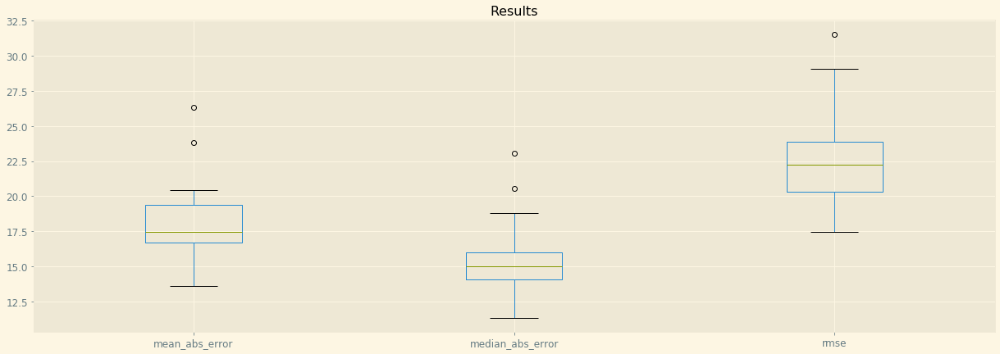

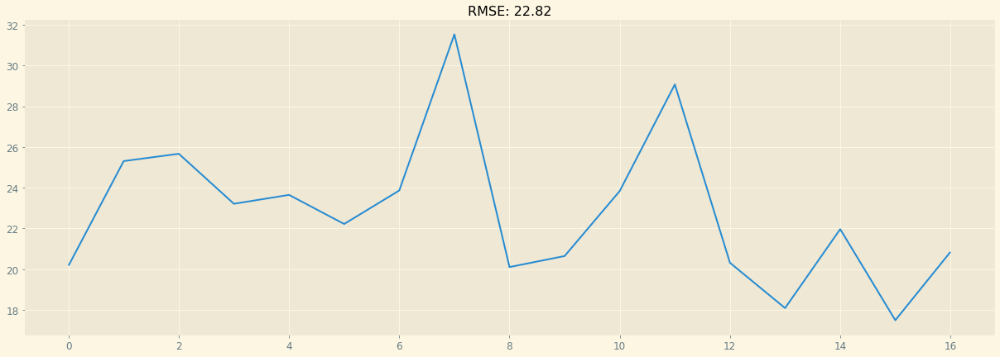

NameError: name 'plot_importance' is not defined

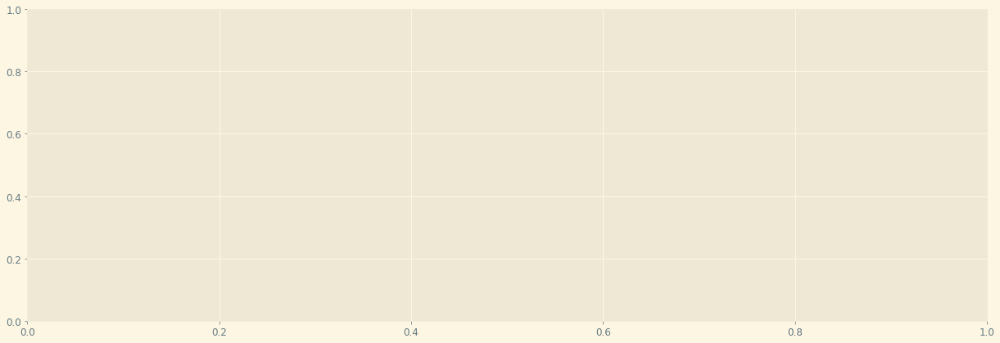

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_08 = pd.DataFrame(results_over_time)
predictions_over_time_08 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_08

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

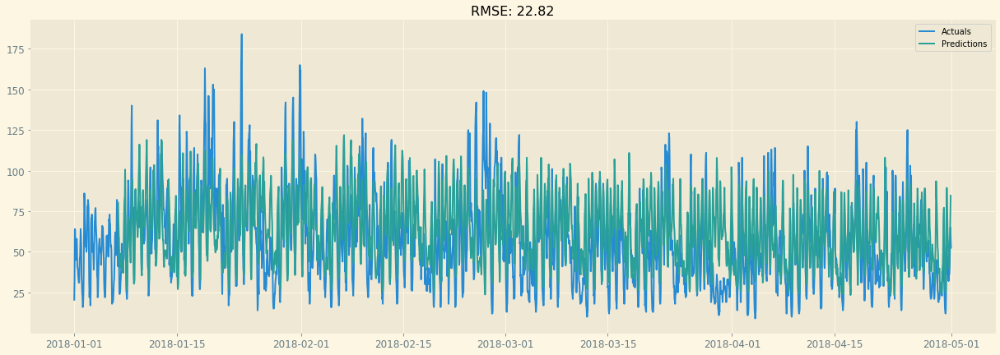

In [6]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

### Station nr 28079018  - San Isidro/Calle Farolillo

In [7]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079018

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079018

Missing values for particle and station of interest: 1.53%

One particle, one station DF shape: (54639, 9)


,NO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,80.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,59.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,61.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,62.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,55.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.313, BIC=3032.694, Time=0.572 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.059, BIC=3198.519, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.741, BIC=3126.931, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.856, BIC=3019.047, Time=0.403 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.059, BIC=3192.789, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.261, BIC=3027.912, Time=0.476 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.401, BIC=2530.335, Time=0.212 seconds
Total fit time: 1.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.014, BIC=2543.414, Time=1.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.207, BIC=2523.674, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.135, BIC=2529.335, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.140, BIC=2529.340, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3223.660, BIC=3227.393, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.176, BIC=2535.109, Time=0.105 seconds
Total fit time: 1.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.863, BIC=2658.244, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.873, BIC=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.664, BIC=2616.775, Time=0.626 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.169, BIC=2618.280, Time=0.717 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.443, BIC=2609.363, Time=0.348 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2590.262, BIC=2612.643, Time=0.498 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.717, BIC=2612.098, Time=0.585 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.518, BIC=2622.359, Time=1.341 seconds
Total fit time: 6.245 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.392, BIC=2608.811, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.885, BIC=2679.358, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.032, BIC=2624.241, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.414, BIC=3093.624, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3476.065, BIC=3479.801, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.072, BIC=3033.755, Time=0.436 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.170, BIC=3083.117, Time=0.246 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.935, BIC=3028.882, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.322, BIC=3034.005, Time=0.741 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.800, BIC=3043.746, Time=0.451 seconds
Total fit time: 3.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.489, BIC=3044.889, Time=0.664 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.576, BIC=3153.042, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.709, BIC=2987.842, Time=1.750 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.936, BIC=2967.869, Time=0.817 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.254, BIC=2979.654, Time=0.912 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.620, BIC=2977.020, Time=0.577 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.478, BIC=2624.161, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.991, BIC=2627.937, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.052, BIC=2620.998, Time=0.461 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2606.814, BIC=2629.233, Time=0.680 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.902, BIC=2626.585, Time=0.383 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.895, BIC=2624.578, Time=0.626 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2608.813, BIC=2634.969, Time=1.150 seconds
Total fit time: 5.925 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.907, BIC=2569.307, Time=1.300 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.574, BIC=2735.041, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.032, BIC=2665.821, Time=1.811 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.390, BIC=2763.692, Time=1.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.027, BIC=2888.461, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.673, BIC=2827.824, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.078, BIC=2749.229, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2879.027, BIC=2882.745, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.530, BIC=2748.398, Time=1.019 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.827, BIC=2556.938, Time=1.042 seconds
Total fit time: 5.402 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.215, BIC=2576.595, Time=0.551 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.890, BIC=2716.351, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.373, BIC=2587.564, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.394, BIC=2623.585, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.279, BIC=3007.009, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.220, BIC=2576.871, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.821, BIC=2577.471, Time=0.395 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.269, BIC=2567.380, Time=0.664 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.659, BIC=3099.592, Time=0.351 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.831, BIC=3101.498, Time=0.309 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3084.598, BIC=3106.999, Time=0.471 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.921, BIC=3104.588, Time=0.812 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.593, BIC=3103.260, Time=0.882 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3086.044, BIC=3112.177, Time=1.960 seconds
Total fit time: 6.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.614, BIC=2772.814, Time=0.559 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2961.934, BIC=2965.667, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.584, BIC=2776.518, Time=0.613 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.798, BIC=2781.464, Time=0.787 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.415, BIC=2782.081, Time=0.881 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.418, BIC=2776.352, Time=0.407 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.404, BIC=2782.071, Time=0.659 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.916, BIC=2785.316, Time=1.593 seconds
Total fit time: 10.046 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.851, BIC=2705.251, Time=0.912 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.672, BIC=2761.274, Time=0.747 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.646, BIC=2772.688, Time=1.178 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.053, BIC=2770.095, Time=1.610 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.637, BIC=2758.518, Time=0.622 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.387, BIC=2702.070, Time=0.953 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.767, BIC=2712.713, Time=0.455 seconds
Total fit time: 4.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.252, BIC=2656.691, Time=1.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.399, BIC=2746.878, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.785, BIC=2676.004, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.912, BIC=2705.131, Time=0.276 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.258, BIC=3034.998, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.936, BIC=2650.635, Time=0.470 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.163, BIC=2685.122, Time=0.517 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.853, BIC=3076.292, Time=1.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.953, BIC=3128.433, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.548, BIC=3109.767, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.202, BIC=3117.422, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3537.320, BIC=3541.060, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.517, BIC=3076.216, Time=0.552 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.633, BIC=3078.332, Time=0.681 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.849, BIC=3083.027, Time=1.279 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.967, BIC=3083.146, Time=1.101 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.189, BIC=3077.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.671, BIC=2791.881, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3099.622, BIC=3103.358, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.573, BIC=2791.256, Time=0.821 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.175, BIC=2791.858, Time=0.693 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.434, BIC=2796.590, Time=1.301 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.258, BIC=2797.414, Time=0.549 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.582, BIC=2787.529, Time=0.729 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.271, BIC=2791.690, Time=0.782 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.068, BIC=2792.488, Time=0.572 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2767.035, BIC=2796.927, Time=1.117 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.842, BIC=2682.492, Time=1.023 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.994, BIC=2687.105, Time=1.501 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.543, BIC=2690.654, Time=1.552 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.976, BIC=2676.896, Time=1.045 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.343, BIC=2749.552, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3067.496, BIC=3071.232, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.262, BIC=2715.944, Time=0.628 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.738, BIC=2716.421, Time=0.732 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.880, BIC=2715.036, Time=0.917 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2691.129, BIC=2717.285, Time=1.003 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.306, BIC=2711.253, Time=0.675 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.137, BIC=2711.557, Time=0.857 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.712, BIC=2713.132, Time=0.771 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.585, BIC=2719.477, Time=1.783 seconds
Total fit time: 9.3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.396, BIC=3155.615, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3528.673, BIC=3532.413, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.441, BIC=3086.140, Time=0.610 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.956, BIC=3124.915, Time=0.678 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.670, BIC=3080.629, Time=0.513 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.423, BIC=3086.122, Time=0.797 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.489, BIC=3087.448, Time=0.122 seconds
Total fit time: 3.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.411, BIC=3102.830, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.385, BIC=3221.858, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2916.188, BIC=2949.788, Time=1.970 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2917.525, BIC=2951.125, Time=1.912 seconds
Near non-invertible roots for order (2, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2923.021, BIC=2952.888, Time=1.425 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.097, BIC=2952.964, Time=1.587 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2917.505, BIC=2954.839, Time=2.241 seconds
Near non-invertible roots for order (3, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 16.434 seconds
Perfo

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.179, BIC=2603.579, Time=0.758 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.492, BIC=2775.959, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.934, BIC=2687.134, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.155, BIC=2590.355, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2766.501, BIC=2770.235, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.890, BIC=2595.824, Time=0.319 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.918, BIC=2595.852, Time=0.254 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.192, BIC=2597.858, Time=0.528 seconds
Total fit time: 2.232 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.268, BIC=2693.668, Time=1.086 seconds
F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.947, BIC=2716.532, Time=0.458 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.602, BIC=2715.471, Time=0.184 seconds
Total fit time: 3.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.972, BIC=2676.334, Time=0.646 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.307, BIC=2744.760, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.051, BIC=2687.231, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.053, BIC=2711.233, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3040.371, BIC=3044.098, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.493, BIC=2671.127, Time=0.501 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.782, BIC=2688.690, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.231, BIC=3014.387, Time=1.505 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.956, BIC=3023.376, Time=0.801 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3004.796, BIC=3034.689, Time=1.331 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3002.189, BIC=3028.345, Time=0.837 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.827, BIC=3004.456, Time=2.093 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.607, BIC=3055.026, Time=1.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.035, BIC=3094.508, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.418, BIC=3057.628, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.191, BIC=2928.858, Time=0.677 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.906, BIC=2928.573, Time=1.050 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.270, BIC=2937.404, Time=1.323 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.087, BIC=2941.220, Time=1.504 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.435, BIC=2689.855, Time=1.526 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.167, BIC=2689.586, Time=1.244 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.412, BIC=2694.305, Time=1.634 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 10.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.382, BIC=2642.782, Time=0.670 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.000, BIC=2780.467, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.521, BIC=2729.721, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.062, BIC=2640.262, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2771.004, BIC=2774.738, Ti

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2596.670, BIC=2626.537, Time=1.519 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.984 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.421, BIC=2632.841, Time=1.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.531, BIC=2635.005, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.995, BIC=2623.205, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.948, BIC=2624.158, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3127.067, BIC=3130.804, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.017, BIC=2628.700, Time=0.905 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.788, BIC=2629.734, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.558, BIC=2577.777, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.741, BIC=2866.481, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.516, BIC=2529.214, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.516, BIC=2529.215, Time=0.295 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.214, BIC=2532.393, Time=1.103 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.003, BIC=2527.442, Time=0.558 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2508.724, BIC=2527.423, Time=0.337 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.990, BIC=2533.169, Time=0.774 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.875, BIC=2529.834, Time=0.285 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2508.818, BIC=2531.257, Time=0.417 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.167, BIC=3061.376, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3228.433, BIC=3232.169, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.102, BIC=3064.784, Time=0.259 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.161, BIC=3067.108, Time=0.248 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.162, BIC=3067.109, Time=0.451 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.292, BIC=3068.711, Time=0.467 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3052.449, BIC=3071.132, Time=0.485 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.401, BIC=3071.084, Time=0.418 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.171, BIC=3074.327, Time=1.053 seconds
Total fit time: 4.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.955, BIC=2775.174, Time=0.280 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3079.726, BIC=3083.466, Time=0.015 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.944, BIC=2780.904, Time=0.350 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.413, BIC=2779.372, Time=1.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.924, BIC=2786.623, Time=0.201 seconds
Total fit time: 4.055 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.910, BIC=2730.348, Time=1.956 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.503, BIC=2712.983, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.847, BIC=2717.066, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.879, BIC=2717.099, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.846, BIC=2523.266, Time=0.881 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.720, BIC=2569.193, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2524.192, BIC=2535.402, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.007, BIC=2547.217, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.767, BIC=2889.504, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.288, BIC=2517.971, Time=0.558 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.653, BIC=2541.599, Time=0.468 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.689, BIC=2512.636, Time=0.508 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2499.367, BIC=2518.050, Time=0.550 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.402, BIC=2527.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.762, BIC=2711.181, Time=1.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.416, BIC=2939.889, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.428, BIC=2759.637, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.031, BIC=2844.240, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3149.652, BIC=3153.389, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.675, BIC=2734.358, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.790, BIC=2734.473, Time=0.417 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.790, BIC=2745.946, Time=1.046 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.019, BIC=2718.175, Time=1.987 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.134, BIC=2730.

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.186, BIC=3037.853, Time=0.387 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.886, BIC=3047.020, Time=1.080 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.008, BIC=3048.142, Time=1.664 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.242, BIC=3032.175, Time=1.012 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.761, BIC=2658.961, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3363.791, BIC=3367.524, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.274, BIC=2659.207, Time=0.325 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.014, BIC=2664.680, Time=0.169 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.205, BIC=2664.872, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.982, BIC=2660.915, Time=0.876 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.012, BIC=2670.412, Time=0.290 seconds
Total fit time: 2.750 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.144, BIC=2729.486, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.679, BIC=2722.126, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2591.087, BIC=2609.785, Time=0.490 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.972, BIC=2643.931, Time=0.386 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.349, BIC=2605.308, Time=0.337 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.416, BIC=2610.115, Time=0.488 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.998, BIC=2617.957, Time=0.241 seconds
Total fit time: 3.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.928, BIC=2592.367, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.367, BIC=2714.846, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.441, BIC=2607.661, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.133, BIC=2650.352, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.854, BIC=3059.274, Time=2.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.340, BIC=3225.813, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.656, BIC=3121.865, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.263, BIC=3062.473, Time=0.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.342, BIC=3220.079, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.181, BIC=3072.864, Time=0.378 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.878, BIC=3056.561, Time=0.749 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.834, BIC=3066.990, Time=1.262 seconds
Near non-inver

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3049.920, BIC=3053.656, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.999, BIC=2908.682, Time=0.795 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.407, BIC=2897.090, Time=0.705 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.308, BIC=2904.464, Time=1.024 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.246, BIC=2915.402, Time=1.273 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.143, BIC=2593.299, Time=1.615 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.613, BIC=2577.560, Time=0.589 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2554.332, BIC=2576.752, Time=1.747 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.132, BIC=2577.551, Time=1.168 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2559.863, BIC=2589.755, Time=1.900 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.393 seconds
Perfo

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.884, BIC=2809.713, Time=0.297 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.808, BIC=2809.636, Time=0.271 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.572, BIC=2814.108, Time=0.584 seconds
Total fit time: 1.968 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.734, BIC=2709.794, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.866, BIC=2725.219, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.251, BIC=2708.281, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.206, BIC=2711.236, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3102.878, BIC=3106.555, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.126, BIC=2706.510, Time=0.627 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.782, BIC=2734.982, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3136.190, BIC=3139.924, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.355, BIC=2642.021, Time=0.528 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.359, BIC=2642.026, Time=0.730 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.404, BIC=2641.538, Time=0.901 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.272, BIC=2638.672, Time=0.609 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.784, BIC=2646.650, Time=1.366 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2616.911, BIC=2646.778, Time=1.035 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2617.266, BIC=2643.399, Time=0.908 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.622, BIC=2625.756, Time=1.337 seconds
Fit ARIMA: (4, 0, 0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.326, BIC=3081.009, Time=0.975 seconds
Total fit time: 3.355 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.124, BIC=3016.543, Time=0.999 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.204, BIC=3198.678, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.647, BIC=3112.857, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.621, BIC=3006.830, Time=0.385 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.204, BIC=3192.941, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.265, BIC=3010.948, Time=0.715 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.407, BIC=3012.353, Time=0.366 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.033, BIC=2709.716, Time=0.386 seconds
Total fit time: 1.676 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.649, BIC=2642.069, Time=0.541 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.426, BIC=2809.899, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.752, BIC=2719.962, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.315, BIC=2627.524, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.426, BIC=2804.163, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.342, BIC=2632.289, Time=0.266 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.238, BIC=2632.184, Time=0.264 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.205, BIC=2637.888, Time=0.434 seconds
Total fit time: 1.763 seconds
Performing ste

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.416, BIC=2783.205, Time=1.698 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.961 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.402, BIC=2909.822, Time=1.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.569, BIC=2907.042, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.486, BIC=2911.696, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.707, BIC=2911.917, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3376.132, BIC=3379.869, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.884, BIC=2905.567, Time=0.689 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.453, BIC=2913.399, Ti

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.967, BIC=2739.196, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3074.911, BIC=3078.654, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.398, BIC=2663.113, Time=0.377 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.186, BIC=2707.158, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.655, BIC=2658.627, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.622, BIC=2663.337, Time=0.379 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.886, BIC=2667.858, Time=0.232 seconds
Total fit time: 2.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.407, BIC=2681.865, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.442, BIC=2882.929, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.612, BIC=3113.831, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3264.385, BIC=3268.125, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.611, BIC=3125.310, Time=0.326 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.536, BIC=3118.235, Time=0.484 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.056, BIC=3129.234, Time=1.041 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3107.485, BIC=3133.663, Time=1.365 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.004, BIC=3117.963, Time=0.326 secon

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.725, BIC=2635.424, Time=0.657 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.149, BIC=2635.847, Time=0.786 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.543, BIC=2644.722, Time=0.565 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2619.381, BIC=2645.560, Time=1.044 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.572, BIC=2632.531, Time=0.606 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2617.583, BIC=2640.021, Time=0.425 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.767, BIC=2639.205, Time=0.729 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.818, BIC=2641.736, Time=1.838 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.499, BIC=2647.157, Time=1.915 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2619.019, BIC=2652.677, Time=2.256 seconds
Fit ARIMA: (2, 0, 4)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.492, BIC=2789.872, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.686, BIC=2951.146, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.270, BIC=2869.460, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.274, BIC=2779.464, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2941.687, BIC=2945.417, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.039, BIC=2784.690, Time=0.316 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.155, BIC=2785.075, Time=0.394 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.144, BIC=2785.065, Time=0.374 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2767.643, BIC=2790.024, Time=0.728 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.499, BIC=2790.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.968, BIC=2675.667, Time=0.433 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.342, BIC=2710.301, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.211, BIC=2670.170, Time=0.625 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.033, BIC=2675.732, Time=0.672 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.799, BIC=2683.758, Time=0.344 seconds
Total fit time: 3.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.600, BIC=2650.038, Time=1.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.280, BIC=2781.760, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.059, BIC=2687.278, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.322, BIC=2726.541, Time=0.285 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.383, BIC=3107.593, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3263.990, BIC=3267.726, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.215, BIC=3113.162, Time=0.313 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.241, BIC=3113.187, Time=0.191 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.780, BIC=3118.463, Time=0.467 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 1.722 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.531, BIC=3088.951, Time=1.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.239, BIC=3258.712, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.367, BIC=3159.577, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.204, BIC=2838.360, Time=0.865 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2808.882, BIC=2835.038, Time=1.719 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.702, BIC=2824.648, Time=0.849 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.608, BIC=2836.027, Time=0.740 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.449, BIC=2709.605, Time=1.675 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.444, BIC=2697.391, Time=0.511 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.977, BIC=2708.396, Time=0.734 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.035, BIC=2703.454, Time=1.007 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.623, BIC=2708.516, Time=1.170 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 9.060 seconds
Perfor

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.392, BIC=2652.351, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.349, BIC=2658.048, Time=0.465 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.950, BIC=2658.909, Time=0.319 seconds
Total fit time: 2.911 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.201, BIC=2678.621, Time=0.641 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.107, BIC=2791.581, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.774, BIC=2688.984, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.655, BIC=2731.865, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3058.881, BIC=3062.617, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.346, BIC=2673.029, Time=0.507 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.831, BIC=3085.250, Time=0.565 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.415, BIC=3223.888, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.694, BIC=3178.904, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.003, BIC=3077.212, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3214.416, BIC=3218.152, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.282, BIC=3083.965, Time=0.464 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.882, BIC=3079.565, Time=0.468 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.088, BIC=3077.035, Time=0.594 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=31

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.315, BIC=2901.735, Time=0.764 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.840, BIC=3053.314, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.157, BIC=2992.367, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.132, BIC=2893.342, Time=0.518 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3043.841, BIC=3047.577, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.520, BIC=2899.203, Time=0.871 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.173, BIC=2651.592, Time=0.599 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.804, BIC=2650.223, Time=1.042 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2630.073, BIC=2659.966, Time=1.514 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.993, BIC=2652.412, Time=0.674 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.1

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.111, BIC=2668.810, Time=0.999 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.528, BIC=2673.487, Time=0.417 seconds
Total fit time: 5.257 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.696, BIC=2678.134, Time=0.830 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.293, BIC=2714.773, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.460, BIC=2681.680, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.931, BIC=2692.151, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3087.659, BIC=3091.399, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.741, BIC=2673.440, Time=0.613 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.916, BIC=2687.876, Time=0.308 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.308, BIC=2591.267, Time=0.246 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2560.618, BIC=2583.056, Time=0.444 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.763, BIC=2591.682, Time=0.787 seconds
Total fit time: 6.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.104, BIC=2742.562, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.508, BIC=2921.994, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.387, BIC=2764.616, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.929, BIC=2830.158, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.029, BIC=3154.772, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.505, BIC=2737.220, Time=0.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.872, BIC=3084.050, Time=0.895 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.427, BIC=3076.386, Time=0.739 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.256, BIC=3079.695, Time=0.653 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.782, BIC=3080.221, Time=0.451 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.820, BIC=2670.049, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.222, BIC=3034.965, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.632, BIC=2671.604, Time=0.704 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.449, BIC=2677.164, Time=0.820 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.404, BIC=2677.119, Time=0.678 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.681, BIC=2675.653, Time=0.202 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.362, BIC=2675.334, Time=0.072 seconds
Total fit time: 3.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.897, BIC=2635.355, Time=0.910 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.000, BIC=2621.486, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.417, BIC=2510.377, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2463.463, BIC=2478.423, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2465.432, BIC=2484.131, Time=0.493 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2478.411, BIC=2493.370, Time=0.265 seconds
Total fit time: 3.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2389.362, BIC=2411.801, Time=0.955 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.485, BIC=2534.964, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2450.929, BIC=2462.148, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2481.765, BIC=2492.985, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2830.684, BIC=2834.424, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.092, BIC=2920.530, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.099, BIC=3085.578, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.355, BIC=2932.574, Time=0.176 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.459, BIC=2996.679, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3313.771, BIC=3317.511, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.240, BIC=2914.939, Time=0.331 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.936, BIC=2966.895, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.244, BIC=2909.203, Time=0.223 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.241, BIC=2914.940, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.086, BIC=2917.

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3029.411, BIC=3059.304, Time=1.392 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.474, BIC=2968.913, Time=0.751 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.248, BIC=2947.728, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.204, BIC=2952.423, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.252, BIC=2952.471, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.918, BIC=3314.658, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.178, BIC=2958.138, Time=0.183 seconds
Total fit time: 1.178 seconds
Performing stepwise search to minimize aic
Fit ARIMA

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.252, BIC=2731.886, Time=0.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.502, BIC=2726.409, Time=0.405 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.091, BIC=2737.452, Time=0.302 seconds
Total fit time: 1.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.574, BIC=2792.876, Time=0.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.599, BIC=2788.033, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.148, BIC=2785.299, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.100, BIC=2787.251, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.870, BIC=3273.587, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.622, BIC=2787.207, Time=0.422 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.729, BIC=2667.168, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2844.296, BIC=2851.776, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.880, BIC=2688.099, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.082, BIC=2767.302, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3127.052, BIC=3130.792, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.853, BIC=2662.552, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.207, BIC=2717.166, Time=0.421 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.870, BIC=2659.829, Time=0.198 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.746, BIC=2668.185, Time=0.416 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.294, BIC=2702.993, Time=0.377 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3044.873, BIC=3067.311, Time=3.842 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.499, BIC=3067.938, Time=0.589 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.269, BIC=3089.188, Time=1.479 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 13.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.778, BIC=3074.217, Time=0.561 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.334, BIC=2910.773, Time=0.860 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.864, BIC=2920.782, Time=1.284 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.771 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.458, BIC=2858.916, Time=0.668 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.906, BIC=2853.392, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.092, BIC=2854.321, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.356, BIC=2855.585, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.105, BIC=2641.283, Time=1.000 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2615.569, BIC=2641.747, Time=1.102 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.035, BIC=2624.994, Time=0.521 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.838, BIC=2636.277, Time=1.069 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.286, BIC=2715.838, Time=0.432 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.826, BIC=2734.668, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.616, BIC=2710.458, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.396, BIC=2715.948, Time=0.521 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.424, BIC=2720.265, Time=0.137 seconds
Total fit time: 2.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.809, BIC=2665.111, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.925, BIC=2720.359, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.367, BIC=2672.518, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.849, BIC=2688.000, Time=0.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.450, BIC=2907.679, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.807, BIC=3310.550, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.215, BIC=2788.930, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.042, BIC=2868.014, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.383, BIC=2783.355, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.288, BIC=2789.003, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.972, BIC=2791.944, Time=0.197 seconds
Total fit time: 2.018 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.277, BIC=3015.735, Time=0.800 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.763, BIC=3180.249, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.092, BIC=3023.051, Time=0.800 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.514, BIC=3026.952, Time=1.816 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.887, BIC=3029.326, Time=0.734 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.723, BIC=3034.642, Time=1.405 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 16.494 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.702, BIC=2597.921, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2786.072, BIC=2789.812, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.013, BIC=2602.973, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.057, BIC=2603.016, Time=0.165 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.744, BIC=2608.443, Time=0.355 seconds
Total fit time: 1.383 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.304, BIC=2632.762, Time=0.528 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.184, BIC=2839.670, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.449, BIC=2731.678, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.094, BIC=2618.323, Time=0.191 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.838, BIC=2904.218, Time=0.759 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.995, BIC=2904.455, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.980, BIC=2904.170, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.126, BIC=2905.316, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3287.348, BIC=3291.078, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.440, BIC=2896.090, Time=0.739 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.169, BIC=2908.089, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.827, BIC=2892.748, Time=0.530 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.346, BIC=2898.727, Time=0.614 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.185, BIC=2908.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.064, BIC=2708.795, Time=0.269 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.176, BIC=2709.907, Time=0.316 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.616, BIC=2703.839, Time=1.024 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.179, BIC=2700.402, Time=1.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.542, BIC=2706.526, Time=0.188 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.223, BIC=2705.700, Time=0.499 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.739, BIC=2714.216, Time=0.601 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.197, BIC=2705.167, Time=1.273 seconds
Total fit time: 6.173 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.035, BIC=2800.513, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.039, BIC=3092.011, Time=0.408 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.084, BIC=3092.056, Time=0.277 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.808, BIC=3096.523, Time=0.520 seconds
Total fit time: 2.836 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.656, BIC=3027.114, Time=0.558 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3199.948, BIC=3207.434, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.791, BIC=3099.020, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.934, BIC=3010.163, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3197.948, BIC=3201.691, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.856, BIC=3015.828, Time=0.265 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.880, BIC=2617.319, Time=0.662 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.792, BIC=2804.272, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.460, BIC=2735.679, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.462, BIC=2605.681, Time=0.470 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2794.792, BIC=2798.532, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.664, BIC=2612.363, Time=0.856 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.797, BIC=2901.197, Time=1.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.713, BIC=3029.180, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.297, BIC=2954.497, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.384, BIC=2886.584, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.713, BIC=3023.447, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.378, BIC=2892.311, Time=0.202 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.378, BIC=2892.311, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.810, BIC=2895.477, Time=0.748 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2713.398, BIC=2743.367, Time=1.096 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2711.452, BIC=2737.676, Time=0.707 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.414, BIC=2720.638, Time=1.348 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2698.047, BIC=2731.763, Time=1.719 seconds
Total fit time: 12.390 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.554, BIC=2825.032, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.202, BIC=3048.695, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.626, BIC=2854.864, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.747, BIC=2953.986, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3322.427, BIC=3326.173, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3078.079, BIC=3107.997, Time=1.353 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.948 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.585, BIC=3008.024, Time=0.847 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.604, BIC=3191.084, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.989, BIC=3091.208, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.270, BIC=2998.490, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.604, BIC=3185.344, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.380, BIC=3009.079, Time=0.600 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.156, BIC=3006.855, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=461697114681265422336.000, BIC=461697114681265422336.000, Time=1.077 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.582, BIC=2762.021, Time=1.206 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.325, BIC=2773.244, Time=1.614 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 11.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.048, BIC=2672.487, Time=1.014 seconds
Fit ARIMA: (0, 1, 0)x(0, 0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.394, BIC=2881.594, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.899, BIC=3021.633, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.182, BIC=2887.116, Time=0.211 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.214, BIC=2887.147, Time=0.231 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.499, BIC=2891.166, Time=0.496 seconds
Total fit time: 1.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.632, BIC=2833.012, Time=0.682 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.884, BIC=2870.345, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.457, BIC=2849.647, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.887, BIC=2859.077, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.406, BIC=2800.121, Time=0.584 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.624, BIC=2804.825, Time=1.470 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.626, BIC=2804.827, Time=1.578 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.670, BIC=2796.642, Time=0.603 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2781.904, BIC=2804.362, Time=0.895 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.211, BIC=2804.669, Time=1.555 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2780.619, BIC=2810.563, Time=1.697 seconds
Total fit time: 10.095 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.056, BIC=2978.514, Time=0.887 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.755, BIC=3151.241, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.994, BIC=3007.213, Time=0.361 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3173.500, BIC=3177.239, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.442, BIC=3017.141, Time=0.396 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.432, BIC=3016.131, Time=0.775 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.241, BIC=3026.420, Time=1.290 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.386, BIC=2856.101, Time=0.884 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.459, BIC=2856.174, Time=0.257 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.118, BIC=2860.319, Time=1.355 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2833.447, BIC=2859.648, Time=1.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.470, BIC=2850.442, Time=0.332 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.567, BIC=2857.025, Time=1.378 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.548, BIC=2859.006, Time=0.649 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.302, BIC=2866.246, Time=1.790 seconds
Total fit time: 9.577 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.190, BIC=2773.648, Time=0.843 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2641.707, BIC=2671.625, Time=1.260 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.352 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.307, BIC=2648.746, Time=0.747 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.029, BIC=2790.509, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.616, BIC=2734.836, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.457, BIC=2639.676, Time=0.351 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2781.047, BIC=2784.787, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.760, BIC=2587.475, Time=0.513 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.750, BIC=2604.722, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.823, BIC=2581.795, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.765, BIC=2587.480, Time=0.493 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.230, BIC=2593.202, Time=0.177 seconds
Total fit time: 2.660 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.244, BIC=2562.721, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.866, BIC=2616.358, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.135, BIC=2574.374, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.519, BIC=2589.758, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.238, BIC=3002.969, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.326, BIC=3003.057, Time=0.397 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.927, BIC=3004.150, Time=0.574 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.730, BIC=3003.207, Time=0.412 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.215, BIC=3009.184, Time=0.889 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2979.202, BIC=3009.172, Time=1.049 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.380, BIC=3003.603, Time=0.699 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2981.498, BIC=3003.975, Time=0.653 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2979.191, BIC=3009.161, Time=1.191 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2981.781, BIC=3008.005, Time=0.652 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.782, BIC=2954.497, Time=0.513 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.043, BIC=2963.244, Time=0.665 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.215, BIC=2956.416, Time=1.194 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.053, BIC=2949.025, Time=0.524 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2573.613, BIC=2592.344, Time=0.208 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.850, BIC=2587.581, Time=1.459 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.813, BIC=2598.036, Time=1.347 seconds
Total fit time: 6.913 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.714, BIC=2561.172, Time=0.832 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.265, BIC=2571.751, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2556.574, BIC=2567.803, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.808, BIC=2570.037, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3006.672, BIC=3010.415, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.090, BIC=2554.805, Time=0.587 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2452.460, BIC=2474.918, Time=0.512 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.609, BIC=2477.068, Time=0.512 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2435.006, BIC=2464.950, Time=0.978 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.778 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2446.605, BIC=2469.063, Time=1.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.024, BIC=2608.510, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.109, BIC=2534.338, Time=0.146 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.489, BIC=2566.718, Time=0.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2831.164, BIC=2834.907, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.011, BIC=3054.431, Time=0.701 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.584, BIC=3212.057, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3130.195, BIC=3141.405, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.467, BIC=3042.676, Time=0.300 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3202.584, BIC=3206.320, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.695, BIC=3049.378, Time=0.522 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.431, BIC=2732.660, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3025.805, BIC=3029.548, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.283, BIC=2738.256, Time=0.063 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.333, BIC=2738.305, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.281, BIC=2743.996, Time=0.184 seconds
Total fit time: 1.423 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.118, BIC=2654.576, Time=0.788 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.960, BIC=2636.446, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.724, BIC=2639.953, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.891, BIC=2640.120, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.343, BIC=2771.977, Time=0.619 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.577, BIC=2782.484, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.625, BIC=2767.533, Time=0.329 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.702, BIC=2772.336, Time=0.465 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.470, BIC=2779.377, Time=0.231 seconds
Total fit time: 3.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.267, BIC=2692.648, Time=0.647 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.999, BIC=2715.459, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.190, BIC=2703.381, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.969, BIC=2708.160, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.678, BIC=3091.917, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3455.482, BIC=3459.229, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.984, BIC=2991.715, Time=0.519 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.561, BIC=2993.292, Time=0.570 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.629, BIC=2996.852, Time=1.067 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.465, BIC=2998.688, Time=1.056 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.875, BIC=2990.860, Time=0.312 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.961, BIC=2995.438, Time=0.575 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.652, BIC=2991.129, Time=0.679 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.314, BIC=3002.284, Time=1.201 seconds
Total fit time: 7.5

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.423, BIC=2997.652, Time=0.495 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3135.210, BIC=3138.953, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.733, BIC=3006.448, Time=0.689 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.186, BIC=2997.901, Time=1.025 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.375, BIC=3007.576, Time=1.009 seconds
Near non-invertible roots for order

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.991, BIC=2705.963, Time=0.543 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.799, BIC=2701.771, Time=0.744 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.110, BIC=2706.825, Time=0.733 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.891, BIC=2702.863, Time=0.191 seconds
Total fit time: 4.445 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.150, BIC=2656.627, Time=0.935 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.484, BIC=2655.976, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.971, BIC=2654.210, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.738, BIC=2655.977, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.680, BIC=3021.427, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.665, BIC=2670.598, Time=0.890 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.049, BIC=2681.449, Time=1.418 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.266, BIC=2681.666, Time=1.372 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.977, BIC=2689.844, Time=1.920 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.861, BIC=2582.560, Time=0.392 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.821, BIC=2584.520, Time=0.571 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.265, BIC=2585.443, Time=0.953 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.910, BIC=2581.348, Time=0.928 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2556.910, BIC=2575.609, Time=0.489 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.785, BIC=2588.744, Time=0.283 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.908, BIC=2581.347, Time=0.434 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.909, BIC=2587.087, Time=0.543 seconds
Total fit time: 5.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.060, BIC=2602.499, Time=0.800 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.835, BIC=3135.293, Time=0.496 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.906, BIC=3292.392, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.523, BIC=3214.752, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.444, BIC=3123.673, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3282.906, BIC=3286.649, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.963, BIC=3126.935, Time=0.648 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.430, BIC=3127.402, Time=0.594 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.179, BIC=2870.408, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.469, BIC=3069.212, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.436, BIC=2877.151, Time=0.570 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.034, BIC=2879.749, Time=0.437 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.705, BIC=2884.906, Time=0.790 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.705, BIC=2884.906, Time=0.860 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.183, BIC=2875.155, Time=0.308 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.107, BIC=2879.565, Time=0.380 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.767, BIC=2709.205, Time=1.424 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.016, BIC=2709.455, Time=1.016 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2681.569, BIC=2711.487, Time=1.712 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.709 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.564, BIC=2792.944, Time=0.809 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.600, BIC=2785.058, Time=0.793 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.547, BIC=2789.491, Time=1.161 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.443, BIC=2786.644, Time=0.720 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.199, BIC=2794.886, Time=1.483 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.068, BIC=2793.755, Time=1.435 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.599, BIC=2794.543, Time=1.362 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.781, BIC=2790.725, Time=0.545 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.408, BIC=2799.838, Time=1.867 seconds
Total fit time: 13.004 seconds
Performing stepwise search 

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.479, BIC=3002.475, Time=1.528 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.343 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.412, BIC=3053.908, Time=1.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.307, BIC=3202.805, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.103, BIC=3122.351, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.498, BIC=3154.746, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3543.134, BIC=3546.884, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.935, BIC=3076.682, Time=0.479 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.870, BIC=3078.617, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.651, BIC=2898.109, Time=0.533 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.470, BIC=3068.956, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.766, BIC=2985.995, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.447, BIC=2882.676, Time=0.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.470, BIC=3063.213, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.286, BIC=2888.258, Time=0.314 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.293, BIC=2888.265, Time=0.276 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.722, BIC=2892.437, Time=0.480 seconds
Total fit time: 1.902 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.964, BIC=2817.441, Time=0.905 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.341, BIC=2709.780, Time=1.533 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.914, BIC=2891.393, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.544, BIC=2809.763, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.059, BIC=2695.279, Time=0.330 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2881.914, BIC=2885.654, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.421, BIC=2704.120, Time=1.075 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.797, BIC=2805.236, Time=1.095 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.463, BIC=2814.381, Time=1.746 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.520, BIC=2813.438, Time=1.576 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.621, BIC=2810.799, Time=1.195 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.186, BIC=2810.365, Time=0.998 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.632, BIC=2820.290, Time=1.973 seconds
Total fit time: 13.397 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.921, BIC=2728.398, Time=1.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.351, BIC=2803.843, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.574, BIC=2762.812, Time=0.314 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2795.074, BIC=2832.568, Time=2.062 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 18.575 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.557, BIC=3039.054, Time=0.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.025, BIC=3205.524, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.639, BIC=3060.888, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.010, BIC=3127.258, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3487.187, BIC=3490.936, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.507, BIC=3035.254, Time=0.510 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.267, BIC=3088.264, Ti

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.191, BIC=3018.649, Time=1.592 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.393, BIC=3030.337, Time=2.270 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 12.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.651, BIC=2977.109, Time=0.730 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.421, BIC=3160.907, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.598, BIC=3064.827, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.017, BIC=2963.246, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.383, BIC=2678.098, Time=0.881 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.369, BIC=2689.570, Time=1.155 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.825, BIC=2688.026, Time=3.330 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.422, BIC=2676.394, Time=0.632 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.600, BIC=2837.533, Time=0.553 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.055, BIC=2847.455, Time=0.708 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.933, BIC=2847.333, Time=0.835 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.438, BIC=2849.304, Time=1.517 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.587, BIC=2854.187, Time=1.858 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2819.820, BIC=2853.421, Time=2.007 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.216, BIC=2854.083, Time=1.379 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.771, BIC=2854.638, Time=1.915 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2829.062, BIC=2866.396, Time=2.317 seconds
Total fit time: 17.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.703, BIC=2986.688, Time=0.387 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2967.943, BIC=2990.421, Time=0.512 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.547, BIC=3016.278, Time=0.586 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.477, BIC=2988.208, Time=0.583 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2969.709, BIC=2995.932, Time=0.905 seconds
Total fit time: 4.799 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.587, BIC=3054.064, Time=1.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.497, BIC=3167.990, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.497, BIC=3064.735, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.004, BIC=3091.243, Time=0.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.769, BIC=3021.741, Time=0.668 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.510, BIC=3031.968, Time=1.255 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.727, BIC=3030.185, Time=1.258 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.951, BIC=3039.895, Time=1.903 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.079, BIC=2772.318, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3111.191, BIC=3114.937, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.384, BIC=2775.369, Time=0.462 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.984, BIC=2780.715, Time=0.812 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.091, BIC=2780.822, Time=1.005 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.218, BIC=2777.203, Time=0.374 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.572, BIC=2778.557, Time=0.088 seconds
Total fit time: 4.309 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.393, BIC=2716.870, Time=0.917 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.647, BIC=2717.140, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.970, BIC=2654.686, Time=1.884 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.660, BIC=2664.861, Time=1.439 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.711, BIC=2662.912, Time=1.772 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2633.970, BIC=2648.943, Time=0.841 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.232, BIC=2561.230, Time=0.460 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.180, BIC=2566.927, Time=0.481 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.369, BIC=2573.366, Time=0.275 seconds
Total fit time: 3.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.684, BIC=2535.180, Time=0.759 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.945, BIC=2619.444, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.619, BIC=2543.867, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.191, BIC=2568.440, Time=0.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2881.217, BIC=2884.966, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.796, BIC=2532.543, Time=0.410 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.828, BIC=3031.324, Time=0.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3074.557, BIC=3082.055, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.319, BIC=3057.568, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.681, BIC=3063.930, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3470.246, BIC=3473.996, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.442, BIC=3041.189, Time=0.610 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.521, BIC=3041.268, Time=0.821 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.829, BIC=3032.075, Time=1.050 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.524, BIC=3042.020, Time=0.996 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.770, BIC=3037.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.866, BIC=2855.863, Time=0.392 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.946, BIC=2855.943, Time=0.242 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.038, BIC=2861.785, Time=0.231 seconds
Total fit time: 2.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.405, BIC=2817.902, Time=1.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.757, BIC=2799.256, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.116, BIC=2802.364, Time=0.138 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.089, BIC=2802.337, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3109.176, BIC=3112.925, Time=0.012 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.119, BIC=2808.117, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.649, BIC=2571.888, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2951.089, BIC=2954.836, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.890, BIC=2546.621, Time=0.441 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.476, BIC=2566.461, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.210, BIC=2541.195, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.943, BIC=2546.674, Time=0.487 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.540, BIC=2556.525, Time=0.164 seconds
Total fit time: 2.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.787, BIC=2546.264, Time=0.794 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.208, BIC=2592.700, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.802, BIC=2572.787, Time=0.281 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2557.160, BIC=2579.637, Time=0.518 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.598, BIC=2582.075, Time=0.845 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.751, BIC=2561.721, Time=2.204 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 9.464 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.888, BIC=2739.365, Time=1.261 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.920, BIC=2969.412, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.015, BIC=2788.254, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.983, BIC=2872.221, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.529, BIC=3055.758, Time=0.526 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3229.645, BIC=3233.388, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.565, BIC=3064.281, Time=0.425 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.048, BIC=3065.763, Time=0.423 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.479, BIC=3074.680, Time=1.026 seconds
Near non-invertible roots for order

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.693, BIC=2567.932, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.261, BIC=3272.007, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.755, BIC=2573.739, Time=0.131 seconds
Total fit time: 1.861 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.278, BIC=2697.717, Time=1.387 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.806, BIC=2857.285, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.533, BIC=2767.752, Time=0.123 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.296, BIC=2683.515, Time=0.446 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2847.836, BIC=2851.576, Ti

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2691.852, BIC=2710.519, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.958, BIC=2695.625, Time=0.813 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.770, BIC=2704.903, Time=1.185 seconds
Total fit time: 5.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.957, BIC=2646.415, Time=1.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.529, BIC=2709.015, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.713, BIC=2668.942, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.426, BIC=2682.655, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3030.492, BIC=3034.235, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.603, BIC=2644.318, Time=0.361 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2981.754, BIC=3008.000, Time=0.908 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2981.198, BIC=3011.193, Time=1.358 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.574, BIC=3005.820, Time=1.229 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.580, BIC=3000.077, Time=0.797 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.258, BIC=3003.005, Time=0.485 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.782, BIC=2995.529, Time=0.409 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.067, BIC=3011.065, Time=0.284 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.767, BIC=3000.263, Time=0.581 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.577, BIC=3005.823, Time=1.031 seconds
Total fit time: 10.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.501, BIC=3006.739, Time=0.411 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3144.611, BIC=3148.357, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.887, BIC=3015.618, Time=0.807 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.272, BIC=3007.003, Time=0.481 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.564, BIC=3016.787, Time=1.183 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.539, BIC=2780.537, Time=0.326 seconds
Total fit time: 4.729 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.254, BIC=2719.731, Time=0.854 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.001, BIC=2716.494, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.387, BIC=2713.626, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.567, BIC=2715.805, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3048.739, BIC=3052.485, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.043, BIC=2714.774, Time=0.581 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.916, BIC=2713.901, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.701, BIC=2709.686, Time=0.423 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.854, BIC=2683.536, Time=1.253 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.129, BIC=2693.285, Time=1.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.312, BIC=2693.468, Time=1.660 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.254, BIC=2678.200, Time=1.109 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.049, BIC=2643.764, Time=0.682 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.881, BIC=2624.596, Time=0.733 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.076, BIC=2633.277, Time=2.701 seconds
Total fit time: 7.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.235, BIC=2593.693, Time=2.815 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.849, BIC=2713.335, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.467, BIC=2595.696, Time=0.225 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.489, BIC=2627.718, Time=0.552 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3023.666, BIC=3027.409, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.605, BIC=2590.320, Time=0.559 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.463, BIC=3111.940, Time=1.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.785, BIC=3226.277, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.582, BIC=3152.821, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.197, BIC=3095.436, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.785, BIC=3220.531, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.182, BIC=3101.167, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.181, BIC=3101.166, Time=0.324 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.820, BIC=3104.551, Time=0.823 seconds
Total fit time: 3.091 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.058, BIC=3144.535, Time=0.742 seconds
F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.728, BIC=2979.698, Time=2.205 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.527 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.198, BIC=2887.675, Time=0.958 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.346, BIC=3083.838, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.974, BIC=2986.213, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.486, BIC=2878.724, Time=0.228 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3074.346, BIC=3078.092, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.930, BIC=2885.661, Time=0.702 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.030, BIC=2718.231, Time=1.070 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.244, BIC=2714.445, Time=1.580 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.566, BIC=2708.538, Time=0.964 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2694.323, BIC=2716.781, Time=1.484 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.391, BIC=2789.122, Time=0.481 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.407, BIC=2789.138, Time=0.575 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.250, BIC=2794.474, Time=1.681 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.781, BIC=2793.258, Time=0.828 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.003, BIC=2797.973, Time=1.125 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.674, BIC=2794.897, Time=0.841 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.776, BIC=2803.491, Time=1.285 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2766.462, BIC=2800.178, Time=1.688 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.062, BIC=2805.031, Time=2.529 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.747, BIC=3132.005, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3495.901, BIC=3499.653, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.382, BIC=3026.145, Time=0.543 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.759, BIC=3027.522, Time=0.489 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.173, BIC=3011.441, Time=1.475 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.115, BIC=3011.383, Time=1.493 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.516, BIC=3024.526, Time=0.289 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.714, BIC=3026.230, Time=0.670 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.570, BIC=3030.086, Time=0.718 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.418, BIC=3017.438, Time=1.638 seconds
Near non-invertible

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.330, BIC=2837.807, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.647, BIC=2993.139, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.662, BIC=2906.901, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.554, BIC=2822.792, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2983.647, BIC=2987.393, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.080, BIC=2827.065, Time=0.377 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.334, BIC=2827.318, Time=0.404 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.870, BIC=2832.601, Time=0.430 seconds
Total fit time: 2.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.634, BIC=2719.111, Time=0.575 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.748, BIC=2705.977, Time=0.565 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.770, BIC=2896.513, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.346, BIC=2715.061, Time=1.444 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.379, BIC=2717.094, Time=0.953 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.871, BIC=2722.072, Time=3.357 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.847, BIC=2822.562, Time=0.682 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.064, BIC=2827.265, Time=1.344 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.086, BIC=2822.544, Time=0.753 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.578, BIC=2820.293, Time=0.488 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.731, BIC=2827.932, Time=0.964 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.551, BIC=2833.523, Time=0.187 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.830, BIC=2822.288, Time=0.553 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.704, BIC=2827.905, Time=0.594 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.704, BIC=2833.648, Time=0.874 seconds
Total fit time: 8.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.746, BIC=3050.262, Time=0.738 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.467, BIC=3214.972, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.597, BIC=3069.855, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.916, BIC=3136.173, Time=0.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3497.487, BIC=3501.240, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.874, BIC=3045.637, Time=0.519 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.883, BIC=3097.894, Time=0.652 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.010, BIC=3040.021, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.878, BIC=3045.641, Time=0.590 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.313, BIC=3047.

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.729, BIC=3039.699, Time=1.832 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 9.793 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.520, BIC=2985.997, Time=0.635 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.678, BIC=3170.170, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.644, BIC=3073.883, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.120, BIC=2972.358, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3160.685, BIC=3164.431, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.060, BIC=2976.044, Time=0.250 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.548, BIC=2980.279, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.093, BIC=2697.316, Time=0.957 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.309, BIC=2695.532, Time=1.434 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.067, BIC=2684.052, Time=0.661 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.115, BIC=2693.592, Time=1.324 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.222, BIC=2794.412, Time=0.349 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3120.486, BIC=3124.216, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.188, BIC=2763.838, Time=0.717 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.393, BIC=2781.313, Time=0.407 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.946, BIC=2758.867, Time=0.441 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.183, BIC=2763.834, Time=0.600 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.072, BIC=2765.993, Time=0.164 seconds
Total fit time: 3.651 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.710, BIC=2719.148, Time=0.757 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.976, BIC=2785.456, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.075, BIC=3063.321, Time=1.302 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.812, BIC=3061.308, Time=0.655 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.391, BIC=3072.386, Time=1.128 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3044.226, BIC=3074.221, Time=1.263 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.047, BIC=3040.293, Time=1.340 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.217, BIC=3060.714, Time=0.756 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3041.677, BIC=3071.673, Time=1.619 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3039.167, BIC=3065.413, Time=0.704 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=300

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.450, BIC=2970.927, Time=1.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3123.401, BIC=3130.893, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.033, BIC=3068.272, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.545, BIC=2959.783, Time=0.756 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3121.404, BIC=3125.150, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.681, BIC=2967.412, Time=1.920 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.267, BIC=2967.998, Time=0.723 secon

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.252, BIC=2718.500, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.514, BIC=3079.264, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.241, BIC=2729.988, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.116, BIC=2730.863, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.211, BIC=2730.457, Time=1.283 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.111, BIC=2730.357, Time=1.340 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.251, BIC=2725.249, Time=0.127 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2703.577, BIC=2726.073, Time=1.135 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.948, BIC=2727.444, Time=0.897 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.193, BIC=2736.188, Time=1.652 seconds
Total fit time: 8.0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.960, BIC=2667.437, Time=1.558 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.323, BIC=2664.800, Time=1.416 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2640.130, BIC=2670.099, Time=1.929 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.921, BIC=2672.417, Time=1.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.088, BIC=2548.356, Time=1.168 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.095, BIC=2548.363, Time=0.859 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.928, BIC=2534.938, Time=0.395 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.241, BIC=2568.251, Time=0.275 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.923, BIC=2543.934, Time=0.279 seconds
Total fit time: 5.169 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.719, BIC=2571.235, Time=0.762 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.656, BIC=2680.161, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.917, BIC=2582.175, Time=0.173 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.355, BIC=2615.612, Time=0.307 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.225, BIC=3050.740, Time=0.950 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.474, BIC=3046.495, Time=2.064 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3016.490, BIC=3046.511, Time=2.237 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.453, BIC=3040.721, Time=1.066 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3028.539, BIC=3051.054, Time=1.128 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3016.442, BIC=3046.462, Time=1.377 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3026.263, BIC=3052.531, Time=1.401 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3018.274, BIC=3052.047, Time=2.677 seconds
Total fit time: 18.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.676, BIC=3107.172, Time=1.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.215, BIC=2811.472, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3118.112, BIC=3121.865, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.211, BIC=2817.222, Time=0.194 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.212, BIC=2817.222, Time=0.348 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.172, BIC=2822.935, Time=0.284 seconds
Total fit time: 2.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.308, BIC=2764.823, Time=1.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.643, BIC=2747.148, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.105, BIC=2751.363, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.132, BIC=2751.389, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.293, BIC=2553.789, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.588, BIC=2600.087, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.635, BIC=2566.883, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.318, BIC=2578.566, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2923.078, BIC=2926.828, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.019, BIC=2548.766, Time=0.561 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.657, BIC=2572.654, Time=0.329 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.505, BIC=2543.503, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.112, BIC=2548.859, Time=0.884 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.394, BIC=2558.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.114, BIC=2880.362, Time=0.494 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3193.618, BIC=3197.367, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.796, BIC=2771.543, Time=0.556 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.947, BIC=2771.694, Time=0.499 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.319, BIC=2754.565, Time=1.471 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2726.041, BIC=2752.287, Time=1.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.644, BIC=2766.641, Time=0.209 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.832, BIC=2776.328, Time=0.412 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.612, BIC=2777.108, Time=0.609 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.561, BIC=2760.556, Time=1.626 seconds
Near non-invertible

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.423, BIC=3084.647, Time=0.707 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3058.785, BIC=3085.009, Time=2.037 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.846, BIC=3069.831, Time=0.654 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.729, BIC=3079.206, Time=0.767 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.585, BIC=2703.300, Time=0.565 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.034, BIC=2696.749, Time=1.012 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.226, BIC=2706.427, Time=1.381 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.429, BIC=2705.630, Time=1.699 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.306, BIC=2658.529, Time=0.850 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.761, BIC=2659.984, Time=2.067 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.158, BIC=2650.142, Time=0.370 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.938, BIC=2654.416, Time=0.814 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.070, BIC=2653.547, Time=0.905 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2634.122, BIC=2664.092, Time=1.927 seconds
Total fit time: 9.239 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.583, BIC=2646.098, Time=1.650 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.754, BIC=2725.260, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.298, BIC=2667.556, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.841, BIC=3013.604, Time=0.573 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.921, BIC=3005.683, Time=0.524 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.043, BIC=3022.053, Time=0.372 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.772, BIC=3010.288, Time=0.582 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.474, BIC=3015.742, Time=1.281 seconds
Total fit time: 11.277 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.737, BIC=3095.253, Time=0.884 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.374, BIC=3203.879, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.280, BIC=3120.537, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.973, BIC=3151.230, Time=0.287 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.278, BIC=3026.025, Time=0.561 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.846, BIC=3017.593, Time=0.388 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.340, BIC=3027.586, Time=1.208 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3007.049, BIC=3033.295, Time=1.458 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.101, BIC=2719.098, Time=0.235 seconds
Total fit time: 5.332 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.804, BIC=2672.319, Time=1.564 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.411, BIC=2671.917, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.917, BIC=2670.175, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.732, BIC=2671.990, Time=0.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3037.275, BIC=3041.027, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.042, BIC=2666.805, Time=0.590 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.411, BIC=2671.421, Time=0.558 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.049, BIC=2663.059, Time=0.866 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.521, BIC=2696.960, Time=1.015 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.693, BIC=2697.132, Time=0.983 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.459, BIC=2705.377, Time=1.566 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.205 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.500, BIC=2803.900, Time=0.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.307, BIC=2600.038, Time=0.682 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.139, BIC=2601.363, Time=0.944 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.675, BIC=2597.152, Time=0.441 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.678, BIC=2591.409, Time=0.472 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2588.964, BIC=2603.949, Time=0.370 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.673, BIC=2597.150, Time=0.937 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.674, BIC=2602.897, Time=1.793 seconds
Total fit time: 6.900 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.000, BIC=2617.477, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.190, BIC=2761.682, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.541, BIC=3156.038, Time=0.556 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3306.057, BIC=3313.555, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.908, BIC=3236.156, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.841, BIC=3144.089, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3304.061, BIC=3307.811, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.121, BIC=3147.119, Time=0.591 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.552, BIC=3147.550, Time=0.772 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.297, BIC=2896.794, Time=0.972 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.998, BIC=3093.497, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.317, BIC=2995.565, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.397, BIC=2887.645, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3084.001, BIC=3087.750, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.028, BIC=2894.775, Time=0.521 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.027, BIC=2896.774, Time=0.350 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.286, BIC=2902.532, Time=1.247 seconds
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.420, BIC=2716.405, Time=0.640 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.203, BIC=2724.680, Time=0.802 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.538, BIC=2725.015, Time=0.953 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2698.100, BIC=2728.070, Time=1.443 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.391, BIC=2789.122, Time=0.499 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.407, BIC=2789.138, Time=0.539 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.250, BIC=2794.474, Time=1.817 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.781, BIC=2793.258, Time=1.335 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.003, BIC=2797.973, Time=1.475 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.674, BIC=2794.897, Time=0.880 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.776, BIC=2803.491, Time=1.060 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2766.462, BIC=2800.178, Time=1.879 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.062, BIC=2805.031, Time=1.570 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.966, BIC=3142.233, Time=0.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3506.310, BIC=3510.066, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.164, BIC=3038.942, Time=0.919 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.708, BIC=3040.487, Time=0.649 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.597, BIC=3022.887, Time=2.139 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.553, BIC=3021.844, Time=1.453 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.590, BIC=3037.613, Time=0.450 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.554, BIC=3038.088, Time=0.495 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.181, BIC=3042.715, Time=0.674 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.198, BIC=3040.244, Time=0.825 seconds
Near non-invertible

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.405, BIC=2910.152, Time=0.516 seconds
Total fit time: 2.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.869, BIC=2838.385, Time=0.938 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.616, BIC=2836.121, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.247, BIC=2837.505, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.996, BIC=2838.253, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.986, BIC=3155.738, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.253, BIC=2839.016, Time=0.723 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.565, BIC=2839.328, Time=0.775 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.243, BIC=2845.511, Time=1.225 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2617.611, BIC=2647.606, Time=0.839 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 9.172 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.013, BIC=2728.490, Time=1.537 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.815, BIC=2911.308, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.260, BIC=2827.498, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.604, BIC=2713.843, Time=0.445 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.818, BIC=2905.564, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.636, BIC=2852.875, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.979, BIC=3185.725, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.491, BIC=2830.222, Time=0.464 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.858, BIC=2830.589, Time=0.431 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.011, BIC=2835.235, Time=0.819 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.110, BIC=2830.587, Time=0.501 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.766, BIC=2828.497, Time=0.359 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.733, BIC=2835.956, Time=0.693 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.674, BIC=2841.659, Time=0.150 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.842, BIC=2830.319, Time=0.430 seconds
Fit ARIMA: (5, 0, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.412, BIC=3058.947, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.640, BIC=3224.151, Time=0.067 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.528, BIC=3078.795, Time=0.188 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.818, BIC=3145.085, Time=0.444 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3508.258, BIC=3512.013, Time=0.211 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.453, BIC=3054.232, Time=0.407 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.753, BIC=3107.776, Time=0.295 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.591, BIC=3048.614, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.457, BIC=3054.236, Time=0.506 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.124, BIC=3056.

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.236, BIC=3175.986, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.786, BIC=2986.783, Time=0.233 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.476, BIC=2986.473, Time=0.220 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.249, BIC=2991.996, Time=0.312 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.881, BIC=2991.628, Time=0.285 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2968.828, BIC=2991.324, Time=0.660 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.956, BIC=3002.201, Time=0.647 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.828, BIC=2997.074, Time=0.590 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2971.500, BIC=2993.996, Time=0.870 seconds
Near non-invertible roots for order (0, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.320, BIC=2701.817, Time=0.768 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.730, BIC=2698.226, Time=0.709 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.560, BIC=2709.555, Time=1.146 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.633 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.312, BIC=2641.809, Time=0.683 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.5

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.334, BIC=2727.792, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.535, BIC=2794.021, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.534, BIC=2737.763, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.341, BIC=2759.570, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3094.782, BIC=3098.525, Time=0.026 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.385, BIC=2722.100, Time=0.559 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.366, BIC=2744.338, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.667, BIC=2716.639, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.394, BIC=2722.109, Time=0.407 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.870, BIC=2723.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.086, BIC=3070.601, Time=1.010 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3051.897, BIC=3081.917, Time=1.688 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3049.100, BIC=3075.368, Time=1.039 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3026.299, BIC=3060.072, Time=2.128 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.161 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.910, BIC=3102.425, Time=1.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.692, BIC=3147.197, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.917, BIC=3108.175, Time=0.174 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.371, BIC=3113.629, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.758, BIC=2978.505, Time=0.565 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.915, BIC=2987.161, Time=0.802 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.549, BIC=2988.795, Time=1.335 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.759, BIC=2972.756, Time=0.505 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.579, BIC=2740.600, Time=1.313 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 6.666 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.853, BIC=2688.350, Time=0.438 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.209, BIC=2831.708, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.426, BIC=2781.674, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.172, BIC=2684.421, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2822.209, BIC=2825.958, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.993, BIC=2684.740, Time=0.607 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.536, BIC=2688.032, Time=0.539 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.888, BIC=2817.387, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.983, BIC=2771.231, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.734, BIC=2677.982, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2807.902, BIC=2811.652, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.480, BIC=2683.227, Time=0.326 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.327, BIC=2677.324, Time=0.520 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.722, BIC=2677.720, Time=0.523 seconds
Near non-inver

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.928, BIC=2550.951, Time=0.189 seconds
Total fit time: 3.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.201, BIC=2578.736, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.239, BIC=2687.751, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.127, BIC=2589.394, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.738, BIC=2623.005, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.190, BIC=2917.946, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.990, BIC=2578.769, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.008, BIC=2578.786, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.051, BIC=2582.341, Time=0.706 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.278, BIC=3283.030, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.236, BIC=3114.998, Time=0.268 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.616, BIC=3117.626, Time=0.343 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.042, BIC=3116.052, Time=0.810 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3096.589, BIC=3119.104, Time=0.353 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.677, BIC=3121.440, Time=0.264 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.791, BIC=3121.554, Time=0.308 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.480, BIC=3124.748, Time=0.618 seconds
Total fit time: 3.523 seconds
Performing stepwise search 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.906, BIC=2767.685, Time=0.752 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.316, BIC=2765.339, Time=0.214 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.235, BIC=2765.258, Time=0.083 seconds
Total fit time: 3.822 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.578, BIC=2716.112, Time=1.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.389, BIC=2698.901, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.356, BIC=2702.624, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.475, BIC=2702.742, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.592, BIC=3070.348, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.899, BIC=2707.922, Time=0.080 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.212, BIC=2549.470, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.356, BIC=2905.108, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.634, BIC=2515.397, Time=0.539 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.471, BIC=2542.481, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.648, BIC=2509.658, Time=0.350 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.638, BIC=2515.401, Time=0.511 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.115, BIC=2525.126, Time=0.291 seconds
Total fit time: 3.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.910, BIC=2454.426, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.415, BIC=2574.920, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.002, BIC=2956.517, Time=0.615 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.913, BIC=3124.418, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.418, BIC=2969.675, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.227, BIC=3033.484, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3358.997, BIC=3362.750, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.268, BIC=2951.031, Time=0.398 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.588, BIC=3006.598, Time=0.356 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.293, BIC=2945.303, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.273, BIC=2951.036, Time=0.508 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.715, BIC=2954.

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.256, BIC=3101.251, Time=1.409 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.414 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.045, BIC=3005.560, Time=1.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.856, BIC=2984.361, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.679, BIC=2988.937, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.736, BIC=2988.994, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3351.391, BIC=3355.144, Time=0.016 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.655, BIC=2994.665, Time=0.215 seconds
Total fit time: 1.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.208, BIC=2716.431, Time=0.478 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.075, BIC=2714.299, Time=1.297 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.648, BIC=2703.633, Time=0.640 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.500, BIC=2714.977, Time=0.509 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.759, BIC=2659.506, Time=0.402 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.904, BIC=2666.150, Time=0.864 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.500, BIC=2661.997, Time=0.687 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.637, BIC=2666.882, Time=0.530 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.890, BIC=2671.885, Time=1.165 seconds
Total fit time: 9.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.222, BIC=2651.756, Time=1.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.560, BIC=2733.072, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.400, BIC=2676.668, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.131, BIC=2698.398, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.329, BIC=3160.597, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3551.069, BIC=3554.824, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.640, BIC=3098.419, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.040, BIC=3151.063, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.512, BIC=3093.535, Time=0.373 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.866, BIC=3098.645, Time=0.500 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.588, BIC=3110.611, Time=0.320 seconds
Total fit time: 3.243 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.703, BIC=3103.218, Time=0.321 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.325, BIC=3217.830, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3016.664, BIC=3042.932, Time=1.372 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.549, BIC=3023.559, Time=0.664 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3013.045, BIC=3035.561, Time=0.825 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.867, BIC=3032.383, Time=0.857 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.573, BIC=2682.108, Time=1.028 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.933, BIC=2682.444, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.652, BIC=2680.919, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.465, BIC=2682.732, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3049.157, BIC=3052.913, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.798, BIC=2676.577, Time=0.527 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.813, BIC=2681.836, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.944, BIC=2672.967, Time=0.542 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.428, BIC=2681.963, Time=0.494 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.197, BIC=2680.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.948, BIC=2715.406, Time=1.166 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2693.117, BIC=2723.061, Time=1.475 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.351 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.781, BIC=2815.200, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.238, BIC=2941.711, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.807, BIC=2881.017, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.405, BIC=2800.615, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.003, BIC=2604.500, Time=0.386 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.004, BIC=2610.250, Time=0.430 seconds
Total fit time: 5.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.555, BIC=2625.051, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.996, BIC=2769.495, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.923, BIC=2638.171, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.898, BIC=2675.146, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.914, BIC=3070.663, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.152, BIC=2625.899, Time=0.409 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.725, BIC=2626.472, Time=0.459 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.936, BIC=3157.946, Time=0.539 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.388, BIC=3158.398, Time=0.990 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.704, BIC=3161.467, Time=0.635 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3144.452, BIC=3166.967, Time=1.180 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3144.788, BIC=3163.551, Time=2.192 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.765, BIC=2904.528, Time=0.372 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.172, BIC=2906.935, Time=0.340 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.609, BIC=2917.877, Time=1.029 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.254, BIC=2912.522, Time=1.730 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.971, BIC=2902.982, Time=1.380 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.474, BIC=2906.990, Time=1.575 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.729, BIC=2902.244, Time=3.296 second

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.808, BIC=2731.054, Time=2.689 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.820, BIC=2724.818, Time=0.611 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.637, BIC=2733.133, Time=0.833 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.944, BIC=2733.441, Time=3.320 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.064, BIC=2802.561, Time=1.784 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.585, BIC=2806.580, Time=3.160 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.637, BIC=2803.882, Time=2.120 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.378, BIC=2812.123, Time=3.042 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.436, BIC=2809.180, Time=5.072 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2781.372, BIC=2811.367, Time=3.791 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2780.791, BIC=2818.285, Time=4.964 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2773.250, BIC=2810.744, Time=7.477 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0);

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.210, BIC=3047.246, Time=0.721 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3026.051, BIC=3048.604, Time=1.713 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3084.110, BIC=3102.905, Time=1.312 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.686, BIC=3030.998, Time=3.674 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3007.006, BIC=3037.077, Time=5.267 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3026.254, BIC=3056.325, Time=2.599 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3024.829, BIC=3051.142, Time=2.125 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.021, BIC=3031.333, Time=3.519 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=300

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.396, BIC=2978.673, Time=0.317 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.904, BIC=2979.181, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3332.903, BIC=3336.662, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.371, BIC=2978.166, Time=1.799 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.204, BIC=2981.240, Time=0.674 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.813, BIC=2973.849, Time=2.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.455, BIC=2978.250, Time=2.644 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.321, BIC=2979.356, Time=0.251 seconds
Total fit time: 10.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.045, BIC=2925.560, Time=2.765 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2628.022, BIC=2654.290, Time=1.156 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.745, BIC=2642.755, Time=1.055 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2626.376, BIC=2648.891, Time=0.839 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.471, BIC=2645.987, Time=1.103 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.658, BIC=2655.679, Time=1.212 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 8.558 seconds
Perfor

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.135, BIC=2897.383, Time=0.290 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3050.783, BIC=3054.532, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.068, BIC=2902.065, Time=0.389 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.047, BIC=2902.044, Time=0.148 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.040, BIC=2907.787, Time=0.488 seconds
Total fit time: 1.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.496, BIC=2840.992, Time=0.637 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.907, BIC=2877.406, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.764, BIC=2854.012, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.894, BIC=2861.142, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.636, BIC=2861.430, Time=0.493 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.697, BIC=2861.491, Time=0.309 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.866, BIC=2869.178, Time=0.700 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.852, BIC=2869.164, Time=0.683 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.957, BIC=2857.992, Time=0.242 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.461, BIC=2867.014, Time=0.470 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.683, BIC=2867.236, Time=0.522 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.930, BIC=2847.002, Time=2.688 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.257, BIC=2855.087, Time=1.737 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2816.859, BIC=2850.690, Time=1.473 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.266, BIC=3037.524, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3224.973, BIC=3228.726, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.270, BIC=3048.033, Time=0.275 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.130, BIC=3045.893, Time=0.761 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.784, BIC=3048.052, Time=1.215 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3028.343, BIC=3054.611, Time=2.169 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.477, BIC=2801.240, Time=0.419 seconds
Total fit time: 2.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.800, BIC=2705.316, Time=0.991 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.011, BIC=2884.516, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.161, BIC=2784.419, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.313, BIC=2694.571, Time=0.287 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2875.015, BIC=2878.768, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.234, BIC=2705.997, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.905, BIC=2929.143, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3072.768, BIC=3076.515, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.494, BIC=2934.479, Time=0.232 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.527, BIC=2934.511, Time=0.210 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.319, BIC=2939.050, Time=0.454 seconds
Total fit time: 2.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.862, BIC=2878.320, Time=0.735 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.450, BIC=2910.936, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.567, BIC=2892.796, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.398, BIC=2900.627, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.790, BIC=3019.324, Time=0.856 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.883, BIC=3190.394, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.981, BIC=3024.248, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.269, BIC=3077.536, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3474.372, BIC=3478.127, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.185, BIC=3015.964, Time=0.466 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.407, BIC=3018.186, Time=0.542 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.301, BIC=3024.592, Time=0.712 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.084, BIC=3024.375, Time=0.670 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.705, BIC=3016.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.702, BIC=3061.970, Time=1.467 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.956, BIC=3051.966, Time=0.694 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.233, BIC=3062.749, Time=1.457 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.396, BIC=3060.912, Time=1.138 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.038, BIC=2809.572, Time=0.888 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.650, BIC=2802.161, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.191, BIC=2798.458, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.365, BIC=2797.632, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3140.329, BIC=3144.085, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.272, BIC=2801.295, Time=0.438 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.814, BIC=2806.593, Time=0.749 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.324, BIC=2809.103, Time=0.317 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.733, BIC=2802.756, Time=0.280 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.795, BIC=2803.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.728, BIC=2682.491, Time=0.737 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.843, BIC=2683.606, Time=0.817 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.802, BIC=2694.070, Time=1.129 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.642, BIC=2689.910, Time=1.364 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.053, BIC=2594.607, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.552, BIC=2646.069, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2593.538, BIC=2604.815, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.303, BIC=2619.580, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.913, BIC=2964.672, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.029, BIC=2588.824, Time=0.507 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.550, BIC=2610.585, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.056, BIC=2583.092, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.031, BIC=2588.825, Time=0.464 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.820, BIC=2594.856, Time=0.262 seconds
Total fit time: 2.7

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.201, BIC=3042.514, Time=1.036 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.952, BIC=3041.506, Time=0.751 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.308, BIC=3047.379, Time=1.462 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.434, BIC=3047.506, Time=1.229 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.528, BIC=3041.840, Time=0.900 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3020.270, BIC=3042.824, Time=0.763 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3017.412, BIC=3047.483, Time=1.131 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3019.803, BIC=3046.116, Time=0.876 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3019.392, BIC=3053.222, Time=1.080 seconds
Total fit time: 11.434 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.140, BIC=2991.919, Time=0.773 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.462, BIC=2995.241, Time=0.851 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.005, BIC=3002.295, Time=1.192 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2969.711, BIC=2996.001, Time=1.454 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.442, BIC=2631.478, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.349, BIC=2622.385, Time=0.700 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.914, BIC=2630.468, Time=0.944 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.908, BIC=2629.702, Time=0.342 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.257, BIC=2626.051, Time=0.755 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.676, BIC=2636.988, Time=1.209 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.204 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.591, BIC=2599.126, Time=1.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.189, BIC=2607.700, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.950, BIC=2567.217, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2853.313, BIC=2857.068, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.046, BIC=2501.825, Time=0.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.376, BIC=2503.154, Time=0.355 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.307, BIC=2495.597, Time=1.239 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2483.359, BIC=2509.649, Time=0.703 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.059, BIC=2501.082, Time=0.263 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2481.813, BIC=2504.347, Time=0.531 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.921, BIC=2506.456, Time=0.500 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2462.604, BIC=2492.650, Time=1.420 seconds
Near non-invertible

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.638, BIC=2981.661, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.371, BIC=2987.150, Time=0.474 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.009, BIC=2990.032, Time=0.266 seconds
Total fit time: 3.181 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.798, BIC=3031.332, Time=0.908 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.926, BIC=3067.437, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.530, BIC=3036.797, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.837, BIC=3048.104, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3476.836, BIC=3480.592, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.308, BIC=3027.087, Time=0.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.753, BIC=2913.776, Time=0.258 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.741, BIC=2919.520, Time=0.137 seconds
Total fit time: 1.305 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.027, BIC=2867.561, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.786, BIC=2848.298, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.484, BIC=2850.751, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.297, BIC=2850.564, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3168.560, BIC=3172.316, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.243, BIC=2856.266, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.208, BIC=2856.231, Time=0.347 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.057, BIC=2722.302, Time=1.122 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.472, BIC=2721.718, Time=1.568 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.219, BIC=2711.216, Time=0.655 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.092, BIC=2722.588, Time=0.562 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2657.311, BIC=2679.826, Time=0.480 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2653.598, BIC=2683.619, Time=1.005 seconds
Total fit time: 5.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.688, BIC=2668.241, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.278, BIC=2740.796, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.838, BIC=2684.115, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.616, BIC=2705.893, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3037.132, BIC=3040.891, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.631, BIC=2661.426, Time=0.429 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.759, BIC=2694.794, Time=0.306 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.092, BIC=3160.128, Time=0.319 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.670, BIC=3103.706, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.024, BIC=3108.818, Time=0.649 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.810, BIC=3119.846, Time=0.335 seconds
Total fit time: 3.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.285, BIC=3114.820, Time=0.497 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.764, BIC=3229.276, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.220, BIC=3148.488, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.337, BIC=3097.604, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3219.764, BIC=3223.520, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.149, BIC=3033.172, Time=0.746 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.807, BIC=3045.341, Time=0.521 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.296, BIC=3041.830, Time=0.464 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3020.243, BIC=3050.289, Time=1.986 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.836, BIC=2691.390, Time=1.020 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.903, BIC=2690.421, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.289, BIC=2688.566, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.163, BIC=2690.439, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.317, BIC=3063.076, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.384, BIC=2684.178, Time=0.645 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.601, BIC=2689.637, Time=0.319 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.430, BIC=2680.465, Time=0.520 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.001, BIC=2689.554, Time=0.524 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.960, BIC=2688.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.758, BIC=2724.235, Time=1.005 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.325, BIC=2731.294, Time=1.473 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.617 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.611, BIC=2824.049, Time=0.502 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.856, BIC=2950.336, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.072, BIC=2889.291, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.404, BIC=2809.624, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.735, BIC=2618.745, Time=0.289 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2589.652, BIC=2612.168, Time=0.466 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.652, BIC=2617.920, Time=0.557 seconds
Total fit time: 5.519 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.495, BIC=2633.010, Time=0.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.952, BIC=2777.457, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2634.663, BIC=2645.921, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.549, BIC=2682.807, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.959, BIC=3079.711, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.246, BIC=2634.009, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.210, BIC=3167.233, Time=0.596 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.703, BIC=3167.726, Time=0.568 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.179, BIC=3170.958, Time=0.223 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.878, BIC=3176.413, Time=0.469 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3157.201, BIC=3175.980, Time=0.362 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.655, BIC=3171.434, Time=0.894 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.902, BIC=2912.680, Time=0.396 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.419, BIC=2915.198, Time=0.302 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.354, BIC=2920.644, Time=1.271 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.393, BIC=2920.683, Time=0.771 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.198, BIC=2911.221, Time=0.265 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.621, BIC=2915.156, Time=0.405 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.871, BIC=2910.406, Time=0.971 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.265, BIC=2743.781, Time=1.190 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.501, BIC=2744.017, Time=1.095 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.720, BIC=2746.741, Time=1.550 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.105 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.095, BIC=2827.553, Time=1.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.9

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.564, BIC=2810.832, Time=1.598 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.322, BIC=2810.837, Time=0.609 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2787.293, BIC=2817.313, Time=1.305 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2785.579, BIC=2811.847, Time=1.059 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2787.333, BIC=2821.107, Time=2.802 seconds
Total fit time: 14.359 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.679, BIC=2768.232, Time=0.969 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.019, BIC=2833.537, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.174, BIC=2778.450, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.988, BIC=2797.265, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3029.420, BIC=3063.278, Time=1.990 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 12.061 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.856, BIC=3132.428, Time=0.792 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.676, BIC=3246.200, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.229, BIC=3162.515, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.845, BIC=3195.131, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3590.603, BIC=3594.365, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.232, BIC=3125.042, Time=0.512 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.268, BIC=3183.316, Ti

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.124, BIC=2856.919, Time=0.801 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.316, BIC=2857.110, Time=1.178 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.290, BIC=2862.602, Time=1.256 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.599, BIC=2864.911, Time=0.426 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.032, BIC=2852.067, Time=0.833 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.644, BIC=2859.198, Time=0.693 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.130, BIC=2859.683, Time=0.746 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2833.702, BIC=2863.773, Time=1.110 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.677, BIC=2869.507, Time=0.906 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2835.671, BIC=2869.501, Time=1.493 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.744, BIC=2739.507, Time=0.771 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.999, BIC=2741.762, Time=0.839 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.823, BIC=2746.091, Time=1.566 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.758, BIC=2748.026, Time=1.480 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.584, BIC=2776.379, Time=0.759 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.503, BIC=2775.815, Time=0.832 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2751.879, BIC=2778.192, Time=0.927 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.106, BIC=2771.142, Time=0.380 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2749.880, BIC=2772.433, Time=0.554 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.254, BIC=2773.808, Time=0.671 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.605, BIC=2780.676, Time=1.432 seconds
Total fit time: 8.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.092, BIC=2730.646, Time=0.642 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.531, BIC=2819.049, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.607, BIC=3203.655, Time=0.354 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.153, BIC=3158.201, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.984, BIC=3163.794, Time=0.499 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.446, BIC=3167.494, Time=0.107 seconds
Total fit time: 2.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3155.387, BIC=3177.940, Time=0.645 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.045, BIC=3304.562, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.478, BIC=3215.755, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.923, BIC=3163.200, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.048, BIC=3298.807, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.935, BIC=2945.958, Time=0.283 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.426, BIC=2951.205, Time=0.384 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.755, BIC=2951.533, Time=0.433 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.759, BIC=2945.781, Time=0.235 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.748, BIC=2951.527, Time=0.405 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.578, BIC=2957.112, Time=0.686 seconds
Total fit time: 3.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.343, BIC=2886.878, Time=1.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.884, BIC=3077.395, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.431, BIC=2971.699, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.645, BIC=2669.180, Time=0.556 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.633, BIC=2858.144, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.442, BIC=2767.709, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.486, BIC=2656.753, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.634, BIC=2852.390, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.484, BIC=2662.507, Time=0.286 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.484, BIC=2662.507, Time=0.242 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.197, BIC=2663.976, Time=0.276 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.725, BIC=2669.260, Time=0.675 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2649.238, BIC=2668.017, Time=0.317 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.094, BIC=2762.371, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3106.938, BIC=3110.697, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.154, BIC=2715.948, Time=0.421 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.981, BIC=2745.017, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.188, BIC=2710.224, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.157, BIC=2715.952, Time=0.392 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.801, BIC=2718.836, Time=0.287 seconds
Total fit time: 2.793 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.719, BIC=2731.254, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.119, BIC=2844.630, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3118.631, BIC=3137.425, Time=0.502 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3095.633, BIC=3121.945, Time=1.367 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3095.647, BIC=3121.959, Time=0.970 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3110.589, BIC=3133.142, Time=0.559 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3097.428, BIC=3127.499, Time=1.452 seconds
Total fit time: 9.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.921, BIC=3148.456, Time=0.630 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.668, BIC=3295.179, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.846, BIC=3247.113, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.138, BIC=3140.406, Time=0.160 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.760, BIC=3007.806, Time=1.652 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.683, BIC=2959.218, Time=0.895 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.103, BIC=3116.614, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.596, BIC=3050.863, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.708, BIC=2948.975, Time=0.415 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.104, BIC=3110.860, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.602, BIC=2713.893, Time=1.561 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.401, BIC=2698.424, Time=0.548 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.590, BIC=2706.124, Time=0.585 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.207, BIC=2704.741, Time=1.112 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.541, BIC=2714.587, Time=1.665 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2684.765, BIC=2711.055, Time=0.986 seconds
Total fit time: 5.567 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.566, BIC=2740.100, Time=0.568 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.472, BIC=2856.984, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.613, BIC=2802.880, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.175, BIC=2726.442, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2847.476, BIC=2851.232, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.418, BIC=2730.441, Time=0.202 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.141, BIC=2730.164, Time=0.219 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.801, BIC=2735.579, Time=0.694 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.856, BIC=2702.133, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.415, BIC=3035.174, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.806, BIC=2636.601, Time=0.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.871, BIC=2636.665, Time=0.443 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.430, BIC=2637.742, Time=0.885 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.904, BIC=2632.457, Time=0.653 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.174, BIC=2629.969, Time=0.378 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.734, BIC=2638.047, Time=0.913 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.426, BIC=2641.461, Time=0.375 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.826, BIC=2634.379, Time=0.508 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.335, BIC=3140.888, Time=0.827 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3316.968, BIC=3324.486, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.043, BIC=3253.320, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.252, BIC=3132.529, Time=0.395 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.974, BIC=3318.733, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.797, BIC=3135.591, Time=0.749 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.375, BIC=3143.170, Time=0.798 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.310, BIC=2686.882, Time=1.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.552, BIC=2673.076, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.444, BIC=2675.730, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.694, BIC=2675.981, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.270, BIC=3116.032, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.121, BIC=2681.931, Time=1.316 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.336, BIC=2681.384, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.404, BIC=2676.452, Time=0.719 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.187, BIC=2681.997, Time=0.816 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.478, BIC=2680.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.945, BIC=2486.740, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.855, BIC=2484.167, Time=1.223 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2456.273, BIC=2482.585, Time=1.407 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.049, BIC=2483.085, Time=0.256 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2465.522, BIC=2488.075, Time=0.479 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.071, BIC=2490.625, Time=0.505 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2446.188, BIC=2476.259, Time=1.546 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.695 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.965, BIC=2488.518, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.153, BIC=3000.707, Time=1.357 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.895, BIC=3130.413, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.721, BIC=3019.997, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.943, BIC=3066.220, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3441.011, BIC=3444.770, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.748, BIC=2995.543, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.942, BIC=3040.978, Time=0.384 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.034, BIC=2990.069, Time=0.358 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.762, BIC=2995.556, Time=0.597 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.395, BIC=2998.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.503, BIC=2939.056, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.729, BIC=2919.247, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.679, BIC=2921.956, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.614, BIC=2921.890, Time=0.310 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3271.488, BIC=3275.247, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.680, BIC=2927.716, Time=0.241 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.599, BIC=2927.635, Time=0.334 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.611, BIC=2933.406, Time=0.291 seconds
Total fit time: 1.743 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.784, BIC=2880.337, Time=1.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.181, BIC=2728.943, Time=0.578 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.557, BIC=2721.319, Time=0.877 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.094, BIC=2731.362, Time=1.171 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.373, BIC=2731.641, Time=1.425 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.607, BIC=2732.338, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.028, BIC=2754.013, Time=0.323 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.193, BIC=2729.178, Time=0.428 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.545, BIC=2736.023, Time=0.694 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.004, BIC=2747.735, Time=0.333 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2715.531, BIC=2741.754, Time=0.976 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2715.520, BIC=2741.743, Time=1.012 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2719.683, BIC=2742.160, Time=0.519 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2714.826, BIC=2744.796, Time=0.989 seconds
Total fit time: 7.305 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.979, BIC=3140.266, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3514.313, BIC=3518.075, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.727, BIC=3042.537, Time=0.476 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.939, BIC=3118.987, Time=0.552 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.344, BIC=3040.393, Time=0.345 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.787, BIC=3046.359, Time=0.605 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3060.720, BIC=3079.530, Time=0.510 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.831, BIC=3043.641, Time=0.460 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.042, BIC=3049.376, Time=0.843 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.586, BIC=3052.682, Time=1.251 seconds
Fit ARIMA: (3, 0, 2

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3104.394, BIC=3126.947, Time=0.600 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.747, BIC=3140.818, Time=1.555 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.344 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.113, BIC=3053.666, Time=0.932 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.226, BIC=3197.744, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.943, BIC=3126.220, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.448, BIC=3045.724, Time=0.500 seconds
Near non-invertible ro

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.030, BIC=2816.078, Time=0.304 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.568, BIC=2813.616, Time=0.479 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.397, BIC=2818.207, Time=0.624 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.777, BIC=2813.825, Time=0.302 seconds
Total fit time: 4.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.051, BIC=2752.604, Time=0.782 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.303, BIC=2748.821, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.897, BIC=2746.174, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.016, BIC=2748.292, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.381, BIC=3089.140, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.666, BIC=2726.413, Time=1.021 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.626, BIC=2726.373, Time=0.717 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.676, BIC=2735.922, Time=1.303 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.785, BIC=2736.031, Time=1.155 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.937, BIC=2669.960, Time=0.276 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.739, BIC=2677.273, Time=0.586 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.415, BIC=2691.193, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.857, BIC=2673.635, Time=0.563 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2657.914, BIC=2684.204, Time=2.342 seconds
Total fit time: 6.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.270, BIC=2653.805, Time=1.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.033, BIC=2762.545, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.048, BIC=2655.315, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.930, BIC=2684.198, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.444, BIC=3153.998, Time=1.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3261.177, BIC=3268.694, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.776, BIC=3197.053, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.279, BIC=3137.556, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3259.180, BIC=3262.939, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.278, BIC=3143.313, Time=0.355 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.277, BIC=3143.313, Time=0.287 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.536, BIC=3147.330, Time=0.402 seconds
Total fit time: 2.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.910, BIC=3185.463, Time=0.529 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.314, BIC=3006.868, Time=1.405 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.240, BIC=3006.793, Time=1.490 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.057, BIC=3018.128, Time=2.149 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.314, BIC=2924.867, Time=0.511 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.238, BIC=2746.017, Time=0.867 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.650, BIC=2752.940, Time=0.847 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2722.365, BIC=2748.655, Time=1.235 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.826, BIC=2742.848, Time=0.593 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.883, BIC=2838.150, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3194.383, BIC=3198.139, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.572, BIC=2816.350, Time=0.504 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.580, BIC=2816.358, Time=0.515 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.725, BIC=2821.015, Time=1.226 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.758, BIC=2820.292, Time=0.735 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.840, BIC=2823.886, Time=0.998 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.240, BIC=2821.530, Time=0.706 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.728, BIC=2829.529, Time=0.915 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.791, BIC=2829.593, Time=1.333 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.002, BIC=3065.063, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.160, BIC=3067.751, Time=0.568 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3101.585, BIC=3120.411, Time=0.533 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.023, BIC=3048.379, Time=1.282 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3024.026, BIC=3054.147, Time=1.994 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3045.599, BIC=3075.720, Time=1.041 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3044.460, BIC=3070.816, Time=0.743 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.573, BIC=3048.929, Time=1.288 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=302

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.792, BIC=2998.853, Time=0.705 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.648, BIC=2991.709, Time=1.135 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.379, BIC=2996.205, Time=0.804 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.839, BIC=2996.899, Time=0.109 seconds
Total fit time: 5.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.929, BIC=2945.483, Time=0.989 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.878, BIC=3114.396, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.195, BIC=3031.472, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.787, BIC=2930.064, Time=0.225 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.886, BIC=3108.645, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.109, BIC=2673.181, Time=2.073 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 10.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.682, BIC=2753.216, Time=1.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.217, BIC=2938.729, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.742, BIC=2854.009, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.558, BIC=2738.826, Time=0.379 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.217, BIC=2932.973, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.715, BIC=2849.973, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2980.158, BIC=2983.910, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.510, BIC=2855.521, Time=0.189 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.447, BIC=2855.457, Time=0.258 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.131, BIC=2860.894, Time=0.405 seconds
Total fit time: 1.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.009, BIC=2771.582, Time=1.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.371, BIC=2848.896, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.863, BIC=2806.149, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.949, BIC=2819.235, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.262, BIC=3173.558, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3541.133, BIC=3544.898, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.646, BIC=3083.472, Time=0.549 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.166, BIC=3136.227, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.719, BIC=3077.780, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.650, BIC=3083.476, Time=0.517 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.100, BIC=3086.161, Time=0.199 seconds
Total fit time: 3.244 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.420, BIC=3180.011, Time=0.779 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.369, BIC=3296.900, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.607, BIC=3010.883, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.049, BIC=3204.808, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.685, BIC=3014.720, Time=0.279 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.283, BIC=3014.319, Time=0.276 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.822, BIC=3019.617, Time=0.468 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.255, BIC=3019.049, Time=0.427 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3001.945, BIC=3024.498, Time=0.616 seconds
Total fit time: 2.981 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.994, BIC=2966.548, Time=0.659 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.558, BIC=3162.075, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.121, BIC=2727.433, Time=1.545 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.694, BIC=2715.729, Time=0.613 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.883, BIC=2725.436, Time=1.210 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.424, BIC=2721.977, Time=1.120 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.550, BIC=2800.265, Time=0.585 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.561, BIC=2821.533, Time=0.327 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.314, BIC=2795.286, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.599, BIC=2800.315, Time=0.602 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.548, BIC=2805.520, Time=0.205 seconds
Total fit time: 3.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.339, BIC=2755.854, Time=1.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.658, BIC=2823.163, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.506, BIC=2766.764, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.395, BIC=2788.653, Time=0.340 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.969, BIC=3100.542, Time=0.781 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.014, BIC=3111.110, Time=1.384 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.880, BIC=3112.976, Time=1.619 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.517, BIC=3088.851, Time=1.460 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.125, BIC=3099.697, Time=0.668 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3080.887, BIC=3110.984, Time=1.408 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3078.342, BIC=3104.676, Time=0.828 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3051.514, BIC=3085.372, Time=1.999 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.344 seconds
Performing stepwise search 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.847, BIC=2999.123, Time=0.320 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3168.170, BIC=3171.929, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.773, BIC=3006.568, Time=1.079 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.410, BIC=3008.204, Time=1.166 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.208, BIC=3016.520, Time=1.291 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.288, BIC=2767.098, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.159, BIC=2767.970, Time=0.327 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.631, BIC=2766.965, Time=1.262 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.725, BIC=2767.059, Time=1.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.451, BIC=2757.499, Time=0.478 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.583, BIC=2763.156, Time=0.897 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.878, BIC=2765.450, Time=0.396 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2742.318, BIC=2772.414, Time=1.772 seconds
Total fit time: 7.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.610, BIC=2716.164, Time=0.634 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.412, BIC=2703.965, Time=1.103 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2681.019, BIC=2711.090, Time=2.470 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 12.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.859, BIC=2717.413, Time=0.450 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.771, BIC=2850.289, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.377, BIC=2798.654, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.956, BIC=2705.233, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.875, BIC=2568.701, Time=0.449 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.938, BIC=2568.764, Time=0.438 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.776, BIC=2577.133, Time=1.006 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.791, BIC=2577.147, Time=0.683 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.435, BIC=2563.496, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.845, BIC=2596.906, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.480, BIC=2572.541, Time=0.227 seconds
Total fit time: 4.445 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.061, BIC=2600.652, Time=0.698 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.889, BIC=2710.419, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.020, BIC=3095.068, Time=0.233 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.127, BIC=3088.699, Time=0.617 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.231, BIC=3101.803, Time=0.499 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3068.881, BIC=3098.977, Time=1.409 seconds
Total fit time: 7.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.536, BIC=3154.108, Time=0.522 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3323.380, BIC=3330.904, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.628, BIC=3249.914, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.742, BIC=3145.029, Time=0.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3321.382, BIC=3325.144, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.901, BIC=3021.998, Time=1.560 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.599, BIC=2919.076, Time=1.341 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.898, BIC=2899.390, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.921, BIC=2904.159, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.016, BIC=2904.255, Time=0.401 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3238.210, BIC=3241.956, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.681, BIC=2909.666, Time=0.115 seconds
Total fit time: 1.969 seconds
Performing stepwise search to minimize aic
Fit ARIMA

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.519, BIC=2635.805, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3042.651, BIC=3046.413, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.411, BIC=2613.222, Time=0.789 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.404, BIC=2630.452, Time=0.422 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.372, BIC=2608.420, Time=0.538 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.496, BIC=2613.306, Time=0.788 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.304, BIC=2623.353, Time=0.235 seconds
Total fit time: 4.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.346, BIC=2602.918, Time=1.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.782, BIC=2639.306, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.045, BIC=2587.617, Time=1.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.228, BIC=2797.752, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.672, BIC=2641.958, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.425, BIC=2708.711, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3025.163, BIC=3028.925, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.701, BIC=2616.511, Time=0.350 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.940, BIC=2616.750, Time=0.361 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.575, BIC=2591.909, Time=1.226 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2566.599, BIC=2592.933, Time=1.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.483, BIC=2611.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.568, BIC=3119.103, Time=1.150 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.925, BIC=3121.971, Time=1.246 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.846, BIC=3120.400, Time=1.406 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.295, BIC=3292.812, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.712, BIC=3217.988, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.400, BIC=3106.677, Time=0.535 seconds
Near non-invertible ro

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.936, BIC=2601.222, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.763, BIC=3116.525, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.963, BIC=2607.011, Time=0.250 seconds
Total fit time: 1.523 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.228, BIC=2621.781, Time=0.887 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.434, BIC=2819.952, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.795, BIC=2724.072, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.766, BIC=2605.043, Time=0.405 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.434, BIC=2814.193, Ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.301, BIC=2858.740, Time=1.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.182, BIC=2854.661, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.383, BIC=2851.603, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.383, BIC=2853.602, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3349.592, BIC=3353.332, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.520, BIC=2853.219, Time=0.596 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.823, BIC=2853.782, Time=0.458 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.420, BIC=2848.379, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.605, BIC=2853.304, Time=0.841 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.552, BIC=2850.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2634.294, BIC=2656.885, Time=0.508 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2637.849, BIC=2667.970, Time=1.016 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2635.834, BIC=2662.190, Time=0.720 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2631.941, BIC=2665.827, Time=2.003 seconds
Total fit time: 13.339 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.207, BIC=2728.779, Time=0.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.055, BIC=2916.579, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.345, BIC=2751.631, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.628, BIC=2832.914, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.443, BIC=3205.206, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.153, BIC=3150.488, Time=1.708 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.099, BIC=3144.147, Time=0.842 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3116.077, BIC=3138.649, Time=1.559 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.843, BIC=3139.416, Time=0.493 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.550, BIC=3160.646, Time=1.661 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.551, BIC=2974.599, Time=0.793 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.905, BIC=2975.477, Time=1.220 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.171, BIC=2975.743, Time=1.097 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.123, BIC=2984.220, Time=1.749 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.059, BIC=2699.631, Time=1.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.858, BIC=2865.383, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.592, BIC=2793.878, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.218, BIC=2685.504, Time=0.401 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2855.860, BIC=2859.622, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.190, BIC=2696.000, Time=0.953 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.809, BIC=2780.328, Time=0.542 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.841, BIC=2780.360, Time=1.049 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.167, BIC=2786.093, Time=1.542 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.854, BIC=2781.077, Time=0.240 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.883, BIC=2775.402, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.537, BIC=2785.352, Time=0.235 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.809, BIC=2781.031, Time=0.433 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.805, BIC=2786.732, Time=0.390 seconds
Total fit time: 5.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.295, BIC=2788.695, Time=0.790 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.477, BIC=2727.308, Time=1.643 seconds
Near non-invertible roots for order (5, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.382, BIC=2873.974, Time=0.301 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.830, BIC=3100.360, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.962, BIC=2886.258, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.077, BIC=2979.372, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3387.916, BIC=3391.681, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.810, BIC=2868.636, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.628, BIC=2942.689, Ti

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3076.077, BIC=3102.411, Time=1.042 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.402, BIC=3089.451, Time=0.623 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3070.522, BIC=3093.094, Time=1.106 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.957, BIC=3095.529, Time=0.491 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.682, BIC=2708.254, Time=0.536 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.415, BIC=2883.939, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.492, BIC=2791.778, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.445, BIC=2694.731, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2874.419, BIC=2878.181, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.190, BIC=2699.238, Time=0.287 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.012, BIC=2699.061, Time=0.156 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.961, BIC=2704.771, Time=0.355 seconds
Total fit time: 1.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.374, BIC=2670.946, Time=0.843 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.447, BIC=2857.443, Time=1.631 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.215, BIC=2992.787, Time=0.893 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.921, BIC=2983.445, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.649, BIC=2987.935, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.899, BIC=2988.185, Time=0.065 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3464.524, BIC=3468.286, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.800, BIC=2983.610, Time=0.733 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.931, BIC=2989.979, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.851, BIC=2780.461, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.226, BIC=2961.762, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.968, BIC=2813.272, Time=0.138 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.590, BIC=2883.895, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3256.426, BIC=3260.195, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.275, BIC=2776.117, Time=0.465 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.474, BIC=2841.547, Time=0.412 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.568, BIC=2772.642, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2755.405, BIC=2778.014, Time=0.504 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.551, BIC=2835.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3177.874, BIC=3200.465, Time=1.340 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.849, BIC=3201.440, Time=1.190 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3180.392, BIC=3210.514, Time=2.615 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.509 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.018, BIC=3168.609, Time=0.911 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3332.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.884, BIC=2699.945, Time=0.614 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.736, BIC=2708.327, Time=0.327 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.286, BIC=2707.877, Time=0.712 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2680.373, BIC=2710.495, Time=2.207 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2682.074, BIC=2715.961, Time=1.641 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2682.031, BIC=2715.918, Time=1.652 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2689.643, BIC=2719.764, Time=0.830 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.561, BIC=2718.682, Time=1.392 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2682.902, BIC=2720.554, Time=2.280 seconds
Total fit time: 16.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.648, BIC=2756.202, Time=1.095 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.949, BIC=2759.021, Time=3.469 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 14.163 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.496, BIC=2862.030, Time=0.397 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.642, BIC=3030.154, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.431, BIC=2944.699, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.765, BIC=2852.033, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.883, BIC=2740.709, Time=0.536 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.183, BIC=2777.244, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.061, BIC=2735.122, Time=0.323 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.929, BIC=2740.755, Time=0.683 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.912, BIC=2749.972, Time=0.255 seconds
Total fit time: 3.773 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.281, BIC=2723.873, Time=1.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.729, BIC=2850.259, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.115, BIC=2756.411, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.385, BIC=2795.681, Time=0.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.329, BIC=3189.390, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.343, BIC=3189.404, Time=0.376 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.545, BIC=3195.371, Time=0.216 seconds
Total fit time: 1.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.030, BIC=3205.602, Time=0.571 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3354.858, BIC=3362.382, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.141, BIC=3266.427, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.148, BIC=3190.434, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3352.858, BIC=3356.620, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.945, BIC=3195.994, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.205, BIC=2899.016, Time=0.967 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.732, BIC=2897.542, Time=0.762 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.869, BIC=2908.203, Time=0.718 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.999, BIC=2905.333, Time=1.680 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.979, BIC=2672.266, Time=0.179 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2865.056, BIC=2868.818, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.979, BIC=2678.028, Time=0.573 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.979, BIC=2678.028, Time=0.468 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.907, BIC=2679.718, Time=0.891 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.500, BIC=2685.072, Time=0.990 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.770, BIC=2683.580, Time=0.417 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.804, BIC=2683.614, Time=0.517 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.288, BIC=2689.622, Time=1.282 seconds
Total fit time: 5.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.056, BIC=2787.352, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3132.516, BIC=3136.281, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.460, BIC=2738.286, Time=0.494 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.256, BIC=2768.317, Time=0.363 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.461, BIC=2732.522, Time=0.379 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.460, BIC=2738.286, Time=0.449 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.329, BIC=2740.389, Time=0.328 seconds
Total fit time: 3.229 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.194, BIC=2749.766, Time=0.757 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.659, BIC=2865.183, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3137.562, BIC=3156.388, Time=0.479 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3115.911, BIC=3142.267, Time=1.318 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3116.242, BIC=3142.599, Time=1.006 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3129.845, BIC=3152.436, Time=0.609 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3118.065, BIC=3148.186, Time=1.380 seconds
Total fit time: 8.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.411, BIC=3171.984, Time=0.506 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.574, BIC=3319.098, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.808, BIC=3270.094, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.698, BIC=3163.984, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.167, BIC=3021.739, Time=0.981 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.092, BIC=3033.189, Time=1.864 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.716, BIC=2979.289, Time=1.294 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3130.388, BIC=3137.912, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.337, BIC=3072.623, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.012, BIC=2969.299, Time=0.393 seconds
Near non-invertible roo

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.396, BIC=2732.730, Time=1.395 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.759, BIC=2717.807, Time=0.600 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.394, BIC=2724.966, Time=0.722 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.490, BIC=2724.062, Time=1.684 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.795, BIC=2720.605, Time=0.645 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.363, BIC=2721.174, Time=0.630 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.413, BIC=2732.748, Time=1.954 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.418, BIC=2758.991, Time=0.786 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.049, BIC=2879.573, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.160, BIC=2822.446, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.471, BIC=2744.757, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2870.050, BIC=2873.812, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.855, BIC=2650.446, Time=0.772 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.448, BIC=2814.979, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.003, BIC=2666.299, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.148, BIC=2717.444, Time=0.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3049.958, BIC=3053.723, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.462, BIC=2651.288, Time=0.565 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.526, BIC=2651.352, Time=0.476 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.311, BIC=2652.667, Time=0.829 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.763, BIC=2647.354, Time=0.900 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.917, BIC=2644.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.117, BIC=3164.708, Time=1.012 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3344.438, BIC=3351.969, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.763, BIC=3275.059, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.063, BIC=3154.359, Time=0.350 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.444, BIC=3346.209, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.616, BIC=3159.442, Time=0.664 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.149, BIC=2860.454, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3170.660, BIC=3174.428, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.127, BIC=2866.200, Time=0.299 seconds
Total fit time: 1.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.247, BIC=2814.857, Time=1.295 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.531, BIC=2796.067, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.518, BIC=2800.823, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.552, BIC=2800.857, Time=0.597 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3126.063, BIC=3129.831, Time=0.016 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.358, BIC=2803.431, Time=1.428 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.461, BIC=2623.756, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2972.229, BIC=2975.994, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.649, BIC=2593.475, Time=1.036 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.618, BIC=2617.678, Time=0.436 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.493, BIC=2588.554, Time=0.474 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.805, BIC=2593.631, Time=0.455 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2588.598, BIC=2603.659, Time=0.302 seconds
Total fit time: 4.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.867, BIC=2552.458, Time=0.808 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2610.448, BIC=2617.978, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.489, BIC=2812.315, Time=0.580 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.915, BIC=2792.272, Time=1.987 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.214, BIC=2817.805, Time=1.483 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.054, BIC=2822.176, Time=2.524 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.243, BIC=2800.364, Time=1.557 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2765.811, BIC=2792.168, Time=1.606 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.525, BIC=2817.116, Time=0.497 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2764.012, BIC=2794.134, Time=1.551 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=279

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.628, BIC=3126.438, Time=0.485 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.777, BIC=3127.587, Time=0.343 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.423, BIC=3136.757, Time=0.699 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3104.423, BIC=3130.757, Time=1.406 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.078, BIC=2749.631, Time=1.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.555, BIC=2911.072, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.324, BIC=2820.600, Time=0.116 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.719, BIC=2735.996, Time=0.747 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.555, BIC=2905.314, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.718, BIC=2747.512, Time=0.592 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.674, BIC=2740.469, Time=0.931 secon

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2731.710, BIC=2761.730, Time=1.706 seconds
Total fit time: 8.965 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.481, BIC=2698.053, Time=1.345 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.765, BIC=2762.289, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.422, BIC=2723.708, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.237, BIC=2736.523, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3090.533, BIC=3094.295, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.533, BIC=2699.343, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.515, BIC=2700.326, Time=0.632 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.634, BIC=2702.968, Time=0.802 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.111, BIC=3059.184, Time=0.292 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.778, BIC=3064.387, Time=0.621 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3079.078, BIC=3097.920, Time=0.455 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.012, BIC=3067.390, Time=0.787 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.951, BIC=3071.098, Time=1.202 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.182, BIC=3065.560, Time=0.989 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.301, BIC=3059.911, Time=0.655 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.366, BIC=3062.207, Time=0.373 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.403, BIC=3055.245, Time=0.404 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.226, BIC=3070.299, Time=0.353 seconds
Fit ARIMA: (4, 0, 0)

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.014, BIC=3073.605, Time=0.823 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.388, BIC=3215.918, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.701, BIC=3143.996, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.406, BIC=3066.701, Time=0.424 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3206.389, BIC=3210.154, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.980, BIC=3075.806, Time=0.518 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.256, BIC=3066.082, Time=0.825 secon

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.948, BIC=2715.022, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.436, BIC=2706.509, Time=1.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.938, BIC=2710.779, Time=1.041 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.746, BIC=2710.819, Time=0.353 seconds
Total fit time: 4.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.468, BIC=2652.059, Time=1.245 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.516, BIC=2824.046, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.584, BIC=2733.879, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.350, BIC=2646.646, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2814.517, BIC=2818.282, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.824, BIC=2850.320, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.776, BIC=2977.275, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.367, BIC=2917.615, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.270, BIC=2836.518, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2967.776, BIC=2971.525, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.634, BIC=2835.632, Time=0.640 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.338, BIC=2839.336, Time=0.489 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.059, BIC=2844.806, Time=0.446 seconds
Fit ARIMA: (0,

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.035, BIC=2737.321, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3114.425, BIC=3118.187, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.659, BIC=2690.469, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.863, BIC=2690.673, Time=0.902 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.139, BIC=2684.474, Time=0.749 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.782, BIC=2679.354, Time=0.550 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.067, BIC=2673.877, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.808, BIC=2699.856, Time=0.273 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.712, BIC=2679.284, Time=0.460 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.882, BIC=2681.216, Time=2.205 seconds
Fit ARIMA: (5, 0, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.200, BIC=3199.026, Time=0.622 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.789, BIC=3204.380, Time=0.782 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3184.903, BIC=3203.729, Time=0.751 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.925, BIC=3203.751, Time=0.701 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3183.601, BIC=3209.957, Time=0.852 seconds
Total fit time: 5.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.813, BIC=3173.404, Time=0.800 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3348.002, BIC=3355.532, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3256.317, BIC=3267.613, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.879, BIC=3159.174, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.366, BIC=2937.957, Time=1.012 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.582, BIC=2946.703, Time=0.983 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.981, BIC=2954.102, Time=1.138 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.145, BIC=2948.501, Time=0.814 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.523, BIC=2941.879, Time=1.208 seconds
Near non-invertible roots for order (4, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2745.111, BIC=2767.683, Time=1.042 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.395, BIC=2767.967, Time=0.894 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.879, BIC=2770.975, Time=2.396 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.408, BIC=2854.924, Time=1.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.260, BIC=2850.357, Time=1.616 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.877, BIC=2842.974, Time=1.077 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.160, BIC=2852.781, Time=1.978 seconds
Total fit time: 15.432 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.749, BIC=2795.358, Time=0.886 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.575, BIC=2860.112, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.682, BIC=2807.986, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.559, BIC=2825.864, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.420, BIC=3175.188, Ti

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3044.354, BIC=3078.297, Time=1.803 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 12.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.684, BIC=3160.313, Time=0.978 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.810, BIC=3274.353, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.272, BIC=3190.586, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.835, BIC=3223.150, Time=0.323 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3623.441, BIC=3627.212, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.664, BIC=3152.521, Time=0.667 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.163, BIC=3211.249, Ti

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.934, BIC=3015.248, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3371.552, BIC=3375.323, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.017, BIC=3013.874, Time=0.749 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.870, BIC=3016.955, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.484, BIC=3009.570, Time=0.583 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.097, BIC=3013.955, Time=0.750 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.756, BIC=3014.842, Time=0.111 seconds
Total fit time: 4.310 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.182, BIC=2964.773, Time=0.713 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.482, BIC=3132.013, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.050, BIC=2684.641, Time=1.391 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.765, BIC=2872.295, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.297, BIC=2802.593, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.450, BIC=2672.745, Time=0.447 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.768, BIC=2866.533, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.547, BIC=2679.373, Time=0.957 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.882, BIC=2961.676, Time=0.880 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2939.262, BIC=2965.574, Time=1.060 seconds
Total fit time: 4.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.582, BIC=2976.136, Time=0.522 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.202, BIC=3104.719, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.563, BIC=3028.840, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.865, BIC=2961.141, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3095.216, BIC=3098.975, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.774, BIC=2966.810, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.436, BIC=2900.064, Time=0.766 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.993, BIC=3120.535, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.207, BIC=2931.521, Time=0.142 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.064, BIC=3026.378, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3405.056, BIC=3408.828, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.924, BIC=2896.781, Time=0.512 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.075, BIC=2896.932, Time=0.446 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.377, BIC=2905.777, Time=0.859 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2879.337, BIC=2905.737, Time=0.816 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.415, BIC=2893.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.980, BIC=3087.805, Time=0.413 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.971, BIC=3087.797, Time=0.380 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.006, BIC=3087.363, Time=1.530 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.391, BIC=3093.747, Time=1.444 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.986, BIC=3082.047, Time=0.233 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.302, BIC=3084.893, Time=1.257 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.508, BIC=3088.099, Time=1.130 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.558, BIC=2739.383, Time=0.618 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.776, BIC=2734.602, Time=0.970 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.709, BIC=2746.065, Time=0.885 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2719.876, BIC=2746.232, Time=1.486 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.050, BIC=2900.813, Time=0.531 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.602, BIC=2917.612, Time=0.392 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.338, BIC=2896.348, Time=0.486 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.084, BIC=2900.847, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.492, BIC=2906.502, Time=0.108 seconds
Total fit time: 3.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.958, BIC=2823.454, Time=0.635 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.923, BIC=2869.422, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.892, BIC=2836.141, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.941, BIC=2849.189, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.936, BIC=3059.546, Time=0.810 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.749, BIC=3068.895, Time=1.700 seconds
Total fit time: 7.115 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.990, BIC=3121.600, Time=0.931 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.805, BIC=3240.342, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.723, BIC=3134.028, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.768, BIC=3161.073, Time=0.329 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3583.993, BIC=3587.762, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.929, BIC=3119.771, Time=0.713 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.298, BIC=3122.140, Time=0.718 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.027, BIC=3101.618, Time=0.561 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.633, BIC=3107.755, Time=1.558 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.997, BIC=3029.588, Time=1.008 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.402, BIC=3195.932, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.292, BIC=3128.588, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.042, BIC=3018.338, Time=0.339 seconds
Near non-invertible roo

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.099, BIC=2839.172, Time=0.258 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.336, BIC=2840.409, Time=0.075 seconds
Total fit time: 3.040 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.092, BIC=2778.702, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.258, BIC=2778.795, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.905, BIC=2773.210, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.026, BIC=2772.331, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3133.853, BIC=3137.621, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.019, BIC=2783.860, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.900, BIC=2784.741, Time=0.296 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.304, BIC=2735.660, Time=1.373 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.318, BIC=2713.379, Time=0.573 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.270, BIC=2723.861, Time=0.959 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.576, BIC=2721.167, Time=1.073 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2564.927, BIC=2591.327, Time=0.792 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.663, BIC=2577.749, Time=0.331 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.285, BIC=2611.371, Time=0.214 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2571.748, BIC=2586.834, Time=0.211 seconds
Total fit time: 4.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.597, BIC=2615.226, Time=0.617 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.149, BIC=2725.692, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.880, BIC=2626.194, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.920, BIC=2660.234, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2957.875, BIC=2961.646, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3088.377, BIC=3110.987, Time=0.524 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.384, BIC=3121.994, Time=0.546 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3090.948, BIC=3121.095, Time=1.548 seconds
Total fit time: 7.736 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.885, BIC=3173.495, Time=0.446 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3342.959, BIC=3350.496, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3257.224, BIC=3268.529, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.982, BIC=3163.287, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3340.961, BIC=3344.729, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.129, BIC=3169.971, Time=0.357 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.101, BIC=2875.187, Time=0.274 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.099, BIC=2880.956, Time=0.244 seconds
Total fit time: 2.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.466, BIC=2824.094, Time=1.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.577, BIC=2805.120, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.441, BIC=2809.755, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.463, BIC=2809.777, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3134.839, BIC=3138.611, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.561, BIC=2812.647, Time=0.807 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.470, BIC=2818.328, Time=0.982 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.770, BIC=2625.843, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.965, BIC=2597.038, Time=0.379 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.514, BIC=2602.356, Time=0.473 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.307, BIC=2612.380, Time=0.293 seconds
Total fit time: 3.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.682, BIC=2560.292, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.238, BIC=2625.775, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2560.537, BIC=2571.842, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.799, BIC=2589.103, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2946.216, BIC=2949.984, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.047, BIC=2830.194, Time=2.131 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.929, BIC=2809.075, Time=1.713 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.655, BIC=2800.033, Time=1.429 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.776, BIC=2831.154, Time=0.845 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2804.599, BIC=2838.513, Time=1.849 seconds
Total fit time: 12.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.166, BIC=3002.776, Time=0.883 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.229, BIC=3170.766, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.170, BIC=3015.475, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.905, BIC=3131.965, Time=2.185 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3118.936, BIC=3141.527, Time=1.587 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.693, BIC=3143.284, Time=0.731 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3120.940, BIC=3151.062, Time=2.290 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.213, BIC=2748.023, Time=0.869 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.216, BIC=2759.551, Time=0.668 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.409, BIC=2758.743, Time=1.774 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.395, BIC=2746.443, Time=0.616 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.408, BIC=2703.469, Time=0.415 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.824, BIC=2706.415, Time=0.603 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.905, BIC=2723.731, Time=0.386 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.623, BIC=2711.979, Time=0.759 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2685.397, BIC=2711.753, Time=0.786 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2691.066, BIC=2713.657, Time=0.454 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2687.418, BIC=2717.540, Time=1.161 seconds
Total fit time: 6.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.103, BIC=2699.732, Time=0.839 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.334, BIC=2772.877, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.196, BIC=3069.824, Time=0.600 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.854, BIC=3075.254, Time=1.173 seconds
Total fit time: 14.398 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.731, BIC=3155.360, Time=0.869 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3254.544, BIC=3262.087, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.263, BIC=3180.578, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.371, BIC=3211.685, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3605.955, BIC=3609.727, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.836, BIC=3148.694, Time=0.468 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.141, BIC=3200.227, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.454, BIC=3078.540, Time=0.350 seconds
Total fit time: 3.159 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.551, BIC=2999.179, Time=0.965 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.967, BIC=2997.510, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.025, BIC=2995.339, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.227, BIC=2997.542, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3350.920, BIC=3354.692, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.956, BIC=2993.814, Time=0.465 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.786, BIC=2992.872, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.692, BIC=2991.778, Time=0.388 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2649.236, BIC=2679.382, Time=1.729 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.327, BIC=2720.937, Time=1.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.983, BIC=2890.520, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.986, BIC=2815.291, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.967, BIC=2706.272, Time=0.436 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2880.987, BIC=2884.755, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.532, BIC=2886.742, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3016.934, BIC=3020.671, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.217, BIC=2892.163, Time=0.255 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.100, BIC=2892.047, Time=0.204 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.760, BIC=2896.443, Time=0.463 seconds
Total fit time: 1.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.378, BIC=2802.641, Time=0.731 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.994, BIC=2818.415, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.516, BIC=2800.647, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.640, BIC=2803.771, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.975, BIC=2833.270, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3242.061, BIC=3245.826, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.081, BIC=2739.907, Time=0.394 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.101, BIC=2739.927, Time=0.407 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.567, BIC=2743.923, Time=0.931 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.164, BIC=2738.755, Time=0.733 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.549, BIC=2733.375, Time=0.328 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.462, BIC=2742.523, Time=0.365 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.016, BIC=2738.607, Time=0.479 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.883, BIC=2731.239, Time=1.239 seconds
Fit ARIMA: (5, 0, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.959, BIC=3106.801, Time=0.958 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.829, BIC=3113.671, Time=0.998 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.094, BIC=3114.472, Time=1.369 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3095.391, BIC=3121.769, Time=1.293 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2849.824, BIC=2876.202, Time=1.390 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2858.406, BIC=2892.321, Time=1.920 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.398, BIC=2800.008, Time=0.520 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.324, BIC=2992.860, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.590, BIC=2888.895, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.411, BIC=2786.716, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.749, BIC=2871.040, Time=1.266 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.839, BIC=2869.130, Time=1.760 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.023, BIC=2858.046, Time=0.797 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.664, BIC=2864.199, Time=1.678 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.051, BIC=2825.375, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3175.453, BIC=3179.228, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.460, BIC=2749.332, Time=0.531 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.912, BIC=2790.010, Time=0.366 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.080, BIC=2744.178, Time=0.315 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.527, BIC=2749.400, Time=0.460 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.012, BIC=2753.110, Time=0.272 seconds
Total fit time: 2.928 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.471, BIC=2796.118, Time=0.778 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.221, BIC=2978.770, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3188.046, BIC=3214.468, Time=1.253 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3184.618, BIC=3211.040, Time=1.126 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3199.408, BIC=3222.055, Time=0.775 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3185.779, BIC=3215.976, Time=1.523 seconds
Total fit time: 9.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.936, BIC=3220.565, Time=1.481 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3368.252, BIC=3375.795, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3277.952, BIC=3289.267, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.159, BIC=3215.473, Time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.560, BIC=2890.189, Time=1.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.520, BIC=2888.063, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.217, BIC=2888.531, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.143, BIC=2889.457, Time=0.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3206.604, BIC=3210.376, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.430, BIC=2890.288, Time=0.991 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.720, BIC=2890.578, Time=0.997 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.401, BIC=2896.801, Time=1.487 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.243, BIC=2897.643, Time=0.571 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.572, BIC=2885.657, Time=0.637 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.973, BIC=2687.815, Time=1.981 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.536, BIC=2691.378, Time=0.486 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.948, BIC=2696.327, Time=1.605 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.445, BIC=2698.823, Time=1.995 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.349, BIC=2686.422, Time=0.648 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.451, BIC=3108.214, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.207, BIC=2975.256, Time=0.370 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.209, BIC=2975.257, Time=0.221 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.053, BIC=2978.863, Time=0.382 seconds
Total fit time: 1.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.296, BIC=2958.887, Time=0.690 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.793, BIC=3108.324, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.779, BIC=3012.075, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.368, BIC=2942.663, Time=0.193 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3098.799, BIC=3102.564, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.010, BIC=2904.883, Time=0.419 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.299, BIC=2913.720, Time=0.935 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.259, BIC=2913.681, Time=0.901 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.353, BIC=2901.452, Time=0.325 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.516, BIC=2910.163, Time=0.665 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.010, BIC=2910.657, Time=1.052 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.438, BIC=2892.635, Time=1.959 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.902 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.189, BIC=3116.837, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.220, BIC=3096.598, Time=1.186 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.980, BIC=3104.358, Time=1.589 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.069, BIC=3092.142, Time=0.251 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.510, BIC=3094.120, Time=1.259 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.373, BIC=3097.982, Time=1.081 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.162, BIC=2842.772, Time=1.083 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.522, BIC=2853.669, Time=1.396 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.940 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.742, BIC=2747.351, Time=1.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.492, BIC=2931.029, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.323, BIC=2827.628, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.367, BIC=2736.672, Time=0.488 seconds
Near non-invertible roo

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.252, BIC=2990.824, Time=0.571 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.194, BIC=3129.718, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.362, BIC=3034.648, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.205, BIC=2975.491, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3120.198, BIC=3123.960, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.908, BIC=2980.957, Time=0.241 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.940, BIC=2980.988, Time=0.265 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.625, BIC=2985.435, Time=0.596 seconds
Total fit time: 1.924 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.530, BIC=2913.064, Time=0.705 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.162, BIC=2890.791, Time=0.660 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.674, BIC=2897.845, Time=1.388 seconds
Total fit time: 6.948 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.749, BIC=3067.377, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.331, BIC=3240.874, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.782, BIC=3072.096, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.660, BIC=3125.975, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3531.936, BIC=3535.707, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.332, BIC=3064.189, Time=0.534 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.655, BIC=3066.512, Time=0.603 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.075, BIC=3109.917, Time=0.635 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.627, BIC=3109.469, Time=0.939 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.725, BIC=3120.104, Time=1.273 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3089.766, BIC=3116.144, Time=1.397 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.387, BIC=2943.787, Time=1.358 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.258, BIC=2944.658, Time=1.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.929, BIC=2934.015, Time=0.235 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.608, BIC=2941.236, Time=1.105 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.263, BIC=2942.892, Time=0.455 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2920.841, BIC=2951.013, Time=1.320 seconds
Total fit time: 7.641 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.815, BIC=2854.444, Time=0.993 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.756, BIC=2848.299, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.626, BIC=2843.940, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.894, BIC=2722.968, Time=0.646 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.779, BIC=2733.389, Time=1.261 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.677, BIC=2730.286, Time=1.695 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.772, BIC=2738.918, Time=1.757 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2572.383, BIC=2598.804, Time=0.750 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.083, BIC=2585.182, Time=0.368 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.812, BIC=2618.911, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.157, BIC=2594.255, Time=0.232 seconds
Total fit time: 5.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.001, BIC=2622.648, Time=0.682 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.010, BIC=2733.559, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.190, BIC=2633.514, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.441, BIC=2667.764, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2966.166, BIC=2969.940, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3100.070, BIC=3130.242, Time=1.235 seconds
Total fit time: 9.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.553, BIC=3183.182, Time=0.485 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3352.654, BIC=3360.197, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.194, BIC=3278.508, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.706, BIC=3174.020, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3350.660, BIC=3354.432, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.985, BIC=3179.842, Time=0.316 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.542, BIC=3184.399, Time=0.565 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.383, BIC=3188.783, Time=0.839 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.172, BIC=2832.819, Time=1.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.168, BIC=2813.717, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.903, BIC=2818.227, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.934, BIC=2818.257, Time=0.249 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.661, BIC=3147.435, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.107, BIC=2821.206, Time=0.978 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.645, BIC=2829.518, Time=0.390 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.035, BIC=2826.908, Time=1.149 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.912, BIC=2824.010, Time=0.364 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.806, BIC=2823.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.416, BIC=2610.273, Time=0.471 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.642, BIC=2619.728, Time=0.296 seconds
Total fit time: 3.368 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.011, BIC=2567.640, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.921, BIC=2633.463, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.703, BIC=2579.018, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2585.220, BIC=2596.534, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2954.555, BIC=2958.326, Time=0.025 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.290, BIC=2563.147, Time=0.521 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.865, BIC=2589.950, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.482, BIC=2823.568, Time=0.275 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2810.873, BIC=2833.502, Time=0.926 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.591, BIC=2834.220, Time=1.184 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2785.164, BIC=2815.335, Time=1.670 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.715, BIC=3011.343, Time=0.642 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.345, BIC=3179.888, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.572, BIC=3023.887, Time=0.149 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.923, BIC=3087.237, Time

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.734, BIC=3141.807, Time=0.867 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.700, BIC=3151.310, Time=0.968 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.451, BIC=3153.061, Time=0.635 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.399, BIC=3160.545, Time=1.930 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2630.273, BIC=2652.883, Time=1.375 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.612, BIC=2652.222, Time=1.468 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.053, BIC=2659.200, Time=2.157 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.248 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.470, BIC=2765.061, Time=1.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.937, BIC=2765.732, Time=0.533 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.797, BIC=2786.833, Time=0.305 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.620, BIC=2762.655, Time=0.543 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2746.579, BIC=2769.132, Time=1.000 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.437, BIC=2780.232, Time=0.664 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2748.574, BIC=2774.886, Time=1.602 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2748.570, BIC=2774.882, Time=1.295 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2752.162, BIC=2774.715, Time=0.796 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2748.049, BIC=2778.120, Time=1.783 seconds
Total fit time: 9.666 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.011, BIC=3177.335, Time=0.282 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3555.543, BIC=3559.318, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.968, BIC=3078.841, Time=0.472 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.210, BIC=3155.308, Time=0.546 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.085, BIC=3077.183, Time=0.659 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.729, BIC=3082.376, Time=0.834 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3097.153, BIC=3116.026, Time=0.454 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.095, BIC=3085.517, Time=0.974 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.130, BIC=3089.326, Time=1.499 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3060.605, BIC=3090.802, Time=1.094 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.065, BIC=3165.694, Time=0.723 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3150.130, BIC=3180.302, Time=1.693 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.464 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.526, BIC=3096.174, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.607, BIC=3089.156, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.529, BIC=3082.853, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.669, BIC=3084.993, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.203, BIC=2678.060, Time=0.398 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.686, BIC=2669.544, Time=0.959 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.523, BIC=2679.923, Time=1.779 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.808, BIC=2689.208, Time=2.078 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.578, BIC=2667.664, Time=0.933 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.190, BIC=2867.481, Time=1.679 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.810, BIC=2876.100, Time=2.107 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.937, BIC=2854.960, Time=0.882 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2848.990, BIC=2871.524, Time=1.037 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.191, BIC=2860.725, Time=1.784 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.611, BIC=2707.221, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.148, BIC=2834.685, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.442, BIC=2720.746, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.442, BIC=2753.747, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3132.272, BIC=3136.040, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.228, BIC=2707.070, Time=0.388 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.452, BIC=2707.293, Time=0.552 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.609, BIC=2704.987, Time=0.624 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.117, BIC=2699.727, Time=0.483 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.236, BIC=2694.

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3204.356, BIC=3223.214, Time=0.737 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.342, BIC=3223.199, Time=0.498 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3203.528, BIC=3229.928, Time=0.848 seconds
Total fit time: 4.857 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.865, BIC=3193.493, Time=1.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3367.947, BIC=3375.489, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.164, BIC=3286.478, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.846, BIC=3179.161, Time=0.310 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.947, BIC=3369.719, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.588, BIC=3184.674, Time=0.516 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.003, BIC=2957.089, Time=0.314 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2939.274, BIC=2961.902, Time=0.523 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.515, BIC=2957.143, Time=1.056 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.008, BIC=2973.180, Time=1.164 seconds
Total fit time: 7.701 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.004, BIC=2889.633, Time=0.772 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.451, BIC=3086.994, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.637, BIC=2983.951, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.885, BIC=2877.199, Time

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.301, BIC=2784.910, Time=1.101 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2757.769, BIC=2787.915, Time=1.647 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.166, BIC=2872.719, Time=1.262 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.381, BIC=3064.899, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.068, BIC=2961.345, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.187, BIC=2862.464, Time=0.425 seconds
Near non-invertible roo

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.295, BIC=2859.441, Time=0.961 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.656, BIC=2867.339, Time=1.957 seconds
Total fit time: 17.726 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.142, BIC=2811.789, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.451, BIC=2877.000, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.952, BIC=2824.276, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.139, BIC=2842.463, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.470, BIC=3193.244, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.729, BIC=2807.602, Time=0.467 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.691, BIC=2832.789, Time=0.331 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3230.514, BIC=3241.847, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3644.373, BIC=3648.151, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.073, BIC=3170.961, Time=0.695 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3214.575, BIC=3229.686, Time=0.385 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.177, BIC=3167.288, Time=0.425 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3148.235, BIC=3170.901, Time=0.773 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3192.883, BIC=3211.771, Time=0.691 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.372, BIC=3150.816, Time=1.653 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.204, BIC=3182.425, Time=1.490 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3151.322, BIC=3181.543, Time=1.409 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.366, BIC=3031.255, Time=0.931 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.670, BIC=3034.781, Time=0.485 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.911, BIC=3027.022, Time=0.802 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.456, BIC=3031.345, Time=0.881 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.376, BIC=3032.487, Time=0.117 seconds
Total fit time: 4.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.077, BIC=2976.724, Time=1.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.225, BIC=2969.774, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.187, BIC=2972.511, Time=0.139 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.544, BIC=2972.867, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.936, BIC=2695.565, Time=1.045 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.487, BIC=2705.659, Time=1.654 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 10.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.703, BIC=2702.332, Time=1.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.392, BIC=2893.935, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.198, BIC=2821.512, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.277, BIC=2689.591, Time=0.494 seconds
Near non-invertible ro

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.484, BIC=2891.310, Time=1.121 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2869.820, BIC=2896.176, Time=1.835 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.618, BIC=2895.739, Time=1.796 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2862.955, BIC=2893.077, Time=1.711 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2861.582, BIC=2887.938, Time=1.445 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.908, BIC=2814.232, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.730, BIC=3147.505, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.783, BIC=2765.656, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.305, BIC=2801.404, Time=0.391 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.014, BIC=2760.112, Time=0.310 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.841, BIC=2765.713, Time=0.450 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.965, BIC=2774.063, Time=0.172 seconds
Total fit time: 3.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.216, BIC=2740.863, Time=1.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.706, BIC=2875.255, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3213.011, BIC=3235.640, Time=0.893 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3386.929, BIC=3394.472, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.717, BIC=3295.032, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.031, BIC=3220.346, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3384.940, BIC=3388.712, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.630, BIC=3225.715, Time=0.296 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.667, BIC=3225.753, Time=0.278 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.926, BIC=3229.784, Time=0.359 seconds
Total fit time: 2.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.296, BIC=3200.924, Time=1.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.256, BIC=2929.113, Time=1.181 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.780, BIC=2939.180, Time=0.820 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.500, BIC=2935.900, Time=1.420 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.808, BIC=2926.893, Time=0.236 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.286, BIC=2926.372, Time=0.824 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.590, BIC=2707.905, Time=0.514 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.729, BIC=2906.501, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.544, BIC=2713.629, Time=0.631 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.547, BIC=2713.633, Time=0.448 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.567, BIC=2719.424, Time=0.692 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.124, BIC=2817.753, Time=1.339 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.013, BIC=3006.556, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.283, BIC=2899.597, Tim

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.202, BIC=2766.300, Time=0.300 seconds
Total fit time: 3.121 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.468, BIC=2777.097, Time=0.810 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.892, BIC=2890.435, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.055, BIC=2786.369, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.147, BIC=2829.462, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.798, BIC=3175.569, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.599, BIC=2771.456, Time=0.393 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.736, BIC=2798.822, Time=0.339 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.681, BIC=2765.767, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.149, BIC=3196.463, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3337.974, BIC=3341.745, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3184.836, BIC=3203.693, Time=0.408 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.674, BIC=3199.531, Time=0.562 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.247, BIC=3195.333, Time=0.632 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.252, BIC=3247.338, Time=0.107 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.662, BIC=3205.290, Time=0.689 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.048, BIC=3224.906, Time=0.327 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=31

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.536, BIC=3000.851, Time=0.500 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3154.935, BIC=3158.706, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.842, BIC=3006.699, Time=0.868 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.342, BIC=3006.199, Time=0.883 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.032, BIC=3014.432, Time=1.414 seconds
Near non-invertible roots for order

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.784, BIC=2764.184, Time=1.199 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.675, BIC=2762.075, Time=1.554 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.032, BIC=2749.118, Time=0.685 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.750, BIC=2758.379, Time=0.770 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.372, BIC=2633.261, Time=0.542 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.323, BIC=2655.433, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.413, BIC=2627.524, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.375, BIC=2633.263, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.188, BIC=2639.299, Time=0.423 seconds
Total fit time: 3.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.550, BIC=2600.216, Time=0.737 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.099, BIC=2686.654, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.235, BIC=2608.568, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.571, BIC=2633.904, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3081.441, BIC=3111.662, Time=1.078 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3084.131, BIC=3110.575, Time=0.924 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3083.441, BIC=3117.440, Time=1.466 seconds
Total fit time: 13.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.937, BIC=3130.585, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.047, BIC=3280.596, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3193.045, BIC=3204.369, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.384, BIC=3128.708, Time=0.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3271.051, BIC=3274.826, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.210, BIC=3129.083, Time=0.611 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.518, BIC=2956.184, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.524, BIC=2938.079, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.787, BIC=2940.120, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.752, BIC=2940.085, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3266.432, BIC=3270.210, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.798, BIC=2945.909, Time=0.227 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.748, BIC=2945.859, Time=0.245 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.737, BIC=2951.626, Time=0.283 seconds
Total fit time: 1.895 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.440, BIC=2902.106, Time=1.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.807, BIC=2657.131, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3040.245, BIC=3044.020, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.938, BIC=2632.810, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.642, BIC=2650.740, Time=0.328 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.453, BIC=2627.551, Time=0.433 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.995, BIC=2632.867, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.787, BIC=2640.886, Time=0.172 seconds
Total fit time: 3.322 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.660, BIC=2623.308, Time=0.809 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.533, BIC=2667.082, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.040, BIC=2641.139, Time=0.274 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.008, BIC=2647.655, Time=0.617 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.598, BIC=2650.246, Time=0.463 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.647, BIC=2641.843, Time=1.695 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.901, BIC=2810.549, Time=1.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.116, BIC=3046.665, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.697, BIC=2861.021, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.152, BIC=2946.476, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.922, BIC=3157.779, Time=0.671 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.153, BIC=3159.011, Time=0.454 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.555, BIC=3167.955, Time=1.103 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.728, BIC=3162.128, Time=1.240 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.297, BIC=2657.155, Time=0.959 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.035, BIC=2668.435, Time=2.110 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.232, BIC=2662.632, Time=2.390 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.344, BIC=2651.430, Time=0.836 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.178, BIC=2862.972, Time=0.922 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.451, BIC=2873.487, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.465, BIC=2858.501, Time=0.673 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.531, BIC=2863.326, Time=0.877 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.190, BIC=2870.225, Time=0.319 seconds
Total fit time: 4.924 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.902, BIC=2779.475, Time=1.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.026, BIC=2802.550, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.022, BIC=2790.309, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.696, BIC=2794.982, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.663, BIC=2869.063, Time=1.525 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.341, BIC=2882.426, Time=0.280 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.723, BIC=2887.351, Time=0.722 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.741, BIC=2889.369, Time=0.786 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.509, BIC=2874.681, Time=1.587 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.840 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.553, BIC=3097.219, Time=0.748 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.392, BIC=3265.947, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.562, BIC=3128.895, Time

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3163.227, BIC=3189.649, Time=1.872 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.798, BIC=3172.896, Time=0.685 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3162.713, BIC=3185.360, Time=1.126 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.955, BIC=3175.602, Time=0.592 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.308, BIC=2739.196, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.504, BIC=2735.392, Time=0.643 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2719.330, BIC=2745.773, Time=1.116 seconds
Total fit time: 5.877 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.102, BIC=2679.749, Time=1.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2844.911, BIC=2852.461, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.674, BIC=2758.997, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.464, BIC=2675.787, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2842.916, BIC=2846.691, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.302, BIC=2687.175, Time=0.349 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.796, BIC=2872.350, Time=1.249 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.396, BIC=3004.914, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.917, BIC=2944.194, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.822, BIC=2867.099, Time=0.215 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2995.397, BIC=2999.156, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.159, BIC=2864.953, Time=1.576 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.082, BIC=2867.876, Time=0.919 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.750, BIC=2726.836, Time=0.585 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.818, BIC=2693.904, Time=0.320 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.605, BIC=2700.234, Time=0.710 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.170, BIC=2714.028, Time=0.513 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.580, BIC=2705.980, Time=0.798 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2679.547, BIC=2705.947, Time=1.033 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2686.213, BIC=2708.842, Time=0.766 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2681.445, BIC=2711.617, Time=2.019 seconds
Total fit time: 8.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.709, BIC=2715.338, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.739, BIC=3222.063, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3385.086, BIC=3388.860, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.739, BIC=3227.837, Time=0.528 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.739, BIC=3227.837, Time=0.282 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.042, BIC=3229.914, Time=0.273 seconds
Total fit time: 1.952 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.955, BIC=3204.602, Time=0.707 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3377.977, BIC=3385.526, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.536, BIC=3295.859, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.672, BIC=3189.995, Time=0.267 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.037, BIC=2887.360, Time=1.242 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3087.316, BIC=3091.091, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.570, BIC=2896.442, Time=0.965 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.502, BIC=2895.375, Time=0.738 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.967, BIC=2891.065, Time=0.578 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.590, BIC=2890.689, Time=0.600 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.522, BIC=2896.395, Time=0.535 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.789, BIC=2899.436, Time=1.442 seconds
Total fit time: 7.444 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.583, BIC=2882.393, Time=1.285 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.401, BIC=2881.211, Time=1.174 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.688, BIC=2891.022, Time=4.889 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.414, BIC=2888.748, Time=3.795 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.369, BIC=2810.712, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3155.536, BIC=3159.316, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.988, BIC=2754.892, Time=0.933 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.549, BIC=2788.672, Time=0.681 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.569, BIC=2749.692, Time=0.501 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.081, BIC=2754.985, Time=0.830 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.734, BIC=2761.857, Time=0.388 seconds
Total fit time: 6.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.337, BIC=2769.022, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.665, BIC=2903.227, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.699, BIC=3254.041, Time=0.616 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3688.186, BIC=3691.967, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.573, BIC=3221.476, Time=1.398 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3234.291, BIC=3249.414, Time=0.892 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.733, BIC=3217.856, Time=0.988 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.680, BIC=3224.364, Time=1.714 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.369, BIC=3246.273, Time=1.235 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3206.477, BIC=3232.943, Time=3.017 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=32

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.654, BIC=2913.097, Time=2.216 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.618, BIC=2914.062, Time=0.744 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.876, BIC=2901.986, Time=0.682 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.669, BIC=2908.335, Time=0.606 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.348, BIC=2909.014, Time=1.296 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.126, BIC=2913.347, Time=2.347 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.063, BIC=2919.062, Time=1.819 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2885.061, BIC=2919.060, Time=1.714 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2889.611, BIC=2919.832, Time=1.506 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.086, BIC=2920.307, Time=1.447 seconds
Fit ARIMA: (4, 0, 4)

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.093, BIC=2708.740, Time=1.419 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.578, BIC=2715.774, Time=2.258 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.454 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.178, BIC=2800.807, Time=1.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.003, BIC=2990.546, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.720, BIC=2899.034, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.429, BIC=2785.743, Time=0.526 seconds
Near non-invertible ro

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.549, BIC=2922.864, Time=0.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.817, BIC=3266.588, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.049, BIC=2898.906, Time=0.780 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.510, BIC=2899.367, Time=0.667 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.452, BIC=2902.852, Time=1.325 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.982, BIC=2899.610, Time=0.767 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.756, BIC=2907.928, Time=1.416 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.764, BIC=2905.935, Time=1.613 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.505, BIC=2904.905, Time=0.565 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.572, BIC=2911.515, Time=1.914 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.903, BIC=3135.587, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3293.456, BIC=3301.017, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.654, BIC=3156.997, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.114, BIC=3222.456, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3594.353, BIC=3598.133, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.761, BIC=3130.665, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.571, BIC=3184.694, Time=0.742 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.949, BIC=3125.072, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.771, BIC=3130.675, Time=0.750 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.319, BIC=3133.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.072, BIC=3075.720, Time=0.964 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.226, BIC=3272.775, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3156.519, BIC=3167.842, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.121, BIC=3062.445, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3263.226, BIC=3267.000, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.078, BIC=3065.177, Time=0.316 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.076, BIC=3069.949, Time=0.499 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.517, BIC=3070.390, Time=0.511 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.680, BIC=3064.778, Time=0.240 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.372, BIC=3070.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2745.713, BIC=2772.135, Time=1.814 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.290, BIC=2760.389, Time=0.647 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2746.564, BIC=2769.212, Time=1.064 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.142, BIC=2765.790, Time=1.127 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.125, BIC=2849.678, Time=0.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.843, BIC=2895.361, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.909, BIC=2862.185, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.945, BIC=2875.222, Time=0.269 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3214.013, BIC=3217.772, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.679, BIC=2844.473, Time=0.616 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.126, BIC=2865.162, Time=0.370 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.407, BIC=2839.442, Time=0.363 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.726, BIC=2844.521, Time=0.555 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.457, BIC=2849.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.638, BIC=3191.971, Time=0.734 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3616.837, BIC=3620.615, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.142, BIC=3152.030, Time=1.143 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.417, BIC=3154.305, Time=0.823 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.884, BIC=3159.328, Time=1.818 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3114.173, BIC=3140.617, Time=2.442 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.848, BIC=3152.514, Time=0.663 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.287, BIC=3165.508, Time=1.468 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.543, BIC=3163.764, Time=2.012 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3131.207, BIC=3157.651, Time=0.821 seconds
Fit ARIMA: (3, 0, 4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.576, BIC=3060.224, Time=1.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.567, BIC=3223.116, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.927, BIC=3155.251, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.763, BIC=3050.086, Time=0.514 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3213.571, BIC=3217.346, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.501, BIC=3057.374, Time=0.930 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.999, BIC=2805.888, Time=0.916 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.029, BIC=2809.917, Time=0.345 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.237, BIC=2809.680, Time=1.309 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.235, BIC=2809.678, Time=1.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.152, BIC=2804.263, Time=0.107 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.196, BIC=2805.862, Time=0.970 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.597, BIC=2807.263, Time=0.820 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.603, BIC=2814.824, Time=2.194 seconds
Total fit time: 9.167 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.100, BIC=2762.765, Time=1.071 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.284, BIC=2800.617, Time=0.813 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.285, BIC=3212.063, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.400, BIC=2783.288, Time=1.106 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.378, BIC=2796.489, Time=0.360 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.575, BIC=2777.685, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.416, BIC=2783.304, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.191, BIC=2788.301, Time=0.300 seconds
Total fit time: 4.875 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.577, BIC=2767.243, Time=0.816 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.596, BIC=2790.151, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.960, BIC=2930.303, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.728, BIC=3273.509, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.270, BIC=2838.173, Time=0.351 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.719, BIC=2911.842, Time=0.489 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.619, BIC=2832.742, Time=0.944 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.399, BIC=2838.303, Time=0.393 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.376, BIC=2844.499, Time=0.315 seconds
Total fit time: 3.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.092, BIC=3006.777, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.632, BIC=3160.193, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.609, BIC=3199.720, Time=0.679 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3182.036, BIC=3204.702, Time=1.094 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.300, BIC=3203.966, Time=1.625 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3184.654, BIC=3214.875, Time=4.176 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.942, BIC=2731.065, Time=0.799 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.753, BIC=2736.657, Time=1.821 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.714, BIC=2736.617, Time=1.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.133, BIC=2735.256, Time=0.332 seconds
Total fit time: 6.671 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.925, BIC=2691.609, Time=1.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.708, BIC=2683.270, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.113, BIC=2685.455, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.807, BIC=2686.149, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3164.801, BIC=3168.581, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.594, BIC=2530.260, Time=1.684 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.460, BIC=2657.015, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.025, BIC=2590.358, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.611, BIC=2617.943, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2911.847, BIC=2915.625, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.255, BIC=2551.143, Time=0.554 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.673, BIC=2552.561, Time=0.506 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.989, BIC=2560.433, Time=1.961 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2532.383, BIC=2558.827, Time=1.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.407, BIC=2550.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.506, BIC=3109.172, Time=1.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.332, BIC=3140.888, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.813, BIC=3112.146, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.660, BIC=3121.993, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3555.582, BIC=3559.360, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.080, BIC=3104.969, Time=0.642 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.253, BIC=3115.363, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.092, BIC=3099.202, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.080, BIC=3104.968, Time=0.824 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.255, BIC=3106.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.672, BIC=2919.005, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3239.364, BIC=3243.142, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.502, BIC=2924.612, Time=0.681 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.335, BIC=2924.446, Time=0.456 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.263, BIC=2930.151, Time=0.344 seconds
Total fit time: 3.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.893, BIC=2846.559, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.106, BIC=2825.661, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.936, BIC=2829.269, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.966, BIC=2829.299, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.561, BIC=2783.190, Time=0.978 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.563, BIC=2779.192, Time=1.740 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.717, BIC=2782.889, Time=2.513 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 19.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.904, BIC=2847.495, Time=0.740 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.757, BIC=2715.661, Time=0.743 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.082, BIC=2715.986, Time=0.790 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.451, BIC=2719.916, Time=2.190 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.032, BIC=2719.716, Time=1.115 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.730, BIC=2729.976, Time=1.669 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.489, BIC=2715.735, Time=2.137 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.946, BIC=2713.411, Time=2.065 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.721, BIC=2734.748, Time=2.267 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2698.854, BIC=2732.881, Time=2.809 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2699.703, BIC=2729.949, Time=1.304 seconds
Fit ARIMA: (4, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.522, BIC=3175.425, Time=0.992 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.684, BIC=3227.807, Time=0.582 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.765, BIC=3170.888, Time=0.817 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.821, BIC=3175.725, Time=1.096 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.875, BIC=3186.998, Time=0.547 seconds
Total fit time: 5.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.707, BIC=3177.391, Time=1.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.273, BIC=3223.834, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.617, BIC=3191.960, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.331, BIC=3204.674, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.380, BIC=3020.503, Time=0.550 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.436, BIC=3018.559, Time=0.626 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.481, BIC=3026.166, Time=1.015 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.233, BIC=3023.136, Time=0.554 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.843, BIC=3020.747, Time=1.208 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.587, BIC=3032.052, Time=0.766 seconds
Total fit time: 7.551 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.860, BIC=2964.545, Time=1.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.371, BIC=2961.933, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.376, BIC=2961.718, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.013, BIC=2744.901, Time=1.333 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.392, BIC=2743.281, Time=0.959 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.328, BIC=2753.772, Time=1.308 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.685, BIC=2755.129, Time=1.668 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.688, BIC=2825.290, Time=0.749 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.475, BIC=2835.356, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.810, BIC=2819.691, Time=0.753 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.727, BIC=2825.328, Time=1.075 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.165, BIC=2830.046, Time=0.274 seconds
Total fit time: 4.909 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.590, BIC=2831.086, Time=1.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.758, BIC=2881.257, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.449, BIC=2831.697, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.846, BIC=2845.095, Time=0.287 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.627, BIC=2768.598, Time=2.425 seconds
Near non-invertible roots for order (5, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 16.023 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.773, BIC=2915.458, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.875, BIC=3145.437, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.869, BIC=2927.211, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.057, BIC=3022.400, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.131, BIC=3440.912, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.219, BIC=2910.123, Time=0.403 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.375, BIC=2984.498, Ti

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.319, BIC=3154.540, Time=1.805 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.972 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.037, BIC=3067.703, Time=0.389 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.744, BIC=3263.299, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.728, BIC=3164.061, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.055, BIC=3057.388, Time=0.523 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3253.750, BIC=3257.527, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.771, BIC=2704.882, Time=0.241 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.732, BIC=2710.621, Time=0.744 seconds
Total fit time: 2.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.991, BIC=2727.675, Time=0.686 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.685, BIC=2944.246, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.504, BIC=2830.846, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.510, BIC=2712.852, Time=0.450 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2934.685, BIC=2938.466, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.993, BIC=2721.896, Tim

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.107, BIC=3037.773, Time=2.411 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.781, BIC=3049.003, Time=3.458 seconds
Total fit time: 25.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.853, BIC=3019.463, Time=1.444 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.303, BIC=3018.839, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.548, BIC=3018.853, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.582, BIC=3019.887, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.597, BIC=3418.365, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.731, BIC=3011.572, Time=0.797 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.853, BIC=3022.926, Time=0.366 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.392, BIC=2815.311, Time=0.406 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.753, BIC=2881.888, Time=0.377 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.731, BIC=2811.867, Time=0.295 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.341, BIC=2817.044, Time=0.558 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2856.603, BIC=2875.522, Time=0.521 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.917, BIC=2805.404, Time=1.053 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.706, BIC=2808.977, Time=1.621 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2785.769, BIC=2816.040, Time=1.152 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=278

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.666, BIC=3248.801, Time=0.411 seconds
Total fit time: 6.362 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.479, BIC=3219.182, Time=1.685 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3202.198, BIC=3209.766, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.954, BIC=3212.306, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.691, BIC=3213.043, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3601.163, BIC=3604.946, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.224, BIC=3211.143, Time=1.194 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.824, BIC=3212.959, Time=0.532 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.369, BIC=3207.505, Time=0.924 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.593, BIC=2748.277, Time=1.137 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2722.637, BIC=2752.883, Time=2.236 seconds
Total fit time: 10.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.416, BIC=2726.082, Time=3.454 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.964, BIC=2911.519, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.835, BIC=2813.168, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.493, BIC=2709.826, Time=1.480 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.970, BIC=2905.748, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.456, BIC=2720.344, Ti

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.240, BIC=2809.662, Time=2.267 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.398, BIC=2799.496, Time=0.889 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.602, BIC=2809.250, Time=0.926 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.702, BIC=2804.349, Time=1.459 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.560, BIC=2830.245, Time=1.040 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.314, BIC=2831.998, Time=1.081 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2808.081, BIC=2838.327, Time=3.754 seconds
Total fit time: 14.869 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.937, BIC=2786.622, Time=2.552 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.940, BIC=2875.502, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.320, BIC=2802.662, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.519, BIC=2829.862, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.890, BIC=3165.670, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.823, BIC=2780.727, Time=0.783 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3221.851, BIC=3233.193, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3370.907, BIC=3374.688, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.436, BIC=3238.559, Time=0.398 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.467, BIC=3238.590, Time=0.333 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.685, BIC=3244.589, Time=0.391 seconds
Total fit time: 2.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.627, BIC=3255.293, Time=0.649 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3411.873, BIC=3419.428, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.231, BIC=3316.564, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.644, BIC=3240.977, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.381, BIC=2938.714, Time=0.945 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3145.952, BIC=3149.730, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.007, BIC=2949.895, Time=0.742 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.661, BIC=2944.772, Time=0.647 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.910, BIC=2946.798, Time=1.653 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.428, BIC=2944.539, Time=1.580 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.862, BIC=2946.750, Time=3.311 secon

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.820, BIC=2729.930, Time=0.440 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.837, BIC=2729.948, Time=0.310 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.107, BIC=2731.995, Time=0.436 seconds
Total fit time: 2.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.746, BIC=2834.412, Time=1.890 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.332, BIC=3033.887, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.258, BIC=2917.591, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.346, BIC=2822.679, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3024.332, BIC=3028.110, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.330, BIC=2828.440, Time=0.624 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.609, BIC=2782.732, Time=0.541 seconds
Total fit time: 3.988 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.006, BIC=2795.672, Time=1.685 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.098, BIC=2907.654, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.131, BIC=2806.464, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.277, BIC=2848.610, Time=0.778 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3191.661, BIC=3195.439, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.194, BIC=2790.083, Time=1.085 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.722, BIC=2816.832, Time=0.815 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.309, BIC=2784.420, Time=0.721 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.507, BIC=3214.840, Time=0.188 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3359.212, BIC=3362.990, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.092, BIC=3221.980, Time=0.459 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.015, BIC=3217.903, Time=0.631 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3198.362, BIC=3213.473, Time=0.927 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3253.017, BIC=3268.128, Time=0.204 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.009, BIC=3223.675, Time=0.829 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.601, BIC=3245.489, Time=0.533 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=32

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.017, BIC=3019.350, Time=0.684 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3174.825, BIC=3178.603, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.167, BIC=3025.055, Time=1.388 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.629, BIC=3024.517, Time=1.281 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.869, BIC=3033.312, Time=2.566 seconds
Near non-invertible roots for order

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.178, BIC=2780.621, Time=1.662 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.265, BIC=2776.709, Time=2.580 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.334, BIC=2765.444, Time=0.802 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.156, BIC=2774.822, Time=1.032 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.795, BIC=2648.714, Time=0.852 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.840, BIC=2670.975, Time=1.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.840, BIC=2642.975, Time=1.001 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.798, BIC=2648.717, Time=0.718 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.810, BIC=2654.945, Time=0.489 seconds
Total fit time: 6.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2591.760, BIC=2614.463, Time=0.931 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.870, BIC=2701.438, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.776, BIC=2623.127, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.196, BIC=2648.547, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3098.701, BIC=3128.971, Time=2.050 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3101.206, BIC=3127.693, Time=1.159 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3100.699, BIC=3134.753, Time=1.468 seconds
Total fit time: 17.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.321, BIC=3148.024, Time=1.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.378, BIC=3191.945, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.055, BIC=3170.406, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.540, BIC=3176.892, Time=0.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3593.482, BIC=3597.265, Time=0.204 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.335, BIC=3152.254, Time=1.026 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.288, BIC=3066.640, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3428.741, BIC=3432.524, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.255, BIC=3072.391, Time=0.275 seconds
Total fit time: 2.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.205, BIC=2963.778, Time=2.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.979, BIC=2944.503, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.855, BIC=2949.141, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.968, BIC=2949.255, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3285.417, BIC=3289.179, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.735, BIC=2951.783, Time=1.523 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.997, BIC=2670.681, Time=0.932 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.198, BIC=2691.760, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.346, BIC=2678.689, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.611, BIC=2683.953, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3096.551, BIC=3100.332, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.997, BIC=2664.900, Time=0.532 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.753, BIC=2678.876, Time=0.338 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.509, BIC=2659.632, Time=0.422 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.028, BIC=2664.932, Time=0.677 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.525, BIC=2672.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2563.667, BIC=2586.352, Time=0.737 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.334, BIC=2588.019, Time=0.925 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2537.483, BIC=2567.729, Time=1.858 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.717 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.664, BIC=2630.349, Time=1.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.287, BIC=2845.849, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.086, BIC=2686.428, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.314, BIC=2754.656, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3077.051, BIC=3080.832, Ti

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.093, BIC=3175.966, Time=1.123 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3155.390, BIC=3181.812, Time=1.304 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.867, BIC=3180.289, Time=1.732 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.592, BIC=3170.690, Time=0.631 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.408, BIC=2756.531, Time=0.831 seconds
Total fit time: 3.851 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.581, BIC=2707.265, Time=4.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.613, BIC=2688.175, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.046, BIC=2690.388, Time=0.212 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.041, BIC=2690.384, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3052.610, BIC=3056.391, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.053, BIC=2696.176, Time=0.522 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.038, BIC=2696.161, Time=0.717 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.991, BIC=2701.895, Time=0.903 seconds
Total fit time: 7.084 seconds
Performing ste

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.507, BIC=2914.060, Time=1.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.364, BIC=2909.882, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.288, BIC=2905.564, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.465, BIC=2907.741, Time=0.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3409.879, BIC=3413.638, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.824, BIC=2908.618, Time=1.091 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.457, BIC=2908.493, Time=0.424 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.325, BIC=2903.360, Time=0.810 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.876, BIC=2908.670, Time=1.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.547, BIC=2905.582, Time=0.121 seconds
Total fit time: 5.7

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.683, BIC=2690.170, Time=1.424 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.097, BIC=2701.800, Time=0.940 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.370, BIC=2712.640, Time=1.463 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2682.517, BIC=2712.787, Time=1.271 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.776, BIC=2689.263, Time=1.911 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.423, BIC=2701.126, Time=0.537 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2681.904, BIC=2712.175, Time=1.449 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2679.877, BIC=2706.364, Time=1.065 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2680.412, BIC=2714.467, Time=1.958 seconds
Total fit time: 14.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.317, BIC=3201.659, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.140, BIC=3368.921, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.415, BIC=3210.319, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.580, BIC=3195.484, Time=0.901 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.579, BIC=3207.044, Time=0.857 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3183.092, BIC=3209.557, Time=1.441 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.954, BIC=2804.857, Time=0.567 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.351, BIC=2804.474, Time=0.302 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.949, BIC=2800.072, Time=0.477 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.869, BIC=2804.773, Time=0.570 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.637, BIC=2800.760, Time=0.176 seconds
Total fit time: 3.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.310, BIC=2756.013, Time=1.200 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.975, BIC=2757.543, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.360, BIC=2754.711, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.445, BIC=2756.796, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.852, BIC=2787.938, Time=0.611 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.178, BIC=2798.806, Time=1.566 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.193, BIC=2798.821, Time=1.571 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.593, BIC=2808.765, Time=1.884 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.929, BIC=2729.040, Time=0.614 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2714.346, BIC=2737.011, Time=0.564 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2731.538, BIC=2750.426, Time=0.473 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.186, BIC=2733.074, Time=0.473 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.451, BIC=2743.895, Time=0.839 seconds
Total fit time: 5.050 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.050, BIC=2716.716, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.287, BIC=2818.843, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.370, BIC=2718.703, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.708, BIC=2747.041, Time=0.413 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.989, BIC=3196.112, Time=0.364 seconds
Total fit time: 3.773 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.359, BIC=3211.025, Time=1.312 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.630, BIC=3330.185, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.473, BIC=3253.806, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.062, BIC=3194.395, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3320.639, BIC=3324.416, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.006, BIC=3200.117, Time=0.466 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.001, BIC=3200.112, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.589, BIC=3205.477, Time=0.664 seconds
Total fit time: 2.960 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.108, BIC=2980.997, Time=0.700 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.402, BIC=2979.290, Time=0.359 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.667, BIC=2986.111, Time=1.181 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.749, BIC=2986.193, Time=0.798 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.943, BIC=2976.053, Time=0.324 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.889, BIC=2980.554, Time=0.499 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.657, BIC=2980.545, Time=0.390 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2959.643, BIC=2986.087, Time=1.015 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.344, BIC=2975.455, Time=0.195 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2954.916, BIC=2977.582, Time=1.263 seconds
Near non-invertible 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2780.869, BIC=2803.516, Time=1.145 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.499, BIC=2804.146, Time=1.298 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.568, BIC=2806.765, Time=1.652 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.077 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.168, BIC=2894.759, Time=1.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.569, BIC=2870.216, Time=0.887 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.527, BIC=2873.724, Time=1.189 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.138, BIC=2871.560, Time=0.878 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.545, BIC=2879.516, Time=1.166 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2845.594, BIC=2879.565, Time=1.729 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2845.918, BIC=2876.115, Time=2.712 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.450, BIC=2875.646, Time=1.185 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.123, BIC=2884.869, Time=2.162 seconds
Total fit time: 16.494 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3098.943, BIC=3129.213, Time=0.735 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3096.994, BIC=3123.481, Time=0.788 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3078.155, BIC=3112.209, Time=2.175 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.175 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.960, BIC=3196.663, Time=0.877 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.723, BIC=3313.291, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.678, BIC=3227.029, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.251, BIC=3260.602, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3665.182, BIC=3668.966, Ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.261, BIC=2995.946, Time=1.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.366, BIC=2987.927, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.105, BIC=2990.447, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.500, BIC=2990.842, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.093, BIC=3322.874, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.158, BIC=2991.062, Time=1.218 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.577, BIC=2995.699, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.152, BIC=2986.275, Time=0.673 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.356, BIC=2991.260, Time=0.795 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.933, BIC=2994.

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2697.797, BIC=2735.574, Time=2.391 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 23.245 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.007, BIC=2718.673, Time=1.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.388, BIC=2912.944, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.660, BIC=2837.993, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.921, BIC=2705.254, Time=0.339 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2903.389, BIC=2907.166, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.869, BIC=3003.955, Time=0.234 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.870, BIC=3003.955, Time=0.268 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.743, BIC=3007.600, Time=0.397 seconds
Total fit time: 1.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.663, BIC=2986.310, Time=1.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3130.208, BIC=3137.757, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.142, BIC=3038.465, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.055, BIC=2970.379, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3128.221, BIC=3131.996, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.690, BIC=2974.788, Time=0.373 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.917, BIC=2842.404, Time=1.093 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.697, BIC=2827.751, Time=1.969 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 16.508 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.855, BIC=2941.576, Time=0.793 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.502, BIC=3166.076, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.497, BIC=2973.858, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.098, BIC=3070.459, Time=0.422 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3454.017, BIC=3457.804, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.205, BIC=2938.140, Ti

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.067, BIC=3129.409, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3329.073, BIC=3332.854, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.716, BIC=3138.619, Time=0.426 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.710, BIC=3138.614, Time=0.791 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.945, BIC=3137.410, Time=1.399 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3114.407, BIC=3140.872, Time=1.506 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.725, BIC=3132.848, Time=0.241 secon

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.736, BIC=2782.420, Time=1.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.302, BIC=2972.864, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.137, BIC=2861.479, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.499, BIC=2772.841, Time=0.499 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2963.314, BIC=2967.094, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.851, BIC=2783.755, Time=1.001 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.893, BIC=2778.797, Time=0.771 secon

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.812, BIC=3010.923, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.382, BIC=3015.270, Time=0.792 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.163, BIC=3017.274, Time=0.136 seconds
Total fit time: 3.307 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.845, BIC=2947.454, Time=0.874 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.795, BIC=2980.332, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.329, BIC=2961.634, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.422, BIC=2969.727, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3326.255, BIC=3330.024, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.755, BIC=2943.596, Time=0.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.007, BIC=3164.358, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3573.527, BIC=3577.311, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.596, BIC=3102.515, Time=0.452 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.799, BIC=3104.718, Time=0.605 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.169, BIC=3110.656, Time=0.870 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.973, BIC=3110.460, Time=0.702 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.099, BIC=3103.235, Time=0.305 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.217, BIC=3105.920, Time=0.551 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.321, BIC=3107.024, Time=0.816 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.736, BIC=3116.007, Time=1.413 seconds
Total fit time: 6.6

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.647, BIC=3155.112, Time=1.453 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.960, BIC=3143.083, Time=0.643 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.287, BIC=3153.971, Time=1.019 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.175, BIC=3150.860, Time=1.065 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.711, BIC=2828.630, Time=0.300 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.106, BIC=2828.593, Time=1.057 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.111, BIC=2828.597, Time=1.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.447, BIC=2818.583, Time=0.471 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.933, BIC=2824.636, Time=0.970 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.293, BIC=2825.996, Time=1.627 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.641, BIC=2833.912, Time=1.762 seconds
Total fit time: 9.653 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.900, BIC=2779.603, Time=1.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.641, BIC=2775.209, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.833, BIC=2803.968, Time=0.286 seconds
Total fit time: 3.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.507, BIC=2782.210, Time=0.940 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.880, BIC=2805.447, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.986, BIC=2783.337, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.667, BIC=2791.018, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.408, BIC=3165.192, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.661, BIC=2776.580, Time=0.685 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.619, BIC=2785.755, Time=1.051 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.662, BIC=2770.798, Time=0.795 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.786, BIC=2853.720, Time=0.371 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2844.825, BIC=2859.973, Time=0.265 seconds
Total fit time: 2.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.738, BIC=3023.460, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.530, BIC=3178.103, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.423, BIC=3044.784, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.201, BIC=3097.561, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3442.399, BIC=3446.186, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.722, BIC=3018.656, Time=0.511 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.649, BIC=3079.796, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.457, BIC=3150.178, Time=1.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.874, BIC=3135.447, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.557, BIC=3140.918, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.556, BIC=3140.917, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3506.790, BIC=3510.577, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.977, BIC=3145.912, Time=1.052 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.553, BIC=3146.701, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.506, BIC=3146.653, Time=0.144 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3125.597, BIC=3148.319, Time=1.139 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3127.983, BIC=3146.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.915, BIC=2707.636, Time=1.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.995, BIC=2699.568, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.293, BIC=2701.654, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.011, BIC=2702.372, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3182.708, BIC=3186.495, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.141, BIC=2700.075, Time=0.675 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.178, BIC=2704.325, Time=0.266 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.929, BIC=2696.077, Time=0.626 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.336, BIC=2700.270, Time=0.719 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.907, BIC=2702.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.982, BIC=2564.901, Time=0.360 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.420, BIC=2566.339, Time=0.367 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.717, BIC=2575.204, Time=0.573 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2546.080, BIC=2572.567, Time=0.790 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.193, BIC=2564.328, Time=0.252 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2544.348, BIC=2567.051, Time=0.450 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.642, BIC=2569.345, Time=0.556 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.293, BIC=2555.563, Time=1.526 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.249 seconds
Performing stepwise search t

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.617, BIC=3134.752, Time=0.455 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.730, BIC=3117.865, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3104.726, BIC=3123.645, Time=0.845 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.318, BIC=3125.453, Time=0.405 seconds
Total fit time: 4.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.327, BIC=3190.993, Time=1.466 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3345.004, BIC=3352.559, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3268.560, BIC=3279.893, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.921, BIC=3179.254, Time=0.712 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.207, BIC=2949.126, Time=0.334 seconds
Total fit time: 2.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.272, BIC=2863.975, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.490, BIC=2843.058, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.288, BIC=2846.639, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.308, BIC=2846.660, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3146.841, BIC=3150.625, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.289, BIC=2852.424, Time=0.090 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.287, BIC=2852.422, Time=0.182 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.287, BIC=2858.206, Time=0.358 seconds
Total fit time: 1.422 seconds
Performing ste

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.748, BIC=2800.969, Time=1.378 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.663, BIC=2867.292, Time=0.847 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.176, BIC=2859.719, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.711, BIC=2853.025, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.911, BIC=2855.225, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3518.128, BIC=3521.900, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.706, BIC=2855.792, Time=0.107 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.523, BIC=2861.380, Ti

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.456, BIC=2744.751, Time=1.658 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.345, BIC=2735.640, Time=2.016 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2703.355, BIC=2729.864, Time=3.808 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.228, BIC=2733.950, Time=0.540 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2714.411, BIC=2744.706, Time=1.184 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2713.041, BIC=2739.550, Time=0.718 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2713.639, BIC=2747.721, Time=1.794 seconds
Total fit time: 18.911 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.007, BIC=2695.729, Time=1.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.094, BIC=2839.668, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.269, BIC=3193.203, Time=0.546 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.425, BIC=3204.572, Time=0.399 seconds
Total fit time: 3.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.397, BIC=3195.118, Time=1.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3234.986, BIC=3242.560, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.524, BIC=3209.885, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.515, BIC=3222.875, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3679.206, BIC=3682.993, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.450, BIC=3189.384, Time=0.574 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3198.260, BIC=3213.408, Time=0.492 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3020.950, BIC=3039.884, Time=0.424 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.693, BIC=3037.628, Time=0.705 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.430, BIC=3048.938, Time=0.395 seconds
Total fit time: 5.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.194, BIC=2981.915, Time=0.895 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.272, BIC=2978.845, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.571, BIC=2978.932, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.123, BIC=2980.484, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.285, BIC=3318.072, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.319, BIC=2976.253, Time=0.562 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.834, BIC=2760.754, Time=1.246 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.910, BIC=2758.830, Time=0.912 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.834, BIC=2769.320, Time=1.627 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.824, BIC=2771.311, Time=1.586 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.539, BIC=2847.720, Time=0.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.743, BIC=3266.470, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.397, BIC=2843.031, Time=1.814 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.455, BIC=2843.089, Time=1.812 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.692, BIC=2848.780, Time=1.149 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.129, BIC=2843.490, Time=0.641 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.334, BIC=2837.968, Time=0.168 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.698, BIC=2847.606, Time=0.210 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.184, BIC=2843.545, Time=0.504 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.181, BIC=2849.269, Time=0.512 seconds
Total fit time: 9.2

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.818, BIC=2769.484, Time=0.823 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.102, BIC=2759.545, Time=1.864 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.955, BIC=2765.176, Time=2.202 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.328, BIC=2780.549, Time=1.171 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.185, BIC=2774.629, Time=0.864 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.816, BIC=2777.815, Time=1.855 seconds
Near non-invertible roots for order (5, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 15.084 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.909, BIC=2923.612, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.925, BIC=3154.492, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.318, BIC=3161.783, Time=1.255 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.641, BIC=3148.764, Time=0.681 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.675, BIC=3152.360, Time=1.236 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.501, BIC=3154.186, Time=0.714 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.590, BIC=2746.933, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2932.199, BIC=2935.980, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.895, BIC=2751.018, Time=0.376 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.691, BIC=2750.814, Time=0.631 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.659, BIC=2756.563, Time=1.029 seconds
Total fit time: 3.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.696, BIC=2724.381, Time=0.791 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.202, BIC=2918.764, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.909, BIC=2809.252, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.381, BIC=2707.723, Time=0.255 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.479, BIC=3043.163, Time=1.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.211, BIC=3040.772, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.373, BIC=3045.715, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.542, BIC=3045.885, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3528.597, BIC=3532.378, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.574, BIC=3040.478, Time=0.926 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.069, BIC=3040.972, Time=0.942 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.452, BIC=3051.917, Time=1.256 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.749, BIC=3054.214, Time=2.335 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.241, BIC=3039.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.793, BIC=2779.727, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.242, BIC=2821.389, Time=0.378 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.412, BIC=2774.560, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.861, BIC=2779.795, Time=0.423 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.464, BIC=2783.611, Time=0.306 seconds
Total fit time: 2.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.526, BIC=2827.247, Time=0.687 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.233, BIC=3013.807, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.527, BIC=2860.888, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.359, BIC=2933.720, Time=0.274 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.277, BIC=3262.637, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3687.135, BIC=3690.922, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.718, BIC=3257.653, Time=0.720 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.123, BIC=3262.271, Time=0.480 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.414, BIC=3252.561, Time=0.597 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.782, BIC=3257.717, Time=0.717 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.830, BIC=3257.977, Time=0.243 seconds
Total fit time: 4.115 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3205.289, BIC=3228.011, Time=1.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.391, BIC=3218.965, Time=0.035 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.116, BIC=2752.035, Time=0.546 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.395, BIC=2752.315, Time=0.744 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.279, BIC=2761.766, Time=1.321 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.919, BIC=2762.406, Time=0.783 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.627, BIC=2748.762, Time=0.647 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2733.940, BIC=2756.643, Time=0.375 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.710, BIC=2756.413, Time=0.842 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.912, BIC=2760.183, Time=1.451 seconds
Total fit time: 8.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.227, BIC=2733.912, Time=1.655 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.429, BIC=2817.094, Time=1.344 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.730, BIC=2812.396, Time=1.253 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.424, BIC=2814.645, Time=2.067 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 12.905 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.853, BIC=2923.500, Time=0.372 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.649, BIC=2838.000, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.790, BIC=3175.574, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.066, BIC=2788.985, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.659, BIC=2824.795, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.297, BIC=2783.432, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.122, BIC=2789.041, Time=0.618 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.228, BIC=2797.363, Time=0.197 seconds
Total fit time: 3.077 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.139, BIC=2768.842, Time=2.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.616, BIC=2899.183, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.136, BIC=3263.071, Time=0.204 seconds
Total fit time: 1.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.346, BIC=3274.049, Time=0.469 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3431.056, BIC=3438.623, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3324.805, BIC=3336.156, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.097, BIC=3259.449, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3429.060, BIC=3432.844, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.580, BIC=3264.715, Time=0.419 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.627, BIC=3264.762, Time=1.284 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.711, BIC=3268.630, Time=0.431 seconds
Total fit time: 2.962 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.662, BIC=2962.798, Time=0.282 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.887, BIC=2963.022, Time=0.261 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.517, BIC=2968.436, Time=0.479 seconds
Total fit time: 2.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.201, BIC=2886.904, Time=1.043 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.747, BIC=3083.315, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.766, BIC=2965.118, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.455, BIC=2882.806, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3073.757, BIC=3077.540, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.618, BIC=2892.538, Time=0.324 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.199, BIC=2844.335, Time=0.408 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.204, BIC=2844.339, Time=0.447 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.022, BIC=2849.941, Time=0.806 seconds
Total fit time: 3.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.571, BIC=2978.274, Time=0.677 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.620, BIC=3176.188, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.818, BIC=3068.169, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.278, BIC=2964.629, Time=0.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3166.620, BIC=3170.404, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.211, BIC=2970.346, Time=0.723 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.663, BIC=2805.582, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.471, BIC=2832.606, Time=0.338 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.765, BIC=2799.901, Time=0.310 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.646, BIC=2805.565, Time=0.471 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.699, BIC=2803.835, Time=0.305 seconds
Total fit time: 2.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.177, BIC=2837.899, Time=0.798 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.109, BIC=3022.683, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.498, BIC=2839.859, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.796, BIC=2914.157, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.769, BIC=3233.904, Time=0.615 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.082, BIC=3287.218, Time=0.109 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.532, BIC=3242.235, Time=0.495 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.871, BIC=3263.790, Time=0.301 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.120, BIC=3247.607, Time=0.545 seconds
Total fit time: 3.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.817, BIC=3234.519, Time=0.538 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3387.825, BIC=3395.393, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3317.167, BIC=3328.518, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.669, BIC=2985.390, Time=1.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.094, BIC=2972.668, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.378, BIC=2975.739, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.290, BIC=2975.651, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3313.366, BIC=3317.153, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.284, BIC=2987.219, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.375, BIC=2987.310, Time=0.293 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.767, BIC=2991.275, Time=1.157 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.178, BIC=2991.686, Time=1.587 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.405, BIC=2981.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.327, BIC=2817.474, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.801, BIC=2802.949, Time=0.581 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.082, BIC=2808.017, Time=0.871 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.289, BIC=2813.437, Time=0.270 seconds
Total fit time: 4.005 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.846, BIC=2811.567, Time=0.821 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.605, BIC=2846.179, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.986, BIC=2815.346, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.470, BIC=2824.831, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3236.284, BIC=3240.071, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.266, BIC=2697.201, Time=0.368 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.824, BIC=2705.332, Time=0.825 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.475, BIC=2708.623, Time=0.254 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.917, BIC=2701.638, Time=0.425 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.244, BIC=2710.540, Time=0.695 seconds
Total fit time: 5.351 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.695, BIC=2866.435, Time=0.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.881, BIC=3053.461, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.867, BIC=2888.237, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.088, BIC=2955.458, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.866, BIC=3227.801, Time=0.677 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.241, BIC=3234.175, Time=0.851 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.731, BIC=3236.239, Time=1.302 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.457, BIC=3237.966, Time=1.503 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.654, BIC=2817.393, Time=1.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.777, BIC=2799.357, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.865, BIC=2803.235, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.974, BIC=2803.344, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3175.651, BIC=3179.441, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.095, BIC=2806.255, Time=0.897 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.080, BIC=2812.030, Time=0.905 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.078, BIC=2812.027, Time=1.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.763, BIC=2808.923, Time=0.454 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.457, BIC=2808.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.094, BIC=2598.029, Time=0.500 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.906, BIC=2608.054, Time=0.285 seconds
Total fit time: 3.303 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.256, BIC=2528.977, Time=1.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.007, BIC=2655.581, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2571.676, BIC=2583.037, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.326, BIC=2612.687, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2969.374, BIC=2973.161, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.484, BIC=2549.419, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.376, BIC=2550.310, Time=0.433 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.201, BIC=3104.348, Time=0.400 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.079, BIC=3042.226, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.013, BIC=3047.948, Time=0.481 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.870, BIC=3052.017, Time=0.287 seconds
Total fit time: 2.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.235, BIC=3085.957, Time=1.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.936, BIC=3215.509, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.862, BIC=3105.223, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.978, BIC=3150.339, Time=0.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3535.685, BIC=3539.472, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

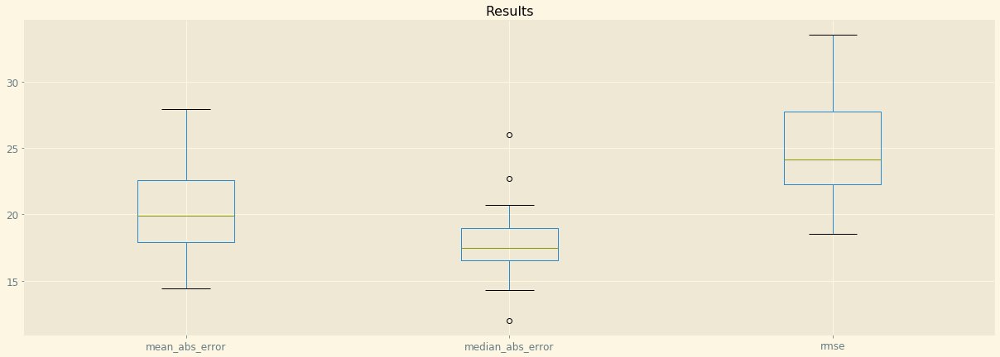

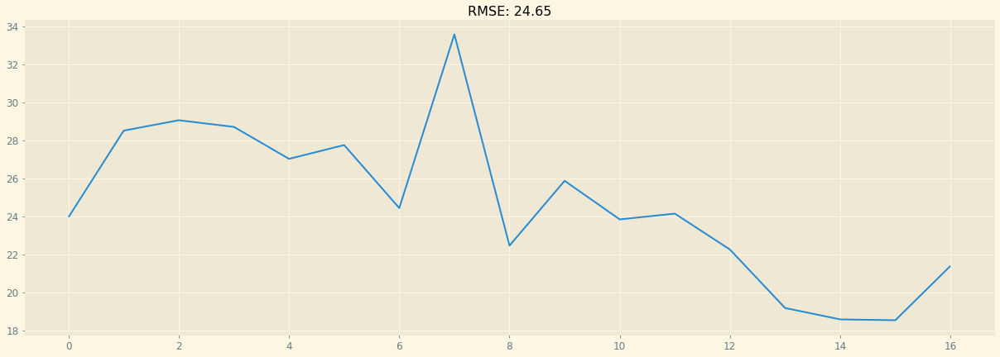

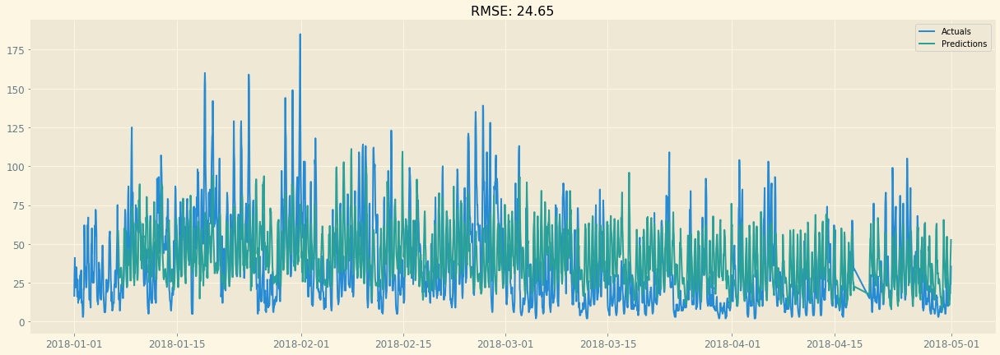

In [8]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_18 = pd.DataFrame(results_over_time)
predictions_over_time_18 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_18

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_18, results_over_time_18)

### Station nr 28079024 - Casa de Campo

In [9]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079024

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079024

Missing values for particle and station of interest: 1.1%

One particle, one station DF shape: (54877, 9)


,NO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,63.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,51.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,43.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,45.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,53.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.153, BIC=2876.592, Time=1.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.641, BIC=2866.121, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.712, BIC=2863.931, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.575, BIC=2864.794, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3139.226, BIC=3142.966, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.633, BIC=2868.592, Time=0.472 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.393, BIC=2865.353, Time=0.818 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.204, BIC=2870.903, Time=1.195 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.180, BIC=2870.879, Time=1.034 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2327.780, BIC=2346.479, Time=0.743 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2329.399, BIC=2344.358, Time=0.272 seconds
Total fit time: 3.818 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2338.224, BIC=2360.643, Time=0.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2333.498, BIC=2340.971, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2334.369, BIC=2345.579, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2334.525, BIC=2345.734, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2811.094, BIC=2814.830, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2334.922, BIC=2349.869, Time=0.657 seconds
Total fit time: 1.495 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.528, BIC=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.120, BIC=2704.053, Time=0.280 seconds
Total fit time: 5.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.735, BIC=2647.173, Time=1.320 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.446, BIC=2663.926, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.407, BIC=2646.626, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.146, BIC=2651.365, Time=0.392 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2840.945, BIC=2844.684, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.060, BIC=2642.759, Time=0.525 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.641, BIC=2653.600, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.129, BIC=2637.088, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.567, BIC=3000.796, Time=0.295 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3265.769, BIC=3269.512, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.454, BIC=2964.169, Time=0.717 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.478, BIC=2987.450, Time=0.380 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.990, BIC=2959.962, Time=0.433 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.517, BIC=2964.232, Time=0.551 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.185, BIC=2966.157, Time=0.355 seconds
Total fit time: 3.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.682, BIC=2982.140, Time=1.008 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.440, BIC=2993.926, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.134, BIC=2659.335, Time=1.081 seconds
Total fit time: 6.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.943, BIC=2565.401, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.941, BIC=2576.427, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.703, BIC=2570.932, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.126, BIC=2574.355, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2821.518, BIC=2825.261, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.141, BIC=2559.856, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.669, BIC=2568.641, Time=0.309 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.151, BIC=2558.123, Time=0.531 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.070, BIC=2777.352, Time=1.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.096, BIC=2795.524, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.069, BIC=2773.210, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.817, BIC=2774.958, Time=0.300 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3041.929, BIC=3045.643, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.933, BIC=2775.502, Time=0.819 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.584, BIC=2776.152, Time=0.918 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.241, BIC=2777.237, Time=1.704 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.555, BIC=2771.837, Time=1.188 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.735, BIC=2767.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.616, BIC=2648.016, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.086, BIC=2797.553, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2647.922, BIC=2659.122, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.714, BIC=2711.914, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2953.859, BIC=2957.593, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.021, BIC=2642.688, Time=0.361 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.081, BIC=2697.014, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.289, BIC=2637.222, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.157, BIC=2642.824, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.656, BIC=2646.590, Time=0.272 seconds
Total fit time: 2.5

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.662, BIC=2898.596, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.430, BIC=2887.363, Time=0.467 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.794, BIC=2896.194, Time=0.826 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.901, BIC=2896.567, Time=0.373 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.242, BIC=2890.908, Time=0.776 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.266, BIC=2901.400, Time=1.071 seconds
Total fit time: 5.879 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.211, BIC=2853.631, Time=0.923 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.372, BIC=2856.845, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.637, BIC=2856.847, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.862, BIC=2366.062, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2855.342, BIC=2859.075, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2349.414, BIC=2368.081, Time=0.859 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2353.147, BIC=2368.080, Time=0.233 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.467, BIC=2362.400, Time=0.627 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2349.415, BIC=2368.082, Time=0.893 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2351.014, BIC=2365.948, Time=0.159 seconds
Total fit time: 4.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.703, BIC=2466.084, Time=1.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2443.828, BIC=2451.288, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.920, BIC=2728.619, Time=0.693 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.401, BIC=2738.360, Time=0.315 seconds
Total fit time: 3.153 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.049, BIC=2706.526, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.543, BIC=2755.035, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.156, BIC=2718.395, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.990, BIC=2731.228, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.540, BIC=2906.286, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.902, BIC=2702.633, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.241, BIC=2725.225, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.364, BIC=2842.542, Time=1.235 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2829.270, BIC=2862.929, Time=1.833 seconds
Total fit time: 11.371 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.219, BIC=2882.658, Time=1.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.404, BIC=2982.883, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.835, BIC=2944.054, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.084, BIC=2958.303, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3239.931, BIC=3243.670, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.219, BIC=2908.918, Time=0.415 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.092, BIC=2910.791, Time=0.502 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.245, BIC=2631.474, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.262, BIC=2875.005, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.443, BIC=2622.158, Time=0.494 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.246, BIC=2628.218, Time=0.326 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.065, BIC=2617.037, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.444, BIC=2622.159, Time=0.529 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.225, BIC=2621.197, Time=0.291 seconds
Total fit time: 3.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.766, BIC=2517.224, Time=0.825 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.288, BIC=2530.774, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.955, BIC=2769.020, Time=1.431 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.544, BIC=2770.609, Time=1.181 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.874, BIC=2762.769, Time=0.905 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2748.246, BIC=2770.587, Time=0.384 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.055, BIC=2771.397, Time=0.424 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2742.983, BIC=2772.772, Time=1.418 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.387, BIC=2667.864, Time=0.538 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.409, BIC=2671.886, Time=0.602 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.532, BIC=2663.502, Time=1.597 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2641.297, BIC=2675.013, Time=1.389 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2641.235, BIC=2674.951, Time=1.478 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2630.071, BIC=2660.040, Time=1.700 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2644.836, BIC=2671.059, Time=0.734 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2630.363, BIC=2664.079, Time=2.412 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=264

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.693, BIC=2929.922, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3190.987, BIC=3194.730, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.215, BIC=2918.930, Time=0.706 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.956, BIC=2922.928, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.722, BIC=2914.694, Time=0.436 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.076, BIC=2918.791, Time=0.614 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.723, BIC=2918.695, Time=0.304 seconds
Total fit time: 4.043 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.005, BIC=2872.463, Time=1.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.394, BIC=2870.880, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.217, BIC=2463.189, Time=0.454 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.246, BIC=2466.961, Time=0.647 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2449.661, BIC=2464.633, Time=0.277 seconds
Total fit time: 3.243 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.503, BIC=2458.961, Time=0.933 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2445.131, BIC=2452.617, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2440.905, BIC=2452.134, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.509, BIC=2453.738, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2912.182, BIC=2915.925, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.534, BIC=2454.249, Time=0.850 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.298, BIC=2750.517, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.850, BIC=2929.590, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.675, BIC=2736.374, Time=0.694 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.511, BIC=2736.470, Time=0.266 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.737, BIC=2730.697, Time=0.308 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.395, BIC=2736.094, Time=0.444 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.614, BIC=2730.573, Time=0.257 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.475, BIC=2736.174, Time=0.369 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.785, BIC=2740.223, Time=0.920 seconds
Total fit time: 4.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.322, BIC=2899.523, Time=1.828 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.318, BIC=2914.262, Time=1.279 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2885.146, BIC=2915.090, Time=1.242 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2883.152, BIC=2909.353, Time=0.844 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.209, BIC=2909.410, Time=1.081 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2887.001, BIC=2920.688, Time=1.389 seconds
Total fit time: 11.928 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.338, BIC=2962.796, Time=0.980 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.192, BIC=2978.678, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.656, BIC=2954.885, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.745, BIC=2749.203, Time=0.865 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2731.413, BIC=2761.357, Time=1.425 seconds
Total fit time: 8.580 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.536, BIC=2688.994, Time=0.988 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.919, BIC=2690.405, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.921, BIC=2682.150, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.091, BIC=2684.320, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.117, BIC=2940.860, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.885, BIC=2685.601, Time=0.595 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.932, BIC=2685.647, Time=0.705 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.201, BIC=2518.900, Time=0.230 seconds
Total fit time: 2.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.046, BIC=2653.504, Time=0.963 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.933, BIC=2657.419, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.658, BIC=2642.887, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.953, BIC=2646.182, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2919.277, BIC=2923.020, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.618, BIC=2647.333, Time=0.606 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.662, BIC=2647.634, Time=0.265 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.319, BIC=2643.291, Time=0.478 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.259, BIC=2557.488, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2688.166, BIC=2691.909, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.788, BIC=2527.503, Time=0.373 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.770, BIC=2547.742, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.546, BIC=2522.518, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.891, BIC=2527.606, Time=0.378 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.407, BIC=2529.379, Time=0.247 seconds
Total fit time: 2.500 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.460, BIC=2592.899, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.019, BIC=2690.499, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.042, BIC=2867.481, Time=0.981 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.989, BIC=2856.469, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.818, BIC=2860.037, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.061, BIC=2860.281, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.701, BIC=3111.441, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.201, BIC=2862.900, Time=0.723 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.084, BIC=2865.043, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.992, BIC=2857.952, Time=0.662 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.333, BIC=2863.032, Time=0.669 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.407, BIC=2864.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2406.482, BIC=2432.660, Time=1.168 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2403.525, BIC=2418.484, Time=0.530 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2411.751, BIC=2426.710, Time=0.246 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2409.967, BIC=2424.927, Time=0.151 seconds
Total fit time: 5.978 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2290.390, BIC=2312.829, Time=0.888 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2310.920, BIC=2318.400, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2295.660, BIC=2306.879, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2298.505, BIC=2309.724, Time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2425.549, BIC=2447.988, Time=1.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.706, BIC=2512.186, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2460.370, BIC=2471.589, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.197, BIC=2487.416, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2631.944, BIC=2635.684, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.195, BIC=2456.894, Time=0.523 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.206, BIC=2456.905, Time=0.373 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.950, BIC=2463.129, Time=1.110 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=24

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.288, BIC=2801.467, Time=1.042 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.554, BIC=2799.733, Time=1.482 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.718, BIC=2787.677, Time=0.540 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.141, BIC=2798.580, Time=0.827 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.271, BIC=2798.710, Time=0.246 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.783, BIC=2805.702, Time=1.259 seconds
Total fit time: 7.441 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.449, BIC=2888.888, Time=1.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.696, BIC=2889.175, Time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.801, BIC=2437.259, Time=0.973 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.687, BIC=2431.173, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2419.412, BIC=2430.641, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.490, BIC=2431.719, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2679.971, BIC=2683.714, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.728, BIC=2433.443, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.802, BIC=2434.774, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.155, BIC=2428.127, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.798, BIC=2433.513, Time=0.756 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.885, BIC=2432.857, Time=0.403 seconds
Total fit time: 3.5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.339, BIC=2708.548, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.958, BIC=2929.695, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.291, BIC=2709.974, Time=0.593 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.731, BIC=2713.677, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.443, BIC=2704.390, Time=0.504 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.329, BIC=2710.012, Time=0.719 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.231, BIC=2712.178, Time=0.258 seconds
Total fit time: 3.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.312, BIC=2654.770, Time=0.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.272, BIC=2671.758, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.247, BIC=2913.232, Time=0.344 seconds
Total fit time: 2.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.214, BIC=2980.692, Time=0.815 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.482, BIC=3035.974, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.603, BIC=2994.842, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.306, BIC=3011.544, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3277.692, BIC=3281.438, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.506, BIC=2974.237, Time=0.531 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.530, BIC=2998.515, Time=0.311 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.056, BIC=2970.041, Time=0.361 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.557, BIC=2665.288, Time=0.362 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.845, BIC=2657.576, Time=0.465 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.941, BIC=2656.926, Time=0.271 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.782, BIC=2663.260, Time=0.827 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.643, BIC=2659.374, Time=0.374 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.086, BIC=2667.309, Time=1.097 seconds
Total fit time: 6.131 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.596, BIC=2574.073, Time=0.780 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.553, BIC=2585.046, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.850, BIC=2580.088, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.870, BIC=2767.981, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3060.668, BIC=3064.371, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.599, BIC=2773.118, Time=0.836 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.628, BIC=2773.147, Time=0.781 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.170, BIC=2776.096, Time=1.067 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.733, BIC=2770.956, Time=0.627 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.880, BIC=2767.399, Time=0.242 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.992, BIC=2775.918, Time=0.440 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.342, BIC=2773.157, Time=0.176 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.989, BIC=2770.212, Time=0.432 seconds
Fit ARIMA: (5, 0, 0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.238, BIC=2645.448, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.031, BIC=2844.767, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.423, BIC=2590.106, Time=0.440 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.554, BIC=2592.237, Time=0.409 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.577, BIC=2588.733, Time=0.568 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.222, BIC=2585.642, Time=0.548 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.628, BIC=2593.520, Time=1.294 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2562.552, BIC=2592.445, Time=1.364 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2565.196, BIC=2591.352, Time=0.673 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2564.525, BIC=2598.155, Time=1.502 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.841, BIC=3015.051, Time=0.178 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.467, BIC=2936.676, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3088.289, BIC=3092.025, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.255, BIC=2942.201, Time=0.392 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.242, BIC=2942.188, Time=0.364 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.828, BIC=2947.511, Time=0.499 seconds
Total fit time: 4.653 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.577, BIC=2904.996, Time=1.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.727, BIC=2909.200, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.665, BIC=2907.874, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2404.982, BIC=2416.192, Time=0.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2745.737, BIC=2749.473, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.311, BIC=2400.994, Time=0.930 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2399.779, BIC=2414.726, Time=0.491 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2383.019, BIC=2397.965, Time=0.707 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2382.923, BIC=2405.343, Time=0.991 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2390.117, BIC=2408.800, Time=0.567 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2382.875, BIC=2401.558, Time=1.065 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2384.890, BIC=2411.046, Time=1.653 seconds
Total fit time: 8.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.068, BIC=2740.526, Time=0.747 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.700, BIC=2773.186, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.931, BIC=2745.160, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.956, BIC=2752.185, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2941.803, BIC=2945.546, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.316, BIC=2737.031, Time=0.453 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.324, BIC=2737.039, Time=0.548 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.127, BIC=2731.328, Time=0.754 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.104, BIC=2736.562, Time=0.605 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.577, BIC=2734.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.230, BIC=2787.453, Time=1.487 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.195, BIC=2788.418, Time=1.681 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.247, BIC=2802.232, Time=0.349 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.668, BIC=2801.145, Time=0.590 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.335, BIC=2806.812, Time=0.676 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.388, BIC=2793.358, Time=2.096 seconds
Total fit time: 10.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.587, BIC=2872.045, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.969, BIC=2989.455, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.322, BIC=2901.551, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.996, BIC=2816.234, Time=0.194 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.058, BIC=2819.297, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3054.239, BIC=3057.986, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.384, BIC=2810.115, Time=1.022 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.088, BIC=2818.073, Time=0.509 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.782, BIC=2805.766, Time=0.655 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.563, BIC=2810.294, Time=0.730 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.479, BIC=2811.464, Time=0.229 seconds
Total fit time: 5.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.332, BIC=2729.810, Time=1.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.297, BIC=2622.497, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3130.702, BIC=3134.435, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.834, BIC=2632.501, Time=0.846 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.272, BIC=2632.939, Time=0.368 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.814, BIC=2628.947, Time=1.307 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.203, BIC=2629.336, Time=1.956 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.374, BIC=2628.307, Time=0.310 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.417, BIC=2702.913, Time=1.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.109, BIC=2750.607, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.813, BIC=2719.061, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.865, BIC=2729.113, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.214, BIC=2888.964, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.361, BIC=2699.108, Time=0.590 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.321, BIC=2727.318, Time=0.499 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.364, BIC=2694.361, Time=0.391 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.702, BIC=2699.449, Time=0.511 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.975, BIC=2712.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.430, BIC=3026.659, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3289.665, BIC=3293.408, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.522, BIC=3003.237, Time=1.043 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.014, BIC=3002.729, Time=1.050 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.025, BIC=2999.997, Time=0.567 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.800, BIC=3001.772, Time=0.250 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.882, BIC=3007.340, Time=1.323 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.656, BIC=3006.371, Time=0.333 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.718, BIC=3011.919, Time=3.361 seconds
Total fit time: 9.780 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.080, BIC=2578.319, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2836.964, BIC=2840.710, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.397, BIC=2573.128, Time=0.963 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.157, BIC=2574.142, Time=0.405 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.097, BIC=2570.082, Time=0.819 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2556.074, BIC=2578.552, Time=1.251 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2559.170, BIC=2577.901, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.120, BIC=2572.851, Time=0.937 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.718, BIC=2570.702, Time=0.720 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.894, BIC=2578.371, Time=1.307 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.581, BIC=2842.527, Time=0.227 seconds
Total fit time: 7.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.299, BIC=2794.738, Time=0.867 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.440, BIC=2822.920, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.713, BIC=2809.933, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.612, BIC=2816.831, Time=0.272 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.136, BIC=3020.876, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.474, BIC=2790.173, Time=0.766 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.743, BIC=2797.702, Time=0.385 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.643, BIC=2787.602, Time=0.554 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.635, BIC=2885.873, Time=0.324 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3146.655, BIC=3150.401, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.757, BIC=2833.488, Time=0.545 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.685, BIC=2870.670, Time=0.618 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.302, BIC=2828.287, Time=0.428 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.877, BIC=2833.608, Time=0.855 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.615, BIC=2844.600, Time=0.454 seconds
Total fit time: 4.480 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.100, BIC=2919.577, Time=1.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.149, BIC=2973.641, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.378, BIC=2844.362, Time=0.476 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.255, BIC=2836.240, Time=1.081 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.610, BIC=2841.341, Time=1.652 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.953, BIC=2842.938, Time=0.383 seconds
Total fit time: 8.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.517, BIC=2754.994, Time=1.773 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.129, BIC=2760.622, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.361, BIC=2752.600, Time=0.230 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.861, BIC=2754.100, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3007.841, BIC=3011.587, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.852, BIC=2435.081, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2809.112, BIC=2812.855, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2425.896, BIC=2440.868, Time=0.263 seconds
Total fit time: 2.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.029, BIC=2530.487, Time=1.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.933, BIC=2514.419, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.810, BIC=2515.039, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.188, BIC=2515.417, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.028, BIC=2851.771, Time=0.012 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.483, BIC=2520.455, Time=0.384 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.458, BIC=2552.935, Time=1.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.796, BIC=2606.289, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2551.183, BIC=2562.422, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.267, BIC=2577.506, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2707.561, BIC=2711.307, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.098, BIC=2548.829, Time=0.838 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.415, BIC=2570.400, Time=0.473 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.805, BIC=2543.790, Time=0.490 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.225, BIC=2548.956, Time=0.587 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.651, BIC=2551.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.776, BIC=2916.491, Time=1.266 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.089, BIC=2918.061, Time=0.273 seconds
Total fit time: 6.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.468, BIC=2875.926, Time=3.731 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.436, BIC=2864.922, Time=0.285 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.293, BIC=2868.522, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.523, BIC=2868.752, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3116.840, BIC=3120.583, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.766, BIC=2871.481, Time=1.299 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.653, BIC=2873.625, Time=0.372 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.228, BIC=2431.943, Time=1.221 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2415.369, BIC=2441.570, Time=1.996 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2414.403, BIC=2440.604, Time=2.139 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2411.233, BIC=2426.205, Time=0.679 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.297, BIC=2434.269, Time=0.371 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.625, BIC=2432.597, Time=0.237 seconds
Total fit time: 10.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2298.607, BIC=2321.065, Time=2.042 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2317.899, BIC=2325.385, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.820, BIC=2473.535, Time=0.631 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2458.958, BIC=2473.930, Time=0.240 seconds
Total fit time: 4.262 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.442, BIC=2452.900, Time=2.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2511.748, BIC=2519.234, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2467.301, BIC=2478.530, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.206, BIC=2494.435, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2639.694, BIC=2643.437, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2445.062, BIC=2463.777, Time=0.811 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2445.078, BIC=2463.793, Time=0.635 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.232, BIC=2800.947, Time=0.887 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.267, BIC=2800.982, Time=0.792 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.207, BIC=2809.408, Time=2.422 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2781.454, BIC=2807.655, Time=2.536 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.604, BIC=2795.576, Time=0.437 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.027, BIC=2806.485, Time=0.890 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.158, BIC=2806.616, Time=0.404 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.728, BIC=2813.672, Time=1.907 seconds
Total fit time: 12.255 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.865, BIC=2533.837, Time=0.510 seconds
Total fit time: 6.903 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.577, BIC=2444.054, Time=2.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2430.605, BIC=2438.097, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.336, BIC=2437.575, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2427.400, BIC=2438.639, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2688.590, BIC=2692.336, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.525, BIC=2440.256, Time=1.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.822, BIC=2441.807, Time=0.400 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.951, BIC=2434.936, Time=0.601 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.326, BIC=2727.765, Time=2.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.054, BIC=2721.534, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.168, BIC=2720.388, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.796, BIC=2721.016, Time=0.453 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2939.621, BIC=2943.361, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.202, BIC=2721.901, Time=1.130 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.380, BIC=2726.339, Time=0.565 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.323, BIC=2716.282, Time=1.000 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.235, BIC=2721.934, Time=1.061 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.073, BIC=2725.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.612, BIC=2913.359, Time=0.709 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.235, BIC=2961.232, Time=0.514 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.598, BIC=2908.596, Time=0.493 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.841, BIC=2913.588, Time=0.818 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.869, BIC=2921.866, Time=0.484 seconds
Total fit time: 5.103 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.694, BIC=2989.191, Time=1.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.174, BIC=3044.673, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.208, BIC=3003.456, Time=0.156 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.908, BIC=3020.156, Time=0.432 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.724, BIC=2681.972, Time=0.763 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2913.178, BIC=2916.927, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.164, BIC=2665.911, Time=0.935 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.681, BIC=2672.678, Time=0.559 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.685, BIC=2663.683, Time=0.666 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.943, BIC=2671.440, Time=1.151 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.613, BIC=2673.360, Time=0.562 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.921, BIC=2665.668, Time=0.638 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.814, BIC=2664.812, Time=0.512 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.868, BIC=2671.364, Time=1.458 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.206, BIC=2667.277, Time=0.251 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3034.349, BIC=3038.039, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.674, BIC=2672.435, Time=0.630 seconds
Total fit time: 1.391 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.620, BIC=2786.862, Time=1.687 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.165, BIC=2782.580, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.866, BIC=2777.988, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.068, BIC=2778.189, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3072.805, BIC=3076.513, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.769, BIC=2783.305, Time=1.136 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.996, BIC=2576.955, Time=0.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.900, BIC=2582.599, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.758, BIC=2587.717, Time=0.755 seconds
Total fit time: 4.566 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.890, BIC=2599.328, Time=1.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.751, BIC=2702.231, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.560, BIC=2625.780, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.775, BIC=2652.995, Time=0.504 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2849.772, BIC=2853.511, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.719, BIC=2597.418, Time=0.604 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.869, BIC=2966.098, Time=0.353 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3225.424, BIC=3229.167, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.044, BIC=2952.759, Time=0.776 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.523, BIC=2966.495, Time=0.768 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.594, BIC=2948.566, Time=1.005 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.330, BIC=2953.045, Time=1.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.546, BIC=2960.518, Time=0.134 seconds
Total fit time: 6.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.497, BIC=2914.935, Time=1.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.235, BIC=2918.715, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2505.642, BIC=2531.821, Time=1.705 seconds
Total fit time: 7.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.662, BIC=2419.100, Time=0.897 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2425.875, BIC=2433.355, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2413.538, BIC=2424.757, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2417.241, BIC=2428.460, Time=0.303 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2758.738, BIC=2762.477, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2395.121, BIC=2413.819, Time=0.631 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.733, BIC=2427.693, Time=0.433 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2394.617, BIC=2409.576, Time=0.652 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.474, BIC=2748.951, Time=1.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.552, BIC=2782.044, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.197, BIC=2754.435, Time=0.219 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.130, BIC=2761.369, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2952.219, BIC=2955.965, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.058, BIC=2745.789, Time=0.794 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.065, BIC=2745.796, Time=0.550 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.545, BIC=2739.769, Time=1.068 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.649, BIC=2745.126, Time=0.973 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.746, BIC=2742.716, Time=4.074 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.706, BIC=2812.704, Time=0.374 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2790.229, BIC=2812.725, Time=0.587 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.391, BIC=2817.887, Time=0.900 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.086, BIC=2803.081, Time=1.739 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.767, BIC=2879.244, Time=1.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.268, BIC=2998.761, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.254, BIC=2911.493, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.115, BIC=2945.354, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.363, BIC=2827.611, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3064.074, BIC=3067.823, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.866, BIC=2818.613, Time=0.598 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.513, BIC=2826.510, Time=0.322 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.103, BIC=2814.101, Time=0.485 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.992, BIC=2818.739, Time=0.515 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.049, BIC=2820.046, Time=0.198 seconds
Total fit time: 3.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.873, BIC=2738.369, Time=0.919 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2744.377, BIC=2751.875, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.300, BIC=2639.983, Time=0.766 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.618, BIC=2640.301, Time=0.763 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.324, BIC=2636.480, Time=1.564 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.312, BIC=2636.469, Time=1.608 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.911, BIC=2635.857, Time=0.273 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.703, BIC=2645.123, Time=0.532 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.143, BIC=2645.562, Time=0.545 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.630, BIC=2714.145, Time=2.944 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.757, BIC=2761.262, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.450, BIC=2730.708, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.150, BIC=2740.408, Time=1.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2897.264, BIC=2901.016, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.460, BIC=2710.223, Time=0.637 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.813, BIC=2738.823, Time=0.500 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.443, BIC=2705.453, Time=0.447 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.798, BIC=2710.561, Time=0.895 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.132, BIC=2725.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.186, BIC=3035.434, Time=0.882 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3290.400, BIC=3294.149, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.023, BIC=3025.770, Time=2.165 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.812, BIC=3025.559, Time=0.945 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.291, BIC=3034.537, Time=1.643 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.290, BIC=3034.536, Time=1.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.585, BIC=3021.583, Time=2.027 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.433, BIC=3030.930, Time=1.689 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.228, BIC=3030.724, Time=2.170 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.995, BIC=3034.991, Time=2.213 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.681, BIC=2584.678, Time=0.320 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.878, BIC=2579.876, Time=0.517 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2566.228, BIC=2588.725, Time=0.823 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2570.049, BIC=2588.796, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.313, BIC=2583.060, Time=0.671 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.413, BIC=2581.411, Time=0.300 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.021, BIC=2588.518, Time=1.010 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.151, BIC=2585.898, Time=0.488 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.433, BIC=2592.679, Time=2.139 seconds
Total fit time: 10.298 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.650, BIC=2827.879, Time=0.285 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.105, BIC=3034.848, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.943, BIC=2801.658, Time=0.607 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.387, BIC=2810.359, Time=0.316 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.191, BIC=2798.163, Time=0.405 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.535, BIC=2805.993, Time=0.775 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2792.948, BIC=2811.663, Time=0.414 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.482, BIC=2801.197, Time=0.665 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.973, BIC=2800.945, Time=0.465 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.674, BIC=2806.133, Time=0.824 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.026, BIC=2839.023, Time=0.347 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.570, BIC=2844.317, Time=0.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.026, BIC=2856.023, Time=0.376 seconds
Total fit time: 3.311 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.913, BIC=2928.409, Time=0.933 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.114, BIC=2984.613, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.881, BIC=2931.130, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.104, BIC=2942.352, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3239.038, BIC=3242.788, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.172, BIC=2923.919, Time=0.607 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.427, BIC=2763.676, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.554, BIC=3023.304, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.280, BIC=2763.027, Time=0.913 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.363, BIC=2763.110, Time=0.838 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.928, BIC=2771.174, Time=1.571 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.277, BIC=2770.523, Time=1.344 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.637, BIC=2757.635, Time=0.706 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.477, BIC=2765.973, Time=2.162 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=27

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.613, BIC=2541.852, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2867.618, BIC=2871.365, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.197, BIC=2547.182, Time=0.395 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.185, BIC=2547.169, Time=0.619 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.197, BIC=2552.928, Time=0.300 seconds
Total fit time: 2.356 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.181, BIC=2676.677, Time=1.040 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.887, BIC=2681.386, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.579, BIC=2665.828, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.749, BIC=2668.997, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.183, BIC=2555.930, Time=0.697 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.553, BIC=2577.550, Time=0.562 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.955, BIC=2550.952, Time=0.511 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.318, BIC=2556.065, Time=0.992 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.836, BIC=2558.834, Time=0.590 seconds
Total fit time: 6.309 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.685, BIC=2620.162, Time=0.931 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.922, BIC=2714.415, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.928, BIC=2638.167, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.215, BIC=2664.453, Time=0.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.661, BIC=2875.646, Time=1.495 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.071, BIC=2880.802, Time=1.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.986, BIC=2881.971, Time=0.303 seconds
Total fit time: 9.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.814, BIC=2834.291, Time=1.997 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.728, BIC=2822.220, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.080, BIC=2824.319, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.392, BIC=2824.631, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.227, BIC=3088.973, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.292, BIC=2830.023, Time=1.971 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2313.444, BIC=2324.683, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2679.004, BIC=2682.750, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2305.974, BIC=2324.705, Time=1.093 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2313.606, BIC=2328.591, Time=0.497 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2304.193, BIC=2319.177, Time=0.749 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2306.015, BIC=2324.746, Time=1.928 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2310.324, BIC=2325.309, Time=0.454 seconds
Total fit time: 7.672 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2275.541, BIC=2298.018, Time=2.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2279.022, BIC=2286.515, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2455.355, BIC=2481.578, Time=2.754 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.036, BIC=2470.021, Time=0.439 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2458.018, BIC=2480.495, Time=1.539 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.107, BIC=2480.584, Time=1.484 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2458.914, BIC=2488.884, Time=2.327 seconds
Total fit time: 16.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2428.734, BIC=2451.192, Time=1.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.845, BIC=2497.331, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2445.049, BIC=2456.278, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.522, BIC=2803.507, Time=0.572 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.947, BIC=2814.424, Time=1.041 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.099, BIC=2814.577, Time=0.476 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.700, BIC=2821.669, Time=2.474 seconds
Total fit time: 11.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.810, BIC=2905.288, Time=1.955 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.261, BIC=2905.754, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.304, BIC=2900.542, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.680, BIC=2902.919, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3184.544, BIC=3188.290, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2428.325, BIC=2447.072, Time=0.982 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2433.677, BIC=2448.675, Time=0.427 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2426.733, BIC=2441.731, Time=0.850 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2428.392, BIC=2447.139, Time=0.981 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.762, BIC=2446.760, Time=0.391 seconds
Total fit time: 5.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2350.254, BIC=2372.750, Time=2.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.459, BIC=2359.958, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2350.999, BIC=2362.247, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2351.566, BIC=2362.815, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.825, BIC=2734.797, Time=0.891 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.519, BIC=2724.491, Time=1.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.465, BIC=2730.180, Time=2.504 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.466, BIC=2733.439, Time=1.263 seconds
Total fit time: 11.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.340, BIC=2672.836, Time=0.758 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.647, BIC=2690.146, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.903, BIC=2673.151, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.796, BIC=2678.045, Time=0.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.107, BIC=2874.856, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.973, BIC=3031.231, Time=0.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3300.320, BIC=3304.073, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.115, BIC=2992.878, Time=1.051 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.011, BIC=3017.022, Time=0.667 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.715, BIC=2988.725, Time=0.548 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.122, BIC=2992.884, Time=0.763 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.249, BIC=2995.260, Time=0.337 seconds
Total fit time: 6.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.856, BIC=3008.371, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.766, BIC=3020.271, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.315, BIC=2678.830, Time=0.899 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.110, BIC=2674.873, Time=0.472 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.694, BIC=2682.962, Time=1.728 seconds
Total fit time: 10.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.776, BIC=2589.291, Time=1.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.944, BIC=2600.449, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.748, BIC=2595.006, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.142, BIC=2598.399, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2850.781, BIC=2854.533, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.816, BIC=2583.579, Time=0.625 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.707, BIC=2680.482, Time=0.498 seconds
Total fit time: 1.392 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.000, BIC=2795.263, Time=1.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.018, BIC=2791.439, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.322, BIC=2786.453, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.543, BIC=2786.675, Time=0.274 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.655, BIC=3087.365, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.159, BIC=2791.711, Time=0.768 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.236, BIC=2791.788, Time=1.007 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.493, BIC=2795.466, Time=1.260 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.903, BIC=2620.361, Time=0.929 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.422, BIC=2717.908, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.760, BIC=2642.989, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.258, BIC=2669.487, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2865.938, BIC=2869.681, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.022, BIC=2616.737, Time=0.472 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.225, BIC=2617.941, Time=0.475 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.429, BIC=2615.630, Time=1.052 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.195, BIC=2612.654, Time=0.755 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.349, BIC=2619.293, Time=1.635 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.585, BIC=2961.558, Time=0.316 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.567, BIC=2961.539, Time=0.304 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.074, BIC=2966.789, Time=0.695 seconds
Total fit time: 2.246 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.282, BIC=2924.740, Time=1.322 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.113, BIC=2928.599, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.821, BIC=2928.051, Time=0.175 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.412, BIC=2929.641, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.863, BIC=3175.606, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.358, BIC=2919.073, Time=0.706 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.799, BIC=2420.514, Time=0.828 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.472, BIC=2434.444, Time=0.419 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2401.299, BIC=2416.271, Time=0.560 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.033, BIC=2420.748, Time=0.886 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2411.774, BIC=2426.746, Time=0.150 seconds
Total fit time: 4.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.380, BIC=2405.819, Time=1.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.538, BIC=2556.017, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2466.637, BIC=2477.856, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.785, BIC=2391.004, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.932, BIC=2755.679, Time=0.587 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.114, BIC=2772.112, Time=0.358 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.021, BIC=2750.019, Time=0.399 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.965, BIC=2755.712, Time=0.644 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.603, BIC=2765.600, Time=0.313 seconds
Total fit time: 3.771 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.066, BIC=2733.600, Time=1.773 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.460, BIC=2781.972, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.545, BIC=2744.812, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.502, BIC=2757.769, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.187, BIC=2941.934, Time=0.562 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.565, BIC=2984.562, Time=0.413 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.231, BIC=2940.228, Time=0.411 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.737, BIC=2942.234, Time=2.213 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.847, BIC=2971.594, Time=0.556 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.719, BIC=2947.965, Time=1.334 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.720, BIC=2947.965, Time=1.269 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2939.587, BIC=2962.084, Time=0.755 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.140, BIC=2951.135, Time=2.024 seconds
Total fit time: 11.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.124, BIC=2647.887, Time=0.854 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.473, BIC=2646.484, Time=0.388 seconds
Total fit time: 4.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.728, BIC=2543.244, Time=0.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.809, BIC=2555.314, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.011, BIC=2549.269, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.589, BIC=2552.847, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2817.581, BIC=2821.334, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.840, BIC=2537.602, Time=0.673 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.232, BIC=2546.242, Time=0.268 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.937, BIC=2788.871, Time=0.858 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.592, BIC=2796.993, Time=0.409 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.430, BIC=2797.830, Time=0.411 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.793, BIC=2794.659, Time=1.525 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.828, BIC=2885.228, Time=1.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.146, BIC=2877.613, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.787, BIC=2876.987, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.910, BIC=2878.110, Tim

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2673.798, BIC=2700.089, Time=0.871 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2671.538, BIC=2705.339, Time=1.883 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2677.616, BIC=2711.418, Time=0.937 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2675.551, BIC=2705.597, Time=2.658 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2658.884, BIC=2696.441, Time=2.811 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 17.950 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.620, BIC=2769.135, Time=0.591 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.657, BIC=2885.162, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.556, BIC=2796.814, Tim

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.402, BIC=3049.423, Time=2.083 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3017.426, BIC=3054.951, Time=3.040 seconds
Total fit time: 24.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.881, BIC=2953.397, Time=1.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.565, BIC=2960.070, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.754, BIC=2957.012, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.401, BIC=2959.659, Time=0.478 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3221.764, BIC=3225.517, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.059, BIC=2948.822, Time=0.938 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.671, BIC=2952.681, Time=0.456 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.203, BIC=2498.461, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2816.087, BIC=2819.839, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.192, BIC=2490.955, Time=1.119 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.188, BIC=2493.198, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2472.044, BIC=2487.054, Time=0.894 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.951, BIC=2490.714, Time=0.723 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2474.123, BIC=2489.133, Time=0.387 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.446, BIC=2495.962, Time=1.174 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.166, BIC=2493.929, Time=0.585 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.771, BIC=2501.039, Time=1.616 seconds
Total fit time: 8.6

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.561, BIC=2818.038, Time=1.118 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.047, BIC=2815.778, Time=0.257 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.807, BIC=2824.030, Time=1.483 seconds
Total fit time: 7.604 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.317, BIC=2777.813, Time=1.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.775, BIC=2804.274, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.731, BIC=2776.979, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.244, BIC=2786.492, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2964.474, BIC=2968.224, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.973, BIC=2772.719, Time=0.667 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.583, BIC=2932.346, Time=0.658 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.636, BIC=2950.646, Time=0.461 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.358, BIC=2930.368, Time=0.416 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2911.687, BIC=2934.203, Time=0.746 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.667, BIC=2953.430, Time=0.477 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.333, BIC=2923.601, Time=2.151 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2912.148, BIC=2942.169, Time=1.666 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.713, BIC=2942.733, Time=1.842 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.728, BIC=2936.996, Time=1.121 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.704, BIC=2936.972, Time=1.094 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.573, BIC=2773.335, Time=1.021 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.634, BIC=2773.397, Time=0.995 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.003, BIC=2781.271, Time=1.770 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2755.372, BIC=2781.640, Time=2.053 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.818, BIC=2767.828, Time=0.932 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.132, BIC=2778.143, Time=0.365 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.581, BIC=2776.591, Time=0.202 seconds
Total fit time: 8.853 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.491, BIC=2718.007, Time

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.700, BIC=2556.697, Time=0.877 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.247, BIC=2555.244, Time=2.402 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.700, BIC=2562.447, Time=1.021 seconds
Total fit time: 8.507 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.753, BIC=2687.268, Time=1.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.510, BIC=2690.015, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.878, BIC=2676.136, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.468, BIC=2678.725, Time=0.262 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2953.458, BIC=2957.210, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.772, BIC=2680.535, Time=1.118 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.968, BIC=2570.236, Time=2.516 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2546.707, BIC=2569.223, Time=1.757 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2542.883, BIC=2572.903, Time=2.557 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2544.083, BIC=2577.856, Time=2.496 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2543.277, BIC=2577.050, Time=3.233 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2544.193, BIC=2574.214, Time=1.868 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.410, BIC=2573.431, Time=1.998 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2542.916, BIC=2580.441, Time=2.962 seconds
Total fit time: 27.710 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.454, BIC=2627.950, Time=3.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.003, BIC=2889.750, Time=1.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.505, BIC=2891.503, Time=0.449 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.647, BIC=2884.645, Time=1.056 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.114, BIC=2889.861, Time=1.112 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.870, BIC=2890.868, Time=0.308 seconds
Total fit time: 8.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.301, BIC=2842.797, Time=1.853 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.690, BIC=2831.189, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.828, BIC=2833.076, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.171, BIC=2833.419, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2313.599, BIC=2336.095, Time=1.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2332.351, BIC=2339.850, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2317.396, BIC=2328.644, Time=0.178 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2319.947, BIC=2331.195, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2686.822, BIC=2690.572, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2312.565, BIC=2331.312, Time=2.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2320.036, BIC=2335.034, Time=0.518 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2310.802, BIC=2325.800, Time=1.387 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2312.607, BIC=2331.354, Time=1.855 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2316.736, BIC=2331.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2462.953, BIC=2489.199, Time=1.830 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2462.664, BIC=2477.662, Time=0.349 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2465.809, BIC=2488.306, Time=0.696 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2465.894, BIC=2488.391, Time=0.812 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2466.824, BIC=2496.819, Time=2.404 seconds
Total fit time: 11.748 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.788, BIC=2458.266, Time=1.003 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.829, BIC=2504.322, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2452.210, BIC=2463.449, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.731, BIC=2813.729, Time=0.605 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.351, BIC=2824.847, Time=0.818 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.308, BIC=2824.805, Time=1.228 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.421, BIC=2832.416, Time=1.700 seconds
Total fit time: 17.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.109, BIC=2914.606, Time=1.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.157, BIC=2915.656, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.170, BIC=2910.419, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.575, BIC=2912.824, Time=0.404 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3196.228, BIC=3199.978, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.484, BIC=2454.246, Time=0.839 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2440.801, BIC=2455.811, Time=0.463 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2433.921, BIC=2448.931, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2435.559, BIC=2454.322, Time=0.833 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.893, BIC=2453.903, Time=0.304 seconds
Total fit time: 5.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.380, BIC=2379.896, Time=1.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2359.410, BIC=2366.915, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2358.032, BIC=2369.290, Time=0.136 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2358.577, BIC=2369.835, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.715, BIC=2745.700, Time=0.488 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.440, BIC=2734.425, Time=1.137 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.377, BIC=2740.108, Time=1.436 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.943, BIC=2743.928, Time=0.551 seconds
Total fit time: 7.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.453, BIC=2683.969, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.331, BIC=2702.836, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.776, BIC=2684.033, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.963, BIC=2689.221, Time=0.287 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2884.770, BIC=2888.522, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.314, BIC=3043.581, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.803, BIC=3318.559, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.453, BIC=3005.232, Time=1.034 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.000, BIC=3030.023, Time=0.857 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.777, BIC=3000.800, Time=0.874 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.464, BIC=3005.243, Time=0.644 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.729, BIC=3007.752, Time=0.571 seconds
Total fit time: 6.662 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.806, BIC=3022.341, Time=2.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.108, BIC=3033.619, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.206, BIC=2694.496, Time=1.553 seconds
Total fit time: 8.400 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.536, BIC=2599.071, Time=1.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.577, BIC=2611.088, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2594.217, BIC=2605.484, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.705, BIC=2608.973, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.717, BIC=2866.473, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.560, BIC=2593.339, Time=0.650 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.795, BIC=2602.818, Time=0.392 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.285, BIC=2591.308, Time=0.504 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.496, BIC=2802.065, Time=1.152 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.570, BIC=2802.139, Time=4.948 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.509, BIC=2806.505, Time=2.610 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.737, BIC=2801.019, Time=1.146 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.863, BIC=2797.432, Time=0.362 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.251, BIC=2806.247, Time=0.956 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.821, BIC=2802.676, Time=0.267 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.248, BIC=2800.530, Time=0.955 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.201, BIC=2806.198, Time=0.655 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.201, BIC=2811.911, Time=0.709 seconds
Total fit time: 16.0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.680, BIC=2622.904, Time=0.837 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.456, BIC=2619.933, Time=0.515 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.592, BIC=2626.562, Time=1.471 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.353, BIC=2617.576, Time=1.329 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.450, BIC=2619.927, Time=0.429 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.328, BIC=2629.298, Time=1.041 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2595.467, BIC=2614.198, Time=0.274 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.386, BIC=2623.609, Time=0.535 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.310, BIC=2624.026, Time=1.650 seconds
Near non-invertible roots for order (5, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.480, BIC=2935.195, Time=0.433 seconds
Total fit time: 1.653 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.963, BIC=2892.459, Time=0.983 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.035, BIC=2895.534, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.701, BIC=2895.949, Time=0.150 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.945, BIC=2897.193, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3131.586, BIC=3135.336, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.154, BIC=2886.901, Time=0.549 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.962, BIC=2896.959, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.450, BIC=2884.448, Time=0.438 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.658, BIC=2511.116, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.442, BIC=2492.928, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.659, BIC=2495.888, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.009, BIC=2496.238, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.675, BIC=3070.418, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.093, BIC=2500.065, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.798, BIC=2498.770, Time=0.689 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.054, BIC=2505.769, Time=0.265 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.077, BIC=2505.792, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.369, BIC=2500.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.299, BIC=2739.093, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.314, BIC=2739.109, Time=0.455 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.670, BIC=2746.983, Time=1.021 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.570, BIC=2746.882, Time=1.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.379, BIC=2733.415, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.812, BIC=2760.848, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.621, BIC=2746.657, Time=0.284 seconds
Total fit time: 5.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.280, BIC=2664.814, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.702, BIC=2739.213, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.337, BIC=2968.605, Time=0.890 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2942.337, BIC=2968.605, Time=0.840 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2959.131, BIC=2981.646, Time=0.597 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2939.978, BIC=2969.998, Time=1.307 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2941.659, BIC=2975.432, Time=1.845 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2941.703, BIC=2975.476, Time=2.058 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2944.335, BIC=2974.356, Time=1.147 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.119, BIC=2972.140, Time=1.576 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2943.640, BIC=2981.166, Time=1.848 seconds
Total fit time: 15.452 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.957, BIC=2660.735, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.486, BIC=2658.509, Time=0.274 seconds
Total fit time: 2.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.583, BIC=2556.118, Time=1.402 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2560.596, BIC=2568.108, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.644, BIC=2560.911, Time=0.190 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.588, BIC=2564.855, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2830.872, BIC=2834.628, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.683, BIC=2550.462, Time=0.660 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.979, BIC=2558.002, Time=0.384 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.342, BIC=2896.800, Time=0.555 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.015, BIC=3033.501, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.163, BIC=2949.392, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.501, BIC=2880.730, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3024.015, BIC=3027.758, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.497, BIC=2886.469, Time=0.232 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.498, BIC=2886.470, Time=0.166 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.803, BIC=2891.518, Time=0.574 seconds
Total fit time: 1.840 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.704, BIC=2841.201, Time=0.733 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.944, BIC=2972.212, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3196.772, BIC=3200.528, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.933, BIC=2902.712, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.951, BIC=2902.729, Time=0.385 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.572, BIC=2910.862, Time=0.588 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.222, BIC=2910.512, Time=0.714 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.044, BIC=2897.067, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.965, BIC=2946.988, Time=0.316 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.420, BIC=2910.443, Time=0.264 seconds
Total fit time: 3.915 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.912, BIC=2863.691, Time=0.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.588, BIC=2864.611, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.529, BIC=2860.552, Time=0.496 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.872, BIC=2869.407, Time=0.779 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.291, BIC=2869.070, Time=0.368 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.989, BIC=2863.768, Time=0.650 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.809, BIC=2874.100, Time=1.131 seconds
Total fit time: 5.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.683, BIC=2789.217, Time=1.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.344, BIC=2779.855, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.230, BIC=2589.228, Time=0.685 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.593, BIC=2593.340, Time=0.162 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.402, BIC=2593.149, Time=0.875 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.308, BIC=2588.306, Time=0.252 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2575.304, BIC=2594.051, Time=0.333 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2576.059, BIC=2598.556, Time=1.033 seconds
Total fit time: 4.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.822, BIC=2726.338, Time=0.600 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.096, BIC=2704.601, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.645, BIC=2709.903, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.202, BIC=2731.213, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.329, BIC=2711.339, Time=0.268 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.362, BIC=2716.125, Time=0.369 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.607, BIC=2713.617, Time=0.318 seconds
Total fit time: 2.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.996, BIC=2730.530, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.232, BIC=2817.744, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.597, BIC=2748.865, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.145, BIC=2778.413, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2947.728, BIC=2951.483, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.787, BIC=3009.055, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.492, BIC=3283.247, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.783, BIC=3009.562, Time=0.640 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.578, BIC=3014.601, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.312, BIC=3005.335, Time=0.615 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.368, BIC=3010.147, Time=0.668 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.352, BIC=3014.375, Time=0.213 seconds
Total fit time: 3.784 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.787, BIC=2978.322, Time=1.014 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.091, BIC=2975.602, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.233, BIC=2566.012, Time=0.792 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.653, BIC=2567.676, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.326, BIC=2562.349, Time=0.531 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.537, BIC=2570.071, Time=0.772 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.122, BIC=2571.901, Time=0.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.674, BIC=2566.453, Time=0.928 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.502, BIC=2576.792, Time=1.300 seconds
Total fit time: 6.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.751, BIC=2511.286, Time=0.948 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.199, BIC=2503.711, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.534, BIC=2634.801, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2791.401, BIC=2795.157, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.326, BIC=2624.105, Time=0.403 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.687, BIC=2633.710, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.333, BIC=2618.356, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.326, BIC=2624.105, Time=0.505 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2610.908, BIC=2625.931, Time=0.275 seconds
Total fit time: 2.717 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.720, BIC=2556.254, Time=0.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.637, BIC=2591.149, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.318, BIC=2806.328, Time=0.262 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.726, BIC=2786.736, Time=0.241 seconds
Total fit time: 4.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.334, BIC=2854.849, Time=0.730 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.041, BIC=2889.546, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.996, BIC=2861.254, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.043, BIC=2869.301, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3133.974, BIC=3137.727, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.827, BIC=2853.590, Time=0.538 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.856, BIC=2853.619, Time=0.587 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.738, BIC=2654.986, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2899.056, BIC=2902.806, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.275, BIC=2659.022, Time=0.604 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.432, BIC=2660.429, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.445, BIC=2653.443, Time=0.492 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.321, BIC=2659.068, Time=0.678 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.540, BIC=2659.537, Time=0.158 seconds
Total fit time: 3.550 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.104, BIC=2602.619, Time=0.948 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.724, BIC=2599.229, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.620, BIC=2506.382, Time=0.682 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2494.962, BIC=2509.972, Time=0.235 seconds
Total fit time: 3.263 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.886, BIC=2563.382, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.866, BIC=2570.365, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.977, BIC=2561.226, Time=0.150 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.934, BIC=2564.182, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.653, BIC=2779.403, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.768, BIC=2557.515, Time=0.554 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.993, BIC=2565.990, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.184, BIC=2569.946, Time=0.339 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.035, BIC=2568.303, Time=1.304 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.485, BIC=2571.001, Time=0.516 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.136, BIC=2553.157, Time=1.410 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.429, BIC=2576.697, Time=0.718 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.787, BIC=2584.561, Time=1.454 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2549.739, BIC=2583.512, Time=1.515 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.889, BIC=2577.909, Time=1.524 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.213, BIC=2581.233, Time=0.640 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.730, BIC=2590.255, Time=2.015 seconds
Total fit time: 12.7

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.877, BIC=2789.144, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3051.779, BIC=3055.535, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.540, BIC=2793.319, Time=0.733 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.089, BIC=2793.112, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.683, BIC=2787.706, Time=0.516 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.552, BIC=2793.331, Time=0.762 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.193, BIC=2792.216, Time=0.291 seconds
Total fit time: 3.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.233, BIC=2760.768, Time=1.006 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.928, BIC=2750.440, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.872, BIC=2662.349, Time=1.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.295, BIC=2643.788, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.834, BIC=2647.072, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.973, BIC=2647.211, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3144.228, BIC=3147.974, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.580, BIC=2652.564, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.768, BIC=2652.752, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.575, BIC=2658.306, Time=0.289 seconds
Total fit time: 2.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.073, BIC=2773.512, Time=1.077 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.332, BIC=2719.619, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2905.837, BIC=2909.599, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.882, BIC=2684.692, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.418, BIC=2704.466, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.882, BIC=2678.930, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.882, BIC=2684.692, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.717, BIC=2682.765, Time=0.260 seconds
Total fit time: 2.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.300, BIC=2760.872, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.416, BIC=2902.940, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.026, BIC=2930.062, Time=0.460 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.204, BIC=2934.998, Time=0.558 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.862, BIC=2931.897, Time=0.282 seconds
Total fit time: 3.522 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.075, BIC=2873.628, Time=0.617 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.737, BIC=2880.255, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.598, BIC=2875.874, Time=0.156 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.712, BIC=2878.989, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3129.282, BIC=3133.041, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.281, BIC=2868.075, Time=0.501 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2389.338, BIC=2404.361, Time=0.312 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2387.076, BIC=2409.610, Time=0.638 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2392.118, BIC=2410.897, Time=0.341 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.352, BIC=2406.131, Time=0.375 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2388.998, BIC=2415.288, Time=0.884 seconds
Total fit time: 4.239 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.446, BIC=2489.980, Time=0.753 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2473.474, BIC=2480.985, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.712, BIC=2480.979, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.538, BIC=2481.805, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.159, BIC=2637.858, Time=0.537 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.533, BIC=2637.712, Time=0.731 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.187, BIC=2636.625, Time=0.489 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.726, BIC=2640.644, Time=1.306 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.969, BIC=2641.148, Time=0.784 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.786, BIC=2653.444, Time=1.503 seconds
Near non-invertible roots for order (5, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.653, BIC=2645.311, Time=1.435 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2609.969, BIC=2639.887, Time=1.177 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=261

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.813, BIC=2964.052, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3234.621, BIC=3238.368, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.626, BIC=2895.357, Time=0.387 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.607, BIC=2957.592, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.380, BIC=2890.365, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.943, BIC=2895.674, Time=0.426 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.026, BIC=2911.011, Time=0.252 seconds
Total fit time: 2.595 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.066, BIC=2960.562, Time=0.836 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.732, BIC=3046.231, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.844, BIC=2660.341, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.430, BIC=2673.929, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.269, BIC=2671.517, Time=0.162 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.556, BIC=2673.804, Time=0.282 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2905.582, BIC=2909.332, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.949, BIC=2655.696, Time=0.507 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.636, BIC=2670.634, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.991, BIC=2655.988, Time=0.403 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2637.493, BIC=2659.989, Time=0.891 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.692, BIC=2665.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.084, BIC=2890.017, Time=0.198 seconds
Total fit time: 1.602 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.202, BIC=2934.698, Time=0.978 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.001, BIC=2930.500, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.990, BIC=2926.238, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.783, BIC=2927.031, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3179.635, BIC=3183.384, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.867, BIC=2930.614, Time=1.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.365, BIC=2932.362, Time=0.459 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.987, BIC=2924.984, Time=0.741 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.206, BIC=2716.303, Time=1.584 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.650, BIC=2734.509, Time=1.423 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2686.134, BIC=2719.993, Time=1.715 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2700.305, BIC=2730.402, Time=0.822 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2687.803, BIC=2725.423, Time=1.874 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2702.310, BIC=2739.931, Time=1.686 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2701.077, BIC=2734.935, Time=1.418 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2701.359, BIC=2742.742, Time=2.144 seconds
Total fit time: 17.129 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.585, BIC=2765.138, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.415, BIC=3033.438, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.922, BIC=3012.945, Time=0.368 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2996.288, BIC=3018.823, Time=0.778 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3012.691, BIC=3031.470, Time=0.420 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.867, BIC=3014.646, Time=0.671 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.894, BIC=3022.184, Time=1.155 seconds
Total fit time: 5.323 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.478, BIC=3032.013, Time=1.042 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.747, BIC=3032.258, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.068, BIC=3027.335, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.783, BIC=2485.060, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2819.028, BIC=2822.787, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.594, BIC=2471.389, Time=0.399 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2458.099, BIC=2473.135, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.158, BIC=2469.194, Time=0.383 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2453.233, BIC=2475.786, Time=0.834 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2453.560, BIC=2472.355, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.615, BIC=2471.409, Time=0.606 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2456.592, BIC=2482.904, Time=0.353 seconds
Total fit time: 4.073 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.875, BIC=2855.885, Time=0.280 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.022, BIC=2840.033, Time=0.462 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.524, BIC=2844.287, Time=0.636 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.086, BIC=2851.096, Time=0.268 seconds
Total fit time: 3.250 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.909, BIC=2810.462, Time=0.847 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.488, BIC=2835.005, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.971, BIC=2818.248, Time=0.153 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.829, BIC=2823.106, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.614, BIC=3006.373, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.315, BIC=3049.592, Time=0.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3291.176, BIC=3294.935, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.001, BIC=2990.796, Time=0.405 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.623, BIC=3031.658, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.375, BIC=2985.410, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.059, BIC=2990.853, Time=0.453 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.825, BIC=3002.861, Time=0.232 seconds
Total fit time: 2.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.435, BIC=3026.989, Time=0.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.241, BIC=3085.759, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.779, BIC=2799.333, Time=1.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.134, BIC=2789.652, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.083, BIC=2793.360, Time=0.173 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.506, BIC=2793.782, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3034.995, BIC=3038.754, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.868, BIC=2793.663, Time=0.761 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.143, BIC=2795.178, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.791, BIC=2789.827, Time=0.586 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.938, BIC=2793.732, Time=0.673 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.475, BIC=2793.510, Time=0.292 seconds
Total fit time: 4.3

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.192, BIC=2594.190, Time=0.638 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.028, BIC=2601.524, Time=1.155 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.733, BIC=2601.230, Time=1.059 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2580.002, BIC=2609.997, Time=1.597 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.289, BIC=2762.337, Time=0.331 seconds
Total fit time: 3.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.489, BIC=2729.024, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.314, BIC=2788.825, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.838, BIC=2739.105, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.333, BIC=2759.601, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2919.789, BIC=2923.544, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.065, BIC=2723.844, Time=0.460 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.023, BIC=2739.046, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.866, BIC=2718.889, Time=0.272 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2989.307, BIC=3011.860, Time=0.604 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2986.064, BIC=3016.135, Time=0.502 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2986.082, BIC=3016.153, Time=0.528 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2985.848, BIC=3012.161, Time=0.730 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2986.917, BIC=3020.747, Time=1.740 seconds
Total fit time: 9.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.810, BIC=3025.363, Time=1.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.129, BIC=3030.647, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.025, BIC=3017.302, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.395, BIC=3017.671, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.177, BIC=2579.730, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.927, BIC=2583.445, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.482, BIC=2568.759, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.340, BIC=2570.617, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2866.618, BIC=2870.377, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.924, BIC=2573.718, Time=0.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.298, BIC=2575.333, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.914, BIC=2569.950, Time=0.494 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.345, BIC=2574.140, Time=0.831 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.938, BIC=2573.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.983, BIC=2673.793, Time=0.489 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.561, BIC=2673.609, Time=0.284 seconds
Total fit time: 3.220 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.250, BIC=2635.803, Time=0.752 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.026, BIC=2655.543, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.887, BIC=2636.163, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.899, BIC=2642.176, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2799.317, BIC=2803.076, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.673, BIC=2631.468, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.966, BIC=2641.002, Time=0.294 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.083, BIC=2785.862, Time=0.449 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.422, BIC=2786.201, Time=0.415 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.090, BIC=2797.380, Time=0.853 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.329, BIC=2794.620, Time=0.788 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.455, BIC=2781.478, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.633, BIC=2814.656, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.058, BIC=2795.081, Time=0.240 seconds
Total fit time: 4.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.341, BIC=2871.875, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.671, BIC=2751.694, Time=0.416 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.274, BIC=2757.053, Time=0.594 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.198, BIC=2756.977, Time=0.639 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.567, BIC=2756.590, Time=0.249 seconds
Total fit time: 3.394 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.287, BIC=2672.803, Time=0.934 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.371, BIC=2666.876, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.124, BIC=2662.382, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.775, BIC=2663.033, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2907.288, BIC=2911.040, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2434.178, BIC=2449.201, Time=0.233 seconds
Total fit time: 4.033 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.075, BIC=2519.609, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.357, BIC=2519.869, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.881, BIC=2515.149, Time=0.163 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.723, BIC=2516.990, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2780.186, BIC=2783.942, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.074, BIC=2513.852, Time=0.641 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.385, BIC=2519.408, Time=0.257 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.093, BIC=2508.116, Time=0.386 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.113, BIC=2545.159, Time=1.293 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.726, BIC=2580.261, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.603, BIC=2705.114, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.292, BIC=2588.559, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.313, BIC=2625.580, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.959, BIC=2845.714, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.948, BIC=2576.727, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.467, BIC=2577.246, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.570, BIC=2855.606, Time=0.727 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.477, BIC=2861.272, Time=1.035 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.475, BIC=2861.270, Time=1.221 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.220, BIC=2858.256, Time=0.430 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.788, BIC=2857.824, Time=0.357 seconds
Total fit time: 5.451 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.388, BIC=2807.941, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.009, BIC=2795.527, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.249, BIC=2797.525, Time=0.139 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.784, BIC=2798.060, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.743, BIC=2570.011, Time=1.111 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.325, BIC=2569.593, Time=1.450 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.266, BIC=2557.276, Time=0.588 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2541.939, BIC=2564.454, Time=0.891 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.199, BIC=2564.714, Time=0.687 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2530.833, BIC=2560.854, Time=1.369 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 8.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.643, BIC=2671.139, Time=0.972 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.567, BIC=2653.065, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.156, BIC=2638.966, Time=0.410 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.791, BIC=2652.840, Time=0.264 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.225, BIC=2633.273, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.170, BIC=2638.981, Time=0.369 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.180, BIC=2639.228, Time=0.208 seconds
Total fit time: 2.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.241, BIC=2698.832, Time=0.854 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.746, BIC=2777.277, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.873, BIC=2700.168, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.533, BIC=2727.828, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.865, BIC=3003.199, Time=0.837 seconds
Total fit time: 4.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.587, BIC=2949.159, Time=1.016 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.183, BIC=2947.707, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.361, BIC=2942.648, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.995, BIC=2945.281, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3217.811, BIC=3221.573, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.367, BIC=2943.177, Time=0.512 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.999, BIC=2944.047, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.199, BIC=2938.247, Time=0.457 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2395.539, BIC=2418.093, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2421.679, BIC=2429.197, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2414.448, BIC=2425.724, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2417.177, BIC=2428.453, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2766.534, BIC=2770.293, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2394.492, BIC=2413.286, Time=0.718 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.378, BIC=2424.414, Time=0.880 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2397.878, BIC=2412.914, Time=0.345 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2395.264, BIC=2417.818, Time=0.513 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2400.662, BIC=2419.457, Time=0.352 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.863, BIC=2724.546, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.116, BIC=2736.062, Time=0.292 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.759, BIC=2720.705, Time=0.383 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.401, BIC=2725.084, Time=0.507 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.088, BIC=2729.035, Time=0.300 seconds
Total fit time: 3.082 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.353, BIC=2647.811, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.735, BIC=2710.221, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.665, BIC=2644.894, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.279, BIC=2657.508, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.538, BIC=2790.784, Time=0.835 seconds
Total fit time: 4.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.366, BIC=2910.862, Time=0.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.653, BIC=3041.151, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.882, BIC=2936.131, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.359, BIC=2972.607, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3243.984, BIC=3247.733, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.284, BIC=2907.031, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.322, BIC=2966.320, Time=0.294 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.564, BIC=2901.562, Time=0.248 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.013, BIC=2762.271, Time=0.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2981.417, BIC=2985.170, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.003, BIC=2746.766, Time=0.508 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.754, BIC=2760.765, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.884, BIC=2747.895, Time=0.451 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.822, BIC=2751.337, Time=0.813 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2734.339, BIC=2753.102, Time=0.394 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.425, BIC=2748.188, Time=0.655 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.294, BIC=2756.562, Time=1.015 seconds
Total fit time: 5.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.330, BIC=2792.520, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3173.517, BIC=3177.247, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.425, BIC=2798.345, Time=0.182 seconds
Total fit time: 0.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.618, BIC=2896.018, Time=1.014 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.603, BIC=2879.069, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.211, BIC=2884.411, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.222, BIC=2884.422, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.806, BIC=3181.539, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.084, BIC=2890.017, Time=0.203 seconds
Total fit time: 1.528 seconds
Performing st

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.342, BIC=2735.934, Time=0.406 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.477, BIC=2736.068, Time=0.544 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.505, BIC=2726.626, Time=1.381 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.344, BIC=2776.916, Time=0.620 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.043, BIC=2919.567, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.977, BIC=2803.263, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.044, BIC=2856.330, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.560, BIC=3086.322, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.150, BIC=2927.437, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3183.578, BIC=3187.340, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.983, BIC=2920.793, Time=0.658 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.054, BIC=2927.102, Time=0.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.361, BIC=2915.410, Time=0.537 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.013, BIC=2920.824, Time=0.682 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.170, BIC=2921.218, Time=0.236 seconds
Total fit time: 4.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.915, BIC=2864.488, Time=1.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.606, BIC=2868.130, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.000, BIC=2589.286, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.108, BIC=3146.870, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.382, BIC=2590.430, Time=0.664 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.272, BIC=2594.082, Time=0.770 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.649, BIC=2590.698, Time=0.250 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.424, BIC=2599.996, Time=0.384 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.417, BIC=2594.227, Time=0.846 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.424, BIC=2594.234, Time=0.231 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.346, BIC=2605.681, Time=0.677 seconds
Total fit time: 4.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.836, BIC=2748.427, Time=0.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.207, BIC=2792.737, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.330, BIC=2762.626, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.948, BIC=2772.244, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2931.730, BIC=2935.495, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.673, BIC=2741.498, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.443, BIC=2770.503, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.843, BIC=2736.904, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.079, BIC=2741.905, Time=0.389 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.708, BIC=2756.769, Time=0.234 seconds
Total fit time: 2.4

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.989, BIC=3059.783, Time=0.251 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.178, BIC=3063.490, Time=1.306 seconds
Total fit time: 5.553 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.471, BIC=3070.044, Time=0.924 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.481, BIC=3075.005, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.806, BIC=3073.092, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.015, BIC=3075.301, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.727, BIC=3337.489, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.480, BIC=3066.290, Time=0.685 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.338, BIC=3066.149, Time=0.737 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2595.934, BIC=2618.506, Time=1.460 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2599.821, BIC=2618.632, Time=0.511 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.922, BIC=2612.733, Time=0.754 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.364, BIC=2611.412, Time=0.247 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.754, BIC=2618.326, Time=0.800 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.794, BIC=2615.604, Time=0.456 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.186, BIC=2622.520, Time=1.232 seconds
Total fit time: 8.235 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.015, BIC=2517.587, Time=1.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.937, BIC=2520.461, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.651, BIC=2920.674, Time=0.537 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.420, BIC=2922.443, Time=0.321 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.274, BIC=2922.297, Time=0.099 seconds
Total fit time: 5.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.174, BIC=2906.689, Time=0.646 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.644, BIC=2921.149, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.088, BIC=2912.346, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.279, BIC=2916.537, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3153.527, BIC=3157.279, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.686, BIC=2902.448, Time=0.598 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.152, BIC=2823.962, Time=0.417 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.496, BIC=2868.545, Time=0.328 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.407, BIC=2819.455, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.406, BIC=2824.217, Time=0.432 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.470, BIC=2829.518, Time=0.326 seconds
Total fit time: 2.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.638, BIC=2891.210, Time=1.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.569, BIC=3000.093, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.369, BIC=2907.655, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.931, BIC=2940.217, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.043, BIC=2887.329, Time=0.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3139.105, BIC=3142.867, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.095, BIC=2887.906, Time=0.852 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.444, BIC=2891.493, Time=0.268 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.595, BIC=2882.643, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.187, BIC=2887.997, Time=0.701 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.071, BIC=2890.119, Time=0.204 seconds
Total fit time: 4.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.702, BIC=2803.275, Time=0.898 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.700, BIC=2805.224, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.371, BIC=2497.648, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2865.652, BIC=2869.411, Time=0.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.611, BIC=2502.647, Time=0.376 seconds
Total fit time: 1.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.111, BIC=2589.664, Time=1.016 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.766, BIC=2572.284, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.668, BIC=2573.945, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.745, BIC=2574.022, Time=0.260 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.656, BIC=2906.414, Time=0.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.667, BIC=2579.703, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.496, BIC=2568.544, Time=0.238 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.514, BIC=2569.086, Time=0.374 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.939, BIC=2577.035, Time=1.176 seconds
Total fit time: 6.175 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.106, BIC=2590.679, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.275, BIC=2643.799, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2588.023, BIC=2599.309, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.698, BIC=2613.985, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2747.771, BIC=2751.533, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.426, BIC=2587.236, Time=0.390 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.580, BIC=2970.375, Time=0.727 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.776, BIC=2971.811, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.248, BIC=2965.284, Time=0.512 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.674, BIC=2970.469, Time=0.823 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.904, BIC=2970.940, Time=0.197 seconds
Total fit time: 4.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.817, BIC=2928.370, Time=0.924 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.438, BIC=2916.956, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.398, BIC=2920.674, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.615, BIC=2920.892, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.239, BIC=2541.033, Time=0.775 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.063, BIC=2542.099, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.239, BIC=2535.275, Time=0.499 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.239, BIC=2541.033, Time=0.703 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.301, BIC=2540.336, Time=0.184 seconds
Total fit time: 4.795 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.299, BIC=2479.852, Time=1.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2467.367, BIC=2474.885, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2460.462, BIC=2471.739, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2461.420, BIC=2472.697, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.029, BIC=2556.823, Time=0.575 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.600, BIC=2558.636, Time=0.229 seconds
Total fit time: 2.945 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.488, BIC=2522.041, Time=0.618 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.610, BIC=2566.128, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.798, BIC=2528.075, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.862, BIC=2542.139, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2720.178, BIC=2723.937, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.984, BIC=2516.778, Time=0.448 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.431, BIC=2529.466, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.109, BIC=2712.145, Time=0.238 seconds
Total fit time: 2.658 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.648, BIC=2824.202, Time=0.792 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.925, BIC=2931.443, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.455, BIC=2836.732, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.836, BIC=2872.113, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.636, BIC=3116.395, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.918, BIC=2820.712, Time=0.360 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.920, BIC=2820.714, Time=0.414 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.624, BIC=2829.937, Time=1.124 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.902, BIC=2677.456, Time=1.764 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.354, BIC=2664.872, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.053, BIC=2667.330, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.170, BIC=2667.447, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2884.987, BIC=2888.746, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.818, BIC=2671.612, Time=0.790 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.128, BIC=2673.164, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.146, BIC=2666.181, Time=0.546 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.928, BIC=2671.722, Time=0.661 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.852, BIC=2672.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.801, BIC=2889.030, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3162.450, BIC=3166.193, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.193, BIC=2894.165, Time=0.254 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.202, BIC=2890.174, Time=0.639 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.187, BIC=2895.902, Time=1.291 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.183, BIC=2895.898, Time=2.153 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.614, BIC=2894.586, Time=0.878 seconds
Total fit time: 6.571 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.640, BIC=2826.060, Time=3.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.792, BIC=2819.265, Time=0.073 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.445, BIC=2842.055, Time=3.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.379, BIC=3028.916, Time=0.526 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.314, BIC=2907.619, Time=0.378 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.764, BIC=2960.069, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3206.443, BIC=3210.212, Time=0.033 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.751, BIC=2871.593, Time=0.736 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.292, BIC=2872.134, Time=0.349 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.438, BIC=2880.816, Time=0.695 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.258, BIC=2881.636, Time=1.500 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.685, BIC=2868.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.411, BIC=2896.767, Time=0.736 seconds
Total fit time: 22.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.987, BIC=2804.578, Time=2.733 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.280, BIC=2813.810, Time=0.049 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.259, BIC=2808.554, Time=0.280 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.518, BIC=2811.814, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3048.701, BIC=3052.466, Time=0.028 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.791, BIC=2798.617, Time=1.950 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.954, BIC=2806.015, Time=0.789 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.424, BIC=2795.485, Time=1.201 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.382, BIC=2632.659, Time=0.163 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.754, BIC=2632.030, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3165.525, BIC=3169.284, Time=0.046 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.673, BIC=2637.708, Time=1.468 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.672, BIC=2637.708, Time=0.841 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.670, BIC=2643.464, Time=0.699 seconds
Total fit time: 4.746 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.358, BIC=2710.873, Time=0.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.353, BIC=2696.859, Time=0.047 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.275, BIC=2695.532, Time=0.290 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.305, BIC=2630.315, Time=0.511 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.528, BIC=2612.538, Time=0.456 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2596.356, BIC=2618.871, Time=0.772 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.118, BIC=2625.881, Time=0.628 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.833, BIC=2615.596, Time=0.854 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2598.349, BIC=2624.617, Time=1.737 seconds
Total fit time: 7.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.430, BIC=2628.964, Time=1.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.294, BIC=2699.806, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.709, BIC=2634.977, Time=0.206 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.851, BIC=3006.404, Time=2.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.871, BIC=3016.389, Time=0.073 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.413, BIC=3009.689, Time=0.228 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.183, BIC=3012.460, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3276.432, BIC=3280.191, Time=0.023 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.041, BIC=2999.836, Time=1.203 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.297, BIC=3013.333, Time=0.708 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.352, BIC=2995.388, Time=0.978 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.290, BIC=3000.084, Time=1.126 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.551, BIC=3007.

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.310, BIC=2572.089, Time=0.530 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.014, BIC=2561.792, Time=0.736 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2545.988, BIC=2572.278, Time=2.321 seconds
Total fit time: 9.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.596, BIC=2457.131, Time=1.386 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2463.970, BIC=2471.482, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2450.983, BIC=2462.250, Time=0.222 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.857, BIC=2466.125, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2804.398, BIC=2808.154, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.637, BIC=2451.416, Time=0.936 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.274, BIC=2796.847, Time=0.440 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.060, BIC=2829.584, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.625, BIC=2799.911, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.704, BIC=2806.991, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.790, BIC=3006.552, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.664, BIC=2793.475, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.780, BIC=2793.590, Time=0.382 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.938, BIC=2792.272, Time=0.759 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.285, BIC=2793.857, Time=0.427 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.859, BIC=2793.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.660, BIC=2949.233, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.682, BIC=3061.206, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.063, BIC=2971.349, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.270, BIC=3003.556, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3276.064, BIC=3279.826, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.426, BIC=2945.237, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.376, BIC=2993.424, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.428, BIC=2939.476, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.427, BIC=2945.237, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.208, BIC=2960.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.805, BIC=2783.631, Time=0.488 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.600, BIC=2793.957, Time=0.930 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.575, BIC=2794.932, Time=0.623 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.819, BIC=2777.880, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.921, BIC=2790.982, Time=0.162 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.885, BIC=2783.945, Time=0.136 seconds
Total fit time: 4.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.794, BIC=2692.385, Time=0.511 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.165, BIC=2698.695, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.940, BIC=2688.236, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.397, BIC=2829.382, Time=0.414 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.790, BIC=2837.267, Time=0.270 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.649, BIC=2838.126, Time=0.434 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2810.342, BIC=2840.311, Time=1.352 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.209, BIC=2924.686, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.925, BIC=2918.417, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.723, BIC=2917.962, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.853, BIC=2919.091, Time

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2704.922, BIC=2738.836, Time=1.070 seconds
Total fit time: 6.576 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.389, BIC=2803.980, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.048, BIC=2919.579, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.784, BIC=2831.080, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.426, BIC=2867.722, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3076.425, BIC=3080.190, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.960, BIC=2799.786, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.710, BIC=2847.770, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.629, BIC=2794.690, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.014, BIC=2937.605, Time=0.751 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.840, BIC=2935.370, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.506, BIC=2935.801, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.738, BIC=2937.034, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3195.124, BIC=3198.889, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.543, BIC=2932.369, Time=0.482 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.167, BIC=2937.228, Time=0.232 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.871, BIC=2927.932, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.597, BIC=2932.422, Time=0.412 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.168, BIC=2934.228, Time=0.200 seconds
Total fit time: 2.7

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.422, BIC=2506.248, Time=0.806 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.449, BIC=2504.510, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.602, BIC=2500.662, Time=0.428 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.392, BIC=2506.218, Time=0.681 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.731, BIC=2502.791, Time=0.230 seconds
Total fit time: 3.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.664, BIC=2618.198, Time=0.723 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.728, BIC=2804.239, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.570, BIC=2696.837, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.794, BIC=2603.061, Time=0.279 seconds
Near non-invertible roots for order (0, 1, 1)

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.584, BIC=2814.156, Time=0.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.276, BIC=2839.800, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.057, BIC=2812.343, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.214, BIC=2821.500, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.556, BIC=3007.318, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.043, BIC=2808.853, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.848, BIC=2814.896, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.163, BIC=2803.211, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.031, BIC=2808.841, Time=0.393 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.954, BIC=2808.002, Time=0.178 seconds
Total fit time: 2.2

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.122, BIC=2995.948, Time=0.304 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2951.131, BIC=2977.487, Time=0.875 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2949.323, BIC=2975.679, Time=0.565 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2968.064, BIC=2990.656, Time=0.446 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2951.204, BIC=2981.325, Time=0.921 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2951.231, BIC=2981.353, Time=0.719 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2962.870, BIC=2989.227, Time=0.465 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2952.088, BIC=2985.975, Time=1.834 seconds
Near non-invertible roots for order (2, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.412 seconds
Performing stepwise search t

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.424, BIC=2812.484, Time=0.121 seconds
Total fit time: 4.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.516, BIC=2756.108, Time=0.590 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.027, BIC=2756.558, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.104, BIC=2748.399, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.812, BIC=2750.108, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3009.186, BIC=3012.951, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.061, BIC=2751.887, Time=0.494 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.979, BIC=2754.040, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.887, BIC=2746.948, Time=0.313 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.516, BIC=2722.107, Time=0.655 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.050, BIC=2722.876, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.051, BIC=2722.877, Time=0.167 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.197, BIC=2727.553, Time=0.895 seconds
Total fit time: 3.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.297, BIC=2729.906, Time=0.493 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2730.696, BIC=2738.232, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.434, BIC=2721.739, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.670, BIC=2726.975, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.512, BIC=2964.280, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.041, BIC=2702.327, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2875.955, BIC=2879.717, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.986, BIC=2652.796, Time=0.288 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.096, BIC=2695.145, Time=0.233 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.651, BIC=2647.699, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.183, BIC=2652.994, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.702, BIC=2660.750, Time=0.182 seconds
Total fit time: 1.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.382, BIC=2731.935, Time=0.413 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.298, BIC=2836.816, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.432, BIC=2882.242, Time=0.525 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.999, BIC=2890.333, Time=0.892 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.761, BIC=2884.095, Time=0.797 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.676, BIC=2876.725, Time=0.460 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.621, BIC=2881.669, Time=0.209 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.000, BIC=2881.048, Time=0.074 seconds
Total fit time: 4.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.152, BIC=2362.201, Time=0.342 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2348.970, BIC=2367.781, Time=0.552 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.764, BIC=2367.812, Time=0.111 seconds
Total fit time: 2.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2312.828, BIC=2335.400, Time=0.826 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2316.084, BIC=2323.609, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2313.274, BIC=2324.561, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2313.625, BIC=2324.911, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2686.663, BIC=2690.425, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2313.216, BIC=2332.026, Time=0.701 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.718, BIC=2518.290, Time=0.408 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2496.654, BIC=2526.750, Time=0.953 seconds
Total fit time: 5.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.423, BIC=2485.976, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.164, BIC=2532.682, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.803, BIC=2491.080, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.904, BIC=2507.180, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2641.712, BIC=2645.471, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.698, BIC=2480.493, Time=0.307 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.863, BIC=2489.898, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.175, BIC=2853.985, Time=0.358 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.194, BIC=2854.004, Time=0.315 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.041, BIC=2860.376, Time=0.893 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.049, BIC=2860.383, Time=0.730 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.422, BIC=2848.470, Time=0.228 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.019, BIC=2859.592, Time=0.468 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.999, BIC=2859.571, Time=0.598 second

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.894, BIC=2581.704, Time=0.437 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.109, BIC=2582.157, Time=0.219 seconds
Total fit time: 2.534 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.960, BIC=2492.551, Time=0.722 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2478.456, BIC=2485.987, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2474.022, BIC=2485.317, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2475.044, BIC=2486.339, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2740.867, BIC=2744.633, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.300, BIC=2489.126, Time=0.562 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.339, BIC=2489.165, Time=0.455 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.931, BIC=2839.630, Time=0.569 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.202, BIC=2846.380, Time=0.830 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.799, BIC=2846.977, Time=1.404 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.561, BIC=2834.520, Time=0.621 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.502, BIC=2844.462, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.661, BIC=2843.621, Time=0.269 seconds
Total fit time: 5.522 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.168, BIC=2776.702, Time=0.696 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.977, BIC=2773.489, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.324, BIC=2771.592, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.093, BIC=2978.702, Time=0.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.750, BIC=3090.287, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.159, BIC=3002.464, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.146, BIC=3037.451, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3301.568, BIC=3305.336, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.224, BIC=2972.066, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.405, BIC=3021.479, Time=0.246 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.145, BIC=2967.219, Time=0.209 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.407, BIC=2972.248, Time=0.351 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.009, BIC=2981.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.944, BIC=2722.554, Time=0.564 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.913, BIC=2734.449, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.097, BIC=2728.401, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.827, BIC=2732.132, Time=0.261 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2968.061, BIC=2971.830, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.222, BIC=2717.064, Time=0.528 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.438, BIC=2723.511, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.244, BIC=2714.317, Time=0.352 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.976, BIC=2722.586, Time=0.704 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.312, BIC=2724.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.587, BIC=2734.849, Time=0.842 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.679, BIC=2716.099, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.580, BIC=2719.712, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.490, BIC=2719.621, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3099.416, BIC=3103.126, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.615, BIC=2725.457, Time=0.129 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.355, BIC=2725.196, Time=0.198 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.457, BIC=2731.010, Time=0.120 seconds
Total fit time: 1.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.698, BIC=2842.059, Time=0.681 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.606, BIC=2670.160, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.576, BIC=2762.094, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.117, BIC=2688.393, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.593, BIC=2713.869, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.737, BIC=2918.495, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.605, BIC=2663.399, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.127, BIC=2709.162, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.284, BIC=2659.320, Time=0.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.339, BIC=2664.134, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.744, BIC=2673.

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.057, BIC=2969.080, Time=0.143 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.039, BIC=2974.818, Time=0.665 seconds
Total fit time: 1.500 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.935, BIC=2929.507, Time=1.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.237, BIC=2931.761, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.982, BIC=2932.268, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.111, BIC=2933.397, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.497, BIC=3175.259, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.501, BIC=2924.311, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.432, BIC=2934.480, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.734, BIC=2541.268, Time=0.760 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.137, BIC=2524.648, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.432, BIC=2527.699, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.763, BIC=2528.030, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.351, BIC=3111.107, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.937, BIC=2531.960, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.121, BIC=2530.144, Time=0.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.880, BIC=2537.659, Time=0.195 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.106, BIC=2535.885, Time=0.686 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.256, BIC=2532.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.922, BIC=2776.550, Time=0.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.538, BIC=2825.081, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.279, BIC=2786.593, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.286, BIC=2799.600, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2978.666, BIC=2982.438, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.646, BIC=2773.503, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.650, BIC=2773.507, Time=0.319 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.825, BIC=2781.225, Time=0.683 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2757.991, BIC=2784.391, Time=0.982 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.666, BIC=2767.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.566, BIC=3064.862, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3349.414, BIC=3353.179, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.227, BIC=3045.053, Time=0.462 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.340, BIC=3061.401, Time=0.250 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.599, BIC=3042.660, Time=0.297 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.543, BIC=3050.134, Time=0.497 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.482, BIC=3060.308, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.664, BIC=3045.490, Time=0.417 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.778, BIC=3054.135, Time=0.856 seconds
Total fit time: 4.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.399, BIC=2581.241, Time=0.379 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.160, BIC=2581.234, Time=0.136 seconds
Total fit time: 2.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.696, BIC=2499.306, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.286, BIC=2507.822, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2491.323, BIC=2502.628, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.780, BIC=2506.085, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2843.903, BIC=2847.672, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.924, BIC=2493.766, Time=0.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.862, BIC=2494.936, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.644, BIC=2922.667, Time=0.140 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.290, BIC=2928.068, Time=0.289 seconds
Total fit time: 1.185 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.092, BIC=2877.665, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.002, BIC=2883.527, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.085, BIC=2880.371, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.068, BIC=2882.354, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3093.415, BIC=3097.177, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.019, BIC=2870.829, Time=0.394 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.704, BIC=2883.753, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.076, BIC=2933.149, Time=0.204 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.440, BIC=2983.513, Time=0.262 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.524, BIC=2947.597, Time=0.219 seconds
Total fit time: 3.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.765, BIC=3024.375, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.366, BIC=3119.902, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.030, BIC=3048.335, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.849, BIC=3077.154, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3321.773, BIC=3325.541, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.238, BIC=3019.079, Time=0.327 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.018, BIC=2910.396, Time=0.938 seconds
Total fit time: 4.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.448, BIC=2824.058, Time=0.845 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.629, BIC=2814.165, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.498, BIC=2817.803, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.929, BIC=2818.234, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3061.529, BIC=3065.298, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.569, BIC=2818.410, Time=0.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.727, BIC=2819.800, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.356, BIC=2814.429, Time=0.356 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.971, BIC=2623.007, Time=0.423 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2608.257, BIC=2630.810, Time=0.814 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.776, BIC=2630.330, Time=0.763 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2609.392, BIC=2639.464, Time=1.147 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.079, BIC=2643.909, Time=1.506 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.823, BIC=2822.137, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2998.091, BIC=3001.863, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.905, BIC=2797.762, Time=0.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.586, BIC=2810.671, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.021, BIC=2792.106, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.892, BIC=2797.749, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.477, BIC=2796.563, Time=0.212 seconds
Total fit time: 2.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.579, BIC=2755.170, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.212, BIC=2815.743, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.324, BIC=3039.629, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3336.393, BIC=3340.162, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.786, BIC=3040.627, Time=0.543 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.827, BIC=3044.901, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.674, BIC=3044.747, Time=0.296 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.373, BIC=3040.983, Time=0.519 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3031.709, BIC=3050.550, Time=0.341 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.253, BIC=3045.631, Time=0.769 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3015.171, BIC=3041.549, Time=0.288 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3020.996, BIC=3043.606, Time=0.399 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.134, BIC=2763.207, Time=0.201 seconds
Total fit time: 4.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.207, BIC=2697.817, Time=0.730 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.399, BIC=2708.936, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.690, BIC=2689.995, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.173, BIC=2693.478, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.932, BIC=2964.701, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.456, BIC=2694.298, Time=0.476 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.746, BIC=2694.588, Time=0.552 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.078, BIC=2702.456, Time=0.851 seconds
Near non-invertible roots for order (3, 0, 2

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.807, BIC=2731.722, Time=1.131 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.154, BIC=2728.301, Time=0.960 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.837, BIC=2735.520, Time=1.262 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2700.929, BIC=2738.612, Time=1.357 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2696.779, BIC=2730.694, Time=1.193 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2702.405, BIC=2732.552, Time=1.069 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2696.664, BIC=2734.347, Time=1.304 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2701.982, BIC=2735.897, Time=0.514 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2698.935, BIC=2740.386, Time=1.472 seconds
Total fit time: 16.273 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.617, BIC=2602.227, Time=0.273 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.428, BIC=2610.574, Time=0.934 seconds
Total fit time: 4.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.662, BIC=2665.253, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.931, BIC=2760.462, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.522, BIC=2682.818, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.519, BIC=2709.814, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2884.449, BIC=2888.214, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.245, BIC=2660.071, Time=0.354 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.505, BIC=2702.566, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.661, BIC=2899.253, Time=0.750 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.093, BIC=2887.623, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.591, BIC=2890.886, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.923, BIC=2891.219, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.511, BIC=3155.277, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.307, BIC=2896.133, Time=0.579 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.383, BIC=2896.209, Time=0.496 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.564, BIC=2903.920, Time=0.926 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2356.715, BIC=2375.541, Time=0.578 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2363.583, BIC=2378.644, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.860, BIC=2369.921, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2356.734, BIC=2375.560, Time=0.571 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.213, BIC=2375.273, Time=0.129 seconds
Total fit time: 3.088 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2320.224, BIC=2342.815, Time=0.840 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2323.614, BIC=2331.144, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2320.827, BIC=2332.122, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2321.234, BIC=2332.530, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2502.653, BIC=2525.244, Time=0.359 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.727, BIC=2525.318, Time=0.461 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2503.544, BIC=2533.665, Time=1.140 seconds
Total fit time: 5.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.401, BIC=2492.974, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.181, BIC=2539.705, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.757, BIC=2498.043, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.852, BIC=2514.138, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2649.634, BIC=2653.396, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.672, BIC=2487.482, Time=0.314 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.614, BIC=2866.675, Time=0.251 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.340, BIC=2877.931, Time=0.423 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.373, BIC=2877.965, Time=0.549 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.383, BIC=2885.504, Time=0.904 seconds
Total fit time: 5.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.459, BIC=2966.050, Time=0.744 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.583, BIC=2965.114, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.957, BIC=2960.253, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.155, BIC=2962.451, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3247.884, BIC=3251.649, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.403, BIC=2497.245, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2478.477, BIC=2497.319, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.874, BIC=2505.253, Time=0.629 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2483.393, BIC=2509.772, Time=0.864 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.830, BIC=2491.903, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.293, BIC=2498.366, Time=0.201 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2481.639, BIC=2496.712, Time=0.186 seconds
Total fit time: 4.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2397.916, BIC=2420.526, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.387, BIC=2843.359, Time=0.516 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.173, BIC=2853.145, Time=0.268 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.302, BIC=2852.274, Time=0.250 seconds
Total fit time: 5.566 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.250, BIC=2785.804, Time=0.812 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.043, BIC=2781.561, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.052, BIC=2780.329, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.798, BIC=2781.075, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3005.117, BIC=3008.876, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.919, BIC=2779.714, Time=0.561 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.063, BIC=3048.377, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.906, BIC=3314.677, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.170, BIC=2983.027, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.934, BIC=3032.020, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.568, BIC=2978.653, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.443, BIC=2983.300, Time=0.416 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.658, BIC=2991.744, Time=0.259 seconds
Total fit time: 2.745 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.485, BIC=3063.114, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.655, BIC=3118.198, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.360, BIC=2825.760, Time=0.777 seconds
Total fit time: 3.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.980, BIC=2730.609, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.435, BIC=2742.978, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.332, BIC=2736.647, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.168, BIC=2740.483, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2976.330, BIC=2980.102, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.233, BIC=2725.090, Time=0.378 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.652, BIC=2731.738, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.363, BIC=2722.448, Time=0.247 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.285, BIC=2718.320, Time=0.489 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.208, BIC=2718.244, Time=0.160 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.205, BIC=2723.999, Time=0.219 seconds
Total fit time: 1.353 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.839, BIC=2743.121, Time=0.785 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.640, BIC=2724.068, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.555, BIC=2727.696, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.463, BIC=2727.604, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3109.326, BIC=3113.039, Time=0.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.590, BIC=2733.445, Time=0.182 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.505, BIC=2665.553, Time=0.236 seconds
Total fit time: 2.777 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.502, BIC=2680.074, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.681, BIC=2770.205, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.090, BIC=2699.377, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.620, BIC=2723.906, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2922.939, BIC=2926.701, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.617, BIC=2672.427, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.907, BIC=2718.955, Time=0.270 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.082, BIC=2669.130, Time=0.212 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.563, BIC=2982.136, Time=1.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.015, BIC=2985.539, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.786, BIC=2985.072, Time=0.138 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.178, BIC=2986.464, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3233.796, BIC=3237.558, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.722, BIC=2977.532, Time=0.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.796, BIC=2986.844, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.156, BIC=2974.204, Time=0.345 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.132, BIC=2982.705, Time=0.577 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2964.767, BIC=2983.577, Time=0.237 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.368, BIC=2471.179, Time=0.469 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2462.808, BIC=2477.856, Time=0.080 seconds
Total fit time: 2.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.927, BIC=2452.480, Time=0.600 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.163, BIC=2608.681, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.684, BIC=2528.960, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2426.616, BIC=2437.893, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2599.163, BIC=2602.922, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2427.377, BIC=2442.413, Time=0.230 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2427.517, BIC=2442.553, Time=0.182 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.086, BIC=2816.001, Time=1.404 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.203, BIC=2813.118, Time=1.115 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.524, BIC=2809.670, Time=0.730 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.982, BIC=2817.666, Time=1.486 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2778.447, BIC=2816.130, Time=1.474 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2784.140, BIC=2818.055, Time=1.568 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2780.283, BIC=2821.734, Time=1.659 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2779.757, BIC=2821.208, Time=1.738 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2784.947, BIC=2822.630, Time=1.476 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2781.621, BIC=2826.840, Time=1.885 seconds
Total fit time: 19.0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.380, BIC=3015.989, Time=0.764 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.225, BIC=3077.762, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.933, BIC=3037.238, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.213, BIC=3051.518, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3340.836, BIC=3344.604, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.469, BIC=3011.311, Time=0.473 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.372, BIC=3046.446, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.864, BIC=3006.937, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.860, BIC=3011.702, Time=0.356 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.703, BIC=3025.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.157, BIC=2705.243, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.651, BIC=2695.737, Time=0.337 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.606, BIC=2701.464, Time=0.499 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.119, BIC=2699.205, Time=0.223 seconds
Total fit time: 2.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.772, BIC=2594.401, Time=0.730 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2597.351, BIC=2604.894, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.593, BIC=2597.908, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.336, BIC=2601.650, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.862, BIC=2875.633, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.127, BIC=2936.890, Time=0.634 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.310, BIC=2938.320, Time=0.309 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.239, BIC=2931.250, Time=0.721 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.131, BIC=2936.894, Time=0.619 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.481, BIC=2936.492, Time=0.141 seconds
Total fit time: 3.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.451, BIC=2942.004, Time=0.426 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.840, BIC=3086.358, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.350, BIC=2998.626, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.943, BIC=2925.220, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.011, BIC=2816.868, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.059, BIC=2829.145, Time=0.150 seconds
Total fit time: 2.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.544, BIC=2951.172, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.348, BIC=3075.891, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.922, BIC=2974.236, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.468, BIC=3016.783, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3247.650, BIC=3251.422, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.632, BIC=2947.490, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.647, BIC=2947.504, Time=0.374 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.303, BIC=2952.160, Time=0.517 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.084, BIC=2954.170, Time=0.248 seconds
Total fit time: 2.969 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.206, BIC=2914.834, Time=0.918 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.983, BIC=2903.526, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.960, BIC=2908.274, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.162, BIC=2908.477, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3149.586, BIC=3153.357, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.453, BIC=2909.310, Time=0.617 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.324, BIC=2910.410, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.423, BIC=2625.709, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2814.743, BIC=2818.505, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.116, BIC=2631.164, Time=0.653 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.173, BIC=2631.222, Time=0.693 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.418, BIC=2635.228, Time=0.717 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.217 seconds
Perfo

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.894, BIC=2794.199, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.753, BIC=2964.521, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.965, BIC=2757.807, Time=0.485 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.230, BIC=2773.303, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.545, BIC=2752.619, Time=0.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.824, BIC=2757.666, Time=0.360 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.305, BIC=2755.378, Time=0.244 seconds
Total fit time: 2.602 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.861, BIC=2770.490, Time=0.474 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.194, BIC=2859.737, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.043, BIC=3061.671, Time=0.737 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.699, BIC=3070.242, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.386, BIC=3056.701, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.740, BIC=3057.054, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.686, BIC=3337.457, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.741, BIC=3057.598, Time=0.506 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.553, BIC=3062.639, Time=0.216 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.337, BIC=3062.423, Time=0.149 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3032.618, BIC=3055.247, Time=0.503 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.015, BIC=3067.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.350, BIC=2702.207, Time=0.534 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.803, BIC=2703.889, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.965, BIC=2699.051, Time=0.448 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.887, BIC=2707.516, Time=0.601 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2690.246, BIC=2709.103, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.709, BIC=2702.566, Time=0.597 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.259, BIC=2710.659, Time=0.906 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.983, BIC=2617.612, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.610, BIC=2713.934, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2907.782, BIC=2911.557, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.862, BIC=2705.734, Time=0.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.386, BIC=2710.484, Time=0.348 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.949, BIC=2700.047, Time=0.341 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.860, BIC=2705.733, Time=0.494 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.724, BIC=2705.822, Time=0.228 seconds
Total fit time: 2.976 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.611, BIC=2665.240, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.781, BIC=2685.324, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.582, BIC=2825.192, Time=0.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.237, BIC=2905.774, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.136, BIC=2833.441, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.867, BIC=2854.172, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.719, BIC=3108.487, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.790, BIC=2821.632, Time=0.376 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.172, BIC=2822.013, Time=0.344 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.346, BIC=2830.724, Time=0.604 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2804.322, BIC=2830.700, Time=0.658 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.447, BIC=2817.521, Time=0.249 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.123, BIC=2822.133, Time=0.240 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.517, BIC=2821.528, Time=0.143 seconds
Total fit time: 3.184 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.502, BIC=2810.112, Time=0.709 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.596, BIC=2801.133, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.937, BIC=2799.242, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.989, BIC=2800.294, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3041.452, BIC=3045.221, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.109, BIC=2804.951, Time=1.694 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.168, BIC=2804.242, Time=0.234 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.939, BIC=2486.780, Time=0.768 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.562, BIC=2489.636, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2466.222, BIC=2481.296, Time=0.528 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.979, BIC=2486.821, Time=0.713 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2474.208, BIC=2489.282, Time=0.196 seconds
Total fit time: 3.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.494, BIC=2566.104, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.312, BIC=2565.848, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.122, BIC=2563.427, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.747, BIC=2565.052, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.026, BIC=2569.404, Time=0.824 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.964, BIC=2559.037, Time=0.207 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.460, BIC=2570.070, Time=0.399 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.693, BIC=2570.303, Time=0.494 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.408, BIC=2573.554, Time=1.168 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.183 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.185, BIC=2609.795, Time=0.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.528, BIC=2736.065, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.945, BIC=2618.250, Time

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.571, BIC=2965.657, Time=0.237 seconds
Total fit time: 3.190 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.191, BIC=2910.820, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.540, BIC=2892.083, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.154, BIC=2896.469, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.273, BIC=2896.587, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.053, BIC=3175.825, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.941, BIC=2899.027, Time=0.592 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.889, BIC=2904.746, Time=0.854 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.886, BIC=2904.743, Time=0.743 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2411.448, BIC=2422.753, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.005, BIC=2905.773, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2412.199, BIC=2427.272, Time=0.730 seconds
Total fit time: 2.690 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.194, BIC=2591.785, Time=0.868 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.702, BIC=2581.232, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.324, BIC=2586.620, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.394, BIC=2586.689, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3121.654, BIC=3125.419, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.567, BIC=2592.393, Time=0.454 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.788, BIC=2743.102, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2940.981, BIC=2944.753, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.852, BIC=2734.709, Time=0.379 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.514, BIC=2745.599, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.854, BIC=2728.939, Time=0.302 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.852, BIC=2734.710, Time=0.414 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.219, BIC=2739.305, Time=0.188 seconds
Total fit time: 2.318 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.333, BIC=2713.999, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.071, BIC=2740.627, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.098, BIC=3069.196, Time=0.306 seconds
Total fit time: 2.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.599, BIC=3080.247, Time=0.737 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.744, BIC=3090.293, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.628, BIC=3081.952, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.383, BIC=3085.707, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3372.251, BIC=3376.025, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.362, BIC=3074.235, Time=0.456 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.625, BIC=3083.723, Time=0.257 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.180, BIC=3070.278, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.999, BIC=2639.872, Time=0.405 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.847, BIC=2648.945, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.914, BIC=2638.012, Time=0.376 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.903, BIC=2645.550, Time=0.746 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.655, BIC=2646.527, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.314, BIC=2640.187, Time=0.316 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2624.137, BIC=2650.558, Time=0.838 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 4.049 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.278, BIC=2562.906, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.462, BIC=2873.940, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.016, BIC=2890.508, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.519, BIC=2869.758, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.854, BIC=2871.093, Time=0.483 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3145.515, BIC=3149.262, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.073, BIC=2871.804, Time=0.444 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.804, BIC=2872.535, Time=0.655 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.804, BIC=2875.027, Time=0.919 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.811, BIC=2869.288, Time=0.669 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.448, BIC=2865.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.313, BIC=2786.374, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.030, BIC=2728.091, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.009, BIC=2733.835, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.643, BIC=2737.704, Time=0.181 seconds
Total fit time: 3.062 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.000, BIC=2835.572, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.134, BIC=3010.658, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.520, BIC=2860.806, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.221, BIC=2910.507, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3191.655, BIC=3195.417, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.162, BIC=2943.004, Time=0.537 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.045, BIC=2951.423, Time=0.749 seconds
Total fit time: 4.358 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.587, BIC=2864.197, Time=0.770 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.843, BIC=2871.380, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.620, BIC=2872.925, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.655, BIC=2873.960, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3100.037, BIC=3103.806, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.314, BIC=2859.155, Time=0.484 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.958, BIC=2873.031, Time=0.257 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.038, BIC=2556.086, Time=0.262 seconds
Total fit time: 4.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.231, BIC=2654.689, Time=0.906 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.789, BIC=2641.275, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.610, BIC=2646.839, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.619, BIC=2646.848, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3159.717, BIC=3163.460, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.674, BIC=2657.389, Time=0.657 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.153, BIC=2657.868, Time=0.359 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.009, BIC=2660.210, Time=1.057 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2764.706, BIC=2798.704, Time=1.372 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2770.031, BIC=2800.252, Time=1.219 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.339, BIC=2795.560, Time=0.864 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2763.283, BIC=2801.059, Time=1.527 seconds
Total fit time: 11.591 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.583, BIC=2715.231, Time=0.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.787, BIC=2786.336, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.977, BIC=2727.301, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.273, BIC=2750.596, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2939.672, BIC=2943.446, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.727, BIC=3064.584, Time=0.518 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.722, BIC=3074.122, Time=1.092 seconds
Total fit time: 4.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.591, BIC=3080.220, Time=0.941 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.736, BIC=3079.279, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.111, BIC=3074.425, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.129, BIC=3076.443, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3359.392, BIC=3363.163, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.500, BIC=3074.357, Time=0.501 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.808, BIC=3078.894, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.372, BIC=2505.471, Time=0.316 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2490.156, BIC=2512.803, Time=0.802 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2490.930, BIC=2509.803, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.394, BIC=2508.267, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.290, BIC=2505.388, Time=0.239 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.769, BIC=2513.417, Time=0.578 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.930, BIC=2507.803, Time=0.304 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.766, BIC=2513.413, Time=0.352 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.757, BIC=2519.179, Time=0.383 seconds
Total fit time: 5.152 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.751, BIC=2901.825, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.628, BIC=2885.701, Time=0.353 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.946, BIC=2893.555, Time=0.566 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.844, BIC=2901.686, Time=0.358 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.785, BIC=2889.627, Time=0.529 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.951, BIC=2899.329, Time=0.942 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.942, BIC=2853.589, Time=0.884 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.308, BIC=2879.857, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.595, BIC=3036.467, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.042, BIC=3077.141, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.950, BIC=3031.048, Time=0.272 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.651, BIC=3036.524, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.586, BIC=3048.684, Time=0.213 seconds
Total fit time: 2.325 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.941, BIC=3074.588, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.506, BIC=3133.055, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.774, BIC=3092.098, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.618, BIC=3108.942, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.716, BIC=2832.815, Time=0.434 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.483, BIC=2842.131, Time=0.738 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.796, BIC=2841.669, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.627, BIC=2836.500, Time=0.452 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.541, BIC=2847.963, Time=0.790 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.067, BIC=2737.714, Time=0.631 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.506, BIC=2730.055, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.712, BIC=2735.036, Time

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.737, BIC=2650.328, Time=0.934 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.463, BIC=2650.054, Time=0.854 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.724, BIC=2657.845, Time=1.349 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 7.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.922, BIC=2780.550, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.9

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.575, BIC=2767.432, Time=0.378 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.178, BIC=2782.264, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.112, BIC=2762.198, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.443, BIC=2767.300, Time=0.353 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.828, BIC=2764.914, Time=0.258 seconds
Total fit time: 2.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.258, BIC=2779.905, Time=0.613 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.436, BIC=2867.985, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.102, BIC=2798.426, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.881, BIC=2828.205, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.799, BIC=3055.446, Time=0.456 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.780, BIC=3062.652, Time=0.338 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.823, BIC=3060.245, Time=0.530 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.215, BIC=3065.412, Time=1.179 seconds
Total fit time: 11.786 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.749, BIC=3073.396, Time=1.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.120, BIC=3079.669, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.596, BIC=3065.920, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.098, BIC=3066.421, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3343.083, BIC=3346.857, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2693.401, BIC=2716.048, Time=0.612 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2698.295, BIC=2717.168, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.993, BIC=2710.866, Time=0.538 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.249, BIC=2718.671, Time=1.074 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.303, BIC=2625.950, Time=0.747 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.922, BIC=2629.471, Time=0.223 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.938, BIC=2615.262, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.251, BIC=2616.575, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.635, BIC=2713.524, Time=0.421 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.378, BIC=2713.489, Time=0.249 seconds
Total fit time: 2.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.352, BIC=2672.999, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.638, BIC=2693.187, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.343, BIC=2673.667, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.429, BIC=2679.753, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2839.874, BIC=2843.649, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.732, BIC=2668.605, Time=0.413 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.240, BIC=2678.338, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.324, BIC=2832.181, Time=0.415 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.768, BIC=2832.625, Time=0.472 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.047, BIC=2841.447, Time=0.706 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.000, BIC=2841.400, Time=0.748 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.230, BIC=2828.316, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.717, BIC=2859.803, Time=0.203 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.955, BIC=2841.041, Time=0.225 seconds
Total fit time: 3.945 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.790, BIC=2919.419, Time=0.616 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.976, BIC=2949.518, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.985, BIC=2813.842, Time=0.673 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.842, BIC=2812.928, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.064, BIC=2808.150, Time=0.375 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.993, BIC=2813.851, Time=0.545 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.767, BIC=2811.853, Time=0.138 seconds
Total fit time: 3.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.656, BIC=2732.266, Time=0.820 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.735, BIC=2723.272, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.482, BIC=2721.787, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.116, BIC=2722.421, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.612, BIC=2575.241, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.446, BIC=2573.989, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.957, BIC=2571.271, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.538, BIC=2572.852, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2834.263, BIC=2838.034, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.434, BIC=2569.291, Time=0.524 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.557, BIC=2574.643, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.612, BIC=2563.698, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.454, BIC=2569.311, Time=0.550 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.683, BIC=2572.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.547, BIC=2617.176, Time=0.450 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.542, BIC=2744.085, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.315, BIC=2625.629, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.705, BIC=2663.019, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.382, BIC=2886.153, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.902, BIC=2613.759, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.443, BIC=2614.301, Time=0.321 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.058, BIC=2612.458, Time=1.097 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.608, BIC=2615.237, Time=0.473 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.906, BIC=2593.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.193, BIC=2914.066, Time=0.939 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.735, BIC=2910.833, Time=0.311 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.502, BIC=2910.601, Time=0.295 seconds
Total fit time: 3.895 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.452, BIC=2863.100, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.020, BIC=2849.569, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.888, BIC=2852.212, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.239, BIC=2852.563, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.778, BIC=3116.553, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.316, BIC=2858.189, Time=0.660 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.463, BIC=2600.305, Time=0.483 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.902, BIC=2612.280, Time=0.540 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.656, BIC=2609.035, Time=1.065 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.064, BIC=2597.137, Time=0.817 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2581.022, BIC=2603.632, Time=0.808 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.423, BIC=2604.033, Time=0.864 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2570.735, BIC=2600.882, Time=1.337 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 7.495 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.939, BIC=2713.530, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.697, BIC=2727.039, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.031, BIC=2904.811, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.831, BIC=2715.735, Time=0.436 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.511, BIC=2725.634, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.917, BIC=2710.040, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.844, BIC=2715.747, Time=0.458 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.622, BIC=2716.745, Time=0.136 seconds
Total fit time: 2.312 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.017, BIC=2682.683, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.048, BIC=2726.603, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.117, BIC=3085.228, Time=0.247 seconds
Total fit time: 3.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.357, BIC=3042.023, Time=0.737 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.079, BIC=3049.635, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.305, BIC=3045.638, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.126, BIC=3048.459, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3334.167, BIC=3337.945, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.735, BIC=3036.623, Time=0.442 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.827, BIC=3043.937, Time=0.265 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.910, BIC=3035.021, Time=0.439 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.757, BIC=2570.404, Time=0.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.912, BIC=2575.461, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.811, BIC=2576.135, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.340, BIC=2577.664, Time=0.345 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2842.347, BIC=2846.121, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.890, BIC=2564.763, Time=0.464 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.755, BIC=2571.853, Time=0.574 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.046, BIC=2565.144, Time=0.464 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.784, BIC=2570.432, Time=0.449 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.771, BIC=2571.644, Time=0.234 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.417, BIC=2878.914, Time=0.625 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.298, BIC=2875.045, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.722, BIC=2883.720, Time=0.283 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.339, BIC=2878.836, Time=0.536 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.343, BIC=2884.589, Time=0.400 seconds
Total fit time: 5.120 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.355, BIC=2784.871, Time=0.726 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.016, BIC=2813.521, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.494, BIC=2781.752, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.931, BIC=2788.189, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.161, BIC=2844.987, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.930, BIC=2878.756, Time=0.784 seconds
Near non-invertible roots for order (2, 0, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.662, BIC=2841.018, Time=0.526 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.525, BIC=2836.116, Time=0.538 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.848, BIC=2830.674, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.267, BIC=2856.327, Time=0.212 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.620, BIC=2836.211, Time=0.312 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.784, BIC=2841.140, Time=0.945 seconds
Total fit time: 4.678 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.309, BIC=2868.166, Time=0.456 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.438, BIC=2881.524, Time=0.270 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.766, BIC=2867.852, Time=0.387 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.534, BIC=2873.163, Time=0.598 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.719, BIC=2877.576, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.157, BIC=2869.014, Time=0.652 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.122, BIC=2878.522, Time=1.103 seconds
Total fit time: 4.717 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.255, BIC=2793.864, Time=0.763 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.252, BIC=2801.789, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.393, BIC=2665.124, Time=0.825 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.904, BIC=2665.635, Time=0.360 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.011, BIC=2668.235, Time=1.081 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2641.953, BIC=2668.177, Time=0.575 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.366, BIC=2660.351, Time=0.148 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.143, BIC=2668.620, Time=0.453 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.961, BIC=2669.439, Time=0.346 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.678, BIC=2676.647, Time=1.363 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.254 seconds
Performing stepwise search t

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.973, BIC=2721.639, Time=0.857 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.973, BIC=2794.529, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.112, BIC=2735.445, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.493, BIC=2758.826, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2947.795, BIC=2951.573, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.902, BIC=2718.791, Time=0.323 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.909, BIC=2718.797, Time=0.370 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.198, BIC=2728.642, Time=0.807 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.182, BIC=2728.625, Time=0.822 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.021, BIC=2713.132, Time=0.214 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.092, BIC=3089.739, Time=0.912 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.294, BIC=3088.843, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.294, BIC=3083.618, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.327, BIC=3085.651, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3368.867, BIC=3372.641, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.889, BIC=3083.762, Time=0.583 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.245, BIC=3088.343, Time=0.448 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.126, BIC=3078.224, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.926, BIC=3083.799, Time=0.568 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.418, BIC=3084.516, Time=0.204 seconds
Total fit time: 3.3

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2498.154, BIC=2517.042, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.711, BIC=2515.600, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.639, BIC=2512.749, Time=0.265 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.075, BIC=2520.741, Time=0.624 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.231, BIC=2515.119, Time=0.340 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.068, BIC=2520.734, Time=0.360 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.061, BIC=2526.505, Time=0.403 seconds
Total fit time: 5.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2464.703, BIC=2487.369, Time=0.650 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.247, BIC=2483.802, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.884, BIC=2901.513, Time=0.637 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.869, BIC=2909.727, Time=0.324 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.730, BIC=2897.588, Time=0.460 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2880.889, BIC=2907.289, Time=0.949 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.633 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.695, BIC=2861.360, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.233, BIC=2887.788, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.259, BIC=2870.592, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.304, BIC=2875.637, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.398, BIC=3039.509, Time=0.309 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.104, BIC=3044.992, Time=0.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.079, BIC=3057.190, Time=0.239 seconds
Total fit time: 2.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.427, BIC=3083.093, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.510, BIC=3142.066, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.391, BIC=3100.724, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.353, BIC=3117.686, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3391.744, BIC=3395.521, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.303, BIC=3079.191, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.528, BIC=2845.861, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3091.866, BIC=3095.644, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.641, BIC=2845.529, Time=0.531 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.868, BIC=2846.978, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.002, BIC=2842.112, Time=0.412 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2828.621, BIC=2851.287, Time=0.727 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2831.881, BIC=2850.769, Time=0.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.703, BIC=2845.591, Time=0.535 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2830.635, BIC=2857.079, Time=0.899 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.100, BIC=2650.174, Time=0.633 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.247, BIC=2658.857, Time=1.003 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.694, BIC=2658.304, Time=0.889 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.021, BIC=2666.167, Time=1.380 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.303, BIC=2775.176, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.797, BIC=2789.895, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.809, BIC=2769.907, Time=0.583 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.176, BIC=2775.049, Time=1.035 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.466, BIC=2772.564, Time=0.242 seconds
Total fit time: 3.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.605, BIC=2788.271, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.618, BIC=2876.173, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.836, BIC=2806.169, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.698, BIC=2836.031, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.591, BIC=3065.257, Time=0.459 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.725, BIC=3071.614, Time=0.326 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.712, BIC=3070.155, Time=0.522 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.272, BIC=3075.493, Time=1.200 seconds
Total fit time: 13.284 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.321, BIC=3080.987, Time=0.862 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.899, BIC=3089.454, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.902, BIC=3075.235, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.423, BIC=3075.756, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3352.458, BIC=3356.235, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.439, BIC=2726.882, Time=1.040 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.213, BIC=2633.879, Time=0.694 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.376, BIC=2637.932, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.837, BIC=2623.170, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.219, BIC=2624.552, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2922.632, BIC=2926.409, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.065, BIC=2628.953, Time=0.595 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.528, BIC=2629.639, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.026, BIC=2687.359, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2847.688, BIC=2851.466, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.261, BIC=2676.149, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.905, BIC=2686.016, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.269, BIC=2670.380, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.261, BIC=2676.150, Time=0.392 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.962, BIC=2678.073, Time=0.244 seconds
Total fit time: 2.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.892, BIC=2606.558, Time=0.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.130, BIC=2642.686, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.145, BIC=2844.793, Time=0.533 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.556, BIC=2859.429, Time=0.328 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.118, BIC=2850.540, Time=0.613 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.862, BIC=2867.961, Time=0.231 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2841.224, BIC=2863.871, Time=0.444 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2825.982, BIC=2856.178, Time=1.266 seconds
Total fit time: 7.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.906, BIC=2928.553, Time=0.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.193, BIC=2958.742, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.122, BIC=2933.446, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.661, BIC=2816.759, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.563, BIC=2822.436, Time=0.636 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.554, BIC=2822.427, Time=0.676 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.136, BIC=2821.234, Time=0.214 seconds
Total fit time: 3.088 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.418, BIC=2741.047, Time=0.885 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.262, BIC=2731.805, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.725, BIC=2730.039, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.430, BIC=2730.744, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2971.731, BIC=2975.503, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.966, BIC=2583.613, Time=0.756 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.574, BIC=2582.123, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.735, BIC=2579.058, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.420, BIC=2580.743, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2842.087, BIC=2845.861, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.976, BIC=2577.848, Time=0.530 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.120, BIC=2582.218, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.070, BIC=2572.168, Time=0.391 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.983, BIC=2577.856, Time=0.616 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2565.303, BIC=2580.401, Time=0.264 seconds
Total fit time: 3.0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.686, BIC=2624.333, Time=0.446 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2744.472, BIC=2752.021, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.528, BIC=2632.852, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.159, BIC=2670.483, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2890.362, BIC=2894.137, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.052, BIC=2620.925, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.594, BIC=2621.467, Time=0.335 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.090, BIC=2619.512, Time=2.092 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.758, BIC=2622.405, Time=0.433 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.031, BIC=2600.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.595, BIC=2914.928, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.800, BIC=3193.578, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.324, BIC=2917.435, Time=0.597 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.309, BIC=2923.197, Time=0.700 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.308, BIC=2923.197, Time=0.800 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.771, BIC=2919.881, Time=0.269 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.514, BIC=2919.625, Time=0.254 seconds
Total fit time: 3.762 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.155, BIC=2871.821, Time=0.937 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.837, BIC=2858.392, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.228, BIC=2604.542, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.248, BIC=3147.020, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.423, BIC=2611.280, Time=0.423 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.917, BIC=2611.774, Time=0.484 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.774, BIC=2621.175, Time=1.752 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.237, BIC=2620.637, Time=2.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.747, BIC=2607.833, Time=0.614 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.785, BIC=2615.413, Time=0.597 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.151, BIC=2615.780, Time=0.598 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2580.905, BIC=2611.077, Time=1.123 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.234, BIC=2728.937, Time=0.441 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.609, BIC=2756.176, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.554, BIC=2725.905, Time=0.154 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.360, BIC=2734.711, Time=0.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2908.997, BIC=2912.781, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.326, BIC=2723.245, Time=0.634 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.112, BIC=2733.247, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.400, BIC=2717.536, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.337, BIC=2723.256, Time=0.599 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.093, BIC=2724.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.223, BIC=3092.127, Time=0.406 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.424, BIC=3101.547, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.109, BIC=3088.232, Time=0.416 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.497, BIC=3092.400, Time=0.454 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.676, BIC=3093.799, Time=0.226 seconds
Total fit time: 2.837 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.737, BIC=3050.422, Time=0.730 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.915, BIC=3058.476, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.906, BIC=3054.248, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.798, BIC=3057.140, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2639.378, BIC=2665.843, Time=1.078 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 4.150 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.967, BIC=2577.633, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.746, BIC=2583.301, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.399, BIC=2583.732, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.002, BIC=2585.335, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2850.189, BIC=2853.967, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.136, BIC=2572.024, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.370, BIC=2579.481, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.195, BIC=2888.958, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.912, BIC=2889.674, Time=0.600 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.653, BIC=2892.921, Time=0.782 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.656, BIC=2887.171, Time=0.596 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.433, BIC=2883.195, Time=0.253 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.016, BIC=2892.027, Time=0.158 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.623, BIC=2887.138, Time=0.450 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.626, BIC=2892.894, Time=0.413 seconds
Total fit time: 4.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.423, BIC=2792.957, Time=1.808 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.523, BIC=2927.828, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3209.753, BIC=3213.522, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.530, BIC=2853.372, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.467, BIC=2887.308, Time=0.781 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.628, BIC=2849.006, Time=0.678 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.555, BIC=2844.165, Time=0.528 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.015, BIC=2838.857, Time=0.321 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.455, BIC=2864.529, Time=0.205 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.696, BIC=2844.306, Time=0.289 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.758, BIC=2849.137, Time=0.971 seconds
Total fit time: 4.8

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.395, BIC=2876.268, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.522, BIC=2889.621, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.837, BIC=2875.935, Time=0.359 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.644, BIC=2881.292, Time=0.555 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.658, BIC=2885.531, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.236, BIC=2877.108, Time=0.515 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2860.179, BIC=2886.601, Time=1.026 seconds
Total fit time: 4.366 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.472, BIC=2802.101, Time=0.762 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.660, BIC=2810.203, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.544, BIC=2673.291, Time=0.624 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.091, BIC=2673.838, Time=0.267 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.947, BIC=2676.192, Time=0.916 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2649.924, BIC=2676.170, Time=0.637 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.712, BIC=2668.709, Time=0.158 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.496, BIC=2676.993, Time=0.298 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.394, BIC=2677.891, Time=0.375 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2655.177, BIC=2685.173, Time=1.117 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.888 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.081, BIC=2808.351, Time=1.368 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.568, BIC=2846.622, Time=1.546 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2779.748, BIC=2813.803, Time=1.678 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2787.149, BIC=2817.420, Time=1.018 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.541, BIC=2810.812, Time=0.976 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2778.703, BIC=2816.541, Time=1.603 seconds
Total fit time: 12.541 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.975, BIC=2730.659, Time=0.504 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.075, BIC=2802.637, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.249, BIC=3080.359, Time=0.372 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.734, BIC=3087.400, Time=0.639 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3079.994, BIC=3098.882, Time=0.307 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.194, BIC=3083.082, Time=0.688 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.077, BIC=3092.520, Time=1.962 seconds
Total fit time: 5.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.091, BIC=3098.757, Time=0.793 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.916, BIC=3098.471, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.559, BIC=3092.892, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.705, BIC=3095.038, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.501, BIC=2535.844, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2877.214, BIC=2880.995, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.022, BIC=2522.926, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.312, BIC=2524.435, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.020, BIC=2520.143, Time=0.362 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2504.508, BIC=2527.192, Time=0.760 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2505.227, BIC=2524.130, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.801, BIC=2522.705, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.761, BIC=2519.884, Time=0.234 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.151, BIC=2527.835, Time=0.575 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.898, BIC=2918.221, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3131.256, BIC=3135.031, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.506, BIC=2906.379, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.535, BIC=2918.633, Time=0.243 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.812, BIC=2902.910, Time=0.399 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.269, BIC=2910.916, Time=0.584 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.833, BIC=2918.706, Time=0.337 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.899, BIC=2906.771, Time=0.510 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.145, BIC=2916.567, Time=1.036 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.912, BIC=3113.255, Time=0.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3359.989, BIC=3363.769, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.011, BIC=3053.915, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.705, BIC=3094.828, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.381, BIC=3048.504, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.070, BIC=3053.974, Time=0.455 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.936, BIC=3066.059, Time=0.196 seconds
Total fit time: 2.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.565, BIC=3092.250, Time=1.398 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.290, BIC=3151.852, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.303, BIC=2940.987, Time=0.667 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.865, BIC=2940.769, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.459, BIC=2935.363, Time=0.456 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2920.235, BIC=2946.700, Time=0.922 seconds
Total fit time: 4.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.418, BIC=2860.102, Time=0.933 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.636, BIC=2850.197, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.262, BIC=2854.604, Time=0.170 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.556, BIC=2854.898, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3100.432, BIC=3104.213, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.547, BIC=2664.404, Time=0.703 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.939, BIC=2675.339, Time=1.015 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.593, BIC=2674.993, Time=1.063 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.686, BIC=2662.772, Time=0.490 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.413, BIC=2832.332, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.013, BIC=2844.148, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.620, BIC=2826.755, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.389, BIC=2832.308, Time=0.422 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.558, BIC=2830.694, Time=0.226 seconds
Total fit time: 2.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.725, BIC=2788.391, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.189, BIC=2848.744, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.485, BIC=2797.818, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.327, BIC=2818.660, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.962, BIC=3081.085, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.741, BIC=3080.864, Time=0.450 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.815, BIC=3079.500, Time=0.621 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.864, BIC=3086.768, Time=0.345 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.104, BIC=3082.570, Time=0.944 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.485, BIC=3085.731, Time=1.173 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.606, BIC=3080.071, Time=0.954 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.859, BIC=3076.543, Time=0.648 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.338, BIC=3084.584, Time=1.110 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.069, BIC=3079.973, Time=0.837 seconds
Fit ARIMA: (4, 0, 1)

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.067, BIC=2790.190, Time=0.620 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.793, BIC=2796.916, Time=0.227 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.790, BIC=2795.913, Time=0.270 seconds
Total fit time: 6.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.693, BIC=2730.378, Time=0.983 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.005, BIC=2742.567, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.323, BIC=2721.665, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.222, BIC=2725.564, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.946, BIC=2997.726, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.533, BIC=2726.437, Time=0.590 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.145, BIC=2760.281, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.542, BIC=2765.461, Time=1.812 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.055, BIC=2763.191, Time=0.237 seconds
Total fit time: 4.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.728, BIC=2734.431, Time=1.759 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.490, BIC=2751.057, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.850, BIC=2731.201, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.263, BIC=2737.614, Time=0.760 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2931.878, BIC=2935.662, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.183, BIC=2729.102, Time=0.929 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.467, BIC=2824.791, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3030.966, BIC=3034.741, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.890, BIC=2767.763, Time=0.436 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.451, BIC=2815.549, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.265, BIC=2762.363, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.994, BIC=2767.866, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.544, BIC=2777.642, Time=0.227 seconds
Total fit time: 2.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.672, BIC=2853.337, Time=0.620 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.318, BIC=2931.874, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.897, BIC=2927.008, Time=0.535 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.836, BIC=2930.946, Time=0.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.103, BIC=2930.214, Time=0.082 seconds
Total fit time: 6.645 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.545, BIC=2849.098, Time=0.896 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.786, BIC=2832.304, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.154, BIC=2836.431, Time=0.142 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.414, BIC=2836.691, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3072.966, BIC=3076.725, Time=0.012 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.820, BIC=2837.856, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2351.433, BIC=2366.543, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2348.694, BIC=2363.805, Time=0.546 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.516, BIC=2369.405, Time=0.794 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2350.498, BIC=2369.386, Time=0.749 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2352.109, BIC=2367.219, Time=0.192 seconds
Total fit time: 3.667 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.408, BIC=2518.074, Time=1.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.639, BIC=2506.195, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.099, BIC=2508.432, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.454, BIC=2508.787, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.405, BIC=2515.278, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.817, BIC=2513.915, Time=0.193 seconds
Total fit time: 2.084 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.649, BIC=2585.315, Time=0.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.700, BIC=2661.255, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.348, BIC=2596.681, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.345, BIC=2618.678, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.781, BIC=2779.558, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.130, BIC=2586.018, Time=0.322 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.130, BIC=2586.018, Time=0.318 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.250, BIC=2997.361, Time=0.247 seconds
Total fit time: 3.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.068, BIC=2999.752, Time=0.949 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.722, BIC=2988.283, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.082, BIC=2986.424, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.754, BIC=2987.096, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.760, BIC=3273.541, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.449, BIC=2991.572, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.623, BIC=2988.746, Time=0.503 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.260, BIC=2994.163, Time=0.798 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.560, BIC=2446.683, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2433.273, BIC=2452.176, Time=0.449 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2433.234, BIC=2452.137, Time=0.526 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.635, BIC=2450.758, Time=0.153 seconds
Total fit time: 2.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.932, BIC=2466.598, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.075, BIC=2445.630, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.950, BIC=2450.283, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.049, BIC=2450.382, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2933.898, BIC=2937.676, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.972, BIC=2766.314, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2965.618, BIC=2969.399, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.890, BIC=2757.794, Time=0.323 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.494, BIC=2768.617, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.894, BIC=2752.017, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.891, BIC=2757.795, Time=0.374 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.972, BIC=2762.095, Time=0.147 seconds
Total fit time: 2.137 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.577, BIC=2736.299, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.304, BIC=2763.878, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.893, BIC=3095.028, Time=0.240 seconds
Total fit time: 2.417 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.261, BIC=3106.963, Time=0.638 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.180, BIC=3118.747, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.155, BIC=3109.507, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.258, BIC=3113.609, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3400.791, BIC=3404.574, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.240, BIC=3101.159, Time=0.425 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3095.861, BIC=3110.996, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.259, BIC=3097.394, Time=0.377 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.929, BIC=2679.280, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2936.337, BIC=2940.121, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.618, BIC=2662.537, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.554, BIC=2672.690, Time=0.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.845, BIC=2660.980, Time=0.315 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.488, BIC=2668.191, Time=0.789 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.858, BIC=2669.777, Time=0.315 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.996, BIC=2662.916, Time=0.388 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.635, BIC=2673.121, Time=1.033 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.712, BIC=2877.684, Time=0.463 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.591, BIC=2883.306, Time=0.757 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.313, BIC=2883.285, Time=0.184 seconds
Total fit time: 3.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.575, BIC=2900.109, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.157, BIC=2917.669, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.364, BIC=2895.631, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.131, BIC=2897.398, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.724, BIC=3176.480, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.785, BIC=2897.564, Time=0.428 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.131, BIC=2825.455, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3079.614, BIC=3083.389, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.038, BIC=2756.911, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.010, BIC=2810.109, Time=0.227 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.084, BIC=2751.182, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.059, BIC=2756.931, Time=0.280 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.627, BIC=2760.725, Time=0.652 seconds
Total fit time: 2.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.387, BIC=2861.016, Time=0.655 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.033, BIC=3037.576, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.773, BIC=2968.662, Time=0.448 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.750, BIC=2978.860, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.964, BIC=2966.075, Time=0.401 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2950.634, BIC=2973.300, Time=0.727 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.672, BIC=2973.560, Time=0.363 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.349, BIC=2969.237, Time=0.529 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2951.434, BIC=2977.878, Time=0.617 seconds
Total fit time: 5.555 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.249, BIC=2889.915, Time=0.720 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.889, BIC=2897.445, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.254, BIC=2581.340, Time=0.569 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.054, BIC=2587.911, Time=0.229 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.171, BIC=2588.028, Time=0.187 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.327, BIC=2582.412, Time=0.195 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.066, BIC=2582.152, Time=0.156 seconds
Total fit time: 2.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.160, BIC=2680.675, Time=0.888 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.916, BIC=2667.422, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.865, BIC=2673.123, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.868, BIC=2673.126, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.514, BIC=2815.236, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.083, BIC=2865.657, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.880, BIC=2826.241, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.320, BIC=2839.681, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3020.431, BIC=3024.218, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.618, BIC=2812.552, Time=0.322 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.626, BIC=2812.561, Time=0.352 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.616, BIC=2820.124, Time=0.831 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2792.594, BIC=2819.103, Time=1.108 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.661, BIC=2806.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.005, BIC=3112.347, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.518, BIC=3402.299, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.659, BIC=3091.563, Time=0.434 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.488, BIC=3108.611, Time=0.327 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.297, BIC=3089.420, Time=0.374 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3073.718, BIC=3096.402, Time=0.589 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3088.998, BIC=3107.902, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.181, BIC=3092.085, Time=0.500 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3074.858, BIC=3101.323, Time=1.023 seconds
Total fit time: 4.863 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.073, BIC=2535.776, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2537.256, BIC=2544.824, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.321, BIC=2539.673, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.764, BIC=2543.116, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.205, BIC=2888.988, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.314, BIC=2530.233, Time=0.436 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.954, BIC=2532.089, Time=0.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.155, BIC=2527.290, Time=0.327 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2511.850, BIC=2534.553, Time=0.766 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2512.529, BIC=2531.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.497, BIC=2973.355, Time=0.242 seconds
Total fit time: 3.205 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.992, BIC=2921.658, Time=1.696 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.299, BIC=2926.855, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.036, BIC=2924.369, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.000, BIC=2926.333, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3140.669, BIC=3144.447, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.474, BIC=2914.363, Time=0.445 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.593, BIC=2926.704, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.805, BIC=2910.916, Time=0.404 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.840, BIC=2981.759, Time=0.841 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.373, BIC=2990.509, Time=0.297 seconds
Total fit time: 3.276 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.170, BIC=3067.873, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.610, BIC=3165.177, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.106, BIC=3092.457, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.466, BIC=3121.818, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3369.589, BIC=3373.373, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.372, BIC=3062.291, Time=0.595 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.184, BIC=3103.319, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.750, BIC=2944.670, Time=0.626 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.560, BIC=2945.695, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.768, BIC=2941.904, Time=0.464 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.703, BIC=2950.406, Time=0.777 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.281, BIC=2950.200, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.850, BIC=2944.769, Time=0.556 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2928.902, BIC=2955.388, Time=1.893 seconds
Total fit time: 5.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.475, BIC=2868.178, Time=0.899 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.753, BIC=2858.321, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.778, BIC=2678.651, Time=0.447 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.075, BIC=2674.947, Time=0.740 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.344, BIC=2685.766, Time=1.008 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2657.214, BIC=2683.636, Time=1.131 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.744, BIC=2854.867, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.600, BIC=2860.503, Time=1.667 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2844.357, BIC=2859.480, Time=0.210 seconds
Total fit time: 5.263 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.850, BIC=2846.571, Time=0.849 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.014, BIC=2899.587, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.090, BIC=2844.450, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.325, BIC=2862.686, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3042.822, BIC=3046.609, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.603, BIC=2840.537, Time=0.429 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.231, BIC=3034.718, Time=2.003 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3012.048, BIC=3046.102, Time=1.293 seconds
Total fit time: 10.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.399, BIC=3094.102, Time=0.769 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.224, BIC=3111.792, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.626, BIC=3086.978, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.074, BIC=3087.426, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3386.386, BIC=3390.170, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.658, BIC=3089.577, Time=0.519 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.483, BIC=3092.618, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.824, BIC=2801.175, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.854, BIC=3063.638, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.336, BIC=2803.255, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.438, BIC=2803.357, Time=0.579 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.064, BIC=2812.551, Time=1.014 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.004, BIC=2812.491, Time=1.053 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.031, BIC=2798.166, Time=0.377 secon

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.937, BIC=2766.072, Time=0.456 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.543, BIC=2775.462, Time=0.217 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.543, BIC=2769.679, Time=0.289 seconds
Total fit time: 3.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.035, BIC=2778.757, Time=0.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.587, BIC=2787.161, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.357, BIC=2770.718, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.613, BIC=2775.973, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3010.628, BIC=3014.415, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.218, BIC=2773.152, Time=0.573 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.190, BIC=2748.532, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2924.623, BIC=2928.403, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.718, BIC=2697.622, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.799, BIC=2740.922, Time=0.243 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.407, BIC=2692.530, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.922, BIC=2697.826, Time=0.334 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.486, BIC=2705.609, Time=0.210 seconds
Total fit time: 2.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.411, BIC=2781.077, Time=0.835 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.027, BIC=2887.582, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.796, BIC=2935.139, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3196.051, BIC=3199.832, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.795, BIC=2940.699, Time=0.676 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.831, BIC=2940.735, Time=0.560 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.954, BIC=2948.419, Time=0.974 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.792, BIC=2948.257, Time=0.977 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.181, BIC=2935.304, Time=0.468 secon

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2391.911, BIC=2407.034, Time=0.360 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2393.667, BIC=2412.571, Time=0.617 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2396.423, BIC=2411.546, Time=0.148 seconds
Total fit time: 3.197 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2356.586, BIC=2379.270, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2359.934, BIC=2367.496, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2356.527, BIC=2367.869, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2356.959, BIC=2368.302, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2735.253, BIC=2739.034, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2357.819, BIC=2372.942, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.916, BIC=2527.582, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.364, BIC=2575.920, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.778, BIC=2533.111, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.287, BIC=2549.620, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2686.392, BIC=2690.170, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.181, BIC=2522.069, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.863, BIC=2531.974, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.474, BIC=2516.584, Time=0.213 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.148, BIC=2522.036, Time=0.305 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.564, BIC=2520.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.911, BIC=3010.596, Time=0.971 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.420, BIC=3009.982, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.774, BIC=3005.116, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.902, BIC=3007.244, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3294.420, BIC=3298.201, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.583, BIC=3006.487, Time=0.675 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.368, BIC=3008.491, Time=0.368 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.646, BIC=3000.769, Time=0.526 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.585, BIC=3006.489, Time=0.555 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.474, BIC=3005.597, Time=0.243 seconds
Total fit time: 3.6

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.221, BIC=2529.356, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.781, BIC=2535.916, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2519.329, BIC=2534.465, Time=0.418 seconds
Total fit time: 4.768 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2442.998, BIC=2465.701, Time=1.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2442.819, BIC=2450.387, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2442.060, BIC=2453.412, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.381, BIC=2453.732, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2779.493, BIC=2783.277, Time=0.016 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2442.628, BIC=2457.763, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.787, BIC=2822.660, Time=0.442 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.797, BIC=2825.895, Time=0.258 seconds
Total fit time: 4.039 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.535, BIC=2770.238, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.012, BIC=2787.580, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.234, BIC=2769.586, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.991, BIC=2774.342, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2973.771, BIC=2977.555, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.654, BIC=2765.573, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.442, BIC=2776.577, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.791, BIC=3141.152, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3416.122, BIC=3419.909, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.810, BIC=3101.745, Time=0.420 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.653, BIC=3125.800, Time=0.322 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.878, BIC=3098.026, Time=0.312 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3084.805, BIC=3107.527, Time=0.581 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.443, BIC=3117.378, Time=0.363 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.835, BIC=3101.770, Time=0.347 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3086.361, BIC=3112.870, Time=0.800 seconds
Total fit time: 4.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.438, BIC=2763.372, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.000, BIC=2763.148, Time=0.231 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.414, BIC=2769.135, Time=0.567 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.148, BIC=2765.083, Time=0.304 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.649, BIC=2773.157, Time=0.953 seconds
Total fit time: 5.607 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.941, BIC=2675.663, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.057, BIC=2690.631, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.944, BIC=2683.305, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.988, BIC=2687.348, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.203, BIC=2895.680, Time=0.837 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.123, BIC=2892.616, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.244, BIC=2886.482, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.745, BIC=2886.984, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3191.853, BIC=3195.599, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.937, BIC=2891.669, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.693, BIC=2892.678, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.119, BIC=2886.104, Time=0.436 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.006, BIC=2891.737, Time=0.752 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.886, BIC=2891.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.285, BIC=2714.729, Time=0.546 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2687.984, BIC=2714.428, Time=0.506 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2700.737, BIC=2723.403, Time=0.457 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2689.923, BIC=2720.144, Time=0.931 seconds
Total fit time: 5.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.534, BIC=2769.200, Time=0.496 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.646, BIC=2921.202, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.146, BIC=2780.479, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.850, BIC=2833.183, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3088.520, BIC=3092.298, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.790, BIC=2982.474, Time=0.768 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.040, BIC=2985.601, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.299, BIC=2985.641, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.538, BIC=2986.880, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3225.511, BIC=3229.291, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.458, BIC=2977.362, Time=0.462 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.775, BIC=2987.898, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.688, BIC=2974.811, Time=0.420 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.240, BIC=2981.924, Time=0.648 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.398, BIC=2982.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.175, BIC=2486.048, Time=0.483 seconds
Total fit time: 2.162 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.954, BIC=2600.602, Time=1.029 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.837, BIC=2583.386, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.527, BIC=2587.850, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.742, BIC=2588.066, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3169.033, BIC=3172.808, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.851, BIC=2589.949, Time=0.962 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.414, BIC=2596.287, Time=0.204 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.474, BIC=2596.347, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.641, BIC=2858.480, Time=1.475 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2819.629, BIC=2857.468, Time=1.426 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2823.885, BIC=2857.940, Time=1.471 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2821.564, BIC=2863.186, Time=1.760 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2821.225, BIC=2862.847, Time=1.754 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2824.597, BIC=2862.435, Time=1.715 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2822.368, BIC=2867.774, Time=1.606 seconds
Total fit time: 19.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.296, BIC=2823.036, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.264, BIC=2873.844, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.762, BIC=3097.114, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3388.144, BIC=3391.928, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.398, BIC=3055.317, Time=1.058 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.426, BIC=3091.561, Time=0.953 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.001, BIC=3051.137, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.868, BIC=3055.787, Time=0.362 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.787, BIC=3069.923, Time=0.203 seconds
Total fit time: 3.978 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.353, BIC=3107.056, Time=0.635 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.147, BIC=3125.715, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.536, BIC=2632.258, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.547, BIC=2644.120, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.280, BIC=2636.640, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.220, BIC=2640.580, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2912.648, BIC=2916.435, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.718, BIC=2626.653, Time=0.534 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.099, BIC=2634.247, Time=0.227 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.357, BIC=2622.504, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.543, BIC=2626.477, Time=0.424 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.511, BIC=2626.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.346, BIC=2980.419, Time=0.481 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.023, BIC=2985.865, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.567, BIC=2984.641, Time=0.146 seconds
Total fit time: 3.416 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.617, BIC=2984.283, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.877, BIC=2989.433, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.527, BIC=2984.860, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.235, BIC=2987.568, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3247.731, BIC=3251.509, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.970, BIC=2978.859, Time=0.592 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.402, BIC=2904.549, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.956, BIC=2851.104, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.507, BIC=2856.441, Time=0.406 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.398, BIC=2868.546, Time=0.166 seconds
Total fit time: 2.336 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.017, BIC=2993.738, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.569, BIC=3120.143, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.791, BIC=3017.152, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.132, BIC=3060.493, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3293.685, BIC=3297.472, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.674, BIC=3002.821, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.263, BIC=2994.410, Time=0.380 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2981.034, BIC=3003.755, Time=0.697 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.190, BIC=3007.125, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.093, BIC=2998.028, Time=0.562 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.381, BIC=3008.890, Time=0.904 seconds
Total fit time: 4.820 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.097, BIC=2958.818, Time=0.665 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.560, BIC=2948.134, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.921, BIC=2953.282, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.822, BIC=2562.970, Time=0.408 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.347, BIC=2559.495, Time=0.668 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.777, BIC=2564.712, Time=0.745 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2545.970, BIC=2561.118, Time=0.322 seconds
Total fit time: 5.967 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.327, BIC=2692.993, Time=1.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.182, BIC=2891.737, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.495, BIC=2772.828, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.189, BIC=2676.522, Time=0.328 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.547, BIC=2914.451, Time=0.571 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.678, BIC=2927.801, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.358, BIC=2910.481, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.515, BIC=2914.419, Time=0.381 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.755, BIC=2917.878, Time=0.252 seconds
Total fit time: 3.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.166, BIC=2873.869, Time=0.848 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.295, BIC=2899.862, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.378, BIC=2872.730, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.567, BIC=2881.919, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.188, BIC=3058.548, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3370.585, BIC=3374.371, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.865, BIC=3037.800, Time=0.441 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.352, BIC=3057.500, Time=0.248 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.615, BIC=3035.763, Time=0.384 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.722, BIC=3040.443, Time=0.672 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.230, BIC=3059.165, Time=0.324 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.906, BIC=3021.414, Time=1.184 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.970, BIC=3049.265, Time=1.112 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3019.265, BIC=3049.560, Time=1.098 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.950, BIC=2875.098, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.081, BIC=2866.229, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.711, BIC=2871.645, Time=0.645 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.635, BIC=2873.782, Time=0.134 seconds
Total fit time: 2.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.145, BIC=2816.866, Time=0.880 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.813, BIC=2816.387, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.996, BIC=2808.357, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.646, BIC=2810.007, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3070.179, BIC=3073.966, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.566, BIC=2777.501, Time=0.641 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.089, BIC=2777.237, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.584, BIC=2773.731, Time=0.400 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.396, BIC=2783.117, Time=0.849 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.077, BIC=2783.012, Time=0.293 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.160, BIC=2783.095, Time=0.192 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.942, BIC=2788.451, Time=1.362 seconds
Total fit time: 5.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.485, BIC=2786.225, Time=0.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.141, BIC=2794.721, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.434, BIC=2710.137, Time=0.885 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.020, BIC=2808.588, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.884, BIC=2728.235, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.891, BIC=2756.242, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2932.644, BIC=2936.427, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.014, BIC=2704.934, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.416, BIC=2748.551, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.711, BIC=2699.847, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.221, BIC=2705.140, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.854, BIC=2712.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.661, BIC=3001.796, Time=0.259 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.985, BIC=3001.120, Time=0.147 seconds
Total fit time: 5.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.480, BIC=2952.183, Time=2.034 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.142, BIC=2940.709, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.359, BIC=2943.710, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.741, BIC=2944.093, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3204.916, BIC=3208.700, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.455, BIC=2949.374, Time=1.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.496, BIC=2949.415, Time=0.948 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.032, BIC=2419.383, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2779.702, BIC=2783.486, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.027, BIC=2419.946, Time=0.511 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2407.357, BIC=2422.492, Time=0.227 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2399.216, BIC=2414.352, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2401.047, BIC=2419.966, Time=0.581 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2404.002, BIC=2419.138, Time=0.172 seconds
Total fit time: 3.005 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2363.995, BIC=2386.698, Time=0.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2367.542, BIC=2375.110, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2541.704, BIC=2568.191, Time=1.002 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.556, BIC=2556.692, Time=0.224 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2544.839, BIC=2567.542, Time=0.600 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.950, BIC=2567.653, Time=0.529 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2545.734, BIC=2576.004, Time=1.376 seconds
Total fit time: 6.877 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.773, BIC=2534.458, Time=0.517 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.653, BIC=2583.215, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.877, BIC=2540.219, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.280, BIC=2919.415, Time=0.279 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.939, BIC=2930.642, Time=0.529 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.042, BIC=2930.745, Time=0.565 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.830, BIC=2938.100, Time=1.138 seconds
Total fit time: 5.708 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.414, BIC=3019.117, Time=0.893 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.398, BIC=3018.966, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.703, BIC=3014.055, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.877, BIC=3016.228, Time=0.358 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3303.634, BIC=3307.418, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2795.744, BIC=2799.531, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.350, BIC=2542.284, Time=0.467 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.389, BIC=2542.324, Time=0.432 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.861, BIC=2549.369, Time=0.782 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.890, BIC=2550.399, Time=0.894 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.567, BIC=2536.714, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.182, BIC=2543.329, Time=0.190 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2526.724, BIC=2541.872, Time=0.221 seconds
Total fit time: 4.304 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2450.789, BIC=2473.510, Time=0.814 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.605, BIC=2904.416, Time=0.324 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.470, BIC=2905.804, Time=0.245 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.462, BIC=2900.035, Time=0.392 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.446, BIC=2905.781, Time=0.602 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.450, BIC=2911.546, Time=0.598 seconds
Total fit time: 6.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.200, BIC=2836.866, Time=0.874 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.626, BIC=2832.181, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.647, BIC=2829.980, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.459, BIC=2830.792, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.085, BIC=3041.825, Time=0.685 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.915, BIC=3154.495, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.156, BIC=3065.526, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.762, BIC=3101.132, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3366.934, BIC=3370.724, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.724, BIC=3034.674, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.029, BIC=3084.189, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.099, BIC=3030.258, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.026, BIC=3034.976, Time=0.393 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.907, BIC=3043.067, Time=0.209 seconds
Total fit time: 2.4

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2854.460, BIC=2873.410, Time=0.358 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.104, BIC=2863.054, Time=0.429 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.005, BIC=2873.534, Time=0.768 seconds
Total fit time: 4.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.794, BIC=2776.534, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.985, BIC=2792.565, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.127, BIC=2784.496, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.602, BIC=2788.972, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3026.126, BIC=3029.916, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.014, BIC=2770.964, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.765, BIC=2753.089, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3272.085, BIC=3275.859, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.427, BIC=2758.525, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.330, BIC=2758.429, Time=0.252 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.330, BIC=2764.202, Time=0.209 seconds
Total fit time: 2.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.890, BIC=2797.290, Time=0.806 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.323, BIC=2778.789, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.667, BIC=2781.867, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.570, BIC=2781.770, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.738, BIC=2701.861, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.665, BIC=2707.568, Time=0.356 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.713, BIC=2712.836, Time=0.202 seconds
Total fit time: 2.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.391, BIC=2726.075, Time=0.466 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.480, BIC=2818.042, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.549, BIC=2744.891, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.810, BIC=2770.152, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2972.914, BIC=2976.695, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.994, BIC=2718.898, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.082, BIC=3032.766, Time=0.967 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.064, BIC=3039.626, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.745, BIC=3038.087, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.417, BIC=3039.759, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3289.165, BIC=3292.945, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.260, BIC=3030.163, Time=0.502 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.582, BIC=3030.486, Time=0.522 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.635, BIC=3040.100, Time=0.873 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3013.897, BIC=3040.363, Time=0.827 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.641, BIC=3026.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.212, BIC=2533.335, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.156, BIC=2516.279, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.566, BIC=2520.470, Time=0.525 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.953, BIC=2526.076, Time=0.079 seconds
Total fit time: 2.662 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.051, BIC=2494.717, Time=0.413 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.432, BIC=2652.987, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.817, BIC=2573.150, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.512, BIC=2481.845, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2643.432, BIC=2647.210, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.446, BIC=2873.807, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3072.671, BIC=3076.457, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.012, BIC=2858.947, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.083, BIC=2859.017, Time=0.395 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.777, BIC=2857.285, Time=0.732 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.520, BIC=2859.242, Time=0.555 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.722, BIC=2859.017, Time=1.228 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.770, BIC=2856.279, Time=0.681 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.711, BIC=2864.793, Time=1.286 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.467, BIC=2861.549, Time=1.240 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.418, BIC=3015.353, Time=0.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.752, BIC=3063.899, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.418, BIC=3009.566, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.418, BIC=3015.353, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.233, BIC=3030.381, Time=0.152 seconds
Total fit time: 2.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.713, BIC=3070.434, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.787, BIC=3133.361, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.667, BIC=3091.028, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.557, BIC=3105.918, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.221, BIC=2755.591, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3005.391, BIC=3009.181, Time=0.189 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.197, BIC=2748.146, Time=0.578 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.471, BIC=2752.631, Time=0.233 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.254, BIC=2742.414, Time=0.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.185, BIC=2748.134, Time=0.504 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.040, BIC=2746.200, Time=0.231 seconds
Total fit time: 3.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.519, BIC=2639.259, Time=0.606 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.875, BIC=2651.455, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.717, BIC=3000.346, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.194, BIC=2991.737, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.227, BIC=2992.542, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.197, BIC=2993.511, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.066, BIC=3298.837, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.728, BIC=2994.585, Time=0.622 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.163, BIC=2995.249, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.011, BIC=2989.097, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.728, BIC=2994.585, Time=0.567 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.428, BIC=2993.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.141, BIC=2868.880, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.330, BIC=2986.910, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.048, BIC=2895.418, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.781, BIC=2933.151, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3146.116, BIC=3149.906, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.103, BIC=2864.052, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.557, BIC=2912.717, Time=0.306 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.725, BIC=2858.885, Time=0.373 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.266, BIC=2864.216, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.305, BIC=2876.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.171, BIC=3068.910, Time=0.814 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.078, BIC=3068.028, Time=0.479 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.524, BIC=3073.054, Time=1.060 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 6.524 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.764, BIC=3012.503, Time=0.750 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.027, BIC=3009.607, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.040, BIC=3011.410, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.995, BIC=3012.365, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3273.274, BIC=3277.064, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.835, BIC=2580.784, Time=1.852 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.479, BIC=2580.429, Time=0.995 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.995, BIC=2577.155, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.375, BIC=2578.534, Time=0.317 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.770, BIC=2585.510, Time=0.967 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.284, BIC=2583.234, Time=0.355 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.810, BIC=2590.339, Time=0.959 seconds
Total fit time: 6.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.871, BIC=2576.610, Time=0.895 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.169, BIC=2569.749, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.512, BIC=2917.215, Time=1.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.796, BIC=2953.364, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.571, BIC=2938.923, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.047, BIC=2945.399, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3156.487, BIC=3160.271, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.860, BIC=2922.779, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.846, BIC=2922.766, Time=0.431 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.181, BIC=2933.668, Time=0.744 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.252, BIC=2933.739, Time=0.792 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.655, BIC=2918.790, Time=0.367 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.251, BIC=2977.201, Time=0.449 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.714, BIC=3015.874, Time=0.280 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.938, BIC=2972.098, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.398, BIC=2977.348, Time=0.562 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.421, BIC=2988.581, Time=0.266 seconds
Total fit time: 3.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.977, BIC=3050.717, Time=0.665 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.227, BIC=3113.807, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.946, BIC=3053.316, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.520, BIC=3066.890, Time=0.200 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.327, BIC=2969.277, Time=0.894 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.845, BIC=2971.005, Time=0.313 seconds
Total fit time: 4.331 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.469, BIC=2884.209, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.263, BIC=2885.843, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.511, BIC=2877.881, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.791, BIC=2879.161, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3139.725, BIC=3143.515, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.145, BIC=2880.095, Time=0.576 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.030, BIC=2884.190, Time=0.347 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.109, BIC=2656.257, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.110, BIC=2656.258, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.109, BIC=2662.044, Time=0.242 seconds
Total fit time: 1.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.045, BIC=2790.784, Time=0.781 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.791, BIC=2793.371, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.888, BIC=2780.258, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.554, BIC=2782.923, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3063.550, BIC=3067.340, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.172, BIC=2785.122, Time=0.568 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.050, BIC=2655.580, Time=0.740 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.142, BIC=2649.882, Time=0.472 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.150, BIC=2648.100, Time=0.277 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.120, BIC=2655.649, Time=0.690 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.074, BIC=2654.234, Time=0.221 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.489, BIC=2652.228, Time=0.312 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.249, BIC=2660.568, Time=1.546 seconds
Total fit time: 5.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.793, BIC=2717.514, Time=1.973 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.648, BIC=2816.222, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.408, BIC=3017.916, Time=1.086 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.859, BIC=3005.007, Time=0.514 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.023, BIC=3010.171, Time=0.236 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.321, BIC=3009.469, Time=0.171 seconds
Total fit time: 5.353 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.478, BIC=2960.199, Time=0.889 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.293, BIC=2948.867, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.441, BIC=2951.801, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.834, BIC=2952.194, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.005, BIC=2552.939, Time=0.584 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.572, BIC=2551.719, Time=0.135 seconds
Total fit time: 3.253 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2408.517, BIC=2431.238, Time=0.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.629, BIC=2434.203, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2412.066, BIC=2423.427, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.789, BIC=2426.150, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2787.367, BIC=2791.154, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2407.653, BIC=2426.587, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.196, BIC=2429.344, Time=0.234 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.497, BIC=2598.857, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2752.844, BIC=2756.631, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.916, BIC=2568.851, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.950, BIC=2568.884, Time=0.375 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.663, BIC=2575.171, Time=1.117 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.682, BIC=2575.190, Time=1.093 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.484, BIC=2563.632, Time=0.242 secon

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.488, BIC=2933.422, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.488, BIC=2933.423, Time=0.458 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.213, BIC=2939.722, Time=1.130 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.209, BIC=2939.717, Time=0.691 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.493, BIC=2927.640, Time=0.383 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.104, BIC=2938.825, Time=0.491 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.222, BIC=2938.943, Time=0.627 second

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.057, BIC=2643.991, Time=0.687 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.545, BIC=2644.693, Time=0.281 seconds
Total fit time: 3.724 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.630, BIC=2556.370, Time=0.881 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.747, BIC=2549.327, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.001, BIC=2549.371, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.793, BIC=2550.163, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2807.271, BIC=2811.061, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.651, BIC=2553.601, Time=0.570 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.694, BIC=2553.644, Time=0.633 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.717, BIC=2916.073, Time=1.518 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.459, BIC=2911.050, Time=0.752 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.648, BIC=2912.473, Time=0.373 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.487, BIC=2913.843, Time=0.243 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.480, BIC=2908.071, Time=0.489 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.463, BIC=2913.819, Time=0.666 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.466, BIC=2919.588, Time=0.540 seconds
Total fit time: 10.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.879, BIC=2844.563, Time=0.885 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.444, BIC=2840.006, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.971, BIC=2960.340, Time=1.291 seconds
Total fit time: 6.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.358, BIC=3050.116, Time=0.654 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.643, BIC=3163.229, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.481, BIC=3073.860, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.213, BIC=3109.592, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3376.433, BIC=3380.226, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.007, BIC=3042.972, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.390, BIC=3092.562, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.371, BIC=3038.543, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.816, BIC=2867.988, Time=0.370 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.740, BIC=2876.498, Time=0.668 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.412, BIC=2881.377, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.843, BIC=2870.809, Time=0.367 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2854.771, BIC=2881.322, Time=0.800 seconds
Total fit time: 4.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.280, BIC=2784.038, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.060, BIC=2800.646, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.043, BIC=2792.422, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.591, BIC=2796.970, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.908, BIC=2777.574, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.416, BIC=2763.971, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.463, BIC=2761.796, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.473, BIC=2760.806, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3282.468, BIC=3286.245, Time=0.021 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.126, BIC=2766.237, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.022, BIC=2766.133, Time=0.250 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.023, BIC=2771.911, Time=0.200 seconds
Total fit time: 1.336 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.997, BIC=2807.416, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.066, BIC=2714.985, Time=0.342 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.673, BIC=2737.808, Time=0.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.141, BIC=2709.277, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.080, BIC=2714.999, Time=0.368 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.284, BIC=2720.419, Time=0.183 seconds
Total fit time: 2.336 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.903, BIC=2733.606, Time=0.510 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.378, BIC=2825.945, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.448, BIC=2752.800, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.761, BIC=2778.113, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.921, BIC=3079.068, Time=0.818 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.964, BIC=3083.898, Time=0.866 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.994, BIC=3091.141, Time=0.080 seconds
Total fit time: 3.681 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.219, BIC=3045.922, Time=0.944 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.871, BIC=3049.438, Time=0.064 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.730, BIC=3048.082, Time=0.165 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.331, BIC=3049.682, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3300.720, BIC=3304.504, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.313, BIC=3041.232, Time=1.446 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.683, BIC=2527.602, Time=0.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.199, BIC=2540.335, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.253, BIC=2523.389, Time=0.437 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.909, BIC=2527.828, Time=0.578 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.975, BIC=2533.110, Time=0.099 seconds
Total fit time: 2.887 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.712, BIC=2501.396, Time=0.534 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.782, BIC=2660.343, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.280, BIC=2580.622, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.221, BIC=2488.564, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.428, BIC=2863.957, Time=0.885 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.424, BIC=2872.534, Time=1.343 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.066, BIC=2869.176, Time=1.255 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.317, BIC=2866.636, Time=0.932 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.925, BIC=2873.825, Time=1.428 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2834.915, BIC=2872.814, Time=1.723 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2839.245, BIC=2873.355, Time=1.621 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2836.761, BIC=2878.450, Time=2.136 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2836.562, BIC=2878.251, Time=1.745 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2839.892, BIC=2877.792, Time=2.103 seconds
Fit ARIMA: (5, 0, 5)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.155, BIC=3114.524, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3408.324, BIC=3412.114, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.204, BIC=3073.154, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.833, BIC=3108.993, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.712, BIC=3068.871, Time=0.285 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.640, BIC=3073.590, Time=0.404 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.413, BIC=3087.573, Time=0.254 seconds
Total fit time: 2.744 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.020, BIC=3129.760, Time=1.007 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.947, BIC=3145.527, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.519, BIC=2646.277, Time=0.817 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.991, BIC=2658.577, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.441, BIC=2650.820, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.467, BIC=2654.846, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.068, BIC=2932.861, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.700, BIC=2640.665, Time=0.514 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.190, BIC=2648.362, Time=0.227 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.335, BIC=2636.507, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.526, BIC=2640.491, Time=0.421 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.522, BIC=2640.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.462, BIC=3004.813, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3266.039, BIC=3269.823, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.832, BIC=2995.751, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.214, BIC=3002.349, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.546, BIC=2990.682, Time=0.666 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.814, BIC=2995.733, Time=0.509 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.186, BIC=2997.321, Time=0.255 seconds
Total fit time: 3.325 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.835, BIC=2946.556, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.715, BIC=2952.289, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.422, BIC=3077.801, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3311.970, BIC=3315.763, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.443, BIC=3006.408, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.840, BIC=3053.012, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.566, BIC=3000.738, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.466, BIC=3006.431, Time=0.379 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.287, BIC=3015.460, Time=0.240 seconds
Total fit time: 2.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.698, BIC=3093.456, Time=0.524 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.288, BIC=3191.874, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.270, BIC=3026.821, Time=0.997 seconds
Total fit time: 4.810 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.702, BIC=2976.460, Time=1.035 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.410, BIC=2965.996, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.593, BIC=2970.972, Time=0.136 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.763, BIC=2971.142, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3213.929, BIC=3217.722, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.207, BIC=2971.172, Time=0.718 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.335, BIC=2972.507, Time=0.270 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.302, BIC=2968.474, Time=0.477 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.217, BIC=2707.920, Time=0.747 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.576, BIC=2908.144, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.998, BIC=2788.350, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.073, BIC=2691.424, Time=0.370 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.579, BIC=2902.363, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.217, BIC=2702.136, Time=0.555 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.839, BIC=2697.758, Time=0.670 secon

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.944, BIC=2898.314, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.891, BIC=3089.681, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.256, BIC=2885.206, Time=0.411 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.089, BIC=2891.249, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.340, BIC=2879.500, Time=0.347 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.246, BIC=2885.196, Time=0.473 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.928, BIC=2884.088, Time=0.260 seconds
Total fit time: 2.870 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.642, BIC=2870.419, Time=0.342 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.763, BIC=2924.355, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.046, BIC=3040.597, Time=1.291 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.851, BIC=3066.195, Time=1.109 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3036.158, BIC=3066.502, Time=0.909 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3034.291, BIC=3060.842, Time=0.698 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.225, BIC=3060.776, Time=0.853 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3038.082, BIC=3072.219, Time=1.348 seconds
Total fit time: 9.093 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.904, BIC=3121.662, Time=1.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.821, BIC=3139.407, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.355, BIC=3114.734, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.571, BIC=2826.950, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3087.037, BIC=3090.830, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.049, BIC=2829.014, Time=0.584 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.851, BIC=2831.023, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.699, BIC=2823.871, Time=0.402 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.150, BIC=2829.115, Time=0.563 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.827, BIC=2829.999, Time=0.270 seconds
Total fit time: 3.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.806, BIC=2764.564, Time=0.925 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.061, BIC=2775.647, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.861, BIC=2799.249, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3035.844, BIC=3039.640, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.003, BIC=2795.984, Time=0.547 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.658, BIC=2795.843, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.535, BIC=2790.719, Time=0.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.952, BIC=2795.932, Time=0.557 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.678, BIC=2793.862, Time=0.231 seconds
Total fit time: 2.847 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.706, BIC=2764.483, Time=0.840 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.640, BIC=2782.232, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.198, BIC=2803.920, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.937, BIC=2912.511, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.377, BIC=2824.738, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.611, BIC=2856.972, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3064.692, BIC=3068.479, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.331, BIC=2798.266, Time=0.413 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.198, BIC=2847.345, Time=0.297 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.747, BIC=2792.895, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.447, BIC=2798.381, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.220, BIC=2808.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.426, BIC=2960.586, Time=0.540 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.459, BIC=2964.619, Time=0.225 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.635, BIC=2963.795, Time=0.086 seconds
Total fit time: 5.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.791, BIC=2882.420, Time=0.932 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.615, BIC=2866.158, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.715, BIC=2870.029, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.027, BIC=2870.342, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3108.756, BIC=3112.527, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.298, BIC=2871.384, Time=0.386 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2377.823, BIC=2396.773, Time=0.658 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.839, BIC=2396.789, Time=0.715 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2380.894, BIC=2407.423, Time=1.115 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2379.666, BIC=2406.196, Time=1.037 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2375.969, BIC=2391.129, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2379.939, BIC=2395.099, Time=0.193 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2379.162, BIC=2394.322, Time=0.245 seconds
Total fit time: 5.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.702, BIC=2548.442, Time

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2708.590, BIC=2712.377, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.677, BIC=2542.612, Time=0.771 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.728, BIC=2552.875, Time=0.567 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.977, BIC=2537.124, Time=0.710 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.645, BIC=2542.579, Time=0.377 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2526.201, BIC=2541.349, Time=0.847 seconds
Total fit time: 4.063 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.585, BIC=2613.324, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.371, BIC=2690.951, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.741, BIC=2625.111, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.997, BIC=3035.157, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.084, BIC=3027.243, Time=0.420 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.009, BIC=3032.959, Time=0.541 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.029, BIC=3032.188, Time=0.268 seconds
Total fit time: 3.335 seconds


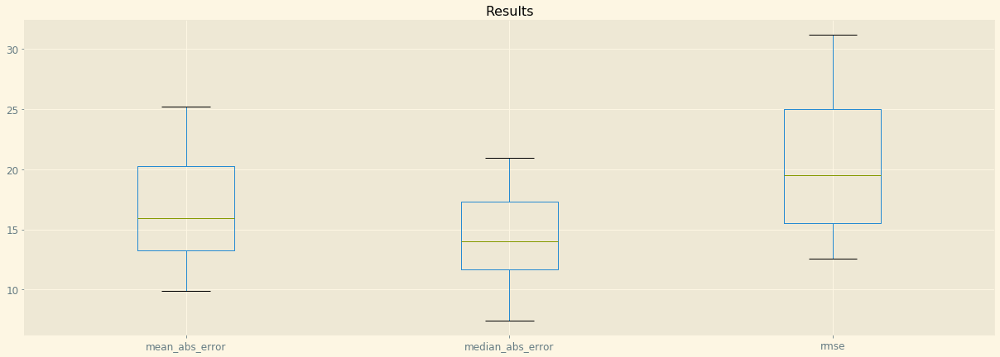

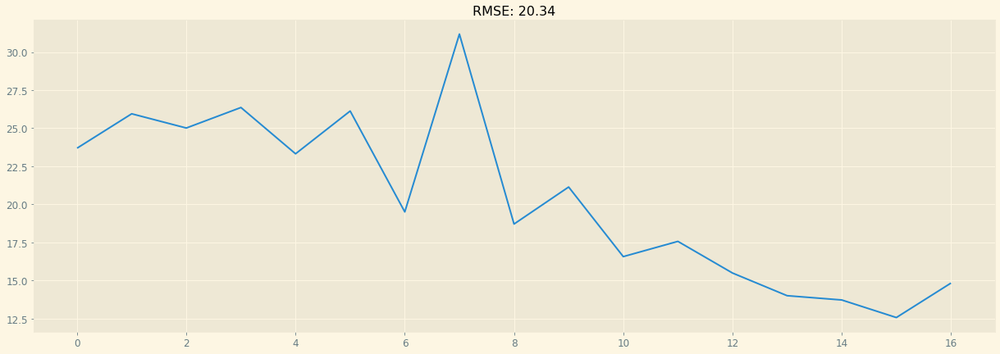

NameError: name 'plot_importance' is not defined

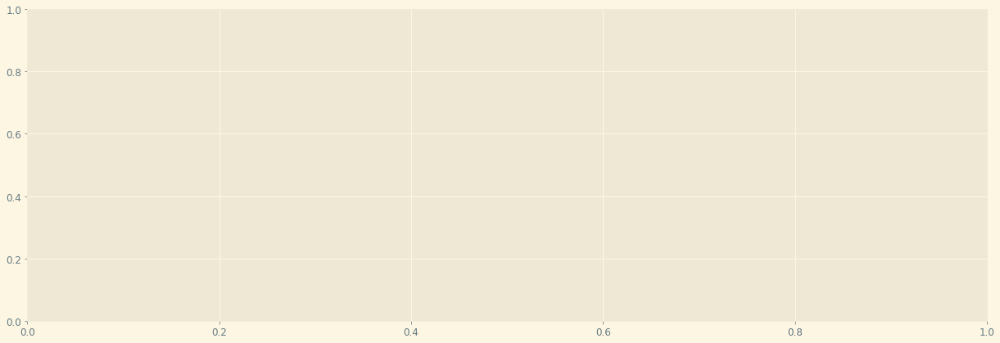

In [10]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_24 = pd.DataFrame(results_over_time)
predictions_over_time_24 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_24

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

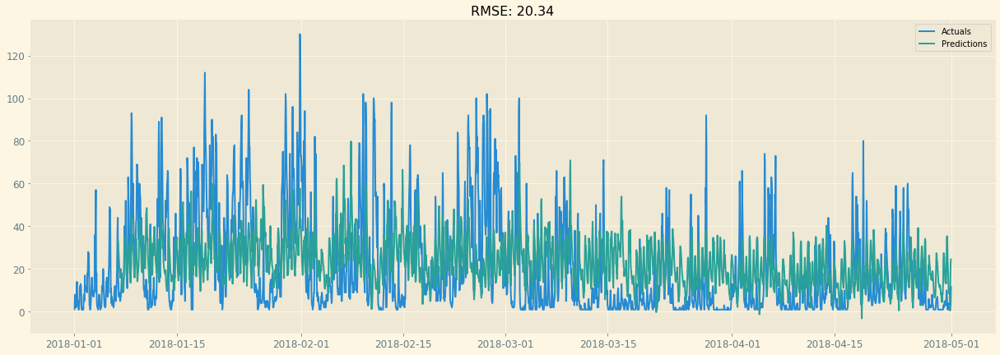

In [11]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

###  City average

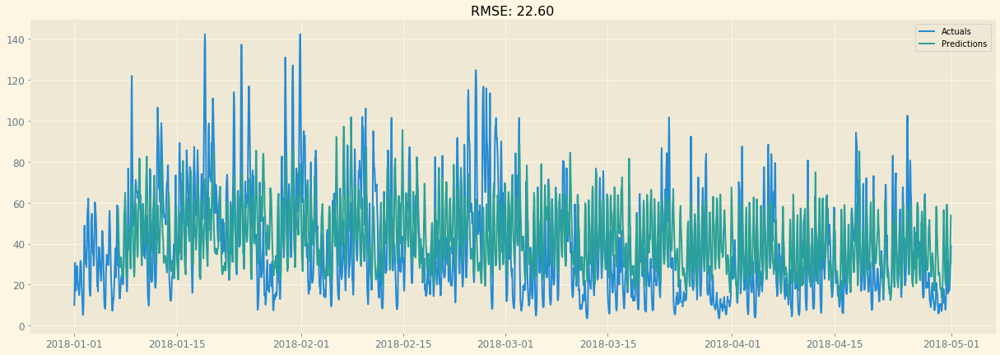

In [13]:
predictions_list =[predictions_over_time_08, predictions_over_time_18, predictions_over_time_24]
results_list = [results_over_time_08['rmse'], results_over_time_18['rmse'], results_over_time_24['rmse']]

predictions_final = pd.concat(predictions_list, axis=1).sort_index().mean(axis=1)
results_final = pd.concat(results_list, axis=1).sort_index().mean(axis=1)

target_mean = df_temp[particle_of_interest].groupby('date').mean()

fig, ax = plt.subplots(figsize=(21,7))
actuals = plt.plot(target_mean[min_train_date:], label='Actuals')
predictions = plt.plot(predictions_final, label='Predictions')
error = results_final.mean()
plt.legend(loc='best')
plt.title('RMSE: %.2f'% error)
plt.show()